In [ ]:
## XBoost regressor with grid-search

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os, sys
from collections import Counter
import re

In [30]:
import seaborn as sns
import xgboost as xgb
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import mean_absolute_error
from verstack.stratified_continuous_split import scsplit # pip install verstack

from sklearn.metrics import mean_squared_error

In [5]:
path = os.getcwd()
path_data_train = path + "\\covidChallenge\\data\\train.csv"
path_data_eval = path + "\\covidChallenge\\data\\evaluation.csv"

In [6]:
train_data = pd.read_csv(path_data_train)

In [7]:
train_data.columns

Index(['id', 'timestamp', 'retweet_count', 'user_verified',
       'user_statuses_count', 'user_followers_count', 'user_friends_count',
       'user_mentions', 'urls', 'hashtags', 'text'],
      dtype='object')

In [8]:
train_data['urls'] = train_data['text'].apply(lambda s: len(re.findall(r'http(\S)+', s)))
train_data['hashtags'] = train_data['text'].apply(lambda s: len(re.findall(r'#[a-zA-Z]+', s)))
train_data['user_mentions'] = train_data['text'].apply(lambda s: len(re.findall(r'@[a-zA-Z_]+', s)))

In [9]:
counter_user_mentions = train_data['user_mentions'].isnull().sum()
counter_urls = train_data['urls'].isnull().sum()
counter_hashtags = train_data['hashtags'].isnull().sum()    

In [10]:
print("\t User_mentions column NULL entries: ", counter_user_mentions)
print("\t Urls column column NULL entries: ", counter_urls)
print("\t Hashtags column NULL entries: ", counter_hashtags)
print("\t Number of row: ", len(train_data.index))

	 User_mentions column NULL entries:  0
	 Urls column column NULL entries:  0
	 Hashtags column NULL entries:  0
	 Number of row:  665777


In [11]:
#Non-relevant features, can not be used for LR models
train_data.drop('timestamp', axis=1, inplace=True)
train_data.drop('text', axis=1, inplace=True)
train_data.drop('id', axis=1, inplace=True)

In [12]:
train_data.columns

Index(['retweet_count', 'user_verified', 'user_statuses_count',
       'user_followers_count', 'user_friends_count', 'user_mentions', 'urls',
       'hashtags'],
      dtype='object')

In [14]:
pd.set_option('precision', 2)
print(train_data.describe())

       retweet_count  user_statuses_count  user_followers_count  \
count      665777.00             6.66e+05              6.66e+05   
mean          147.69             4.17e+04              2.33e+05   
std          2972.05             9.85e+04              2.44e+06   
min             0.00             0.00e+00              0.00e+00   
25%             0.00             2.35e+03              2.06e+02   
50%             0.00             1.08e+04              1.00e+03   
75%             2.00             3.81e+04              6.01e+03   
max        942572.00             7.20e+06              1.17e+08   

       user_friends_count  user_mentions       urls   hashtags  
count            6.66e+05      665777.00  665777.00  665777.00  
mean             2.74e+03           0.28       0.38       0.48  
std              1.73e+04           1.38       0.61       1.52  
min              0.00e+00           0.00       0.00       0.00  
25%              2.29e+02           0.00       0.00       0.00  
50%   

In [16]:
#Convert boolean variables into int (Verified/Non-verified account)
train_data = train_data.astype(int)

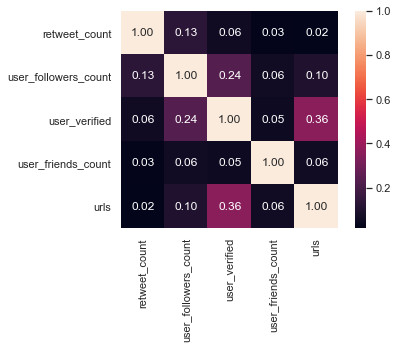

In [17]:
correlation = train_data.corr(method='pearson')
columns = correlation.nlargest(5, 'retweet_count').index

correlation_map = np.corrcoef(train_data[columns].values.T)
sns.set(font_scale=1.0)
heatmap = sns.heatmap(correlation_map, cbar=True, annot=True, square=True, fmt='.2f', yticklabels=columns.values, xticklabels=columns.values)

plt.show()

### Splitting dataset

In [56]:
# Shuffle the Dataset.
shuffled_train = train_data.sample(frac=1, random_state=4)

# Put all the samples where they dont have zeros re-tweet in a separate dataset.
non_zero_retweet = shuffled_train.loc[shuffled_train['retweet_count'] != 0]
nbr_samples = non_zero_retweet.shape[0] // 6  #We will take only sixth of it

#Randomly select samples observations from the zero re-tweet (majority class)
zero_retweet = shuffled_train.loc[shuffled_train['retweet_count'] == 0].sample(n=nbr_samples, random_state=42)

print("Shape of non_zero_retweet: ", non_zero_retweet[:nbr_samples].shape)
print("Shape of zero_retweet: ", zero_retweet.shape)

# Concatenate both dataframes again
normalized_train = pd.concat([non_zero_retweet[:nbr_samples], zero_retweet])
print("Normalized train dataset: ", normalized_train.shape)

Shape of non_zero_retweet:  (40495, 8)
Shape of zero_retweet:  (40495, 8)
Normalized train dataset:  (80990, 8)


In [57]:
from sklearn.model_selection import train_test_split
from sklearn import metrics

X_train, X_test, y_train, y_test = train_test_split(normalized_train, normalized_train["retweet_count"],
                                                    test_size=0.3, random_state = 85)
# We remove the actual number of retweets from our features since it is the value that we are trying to predict
X_train = X_train.drop(['retweet_count'], axis=1)
X_test = X_test.drop(['retweet_count'], axis=1)

In [58]:
print("\t Train dataset shape: ", X_train.shape)
print("\t Test dataset shape: ", X_test.shape)

	 Train dataset shape:  (56693, 7)
	 Test dataset shape:  (24297, 7)


### Creating Model

In [25]:
xgbr = xgb.XGBRegressor(verbosity=0)

As a start we use the default parameters for our dataset

In [27]:
xgbr

XGBRegressor(base_score=None, booster=None, colsample_bylevel=None,
             colsample_bynode=None, colsample_bytree=None, gamma=None,
             gpu_id=None, importance_type='gain', interaction_constraints=None,
             learning_rate=None, max_delta_step=None, max_depth=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             random_state=None, reg_alpha=None, reg_lambda=None,
             scale_pos_weight=None, subsample=None, tree_method=None,
             validate_parameters=None, verbosity=0)

In [28]:
xgbr.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=0)

In [29]:
score = xgbr.score(X_train, y_train)  
print("Training score: ", score)

Training score:  0.797393459583106


In [30]:
ypred = xgbr.predict(X_test)

In [34]:
print("\t Prediction error using MSE: ", mean_squared_error(y_true=y_test, y_pred=ypred))

	 Prediction error using MSE:  5117637.245269586


In [35]:
print("\t Prediction error using MAE: ", mean_absolute_error(y_true=y_test, y_pred=ypred))

	 Prediction error using MAE:  305.77006961042514


### Grid Search for Parameters

In [37]:
from sklearn.model_selection import GridSearchCV

param_grid = {

    'xgbregressor__max_depth': [5, 8, 10, 12, 15],
    'xgbregressor__n_estimators': [2000, 5000],
    'xgbregressor__colsample_bylevel' : [0.3, 0.5, 0.8],
    'xgbregressor__colsample_bynode' : [0.3, 0.5, 0.8],
    'xgbregressor__learning' : [0.1, 0.01, 0.001],
    'xgbregressor__max_leaves' : [3, 5, 10, 15, 20, 25]
}
model = xgb.XGBRegressor()
grid = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_absolute_error', verbose=10, n_jobs=2)

In [38]:
grid.fit(X_train, y_train)

Fitting 5 folds for each of 540 candidates, totalling 2700 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:   12.0s
[Parallel(n_jobs=2)]: Done   4 tasks      | elapsed:   20.0s
[Parallel(n_jobs=2)]: Done   9 tasks      | elapsed:   46.0s
[Parallel(n_jobs=2)]: Done  14 tasks      | elapsed:  1.0min
[Parallel(n_jobs=2)]: Done  21 tasks      | elapsed:  1.4min
[Parallel(n_jobs=2)]: Done  28 tasks      | elapsed:  1.6min
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:  2.0min
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  2.3min
[Parallel(n_jobs=2)]: Done  57 tasks      | elapsed:  3.1min
[Parallel(n_jobs=2)]: Done  68 tasks      | elapsed:  3.5min
[Parallel(n_jobs=2)]: Done  81 tasks      | elapsed:  4.0min
[Parallel(n_jobs=2)]: Done  94 tasks      | elapsed:  4.8min
[Parallel(n_jobs=2)]: Done 109 tasks      | elapsed:  5.6min
[Parallel(n_jobs=2)]: Done 124 tasks      | elapsed:  6.2min
[Parallel(n_jobs=2)]: Done 141 tasks      | elapsed:  7.0min
[Parallel(

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, gamma=None,
                                    gpu_id=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,
                                    n_estimators=100, n_jobs=...
                                    scale_pos_weight=None, subsample=None,
                                    tree_method=None, validate_parameters=None,
                                    verbosity=None),
             n_jobs=2,
             param_grid={'xgbregressor__colsample_bylevel': [

In [48]:
df_res = pd.DataFrame(data = grid.cv_results_)

In [49]:
df_res

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_xgbregressor__colsample_bylevel,param_xgbregressor__colsample_bynode,param_xgbregressor__max_depth,param_xgbregressor__max_leaves,param_xgbregressor__n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,7.60,1.31,0.10,1.87e-02,0.3,0.3,5,3,2000,"{'xgbregressor__colsample_bylevel': 0.3, 'xgbr...",-344.64,-360.65,-333.34,-328.2,-319.03,-337.17,14.36,1
1,8.24,0.86,0.12,1.80e-02,0.3,0.3,5,3,5000,"{'xgbregressor__colsample_bylevel': 0.3, 'xgbr...",-344.64,-360.65,-333.34,-328.2,-319.03,-337.17,14.36,1
2,7.16,0.24,0.09,2.47e-02,0.3,0.3,5,5,2000,"{'xgbregressor__colsample_bylevel': 0.3, 'xgbr...",-344.64,-360.65,-333.34,-328.2,-319.03,-337.17,14.36,1
3,5.08,0.78,0.06,4.65e-03,0.3,0.3,5,5,5000,"{'xgbregressor__colsample_bylevel': 0.3, 'xgbr...",-344.64,-360.65,-333.34,-328.2,-319.03,-337.17,14.36,1
4,4.55,0.10,0.05,1.93e-03,0.3,0.3,5,10,2000,"{'xgbregressor__colsample_bylevel': 0.3, 'xgbr...",-344.64,-360.65,-333.34,-328.2,-319.03,-337.17,14.36,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
535,4.92,0.12,0.07,7.29e-03,0.8,0.8,15,15,5000,"{'xgbregressor__colsample_bylevel': 0.8, 'xgbr...",-344.64,-360.65,-333.34,-328.2,-319.03,-337.17,14.36,1
536,4.66,0.05,0.06,4.66e-03,0.8,0.8,15,20,2000,"{'xgbregressor__colsample_bylevel': 0.8, 'xgbr...",-344.64,-360.65,-333.34,-328.2,-319.03,-337.17,14.36,1
537,4.77,0.26,0.06,1.06e-02,0.8,0.8,15,20,5000,"{'xgbregressor__colsample_bylevel': 0.8, 'xgbr...",-344.64,-360.65,-333.34,-328.2,-319.03,-337.17,14.36,1
538,4.50,0.09,0.05,4.78e-03,0.8,0.8,15,25,2000,"{'xgbregressor__colsample_bylevel': 0.8, 'xgbr...",-344.64,-360.65,-333.34,-328.2,-319.03,-337.17,14.36,1


In [51]:
from joblib import dump, load

df_res = pd.DataFrame(data = grid.cv_results_).sort_values("rank_test_score")
params = df_res.tail(1)["params"].values
print(params)
dump(grid, 'grid_search.joblib') 
df_res.to_csv("grid_search_save_results.csv", index=False)

[{'xgbregressor__colsample_bylevel': 0.8, 'xgbregressor__colsample_bynode': 0.8, 'xgbregressor__max_depth': 15, 'xgbregressor__max_leaves': 25, 'xgbregressor__n_estimators': 5000}]


In [44]:
X_train, X_test, y_train, y_test = scsplit(train_data, train_data['retweet_count'], stratify=train_data['retweet_count'], train_size=0.7, test_size=0.3)

# We remove the actual number of retweets from our features since it is the value that we are trying to predict
X_train = X_train.drop(['retweet_count'], axis=1)
X_test = X_test.drop(['retweet_count'], axis=1)

In [43]:
#Convert boolean variables into int (Verified/Non-verified account)
train_data = train_data.astype(int)

In [59]:
print("\t Train dataset shape: ", X_train.shape)
print("\t Test dataset shape: ", X_test.shape)

	 Train dataset shape:  (56693, 7)
	 Test dataset shape:  (24297, 7)


-----------------------------------------------------------------------------

In [66]:
model2 = xgb.XGBRegressor(tree_method='gpu_hist',
                                    colsample_bylevel=0.8,
                                    colsample_bynode=0.8,
                                    learning_rate=0.001,
                                    max_depth=15,
                                    max_leaves=25,
                                    n_estimators=7000,
                                    n_gpus = 1)

In [67]:
model2.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=0.8,
             colsample_bynode=0.8, colsample_bytree=1, gamma=0, gpu_id=0,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.001, max_delta_step=0, max_depth=15, max_leaves=25,
             min_child_weight=1, missing=nan,
             monotone_constraints='(0,0,0,0,0,0,0)', n_estimators=7000,
             n_gpus=1, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='gpu_hist', validate_parameters=1, verbosity=None)

In [68]:
ypred = model2.predict(X_test)

In [69]:
print("---------------- 7000 Estimators ---------------------")
print("\t Prediction error using MSE: ", mean_squared_error(y_true=y_test, y_pred=ypred))
print("\t Prediction error using MAE: ", mean_absolute_error(y_true=y_test, y_pred=ypred))

---------------- 7000 Estimators ---------------------
	 Prediction error using MSE:  3194789.127556375
	 Prediction error using MAE:  279.576670342228


In [65]:
print("---------------- 5000 Estimators ---------------------")
print("\t Prediction error using MSE: ", mean_squared_error(y_true=y_test, y_pred=ypred))
print("\t Prediction error using MAE: ", mean_absolute_error(y_true=y_test, y_pred=ypred))

	 Prediction error using MSE:  3187935.6183716785
	 Prediction error using MAE:  277.0012734968738


In [70]:
estimators_mae = {5000: "277.00127", 7000: "279.5766"}

In [73]:
from sklearn.model_selection import GridSearchCV

param_grid = {

    'xgbregressor__max_depth': [15],
    'xgbregressor__n_estimators': [5000, 6000],
    'xgbregressor__colsample_bylevel' : [0.8, 0.9],
    'xgbregressor__colsample_bynode' : [0.8, 0.9],
    'xgbregressor__learning' : [0.1, 0.01, 0.001],
    'xgbregressor__max_leaves' : [25]
}
model = xgb.XGBRegressor()
grid = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_absolute_error', verbose=10, n_jobs=2)

In [74]:
### Grid search on the sub-set
grid.fit(X_train, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:   14.4s
[Parallel(n_jobs=2)]: Done   4 tasks      | elapsed:   20.9s
[Parallel(n_jobs=2)]: Done   9 tasks      | elapsed:   40.8s
[Parallel(n_jobs=2)]: Done  14 tasks      | elapsed:   53.7s
[Parallel(n_jobs=2)]: Done  21 tasks      | elapsed:  1.4min
[Parallel(n_jobs=2)]: Done  28 tasks      | elapsed:  2.0min
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:  3.0min
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  3.7min
[Parallel(n_jobs=2)]: Done  57 tasks      | elapsed:  4.6min
[Parallel(n_jobs=2)]: Done  68 tasks      | elapsed:  5.3min
[Parallel(n_jobs=2)]: Done  81 tasks      | elapsed:  6.2min
[Parallel(n_jobs=2)]: Done  94 tasks      | elapsed:  7.1min
[Parallel(n_jobs=2)]: Done 109 tasks      | elapsed:  8.0min
[Parallel(n_jobs=2)]: Done 120 out of 120 | elapsed:  8.5min finished


GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, gamma=None,
                                    gpu_id=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,
                                    n_estimators=100, n_jobs=...
                                    tree_method=None, validate_parameters=None,
                                    verbosity=None),
             n_jobs=2,
             param_grid={'xgbregressor__colsample_bylevel': [0.8, 0.9],
                         'xgbregressor__colsample_bynode': [0.8,

In [75]:
df_res = pd.DataFrame(data = grid.cv_results_).sort_values("rank_test_score")
params = df_res.tail(1)["params"].values
print(params)

[{'xgbregressor__colsample_bylevel': 0.9, 'xgbregressor__colsample_bynode': 0.9, 'xgbregressor__learning': 0.001, 'xgbregressor__max_depth': 15, 'xgbregressor__max_leaves': 25, 'xgbregressor__n_estimators': 6000}]


In [76]:
model2 = xgb.XGBRegressor(tree_method='gpu_hist',
                                    colsample_bylevel=0.9,
                                    colsample_bynode=0.9,
                                    learning_rate=0.001,
                                    max_depth=15,
                                    max_leaves=25,
                                    n_estimators=6000,
                                    n_gpus = 1)

In [77]:
model2.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=0.9,
             colsample_bynode=0.9, colsample_bytree=1, gamma=0, gpu_id=0,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.001, max_delta_step=0, max_depth=15, max_leaves=25,
             min_child_weight=1, missing=nan,
             monotone_constraints='(0,0,0,0,0,0,0)', n_estimators=6000,
             n_gpus=1, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='gpu_hist', validate_parameters=1, verbosity=None)

In [78]:
ypred = model2.predict(X_test)

In [79]:
print("---------------- 6000 Estimators ---------------------")
print("\t Prediction error using MSE: ", mean_squared_error(y_true=y_test, y_pred=ypred))
print("\t Prediction error using MAE: ", mean_absolute_error(y_true=y_test, y_pred=ypred))

---------------- 6000 Estimators ---------------------
	 Prediction error using MSE:  3195337.408419317
	 Prediction error using MAE:  277.73201802984875


--------------------------------------------------------------------------------

### Training on the whole dataset

In [12]:
train_data = pd.read_csv(path_data_train)

In [13]:
train_data['urls'] = train_data['text'].apply(lambda s: len(re.findall(r'http(\S)+', s)))
train_data['hashtags'] = train_data['text'].apply(lambda s: len(re.findall(r'#[a-zA-Z]+', s)))
train_data['user_mentions'] = train_data['text'].apply(lambda s: len(re.findall(r'@[a-zA-Z_]+', s)))

In [14]:
#Non-relevant features, can not be used for LR models
train_data.drop('timestamp', axis=1, inplace=True)
train_data.drop('text', axis=1, inplace=True)
train_data.drop('id', axis=1, inplace=True)

In [15]:
## XGBoost is not good with categorical data.
train_data.drop('user_verified', axis=1, inplace=True)

In [16]:
train_data

,retweet_count,user_statuses_count,user_followers_count,user_friends_count,user_mentions,urls,hashtags
0,0,68460,1101,1226,0,0,0
1,0,309,51,202,0,0,0
2,0,3241,1675,2325,0,0,0
3,0,32327,667,304,0,0,0
4,0,581,42,127,0,0,0
...,...,...,...,...,...,...,...
665772,0,65355,1984,1902,0,0,0
665773,1,1807,2029,347,1,1,2
665774,8,888,85,257,5,1,1
665775,0,452,38,91,0,0,0


In [17]:
# Shuffle the Dataset.
shuffled_train = train_data.sample(frac=1, random_state=4)

# Put all the samples where they dont have zeros re-tweet in a separate dataset.
non_zero_retweet = shuffled_train.loc[shuffled_train['retweet_count'] != 0]
nbr_samples = non_zero_retweet.shape[0] // 3  #We will take only sixth of it

#Randomly select samples observations from the zero re-tweet (majority class)
zero_retweet = shuffled_train.loc[shuffled_train['retweet_count'] == 0].sample(n=nbr_samples, random_state=42)

print("Shape of non_zero_retweet: ", non_zero_retweet[:nbr_samples].shape)
print("Shape of zero_retweet: ", zero_retweet.shape)

# Concatenate both dataframes again
normalized_train = pd.concat([non_zero_retweet[:nbr_samples], zero_retweet])
print("Normalized train dataset: ", normalized_train.shape)

Shape of non_zero_retweet:  (80991, 7)
Shape of zero_retweet:  (80991, 7)
Normalized train dataset:  (161982, 7)


In [18]:
from sklearn.model_selection import train_test_split
from sklearn import metrics

X_train, X_test, y_train, y_test = train_test_split(normalized_train, normalized_train["retweet_count"],
                                                    test_size=0.3, random_state = 85)
# We remove the actual number of retweets from our features since it is the value that we are trying to predict
X_train = X_train.drop(['retweet_count'], axis=1)
X_test = X_test.drop(['retweet_count'], axis=1)

In [19]:
print("\t Train dataset shape: ", X_train.shape)
print("\t Test dataset shape: ", X_test.shape)

	 Train dataset shape:  (113387, 6)
	 Test dataset shape:  (48595, 6)


In [92]:
model3 = xgb.XGBRegressor(tree_method='gpu_hist',
                                    colsample_bylevel=0.9,
                                    colsample_bynode=0.9,
                                    learning_rate=0.001,
                                    max_depth=15,
                                    max_leaves=25,
                                    n_estimators=6000,
                                    n_gpus = 1)

In [99]:
model3.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=0.9,
             colsample_bynode=0.9, colsample_bytree=1, gamma=0, gpu_id=0,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.001, max_delta_step=0, max_depth=15, max_leaves=25,
             min_child_weight=1, missing=nan,
             monotone_constraints='(0,0,0,0,0,0)', n_estimators=6000, n_gpus=1,
             n_jobs=0, num_parallel_tree=1, random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='gpu_hist', validate_parameters=1, verbosity=None)

In [100]:
print("Score on Training data: ", model3.score(X_train, y_train))

Score on Training data:  0.10147741090476625


In [101]:
ypred = model3.predict(X_test)

In [102]:
print("\t Prediction error using MSE: ", mean_squared_error(y_true=y_test, y_pred=ypred))
print("\t Prediction error using MAE: ", mean_absolute_error(y_true=y_test, y_pred=ypred))

	 Prediction error using MSE:  26032571.08235765
	 Prediction error using MAE:  332.62906464850573


### withOut Upsampling

In [20]:
train_data = pd.read_csv(path_data_train)

In [21]:
train_data['urls'] = train_data['text'].apply(lambda s: len(re.findall(r'http(\S)+', s)))
train_data['hashtags'] = train_data['text'].apply(lambda s: len(re.findall(r'#[a-zA-Z]+', s)))
train_data['user_mentions'] = train_data['text'].apply(lambda s: len(re.findall(r'@[a-zA-Z_]+', s)))

In [22]:
#Non-relevant features, can not be used for LR models
train_data.drop('timestamp', axis=1, inplace=True)
train_data.drop('text', axis=1, inplace=True)
train_data.drop('id', axis=1, inplace=True)
train_data.drop('user_mentions', axis=1, inplace=True)
train_data.drop('urls', axis=1, inplace=True)
train_data.drop('hashtags', axis=1, inplace=True)

In [23]:
## XGBoost is not good with categorical data.
train_data.drop('user_verified', axis=1, inplace=True)

In [24]:
train_data

,retweet_count,user_statuses_count,user_followers_count,user_friends_count
0,0,68460,1101,1226
1,0,309,51,202
2,0,3241,1675,2325
3,0,32327,667,304
4,0,581,42,127
...,...,...,...,...
665772,0,65355,1984,1902
665773,1,1807,2029,347
665774,8,888,85,257
665775,0,452,38,91


In [25]:
from verstack.stratified_continuous_split import scsplit # pip install verstack

X_train, X_test, y_train, y_test = scsplit(train_data, train_data['retweet_count'], stratify=train_data['retweet_count'], train_size=0.7, test_size=0.3)

# We remove the actual number of retweets from our features since it is the value that we are trying to predict
X_train = X_train.drop(['retweet_count'], axis=1)
X_test = X_test.drop(['retweet_count'], axis=1)

In [26]:
print("\t Train dataset shape: ", X_train.shape)
print("\t Test dataset shape: ", X_test.shape)

	 Train dataset shape:  (466043, 3)
	 Test dataset shape:  (199734, 3)


In [ ]:
model4 = xgb.XGBRegressor(tree_method='gpu_hist',
                                    colsample_bylevel=0.9,
                                    colsample_bynode=0.9,
                                    learning_rate=0.001,
                                    max_depth=15,
                                    max_leaves=25,
                                    n_estimators=6000,
                                    n_gpus = 1)

In [ ]:
model4.fit(X_train, y_train)

In [135]:
print("Score on Training data: ", model4.score(X_train, y_train))

Score on Training data:  0.1713634168069763


In [136]:
ypred = model4.predict(X_test)

In [137]:
print("\t Prediction error using MSE: ", mean_squared_error(y_true=y_test, y_pred=ypred))
print("\t Prediction error using MAE: ", mean_absolute_error(y_true=y_test, y_pred=ypred))

	 Prediction error using MSE:  9042688.387019048
	 Prediction error using MAE:  225.47549184069214


### Evaluation

In [138]:
evaluation = pd.read_csv(path_data_eval)

In [139]:
evaluation['urls'] = evaluation['text'].apply(lambda s: len(re.findall(r'http(\S)+', s)))
evaluation['hashtags'] = evaluation['text'].apply(lambda s: len(re.findall(r'#[a-zA-Z]+', s)))
evaluation['user_mentions'] = evaluation['text'].apply(lambda s: len(re.findall(r'@[a-zA-Z_]+', s)))

In [140]:
#Non-relevant features, can not be used for LR models
evaluation.drop('timestamp', axis=1, inplace=True)
evaluation.drop('text', axis=1, inplace=True)

In [141]:
## XGBoost is not good with categorical data.
evaluation.drop('user_verified', axis=1, inplace=True)

In [142]:
print("\t Shape of evaluation: ", evaluation.shape)

	 Shape of evaluation:  (285334, 7)


In [143]:
withoutID = evaluation.copy()
withoutID.drop('id', axis=1, inplace=True)

In [144]:
kaggleOut  =  model4.predict(withoutID)

In [145]:
print("\t Shape of KaggleOut: ", kaggleOut.shape)

	 Shape of KaggleOut:  (285334,)


In [146]:
import csv

f = open("XGBoost_predictions.csv", "w+")
with open("XGBoost_predictions.csv", 'w') as f:
    writer = csv.writer(f)
    writer.writerow(["TweetID", "NoRetweets"])
    for index, prediction in enumerate(kaggleOut):
        print(str(evaluation['id'].iloc[index]) + " ," + str(int(prediction)))
        writer.writerow([str(evaluation['id'].iloc[index]) , str(int(prediction))])

665776 ,7
665777 ,253
665778 ,29
665779 ,323
665780 ,323
665781 ,7
665782 ,27
665783 ,170
665784 ,326
665785 ,1163
665786 ,1167
665787 ,29
665788 ,2
665789 ,511
665790 ,19
665791 ,57
665792 ,19
665793 ,17
665794 ,186
665795 ,34
665796 ,6
665797 ,82
665798 ,657
665799 ,56
665800 ,6
665801 ,25
665802 ,41
665803 ,87
665804 ,146
665805 ,-12
665806 ,97
665807 ,22
665808 ,1036
665809 ,6
665810 ,57
665811 ,90
665812 ,6
665813 ,186
665814 ,86
665815 ,7
665816 ,25
665817 ,113
665818 ,28
665819 ,8
665820 ,7
665821 ,12
665822 ,159
665823 ,77
665824 ,148
665825 ,193
665826 ,786
665827 ,61
665828 ,1310
665829 ,-31
665830 ,145
665831 ,9
665832 ,31
665833 ,17
665834 ,49
665835 ,28
665836 ,58
665837 ,7
665838 ,643
665839 ,20
665840 ,8
665841 ,77
665842 ,7
665843 ,176
665844 ,8
665845 ,6
665846 ,153
665847 ,30
665848 ,142
665849 ,147
665850 ,136
665851 ,64
665852 ,6
665853 ,32
665854 ,119
665855 ,10
665856 ,91
665857 ,7
665858 ,39
665859 ,431
665860 ,702
665861 ,125
665862 ,41
665863 ,43
665864 ,358
66

666585 ,287
666586 ,144
666587 ,2
666588 ,7
666589 ,1304
666590 ,6
666591 ,171
666592 ,127
666593 ,113
666594 ,143
666595 ,716
666596 ,137
666597 ,45
666598 ,20
666599 ,12
666600 ,13
666601 ,9
666602 ,27
666603 ,35
666604 ,413
666605 ,93
666606 ,11
666607 ,9
666608 ,17
666609 ,756
666610 ,17
666611 ,26
666612 ,-12
666613 ,327
666614 ,9
666615 ,289
666616 ,234
666617 ,1144
666618 ,-66
666619 ,73
666620 ,28
666621 ,7
666622 ,21
666623 ,13
666624 ,100
666625 ,20
666626 ,76
666627 ,67
666628 ,32
666629 ,7
666630 ,33
666631 ,67
666632 ,2598
666633 ,88
666634 ,21
666635 ,34
666636 ,999
666637 ,12
666638 ,12
666639 ,108
666640 ,44
666641 ,4
666642 ,9
666643 ,210
666644 ,55
666645 ,53
666646 ,161
666647 ,7
666648 ,49
666649 ,200
666650 ,218
666651 ,10
666652 ,126
666653 ,258
666654 ,14
666655 ,9
666656 ,23
666657 ,9
666658 ,43
666659 ,7
666660 ,656
666661 ,26
666662 ,62
666663 ,9
666664 ,6
666665 ,32
666666 ,73
666667 ,72
666668 ,13
666669 ,26
666670 ,26
666671 ,82
666672 ,148
666673 ,554
6666

667606 ,95
667607 ,8
667608 ,159
667609 ,12
667610 ,205
667611 ,345
667612 ,28
667613 ,31
667614 ,40
667615 ,148
667616 ,99
667617 ,56
667618 ,57
667619 ,107
667620 ,19
667621 ,2518
667622 ,197
667623 ,3
667624 ,31
667625 ,9
667626 ,59
667627 ,406
667628 ,27
667629 ,109
667630 ,61
667631 ,40
667632 ,11
667633 ,7
667634 ,293
667635 ,6
667636 ,155
667637 ,99
667638 ,34
667639 ,131
667640 ,8
667641 ,135
667642 ,50
667643 ,11
667644 ,193
667645 ,-29
667646 ,7
667647 ,25
667648 ,7
667649 ,136
667650 ,3
667651 ,28
667652 ,114
667653 ,30
667654 ,89
667655 ,26
667656 ,133
667657 ,15
667658 ,15
667659 ,0
667660 ,22
667661 ,20
667662 ,15
667663 ,11
667664 ,7
667665 ,14
667666 ,165
667667 ,-59
667668 ,7
667669 ,57
667670 ,323
667671 ,946
667672 ,1
667673 ,168
667674 ,7
667675 ,108
667676 ,565
667677 ,35
667678 ,27
667679 ,10
667680 ,29
667681 ,15
667682 ,37
667683 ,97
667684 ,7
667685 ,38
667686 ,26
667687 ,23
667688 ,13
667689 ,31
667690 ,449
667691 ,216
667692 ,26
667693 ,11
667694 ,6
667695 ,8

668379 ,9
668380 ,112
668381 ,30
668382 ,72
668383 ,32
668384 ,281
668385 ,45
668386 ,62
668387 ,50
668388 ,25
668389 ,13
668390 ,265
668391 ,23
668392 ,11
668393 ,32
668394 ,100
668395 ,15
668396 ,32
668397 ,17
668398 ,6
668399 ,255
668400 ,435
668401 ,419
668402 ,54
668403 ,9
668404 ,18
668405 ,194
668406 ,218
668407 ,6
668408 ,8
668409 ,13
668410 ,19
668411 ,6
668412 ,17
668413 ,2
668414 ,6
668415 ,11
668416 ,10
668417 ,7
668418 ,1
668419 ,321
668420 ,167
668421 ,329
668422 ,90
668423 ,23
668424 ,26
668425 ,184
668426 ,57
668427 ,-13
668428 ,33
668429 ,2
668430 ,98
668431 ,630
668432 ,7
668433 ,88
668434 ,35
668435 ,4
668436 ,66
668437 ,304
668438 ,106
668439 ,212
668440 ,1
668441 ,14
668442 ,350
668443 ,18
668444 ,36
668445 ,8
668446 ,104
668447 ,-5
668448 ,8
668449 ,-4
668450 ,284
668451 ,476
668452 ,293
668453 ,14
668454 ,0
668455 ,16
668456 ,65
668457 ,640
668458 ,27
668459 ,142
668460 ,20
668461 ,584
668462 ,26
668463 ,6
668464 ,8
668465 ,7
668466 ,18
668467 ,8
668468 ,100
6684

669286 ,612
669287 ,15
669288 ,6
669289 ,226
669290 ,7
669291 ,289
669292 ,7
669293 ,20
669294 ,163
669295 ,98
669296 ,601
669297 ,9
669298 ,119
669299 ,81
669300 ,152
669301 ,69
669302 ,26
669303 ,11
669304 ,104
669305 ,91
669306 ,0
669307 ,102
669308 ,31
669309 ,6
669310 ,9
669311 ,4
669312 ,450
669313 ,17
669314 ,7
669315 ,7
669316 ,33
669317 ,27
669318 ,-1
669319 ,134
669320 ,94
669321 ,210
669322 ,28
669323 ,7
669324 ,21
669325 ,-36
669326 ,9
669327 ,8
669328 ,91
669329 ,23
669330 ,6
669331 ,25
669332 ,102
669333 ,7
669334 ,15
669335 ,25
669336 ,45
669337 ,9
669338 ,19
669339 ,0
669340 ,0
669341 ,28
669342 ,1
669343 ,9
669344 ,7
669345 ,303
669346 ,29
669347 ,9
669348 ,3
669349 ,31
669350 ,36
669351 ,34
669352 ,193
669353 ,27
669354 ,400
669355 ,125
669356 ,13
669357 ,422
669358 ,41
669359 ,38
669360 ,193
669361 ,11
669362 ,23
669363 ,43
669364 ,90
669365 ,210
669366 ,17
669367 ,61
669368 ,40
669369 ,292
669370 ,117
669371 ,60
669372 ,236
669373 ,41
669374 ,126
669375 ,96
669376 ,

670300 ,133
670301 ,7
670302 ,11
670303 ,120
670304 ,20
670305 ,16
670306 ,30
670307 ,20
670308 ,-40
670309 ,24
670310 ,170
670311 ,52
670312 ,59
670313 ,224
670314 ,-8
670315 ,37
670316 ,215
670317 ,73
670318 ,198
670319 ,15
670320 ,35
670321 ,130
670322 ,212
670323 ,14
670324 ,162
670325 ,48
670326 ,239
670327 ,161
670328 ,325
670329 ,9
670330 ,20
670331 ,17
670332 ,2
670333 ,3
670334 ,7
670335 ,26
670336 ,29
670337 ,55
670338 ,11
670339 ,288
670340 ,13
670341 ,4563
670342 ,100
670343 ,105
670344 ,128
670345 ,25
670346 ,6
670347 ,34
670348 ,624
670349 ,6
670350 ,75
670351 ,815
670352 ,2
670353 ,118
670354 ,276
670355 ,144
670356 ,210
670357 ,15
670358 ,105
670359 ,136
670360 ,405
670361 ,379
670362 ,16
670363 ,23
670364 ,57
670365 ,65
670366 ,183
670367 ,86
670368 ,856
670369 ,123
670370 ,2123
670371 ,7
670372 ,14
670373 ,13
670374 ,42
670375 ,2368
670376 ,561
670377 ,154
670378 ,266
670379 ,317
670380 ,50
670381 ,24
670382 ,17
670383 ,2
670384 ,16
670385 ,57
670386 ,2
670387 ,53
670

671313 ,59
671314 ,9
671315 ,31
671316 ,64
671317 ,-9
671318 ,194
671319 ,60
671320 ,133
671321 ,31
671322 ,7
671323 ,612
671324 ,131
671325 ,6
671326 ,30
671327 ,22
671328 ,137
671329 ,13
671330 ,46
671331 ,57
671332 ,141
671333 ,8
671334 ,164
671335 ,9
671336 ,32
671337 ,9
671338 ,7
671339 ,9
671340 ,52
671341 ,26
671342 ,609
671343 ,52
671344 ,246
671345 ,20
671346 ,26
671347 ,504
671348 ,26
671349 ,1
671350 ,26
671351 ,183
671352 ,12
671353 ,260
671354 ,25
671355 ,121
671356 ,41
671357 ,9
671358 ,40
671359 ,242
671360 ,-1
671361 ,18
671362 ,269
671363 ,122
671364 ,16
671365 ,33
671366 ,134
671367 ,96
671368 ,185
671369 ,309
671370 ,20
671371 ,46
671372 ,59
671373 ,26
671374 ,16
671375 ,209
671376 ,54
671377 ,7
671378 ,9
671379 ,27
671380 ,8
671381 ,218
671382 ,7
671383 ,125
671384 ,153
671385 ,11
671386 ,57
671387 ,26
671388 ,197
671389 ,580
671390 ,263
671391 ,65
671392 ,62
671393 ,2
671394 ,12
671395 ,361
671396 ,25
671397 ,6
671398 ,45
671399 ,20
671400 ,0
671401 ,21
671402 ,39


672461 ,156
672462 ,95
672463 ,23
672464 ,307
672465 ,570
672466 ,-46
672467 ,7
672468 ,25
672469 ,104
672470 ,335
672471 ,361
672472 ,246
672473 ,37
672474 ,18
672475 ,442
672476 ,13
672477 ,13
672478 ,373
672479 ,41
672480 ,102
672481 ,194
672482 ,1
672483 ,25
672484 ,698
672485 ,71
672486 ,7
672487 ,7
672488 ,6
672489 ,1252
672490 ,121
672491 ,22
672492 ,16
672493 ,153
672494 ,7
672495 ,26
672496 ,7
672497 ,41
672498 ,20
672499 ,8
672500 ,390
672501 ,191
672502 ,8
672503 ,9
672504 ,24
672505 ,512
672506 ,37
672507 ,200
672508 ,151
672509 ,329
672510 ,164
672511 ,44
672512 ,397
672513 ,162
672514 ,14
672515 ,123
672516 ,94
672517 ,28
672518 ,7
672519 ,536
672520 ,7
672521 ,318
672522 ,0
672523 ,57
672524 ,13
672525 ,189
672526 ,203
672527 ,135
672528 ,319
672529 ,208
672530 ,11
672531 ,90
672532 ,35
672533 ,412
672534 ,33
672535 ,151
672536 ,242
672537 ,-9
672538 ,57
672539 ,51
672540 ,26
672541 ,54
672542 ,18
672543 ,223
672544 ,21
672545 ,313
672546 ,35
672547 ,143
672548 ,6
672549

673379 ,1
673380 ,332
673381 ,319
673382 ,9
673383 ,56
673384 ,15
673385 ,31
673386 ,9
673387 ,58
673388 ,44
673389 ,6
673390 ,9
673391 ,431
673392 ,29
673393 ,86
673394 ,51
673395 ,43
673396 ,-2
673397 ,252
673398 ,58
673399 ,379
673400 ,22
673401 ,7
673402 ,18
673403 ,292
673404 ,32
673405 ,106
673406 ,28
673407 ,9
673408 ,53
673409 ,124
673410 ,512
673411 ,28
673412 ,338
673413 ,22
673414 ,40
673415 ,289
673416 ,32
673417 ,29
673418 ,63
673419 ,835
673420 ,96
673421 ,57
673422 ,8
673423 ,-3
673424 ,7
673425 ,121
673426 ,55
673427 ,9
673428 ,25
673429 ,106
673430 ,239
673431 ,15
673432 ,35
673433 ,9
673434 ,71
673435 ,34
673436 ,381
673437 ,0
673438 ,16
673439 ,112
673440 ,22
673441 ,113
673442 ,65
673443 ,265
673444 ,238
673445 ,-22
673446 ,248
673447 ,26
673448 ,20
673449 ,23
673450 ,16
673451 ,7
673452 ,316
673453 ,100
673454 ,6
673455 ,7
673456 ,26
673457 ,26
673458 ,101
673459 ,173
673460 ,153
673461 ,54
673462 ,53
673463 ,118
673464 ,18
673465 ,372
673466 ,12
673467 ,26
673468 

674139 ,53
674140 ,40
674141 ,7
674142 ,13
674143 ,466
674144 ,7
674145 ,7
674146 ,92
674147 ,13
674148 ,31
674149 ,59
674150 ,14
674151 ,13
674152 ,116
674153 ,557
674154 ,833
674155 ,88
674156 ,26
674157 ,6
674158 ,11
674159 ,57
674160 ,17
674161 ,7
674162 ,50
674163 ,239
674164 ,26
674165 ,97
674166 ,27
674167 ,-7
674168 ,10
674169 ,32
674170 ,6
674171 ,48
674172 ,1914
674173 ,76
674174 ,439
674175 ,7
674176 ,55
674177 ,120
674178 ,50
674179 ,219
674180 ,143
674181 ,59
674182 ,22
674183 ,8
674184 ,458
674185 ,6
674186 ,35
674187 ,11
674188 ,283
674189 ,-6
674190 ,22
674191 ,129
674192 ,183
674193 ,293
674194 ,208
674195 ,9
674196 ,7
674197 ,71
674198 ,120
674199 ,27
674200 ,206
674201 ,43
674202 ,-37
674203 ,44
674204 ,56
674205 ,21
674206 ,32
674207 ,136
674208 ,21
674209 ,535
674210 ,118
674211 ,18
674212 ,235
674213 ,123
674214 ,573
674215 ,30
674216 ,328
674217 ,119
674218 ,29
674219 ,68
674220 ,58
674221 ,1515
674222 ,34
674223 ,-36
674224 ,-6
674225 ,208
674226 ,6
674227 ,8
67

674888 ,837
674889 ,117
674890 ,22
674891 ,278
674892 ,13
674893 ,144
674894 ,29
674895 ,1379
674896 ,324
674897 ,11
674898 ,261
674899 ,127
674900 ,26
674901 ,263
674902 ,93
674903 ,178
674904 ,458
674905 ,296
674906 ,64
674907 ,108
674908 ,7
674909 ,23
674910 ,25
674911 ,24
674912 ,93
674913 ,28
674914 ,28
674915 ,40
674916 ,35
674917 ,126
674918 ,56
674919 ,13
674920 ,278
674921 ,46
674922 ,93
674923 ,57
674924 ,25
674925 ,20
674926 ,7
674927 ,72
674928 ,188
674929 ,116
674930 ,31
674931 ,61
674932 ,9
674933 ,26
674934 ,29
674935 ,7
674936 ,9
674937 ,21
674938 ,397
674939 ,3
674940 ,223
674941 ,43
674942 ,-16
674943 ,34
674944 ,434
674945 ,0
674946 ,100
674947 ,6
674948 ,57
674949 ,441
674950 ,27
674951 ,30
674952 ,-8
674953 ,296
674954 ,30
674955 ,25
674956 ,7
674957 ,7
674958 ,279
674959 ,68
674960 ,3173
674961 ,117
674962 ,98
674963 ,142
674964 ,138
674965 ,2
674966 ,-1
674967 ,11
674968 ,7
674969 ,23
674970 ,226
674971 ,8
674972 ,11
674973 ,18
674974 ,22
674975 ,7
674976 ,8
6749

675682 ,12
675683 ,664
675684 ,33
675685 ,590
675686 ,29
675687 ,46
675688 ,20
675689 ,30
675690 ,8
675691 ,99
675692 ,16
675693 ,7
675694 ,22
675695 ,63
675696 ,184
675697 ,68
675698 ,6
675699 ,90
675700 ,9
675701 ,2
675702 ,363
675703 ,16
675704 ,9
675705 ,17
675706 ,-3
675707 ,22
675708 ,359
675709 ,2603
675710 ,503
675711 ,56
675712 ,78
675713 ,35
675714 ,9
675715 ,26
675716 ,111
675717 ,6
675718 ,7
675719 ,29
675720 ,7
675721 ,24
675722 ,15
675723 ,259
675724 ,29
675725 ,189
675726 ,311
675727 ,231
675728 ,60
675729 ,6
675730 ,1048
675731 ,7
675732 ,9
675733 ,95
675734 ,22
675735 ,0
675736 ,24
675737 ,7
675738 ,29
675739 ,106
675740 ,303
675741 ,31
675742 ,24
675743 ,33
675744 ,794
675745 ,77
675746 ,152
675747 ,100
675748 ,115
675749 ,15
675750 ,8
675751 ,20
675752 ,27
675753 ,11
675754 ,18
675755 ,68
675756 ,7
675757 ,6
675758 ,256
675759 ,9
675760 ,247
675761 ,7
675762 ,31
675763 ,463
675764 ,16
675765 ,18
675766 ,10
675767 ,267
675768 ,221
675769 ,106
675770 ,24
675771 ,9
6757

676488 ,247
676489 ,175
676490 ,7
676491 ,252
676492 ,53
676493 ,21
676494 ,5
676495 ,13
676496 ,57
676497 ,449
676498 ,27
676499 ,443
676500 ,10
676501 ,19
676502 ,9
676503 ,7
676504 ,18
676505 ,367
676506 ,3
676507 ,-35
676508 ,34
676509 ,4
676510 ,49
676511 ,33
676512 ,22
676513 ,222
676514 ,12
676515 ,117
676516 ,51
676517 ,7
676518 ,1504
676519 ,11
676520 ,64
676521 ,16
676522 ,246
676523 ,380
676524 ,103
676525 ,41
676526 ,823
676527 ,81
676528 ,294
676529 ,-16
676530 ,6
676531 ,61
676532 ,8
676533 ,545
676534 ,163
676535 ,4
676536 ,67
676537 ,41
676538 ,322
676539 ,39
676540 ,199
676541 ,53
676542 ,323
676543 ,64
676544 ,12
676545 ,6
676546 ,27
676547 ,107
676548 ,97
676549 ,66
676550 ,6
676551 ,57
676552 ,29
676553 ,228
676554 ,312
676555 ,8
676556 ,101
676557 ,940
676558 ,134
676559 ,172
676560 ,173
676561 ,6
676562 ,2
676563 ,39
676564 ,21
676565 ,135
676566 ,26
676567 ,50
676568 ,13
676569 ,7
676570 ,8
676571 ,226
676572 ,8
676573 ,52
676574 ,7
676575 ,-17
676576 ,9
676577 ,

677269 ,7
677270 ,-27
677271 ,743
677272 ,154
677273 ,262
677274 ,215
677275 ,10
677276 ,12
677277 ,42
677278 ,113
677279 ,-9
677280 ,8
677281 ,20
677282 ,1248
677283 ,7
677284 ,61
677285 ,9
677286 ,179
677287 ,21
677288 ,27
677289 ,7
677290 ,479
677291 ,-6
677292 ,24
677293 ,28
677294 ,13
677295 ,77
677296 ,41
677297 ,11
677298 ,40
677299 ,24
677300 ,52
677301 ,52
677302 ,48
677303 ,23
677304 ,59
677305 ,160
677306 ,27
677307 ,28
677308 ,59
677309 ,263
677310 ,55
677311 ,29
677312 ,292
677313 ,22
677314 ,74
677315 ,130
677316 ,11
677317 ,7
677318 ,7
677319 ,212
677320 ,174
677321 ,6
677322 ,13
677323 ,6
677324 ,-26
677325 ,150
677326 ,377
677327 ,41
677328 ,155
677329 ,140
677330 ,18
677331 ,17
677332 ,52
677333 ,72
677334 ,6
677335 ,23
677336 ,51
677337 ,176
677338 ,80
677339 ,2
677340 ,60
677341 ,117
677342 ,73
677343 ,1470
677344 ,232
677345 ,21
677346 ,11
677347 ,13
677348 ,321
677349 ,113
677350 ,183
677351 ,37
677352 ,471
677353 ,20
677354 ,31
677355 ,128
677356 ,12
677357 ,56
6

678462 ,26
678463 ,13
678464 ,8
678465 ,18
678466 ,16
678467 ,9
678468 ,54
678469 ,69
678470 ,20
678471 ,172
678472 ,14
678473 ,276
678474 ,844
678475 ,25
678476 ,8
678477 ,45
678478 ,677
678479 ,443
678480 ,586
678481 ,0
678482 ,125
678483 ,313
678484 ,13
678485 ,214
678486 ,8
678487 ,9
678488 ,24
678489 ,110
678490 ,7
678491 ,12
678492 ,13
678493 ,9
678494 ,63
678495 ,561
678496 ,43
678497 ,27
678498 ,33
678499 ,51
678500 ,992
678501 ,6
678502 ,23
678503 ,7
678504 ,86
678505 ,9
678506 ,-19
678507 ,64
678508 ,37
678509 ,881
678510 ,27
678511 ,1147
678512 ,102
678513 ,8
678514 ,-40
678515 ,37
678516 ,7
678517 ,209
678518 ,24
678519 ,52
678520 ,25
678521 ,11
678522 ,-1
678523 ,547
678524 ,363
678525 ,19
678526 ,1
678527 ,12
678528 ,402
678529 ,14
678530 ,8
678531 ,1
678532 ,340
678533 ,7
678534 ,665
678535 ,193
678536 ,7
678537 ,538
678538 ,6
678539 ,14
678540 ,25
678541 ,344
678542 ,14
678543 ,113
678544 ,286
678545 ,26
678546 ,76
678547 ,11
678548 ,448
678549 ,281
678550 ,7
678551 ,8


679403 ,34
679404 ,194
679405 ,632
679406 ,1
679407 ,29
679408 ,7
679409 ,27
679410 ,52
679411 ,18
679412 ,7
679413 ,129
679414 ,52
679415 ,222
679416 ,27
679417 ,46
679418 ,509
679419 ,19
679420 ,0
679421 ,8
679422 ,101
679423 ,15
679424 ,511
679425 ,25
679426 ,0
679427 ,51
679428 ,2025
679429 ,144
679430 ,27
679431 ,50
679432 ,9
679433 ,20
679434 ,143
679435 ,18
679436 ,16
679437 ,154
679438 ,125
679439 ,15
679440 ,131
679441 ,155
679442 ,7
679443 ,124
679444 ,-1
679445 ,88
679446 ,6
679447 ,9
679448 ,6
679449 ,45
679450 ,48
679451 ,0
679452 ,580
679453 ,-4
679454 ,10
679455 ,91
679456 ,9
679457 ,34
679458 ,92
679459 ,49
679460 ,73
679461 ,149
679462 ,313
679463 ,141
679464 ,9
679465 ,29
679466 ,32
679467 ,181
679468 ,147
679469 ,23
679470 ,50
679471 ,14
679472 ,322
679473 ,74
679474 ,401
679475 ,385
679476 ,61
679477 ,49
679478 ,2740
679479 ,217
679480 ,129
679481 ,26
679482 ,23
679483 ,631
679484 ,2
679485 ,14
679486 ,8
679487 ,634
679488 ,31
679489 ,44
679490 ,50
679491 ,821
67949

680321 ,27
680322 ,26
680323 ,1450
680324 ,32
680325 ,54
680326 ,1124
680327 ,22
680328 ,71
680329 ,24
680330 ,97
680331 ,17
680332 ,16
680333 ,45
680334 ,91
680335 ,611
680336 ,28
680337 ,180
680338 ,21
680339 ,24
680340 ,1188
680341 ,70
680342 ,66
680343 ,13
680344 ,-24
680345 ,54
680346 ,30
680347 ,7
680348 ,98
680349 ,7
680350 ,88
680351 ,4
680352 ,435
680353 ,9
680354 ,9
680355 ,83
680356 ,43
680357 ,27
680358 ,-1
680359 ,20
680360 ,57
680361 ,26
680362 ,44
680363 ,36
680364 ,149
680365 ,7
680366 ,122
680367 ,505
680368 ,52
680369 ,16
680370 ,28
680371 ,14
680372 ,0
680373 ,23
680374 ,7
680375 ,11
680376 ,475
680377 ,119
680378 ,26
680379 ,7
680380 ,103
680381 ,26
680382 ,1348
680383 ,9
680384 ,267
680385 ,23
680386 ,-49
680387 ,536
680388 ,375
680389 ,28
680390 ,55
680391 ,-1
680392 ,165
680393 ,35
680394 ,58
680395 ,7
680396 ,147
680397 ,254
680398 ,100
680399 ,7
680400 ,15
680401 ,2485
680402 ,16
680403 ,-29
680404 ,110
680405 ,27
680406 ,59
680407 ,59
680408 ,9
680409 ,254
680

681362 ,126
681363 ,29
681364 ,24
681365 ,452
681366 ,27
681367 ,37
681368 ,414
681369 ,35
681370 ,141
681371 ,54
681372 ,118
681373 ,10
681374 ,466
681375 ,178
681376 ,145
681377 ,93
681378 ,101
681379 ,11
681380 ,44
681381 ,26
681382 ,61
681383 ,7
681384 ,2
681385 ,7
681386 ,187
681387 ,44
681388 ,17
681389 ,504
681390 ,71
681391 ,287
681392 ,152
681393 ,54
681394 ,199
681395 ,280
681396 ,162
681397 ,101
681398 ,282
681399 ,5
681400 ,18
681401 ,106
681402 ,100
681403 ,139
681404 ,861
681405 ,6
681406 ,6
681407 ,517
681408 ,85
681409 ,51
681410 ,101
681411 ,9
681412 ,59
681413 ,3
681414 ,-5
681415 ,29
681416 ,121
681417 ,78
681418 ,494
681419 ,25
681420 ,152
681421 ,27
681422 ,28
681423 ,266
681424 ,281
681425 ,17
681426 ,9
681427 ,94
681428 ,21
681429 ,48
681430 ,756
681431 ,4
681432 ,7
681433 ,14
681434 ,7
681435 ,411
681436 ,7
681437 ,150
681438 ,214
681439 ,35
681440 ,264
681441 ,18
681442 ,1
681443 ,7
681444 ,74
681445 ,70
681446 ,0
681447 ,41
681448 ,261
681449 ,153
681450 ,497


682212 ,1
682213 ,262
682214 ,17
682215 ,6
682216 ,175
682217 ,72
682218 ,73
682219 ,33
682220 ,129
682221 ,299
682222 ,53
682223 ,11
682224 ,538
682225 ,1135
682226 ,386
682227 ,27
682228 ,445
682229 ,100
682230 ,7
682231 ,22
682232 ,26
682233 ,27
682234 ,19
682235 ,51
682236 ,7
682237 ,286
682238 ,19
682239 ,135
682240 ,0
682241 ,71
682242 ,991
682243 ,-1
682244 ,14
682245 ,448
682246 ,9
682247 ,28
682248 ,19
682249 ,9
682250 ,416
682251 ,50
682252 ,210
682253 ,1
682254 ,36
682255 ,9
682256 ,33
682257 ,32
682258 ,622
682259 ,18624
682260 ,53
682261 ,265
682262 ,13
682263 ,44
682264 ,7
682265 ,6
682266 ,17
682267 ,27
682268 ,3
682269 ,33
682270 ,28
682271 ,6
682272 ,256
682273 ,44
682274 ,13
682275 ,251
682276 ,856
682277 ,216
682278 ,468
682279 ,68
682280 ,153
682281 ,57
682282 ,1133
682283 ,196
682284 ,17
682285 ,455
682286 ,159
682287 ,214
682288 ,9
682289 ,33
682290 ,-5
682291 ,310
682292 ,98
682293 ,7
682294 ,24
682295 ,0
682296 ,174
682297 ,749
682298 ,20
682299 ,60
682300 ,13
6

683196 ,71
683197 ,19
683198 ,86
683199 ,6
683200 ,51
683201 ,28
683202 ,96
683203 ,97
683204 ,26
683205 ,-35
683206 ,24
683207 ,478
683208 ,25
683209 ,169
683210 ,14
683211 ,276
683212 ,7
683213 ,6
683214 ,1235
683215 ,536
683216 ,2412
683217 ,196
683218 ,7
683219 ,7
683220 ,53
683221 ,30
683222 ,146
683223 ,12
683224 ,2
683225 ,-2
683226 ,9
683227 ,91
683228 ,28
683229 ,50
683230 ,56
683231 ,106
683232 ,1068
683233 ,28
683234 ,7
683235 ,6
683236 ,-12
683237 ,164
683238 ,107
683239 ,9
683240 ,250
683241 ,17
683242 ,446
683243 ,581
683244 ,121
683245 ,63
683246 ,26
683247 ,443
683248 ,59
683249 ,8
683250 ,89
683251 ,9
683252 ,14
683253 ,13
683254 ,7
683255 ,860
683256 ,59
683257 ,23
683258 ,72
683259 ,442
683260 ,17
683261 ,11
683262 ,9
683263 ,13
683264 ,-27
683265 ,10
683266 ,271
683267 ,98
683268 ,26
683269 ,12
683270 ,119
683271 ,7
683272 ,7
683273 ,35
683274 ,11
683275 ,23
683276 ,148
683277 ,24
683278 ,163
683279 ,62
683280 ,135
683281 ,76
683282 ,216
683283 ,7
683284 ,7
683285 ,

684074 ,164
684075 ,-12
684076 ,-23
684077 ,26
684078 ,18
684079 ,31
684080 ,35
684081 ,29
684082 ,10
684083 ,411
684084 ,1
684085 ,10
684086 ,51
684087 ,149
684088 ,30
684089 ,340
684090 ,9
684091 ,138
684092 ,7
684093 ,3601
684094 ,43
684095 ,170
684096 ,7
684097 ,454
684098 ,110
684099 ,27
684100 ,525
684101 ,71
684102 ,98
684103 ,26
684104 ,132
684105 ,133
684106 ,179
684107 ,2
684108 ,134
684109 ,56
684110 ,45
684111 ,183
684112 ,19
684113 ,221
684114 ,26
684115 ,11
684116 ,6
684117 ,13
684118 ,215
684119 ,553
684120 ,44
684121 ,31
684122 ,9
684123 ,317
684124 ,19
684125 ,17
684126 ,27
684127 ,7465
684128 ,-37
684129 ,524
684130 ,18
684131 ,91
684132 ,94
684133 ,259
684134 ,21
684135 ,56
684136 ,234
684137 ,92
684138 ,41
684139 ,135
684140 ,31
684141 ,8
684142 ,64
684143 ,109
684144 ,118
684145 ,82
684146 ,0
684147 ,61
684148 ,134
684149 ,27
684150 ,348
684151 ,26
684152 ,175
684153 ,60
684154 ,9
684155 ,9
684156 ,-19
684157 ,386
684158 ,326
684159 ,131
684160 ,136
684161 ,7
68416

685303 ,7
685304 ,31
685305 ,13
685306 ,264
685307 ,57
685308 ,-16
685309 ,18
685310 ,634
685311 ,68
685312 ,59
685313 ,53
685314 ,142
685315 ,76
685316 ,26
685317 ,93
685318 ,138
685319 ,52
685320 ,11
685321 ,17
685322 ,9
685323 ,7
685324 ,13
685325 ,28
685326 ,6
685327 ,92
685328 ,28
685329 ,-1
685330 ,38
685331 ,53
685332 ,471
685333 ,131
685334 ,12
685335 ,24
685336 ,101
685337 ,14
685338 ,20
685339 ,20
685340 ,129
685341 ,44
685342 ,54
685343 ,31
685344 ,48
685345 ,6
685346 ,100
685347 ,33
685348 ,53
685349 ,68
685350 ,166
685351 ,24
685352 ,9
685353 ,6
685354 ,20
685355 ,20
685356 ,54
685357 ,108
685358 ,31
685359 ,97
685360 ,7
685361 ,-8
685362 ,11
685363 ,68
685364 ,136
685365 ,35
685366 ,336
685367 ,31
685368 ,6
685369 ,19
685370 ,2
685371 ,11
685372 ,707
685373 ,1237
685374 ,963
685375 ,34
685376 ,103
685377 ,426
685378 ,27
685379 ,266
685380 ,368
685381 ,28
685382 ,109
685383 ,66
685384 ,374
685385 ,216
685386 ,1
685387 ,16
685388 ,8
685389 ,385
685390 ,13
685391 ,992
685392

686112 ,30
686113 ,46
686114 ,56
686115 ,6
686116 ,252
686117 ,-6
686118 ,44
686119 ,346
686120 ,263
686121 ,535
686122 ,-19
686123 ,24
686124 ,8
686125 ,7
686126 ,310
686127 ,66
686128 ,3
686129 ,22
686130 ,996
686131 ,9
686132 ,99
686133 ,270
686134 ,7
686135 ,10
686136 ,0
686137 ,142
686138 ,99
686139 ,5
686140 ,273
686141 ,75
686142 ,53
686143 ,27
686144 ,32
686145 ,609
686146 ,-7
686147 ,113
686148 ,-27
686149 ,26
686150 ,267
686151 ,148
686152 ,125
686153 ,-8
686154 ,9
686155 ,637
686156 ,6
686157 ,146
686158 ,177
686159 ,43
686160 ,15
686161 ,143
686162 ,26
686163 ,21
686164 ,35
686165 ,265
686166 ,23
686167 ,40
686168 ,40
686169 ,14
686170 ,123
686171 ,169
686172 ,-4
686173 ,254
686174 ,6
686175 ,115
686176 ,9
686177 ,219
686178 ,390
686179 ,165
686180 ,54
686181 ,26
686182 ,128
686183 ,7
686184 ,7
686185 ,26
686186 ,50
686187 ,197
686188 ,275
686189 ,347
686190 ,9
686191 ,70
686192 ,-1
686193 ,129
686194 ,154
686195 ,12
686196 ,255
686197 ,50
686198 ,182
686199 ,802
686200 ,17

686982 ,270
686983 ,213
686984 ,57
686985 ,127
686986 ,4
686987 ,6
686988 ,26
686989 ,18
686990 ,337
686991 ,4
686992 ,38
686993 ,24
686994 ,12
686995 ,19
686996 ,56
686997 ,22
686998 ,29
686999 ,6
687000 ,162
687001 ,25
687002 ,29
687003 ,23
687004 ,8
687005 ,261
687006 ,222
687007 ,70
687008 ,70
687009 ,7
687010 ,-9
687011 ,170
687012 ,275
687013 ,29
687014 ,135
687015 ,120
687016 ,169
687017 ,53
687018 ,189
687019 ,64
687020 ,12
687021 ,7
687022 ,52
687023 ,368
687024 ,2
687025 ,93
687026 ,27
687027 ,537
687028 ,3339
687029 ,99
687030 ,172
687031 ,42
687032 ,137
687033 ,8
687034 ,249
687035 ,24
687036 ,9
687037 ,12
687038 ,19
687039 ,75
687040 ,105
687041 ,11
687042 ,59
687043 ,199
687044 ,27
687045 ,60
687046 ,0
687047 ,467
687048 ,163
687049 ,7
687050 ,5
687051 ,14
687052 ,-5
687053 ,143
687054 ,9
687055 ,27
687056 ,20
687057 ,21
687058 ,8
687059 ,56
687060 ,6
687061 ,6
687062 ,-8
687063 ,19
687064 ,16
687065 ,22
687066 ,41
687067 ,9
687068 ,147
687069 ,7
687070 ,9
687071 ,-19
687

688155 ,44
688156 ,141
688157 ,35
688158 ,6
688159 ,7
688160 ,442
688161 ,100
688162 ,18
688163 ,57
688164 ,11
688165 ,99
688166 ,0
688167 ,336
688168 ,23
688169 ,541
688170 ,31
688171 ,10
688172 ,5
688173 ,570
688174 ,78
688175 ,-5
688176 ,45
688177 ,32
688178 ,9
688179 ,8
688180 ,608
688181 ,64
688182 ,121
688183 ,670
688184 ,71
688185 ,27
688186 ,336
688187 ,17
688188 ,23
688189 ,18
688190 ,9
688191 ,160
688192 ,212
688193 ,25
688194 ,372
688195 ,141
688196 ,158
688197 ,134
688198 ,-23
688199 ,483
688200 ,202
688201 ,84
688202 ,-8
688203 ,1196
688204 ,56
688205 ,2
688206 ,104
688207 ,184
688208 ,7
688209 ,7
688210 ,27
688211 ,22
688212 ,221
688213 ,56
688214 ,14
688215 ,673
688216 ,13
688217 ,7618
688218 ,244
688219 ,206
688220 ,27
688221 ,15
688222 ,464
688223 ,10
688224 ,28
688225 ,31
688226 ,32
688227 ,329
688228 ,24
688229 ,32
688230 ,8
688231 ,43
688232 ,-2
688233 ,33
688234 ,12
688235 ,21
688236 ,-55
688237 ,221
688238 ,212
688239 ,68
688240 ,-8
688241 ,21
688242 ,7
688243 ,48

688971 ,9
688972 ,19
688973 ,15
688974 ,26
688975 ,457
688976 ,176
688977 ,33
688978 ,126
688979 ,304
688980 ,97
688981 ,26
688982 ,106
688983 ,11
688984 ,141
688985 ,34
688986 ,9
688987 ,9
688988 ,87
688989 ,91
688990 ,225
688991 ,23
688992 ,22
688993 ,2240
688994 ,7
688995 ,17
688996 ,14
688997 ,326
688998 ,0
688999 ,60
689000 ,6
689001 ,8
689002 ,220
689003 ,141
689004 ,127
689005 ,14
689006 ,242
689007 ,9
689008 ,9
689009 ,35
689010 ,18
689011 ,453
689012 ,294
689013 ,74
689014 ,54
689015 ,99
689016 ,12
689017 ,18
689018 ,153
689019 ,50
689020 ,7
689021 ,984
689022 ,7
689023 ,42
689024 ,8
689025 ,31
689026 ,23
689027 ,2370
689028 ,20
689029 ,9
689030 ,8
689031 ,86
689032 ,52
689033 ,31
689034 ,10
689035 ,3
689036 ,23
689037 ,9
689038 ,57
689039 ,73
689040 ,43
689041 ,25
689042 ,21
689043 ,8
689044 ,17
689045 ,244
689046 ,243
689047 ,1
689048 ,121
689049 ,56
689050 ,131
689051 ,56
689052 ,141
689053 ,13
689054 ,2
689055 ,23719
689056 ,16
689057 ,134
689058 ,54
689059 ,263
689060 ,30

690085 ,483
690086 ,6
690087 ,43
690088 ,6
690089 ,122
690090 ,241
690091 ,2
690092 ,-38
690093 ,100
690094 ,11
690095 ,4
690096 ,14
690097 ,655
690098 ,231
690099 ,82
690100 ,168
690101 ,80
690102 ,7
690103 ,111
690104 ,27
690105 ,6
690106 ,21
690107 ,829
690108 ,22
690109 ,-13
690110 ,44
690111 ,7
690112 ,12
690113 ,31
690114 ,28
690115 ,16
690116 ,15
690117 ,65
690118 ,66
690119 ,17
690120 ,7
690121 ,12
690122 ,14
690123 ,29
690124 ,125
690125 ,8
690126 ,31
690127 ,98
690128 ,9
690129 ,7
690130 ,10
690131 ,68
690132 ,27
690133 ,134
690134 ,57
690135 ,27
690136 ,9
690137 ,22
690138 ,-3
690139 ,907
690140 ,133
690141 ,5
690142 ,450
690143 ,8
690144 ,0
690145 ,956
690146 ,96
690147 ,168
690148 ,7
690149 ,15
690150 ,304
690151 ,750
690152 ,427
690153 ,23
690154 ,29
690155 ,513
690156 ,29
690157 ,43
690158 ,469
690159 ,155
690160 ,6
690161 ,27
690162 ,6
690163 ,11
690164 ,21
690165 ,422
690166 ,29
690167 ,0
690168 ,260
690169 ,115
690170 ,442
690171 ,100
690172 ,-34
690173 ,13
690174 ,28

690844 ,6
690845 ,312
690846 ,617
690847 ,-29
690848 ,22
690849 ,26
690850 ,26
690851 ,213
690852 ,99
690853 ,32
690854 ,121
690855 ,32
690856 ,80
690857 ,7
690858 ,42
690859 ,460
690860 ,411
690861 ,229
690862 ,141
690863 ,6
690864 ,4
690865 ,58
690866 ,30
690867 ,1377
690868 ,55
690869 ,27
690870 ,8
690871 ,164
690872 ,14
690873 ,15
690874 ,18
690875 ,7
690876 ,193
690877 ,263
690878 ,7
690879 ,11
690880 ,8
690881 ,36
690882 ,31
690883 ,16
690884 ,21
690885 ,16
690886 ,41
690887 ,16
690888 ,25
690889 ,125
690890 ,8
690891 ,32
690892 ,2
690893 ,-17
690894 ,441
690895 ,595
690896 ,178
690897 ,55
690898 ,6
690899 ,1555
690900 ,18
690901 ,4399
690902 ,29
690903 ,20
690904 ,368
690905 ,101
690906 ,2
690907 ,110
690908 ,29
690909 ,9
690910 ,611
690911 ,224
690912 ,25
690913 ,16
690914 ,114
690915 ,125
690916 ,27
690917 ,7
690918 ,216
690919 ,4
690920 ,50
690921 ,52
690922 ,0
690923 ,9
690924 ,3
690925 ,330
690926 ,7
690927 ,643
690928 ,26
690929 ,46
690930 ,13
690931 ,57
690932 ,326
690933

692021 ,-16
692022 ,8
692023 ,32
692024 ,223
692025 ,-17
692026 ,188
692027 ,163
692028 ,509
692029 ,7
692030 ,7
692031 ,91
692032 ,96
692033 ,4
692034 ,33
692035 ,50
692036 ,112
692037 ,7
692038 ,16
692039 ,84
692040 ,28
692041 ,169
692042 ,15
692043 ,18
692044 ,20
692045 ,230
692046 ,15
692047 ,194
692048 ,116
692049 ,31
692050 ,176
692051 ,633
692052 ,151
692053 ,278
692054 ,26
692055 ,111
692056 ,45
692057 ,93
692058 ,64
692059 ,16
692060 ,33
692061 ,4972
692062 ,75
692063 ,25
692064 ,7
692065 ,131
692066 ,10
692067 ,35
692068 ,26
692069 ,7
692070 ,17
692071 ,200
692072 ,28
692073 ,28
692074 ,333
692075 ,71
692076 ,7
692077 ,9
692078 ,31
692079 ,32
692080 ,147
692081 ,124
692082 ,169
692083 ,4
692084 ,199
692085 ,17
692086 ,158
692087 ,61
692088 ,31
692089 ,3450
692090 ,353
692091 ,1
692092 ,182
692093 ,65
692094 ,584
692095 ,442
692096 ,29
692097 ,65
692098 ,11
692099 ,26
692100 ,7
692101 ,403
692102 ,160
692103 ,119
692104 ,18
692105 ,45
692106 ,246
692107 ,204
692108 ,0
692109 ,

692868 ,946
692869 ,32
692870 ,43
692871 ,63
692872 ,14
692873 ,30
692874 ,6
692875 ,11
692876 ,-58
692877 ,120
692878 ,91
692879 ,159
692880 ,52
692881 ,7
692882 ,956
692883 ,26
692884 ,195
692885 ,28
692886 ,-18
692887 ,88
692888 ,7
692889 ,8
692890 ,1692
692891 ,15
692892 ,9
692893 ,2715
692894 ,7
692895 ,137
692896 ,143
692897 ,279
692898 ,481
692899 ,83
692900 ,16
692901 ,71
692902 ,111
692903 ,27
692904 ,199
692905 ,169
692906 ,60
692907 ,15
692908 ,6
692909 ,93
692910 ,8
692911 ,26
692912 ,47
692913 ,10
692914 ,21
692915 ,7
692916 ,37
692917 ,-12
692918 ,30
692919 ,32
692920 ,8
692921 ,100
692922 ,14
692923 ,16
692924 ,17
692925 ,30
692926 ,27
692927 ,103
692928 ,48
692929 ,14
692930 ,6
692931 ,26
692932 ,10
692933 ,29
692934 ,145
692935 ,427
692936 ,26
692937 ,26
692938 ,2
692939 ,6
692940 ,7
692941 ,176
692942 ,7
692943 ,145
692944 ,-1
692945 ,29
692946 ,53
692947 ,153
692948 ,270
692949 ,1
692950 ,80
692951 ,18
692952 ,135
692953 ,98
692954 ,335
692955 ,22
692956 ,11
692957 ,

693646 ,75
693647 ,3
693648 ,50
693649 ,6
693650 ,214
693651 ,118
693652 ,14
693653 ,26
693654 ,130
693655 ,770
693656 ,14
693657 ,9
693658 ,289
693659 ,41
693660 ,9
693661 ,28
693662 ,9
693663 ,131
693664 ,125
693665 ,149
693666 ,31
693667 ,5
693668 ,52
693669 ,11
693670 ,6
693671 ,58
693672 ,902
693673 ,27
693674 ,58
693675 ,6
693676 ,322
693677 ,899
693678 ,35
693679 ,65
693680 ,19
693681 ,135
693682 ,37
693683 ,124
693684 ,9
693685 ,415
693686 ,105
693687 ,218
693688 ,133
693689 ,75
693690 ,171
693691 ,151
693692 ,221
693693 ,32
693694 ,8
693695 ,6
693696 ,111
693697 ,57
693698 ,29
693699 ,22
693700 ,67
693701 ,12
693702 ,118
693703 ,7
693704 ,1634
693705 ,30
693706 ,7
693707 ,189
693708 ,345
693709 ,22
693710 ,191
693711 ,249
693712 ,6
693713 ,45
693714 ,19
693715 ,56
693716 ,100
693717 ,46
693718 ,22
693719 ,96
693720 ,438
693721 ,29
693722 ,50
693723 ,157
693724 ,43
693725 ,26
693726 ,96
693727 ,27
693728 ,49
693729 ,240
693730 ,346
693731 ,7
693732 ,14
693733 ,-20
693734 ,125
6

694391 ,8
694392 ,487
694393 ,75
694394 ,7
694395 ,16
694396 ,8
694397 ,13
694398 ,69
694399 ,18
694400 ,51
694401 ,43
694402 ,29
694403 ,248
694404 ,9
694405 ,1
694406 ,43
694407 ,7
694408 ,1442
694409 ,517
694410 ,7
694411 ,30
694412 ,6
694413 ,133
694414 ,131
694415 ,291
694416 ,35
694417 ,27
694418 ,88
694419 ,19
694420 ,49
694421 ,19
694422 ,27
694423 ,17
694424 ,7
694425 ,21
694426 ,4
694427 ,25
694428 ,-10
694429 ,609
694430 ,10
694431 ,191
694432 ,9
694433 ,9
694434 ,418
694435 ,820
694436 ,71
694437 ,85
694438 ,9
694439 ,55
694440 ,31
694441 ,9
694442 ,261
694443 ,62
694444 ,117
694445 ,192
694446 ,176
694447 ,159
694448 ,212
694449 ,22
694450 ,28
694451 ,2
694452 ,103
694453 ,26
694454 ,212
694455 ,330
694456 ,17
694457 ,13
694458 ,186
694459 ,32
694460 ,8
694461 ,273
694462 ,20
694463 ,6
694464 ,184
694465 ,10
694466 ,29
694467 ,53
694468 ,343
694469 ,13
694470 ,50
694471 ,115
694472 ,31
694473 ,179
694474 ,-12
694475 ,9
694476 ,168
694477 ,156
694478 ,54
694479 ,54
694480 ,

695401 ,154
695402 ,29
695403 ,31
695404 ,32
695405 ,28
695406 ,-13
695407 ,26
695408 ,11
695409 ,26
695410 ,767
695411 ,108
695412 ,213
695413 ,12
695414 ,13
695415 ,406
695416 ,71
695417 ,7
695418 ,8
695419 ,221
695420 ,29
695421 ,51
695422 ,6
695423 ,6
695424 ,325
695425 ,271
695426 ,-15
695427 ,347
695428 ,46
695429 ,85
695430 ,14
695431 ,53
695432 ,16
695433 ,-13
695434 ,29
695435 ,34
695436 ,24
695437 ,188
695438 ,27
695439 ,6
695440 ,171
695441 ,328
695442 ,8
695443 ,-38
695444 ,6
695445 ,139
695446 ,7
695447 ,13472
695448 ,39
695449 ,12
695450 ,6
695451 ,8
695452 ,708
695453 ,1060
695454 ,263
695455 ,118
695456 ,26
695457 ,22
695458 ,190
695459 ,418
695460 ,133
695461 ,107
695462 ,92
695463 ,-24
695464 ,456
695465 ,6640
695466 ,67
695467 ,114
695468 ,25
695469 ,139
695470 ,61
695471 ,184
695472 ,27
695473 ,59
695474 ,100
695475 ,40
695476 ,242
695477 ,581
695478 ,53
695479 ,44
695480 ,668
695481 ,883
695482 ,7
695483 ,52
695484 ,101
695485 ,51
695486 ,425
695487 ,7
695488 ,20
6

696232 ,125
696233 ,34
696234 ,58
696235 ,178
696236 ,211
696237 ,18
696238 ,35
696239 ,1086
696240 ,513
696241 ,141
696242 ,187
696243 ,28
696244 ,697
696245 ,321
696246 ,11
696247 ,9
696248 ,13
696249 ,19
696250 ,237
696251 ,30
696252 ,16
696253 ,70
696254 ,10
696255 ,7
696256 ,192
696257 ,7
696258 ,7
696259 ,-5
696260 ,56
696261 ,903
696262 ,69
696263 ,55
696264 ,55
696265 ,41
696266 ,64
696267 ,1
696268 ,27
696269 ,33
696270 ,-23
696271 ,191
696272 ,33
696273 ,20
696274 ,4
696275 ,419
696276 ,23
696277 ,666
696278 ,55
696279 ,110
696280 ,6
696281 ,7
696282 ,16
696283 ,149
696284 ,4
696285 ,27
696286 ,418
696287 ,29
696288 ,199
696289 ,65
696290 ,93
696291 ,193
696292 ,2
696293 ,205
696294 ,-4
696295 ,406
696296 ,7
696297 ,7
696298 ,608
696299 ,378
696300 ,221
696301 ,521
696302 ,298
696303 ,47
696304 ,199
696305 ,2478
696306 ,58
696307 ,51
696308 ,474
696309 ,294
696310 ,140
696311 ,70
696312 ,6
696313 ,6
696314 ,28
696315 ,17
696316 ,164
696317 ,26
696318 ,398
696319 ,168
696320 ,

697030 ,186
697031 ,202
697032 ,189
697033 ,-8
697034 ,38
697035 ,7
697036 ,100
697037 ,65
697038 ,250
697039 ,292
697040 ,26
697041 ,55
697042 ,109
697043 ,98
697044 ,7
697045 ,116
697046 ,86
697047 ,97
697048 ,7
697049 ,189
697050 ,8
697051 ,13
697052 ,195
697053 ,44
697054 ,220
697055 ,7
697056 ,27
697057 ,6
697058 ,27
697059 ,22
697060 ,31
697061 ,7
697062 ,75
697063 ,1770
697064 ,32
697065 ,717
697066 ,55
697067 ,507
697068 ,8
697069 ,9
697070 ,199
697071 ,30
697072 ,13
697073 ,31
697074 ,76
697075 ,76
697076 ,27
697077 ,68
697078 ,52
697079 ,-2
697080 ,68
697081 ,343
697082 ,99
697083 ,85
697084 ,56
697085 ,218
697086 ,420
697087 ,7
697088 ,91
697089 ,351
697090 ,146
697091 ,30
697092 ,7
697093 ,63
697094 ,41
697095 ,174
697096 ,14
697097 ,28
697098 ,-12
697099 ,276
697100 ,232
697101 ,59
697102 ,25
697103 ,187
697104 ,21
697105 ,24
697106 ,33
697107 ,105
697108 ,11
697109 ,1290
697110 ,7
697111 ,142
697112 ,7
697113 ,1122
697114 ,63
697115 ,749
697116 ,155
697117 ,15
697118 ,58


698050 ,44
698051 ,229
698052 ,7
698053 ,-38
698054 ,-2
698055 ,197
698056 ,30
698057 ,9
698058 ,6
698059 ,558
698060 ,186
698061 ,189
698062 ,11
698063 ,8
698064 ,7
698065 ,13
698066 ,9
698067 ,52
698068 ,7
698069 ,25
698070 ,199
698071 ,7
698072 ,6
698073 ,9
698074 ,50
698075 ,219
698076 ,22
698077 ,-18
698078 ,28
698079 ,29
698080 ,77
698081 ,211
698082 ,43
698083 ,1
698084 ,18
698085 ,37
698086 ,49
698087 ,82
698088 ,28
698089 ,3
698090 ,27
698091 ,9
698092 ,62
698093 ,9
698094 ,101
698095 ,116
698096 ,146
698097 ,-5
698098 ,57
698099 ,299
698100 ,46
698101 ,66
698102 ,49
698103 ,74
698104 ,41
698105 ,7
698106 ,20
698107 ,42
698108 ,50
698109 ,34
698110 ,6
698111 ,6
698112 ,7
698113 ,50
698114 ,35
698115 ,182
698116 ,35
698117 ,32
698118 ,22
698119 ,108
698120 ,39
698121 ,6
698122 ,2
698123 ,154
698124 ,152
698125 ,328
698126 ,206
698127 ,218
698128 ,-9
698129 ,32
698130 ,6
698131 ,14
698132 ,305
698133 ,53
698134 ,61
698135 ,121
698136 ,329
698137 ,223
698138 ,293
698139 ,28
69814

699639 ,14
699640 ,46
699641 ,46
699642 ,11
699643 ,243
699644 ,26
699645 ,17
699646 ,210
699647 ,9
699648 ,17
699649 ,6
699650 ,417
699651 ,-15
699652 ,1885
699653 ,28
699654 ,53
699655 ,191
699656 ,185
699657 ,6
699658 ,33
699659 ,20
699660 ,80
699661 ,6
699662 ,0
699663 ,26
699664 ,82
699665 ,20
699666 ,17
699667 ,231
699668 ,119
699669 ,35
699670 ,2
699671 ,119
699672 ,27
699673 ,9
699674 ,779
699675 ,7
699676 ,61
699677 ,64
699678 ,2
699679 ,5
699680 ,7
699681 ,109
699682 ,-10
699683 ,55
699684 ,186
699685 ,-20
699686 ,7
699687 ,17
699688 ,497
699689 ,132
699690 ,96
699691 ,14
699692 ,160
699693 ,6
699694 ,343
699695 ,7
699696 ,7
699697 ,285
699698 ,3
699699 ,6
699700 ,9
699701 ,184
699702 ,588
699703 ,103
699704 ,16
699705 ,98
699706 ,79
699707 ,140
699708 ,-7
699709 ,22
699710 ,6
699711 ,228
699712 ,26
699713 ,83
699714 ,105
699715 ,2
699716 ,1188
699717 ,16
699718 ,42
699719 ,6
699720 ,48
699721 ,256
699722 ,7
699723 ,130
699724 ,98
699725 ,31
699726 ,413
699727 ,21
699728 ,118

700557 ,37
700558 ,268
700559 ,10
700560 ,55
700561 ,3
700562 ,16
700563 ,7
700564 ,69
700565 ,31
700566 ,359
700567 ,-33
700568 ,98
700569 ,23
700570 ,45
700571 ,125
700572 ,331
700573 ,45
700574 ,31
700575 ,7
700576 ,21
700577 ,16
700578 ,64
700579 ,31
700580 ,115
700581 ,32
700582 ,31
700583 ,98
700584 ,31
700585 ,120
700586 ,185
700587 ,26
700588 ,233
700589 ,-12
700590 ,375
700591 ,7
700592 ,7
700593 ,11
700594 ,394
700595 ,773
700596 ,27
700597 ,21
700598 ,6
700599 ,23
700600 ,13
700601 ,299
700602 ,142
700603 ,339
700604 ,185
700605 ,20
700606 ,29
700607 ,206
700608 ,183
700609 ,63
700610 ,338
700611 ,6
700612 ,241
700613 ,29
700614 ,77
700615 ,59
700616 ,417
700617 ,6
700618 ,189
700619 ,18
700620 ,447
700621 ,106
700622 ,97
700623 ,1399
700624 ,20
700625 ,60
700626 ,210
700627 ,7
700628 ,154
700629 ,11
700630 ,94
700631 ,152
700632 ,297
700633 ,25
700634 ,-26
700635 ,95
700636 ,441
700637 ,633
700638 ,96
700639 ,26
700640 ,28
700641 ,45
700642 ,24
700643 ,11
700644 ,99
700645 

701515 ,326
701516 ,58
701517 ,149
701518 ,53
701519 ,49
701520 ,-1
701521 ,108
701522 ,11
701523 ,99
701524 ,-41
701525 ,462
701526 ,73
701527 ,278
701528 ,30
701529 ,0
701530 ,13
701531 ,16
701532 ,123
701533 ,213
701534 ,834
701535 ,9
701536 ,131
701537 ,234
701538 ,9
701539 ,7
701540 ,443
701541 ,6
701542 ,7
701543 ,2
701544 ,29
701545 ,176
701546 ,434
701547 ,18
701548 ,89
701549 ,228
701550 ,7
701551 ,350
701552 ,12
701553 ,126
701554 ,7
701555 ,-9
701556 ,34
701557 ,116
701558 ,509
701559 ,21
701560 ,157
701561 ,9
701562 ,44
701563 ,310
701564 ,0
701565 ,0
701566 ,25
701567 ,601
701568 ,7
701569 ,77
701570 ,118
701571 ,361
701572 ,34
701573 ,51
701574 ,44
701575 ,18
701576 ,228
701577 ,143
701578 ,7
701579 ,27
701580 ,16
701581 ,959
701582 ,56
701583 ,1172
701584 ,11
701585 ,89
701586 ,1223
701587 ,6
701588 ,0
701589 ,9
701590 ,89
701591 ,25
701592 ,32
701593 ,23
701594 ,2
701595 ,32
701596 ,184
701597 ,21
701598 ,23
701599 ,15
701600 ,9
701601 ,9
701602 ,8
701603 ,9
701604 ,30


702265 ,14
702266 ,56
702267 ,163
702268 ,6
702269 ,154
702270 ,11
702271 ,44
702272 ,511
702273 ,6
702274 ,37
702275 ,9
702276 ,13
702277 ,355
702278 ,18
702279 ,136
702280 ,9
702281 ,29
702282 ,29
702283 ,92
702284 ,35
702285 ,38
702286 ,7
702287 ,35
702288 ,15
702289 ,7
702290 ,57
702291 ,13
702292 ,6
702293 ,141
702294 ,17
702295 ,11
702296 ,7
702297 ,84
702298 ,333
702299 ,2
702300 ,-21
702301 ,357
702302 ,224
702303 ,27
702304 ,107
702305 ,7
702306 ,65
702307 ,52
702308 ,62
702309 ,-6
702310 ,43
702311 ,35
702312 ,171
702313 ,436
702314 ,299
702315 ,334
702316 ,-1
702317 ,66
702318 ,23
702319 ,544
702320 ,44
702321 ,242
702322 ,44
702323 ,189
702324 ,114
702325 ,18
702326 ,11
702327 ,164
702328 ,41
702329 ,17
702330 ,59
702331 ,294
702332 ,-56
702333 ,26
702334 ,16
702335 ,209
702336 ,324
702337 ,29
702338 ,9982
702339 ,132
702340 ,54
702341 ,29
702342 ,9
702343 ,60
702344 ,292
702345 ,53
702346 ,28
702347 ,197
702348 ,561
702349 ,92
702350 ,0
702351 ,41
702352 ,71
702353 ,119
70

703102 ,159
703103 ,28
703104 ,63
703105 ,31
703106 ,107
703107 ,154
703108 ,88
703109 ,22
703110 ,40
703111 ,16
703112 ,24
703113 ,7
703114 ,44
703115 ,71
703116 ,5
703117 ,124
703118 ,93
703119 ,20
703120 ,9
703121 ,21
703122 ,473
703123 ,379
703124 ,3560
703125 ,100
703126 ,6
703127 ,9
703128 ,31
703129 ,22
703130 ,30
703131 ,42
703132 ,8
703133 ,5
703134 ,6
703135 ,75
703136 ,27
703137 ,41
703138 ,51
703139 ,14
703140 ,27
703141 ,25
703142 ,25
703143 ,65
703144 ,31
703145 ,237
703146 ,8
703147 ,26
703148 ,29
703149 ,141
703150 ,21
703151 ,73
703152 ,57
703153 ,12
703154 ,23
703155 ,153
703156 ,62
703157 ,7
703158 ,50
703159 ,176
703160 ,32
703161 ,236
703162 ,69
703163 ,11
703164 ,9
703165 ,156
703166 ,8
703167 ,29
703168 ,187
703169 ,41
703170 ,8
703171 ,484
703172 ,25
703173 ,23
703174 ,29
703175 ,75
703176 ,18
703177 ,42
703178 ,-48
703179 ,185
703180 ,136
703181 ,5
703182 ,7
703183 ,185
703184 ,19
703185 ,21
703186 ,126
703187 ,53
703188 ,0
703189 ,339
703190 ,641
703191 ,8
703

704157 ,549
704158 ,4
704159 ,122
704160 ,19
704161 ,150
704162 ,165
704163 ,145
704164 ,7
704165 ,365
704166 ,17
704167 ,1
704168 ,26
704169 ,29
704170 ,191
704171 ,162
704172 ,377
704173 ,60
704174 ,18
704175 ,31
704176 ,72
704177 ,135
704178 ,454
704179 ,17
704180 ,225
704181 ,20
704182 ,445
704183 ,6
704184 ,11
704185 ,12
704186 ,170
704187 ,17
704188 ,53
704189 ,127
704190 ,106
704191 ,122
704192 ,111
704193 ,11
704194 ,134
704195 ,164
704196 ,27
704197 ,35
704198 ,17
704199 ,20
704200 ,19
704201 ,208
704202 ,573
704203 ,1105
704204 ,14
704205 ,207
704206 ,54
704207 ,1
704208 ,91
704209 ,7
704210 ,1066
704211 ,27
704212 ,27
704213 ,6
704214 ,6
704215 ,19
704216 ,11
704217 ,7
704218 ,72
704219 ,9
704220 ,53
704221 ,152
704222 ,52
704223 ,9
704224 ,84
704225 ,28
704226 ,18
704227 ,3258
704228 ,43
704229 ,115
704230 ,48
704231 ,21
704232 ,334
704233 ,39
704234 ,198
704235 ,54
704236 ,418
704237 ,120
704238 ,1
704239 ,59
704240 ,7
704241 ,9
704242 ,135
704243 ,106
704244 ,13
704245 ,1

704895 ,23
704896 ,52
704897 ,47
704898 ,52
704899 ,19
704900 ,52
704901 ,267
704902 ,43
704903 ,62
704904 ,7
704905 ,141
704906 ,7
704907 ,7
704908 ,53
704909 ,6
704910 ,158
704911 ,470
704912 ,30
704913 ,432
704914 ,54
704915 ,27
704916 ,3
704917 ,10
704918 ,26
704919 ,139
704920 ,28
704921 ,200
704922 ,65
704923 ,11
704924 ,23
704925 ,18
704926 ,259
704927 ,-9
704928 ,23
704929 ,7
704930 ,18
704931 ,11
704932 ,44
704933 ,103
704934 ,246
704935 ,7
704936 ,34
704937 ,502
704938 ,74
704939 ,7
704940 ,10
704941 ,23
704942 ,189
704943 ,7465
704944 ,18
704945 ,89
704946 ,9
704947 ,30
704948 ,22
704949 ,63
704950 ,99
704951 ,7
704952 ,36
704953 ,442
704954 ,22
704955 ,53
704956 ,38
704957 ,147
704958 ,502
704959 ,9
704960 ,9
704961 ,133
704962 ,232
704963 ,29
704964 ,55
704965 ,248
704966 ,89
704967 ,9
704968 ,81
704969 ,126
704970 ,9
704971 ,535
704972 ,5
704973 ,28
704974 ,1013
704975 ,9
704976 ,9
704977 ,8
704978 ,78
704979 ,200
704980 ,235
704981 ,125
704982 ,64
704983 ,27
704984 ,-10


705718 ,45
705719 ,115
705720 ,21
705721 ,159
705722 ,0
705723 ,14
705724 ,8
705725 ,8
705726 ,153
705727 ,0
705728 ,19
705729 ,7
705730 ,100
705731 ,1590
705732 ,7
705733 ,22
705734 ,148
705735 ,1100
705736 ,42
705737 ,134
705738 ,248
705739 ,21
705740 ,67
705741 ,567
705742 ,21
705743 ,855
705744 ,1
705745 ,321
705746 ,6
705747 ,3
705748 ,134
705749 ,7
705750 ,272
705751 ,7
705752 ,27
705753 ,6
705754 ,60
705755 ,27
705756 ,731
705757 ,41
705758 ,33
705759 ,22
705760 ,-22
705761 ,-13
705762 ,130
705763 ,6
705764 ,9
705765 ,43
705766 ,194
705767 ,121
705768 ,40
705769 ,149
705770 ,7
705771 ,43
705772 ,8
705773 ,88
705774 ,65
705775 ,50
705776 ,53
705777 ,7
705778 ,43
705779 ,3
705780 ,-5
705781 ,12
705782 ,155
705783 ,225
705784 ,6
705785 ,24
705786 ,128
705787 ,49
705788 ,67
705789 ,29
705790 ,50
705791 ,143
705792 ,91
705793 ,697
705794 ,57
705795 ,9
705796 ,114
705797 ,49
705798 ,53
705799 ,217
705800 ,15
705801 ,-24
705802 ,23
705803 ,21
705804 ,11
705805 ,50
705806 ,46
705807 ,-1

706451 ,7
706452 ,24
706453 ,6
706454 ,28
706455 ,11
706456 ,77
706457 ,20
706458 ,11
706459 ,62
706460 ,19
706461 ,14
706462 ,98
706463 ,257
706464 ,14
706465 ,18
706466 ,17
706467 ,442
706468 ,79
706469 ,616
706470 ,35
706471 ,8
706472 ,74
706473 ,14
706474 ,357
706475 ,17
706476 ,26
706477 ,11
706478 ,22
706479 ,91
706480 ,34
706481 ,398
706482 ,42
706483 ,7
706484 ,26
706485 ,15
706486 ,54
706487 ,465
706488 ,9
706489 ,7
706490 ,56
706491 ,-36
706492 ,7
706493 ,11
706494 ,175
706495 ,26
706496 ,2
706497 ,7
706498 ,20
706499 ,76
706500 ,83
706501 ,6
706502 ,7
706503 ,29
706504 ,115
706505 ,29
706506 ,490
706507 ,-28
706508 ,44
706509 ,7
706510 ,48
706511 ,8
706512 ,13
706513 ,158
706514 ,88
706515 ,54
706516 ,-7
706517 ,19
706518 ,88
706519 ,55
706520 ,47
706521 ,134
706522 ,73
706523 ,1230
706524 ,26
706525 ,7
706526 ,136
706527 ,28
706528 ,-23
706529 ,9
706530 ,7
706531 ,29
706532 ,35
706533 ,35
706534 ,7
706535 ,369
706536 ,-6
706537 ,16
706538 ,9
706539 ,42
706540 ,9
706541 ,-21

707300 ,13
707301 ,91
707302 ,238
707303 ,556
707304 ,0
707305 ,66
707306 ,50
707307 ,48
707308 ,9
707309 ,3
707310 ,153
707311 ,7
707312 ,53
707313 ,67
707314 ,150
707315 ,7
707316 ,39
707317 ,11
707318 ,114
707319 ,83
707320 ,6
707321 ,26
707322 ,13
707323 ,53
707324 ,321
707325 ,313
707326 ,6
707327 ,51
707328 ,7
707329 ,134
707330 ,58
707331 ,211
707332 ,76
707333 ,218
707334 ,7
707335 ,21
707336 ,20
707337 ,51
707338 ,511
707339 ,540
707340 ,70
707341 ,30
707342 ,7
707343 ,-12
707344 ,109
707345 ,26
707346 ,333
707347 ,20
707348 ,65
707349 ,7
707350 ,667
707351 ,64
707352 ,-14
707353 ,75
707354 ,523
707355 ,25
707356 ,142
707357 ,111
707358 ,23
707359 ,144
707360 ,0
707361 ,119
707362 ,29
707363 ,57
707364 ,6
707365 ,10
707366 ,134
707367 ,68
707368 ,171
707369 ,24
707370 ,26
707371 ,9
707372 ,50
707373 ,6
707374 ,48
707375 ,409
707376 ,89
707377 ,20
707378 ,219
707379 ,115
707380 ,9
707381 ,32
707382 ,100
707383 ,9
707384 ,25
707385 ,54
707386 ,97
707387 ,57
707388 ,50
707389 ,41

708133 ,23
708134 ,27
708135 ,8
708136 ,7
708137 ,58
708138 ,75
708139 ,-40
708140 ,394
708141 ,-33
708142 ,51
708143 ,24
708144 ,7
708145 ,546
708146 ,49
708147 ,902
708148 ,27
708149 ,53
708150 ,114
708151 ,100
708152 ,23
708153 ,361
708154 ,82
708155 ,21
708156 ,72
708157 ,168
708158 ,26
708159 ,9
708160 ,11
708161 ,118
708162 ,132
708163 ,95
708164 ,336
708165 ,54
708166 ,21
708167 ,31
708168 ,12
708169 ,129
708170 ,8
708171 ,53
708172 ,18
708173 ,22
708174 ,120
708175 ,7
708176 ,6
708177 ,8
708178 ,2
708179 ,42
708180 ,132
708181 ,135
708182 ,1497
708183 ,12
708184 ,1
708185 ,111
708186 ,73
708187 ,32
708188 ,71
708189 ,36
708190 ,28
708191 ,56
708192 ,6
708193 ,9
708194 ,35
708195 ,99
708196 ,102
708197 ,67
708198 ,5223
708199 ,356
708200 ,169
708201 ,11
708202 ,47
708203 ,108
708204 ,6
708205 ,19
708206 ,22
708207 ,26
708208 ,11
708209 ,24
708210 ,105
708211 ,379
708212 ,118
708213 ,24
708214 ,9
708215 ,19
708216 ,392
708217 ,7
708218 ,480
708219 ,20
708220 ,1
708221 ,22
708222 

709453 ,386
709454 ,159
709455 ,51
709456 ,2224
709457 ,12
709458 ,234
709459 ,0
709460 ,35
709461 ,25
709462 ,131
709463 ,1206
709464 ,23
709465 ,284
709466 ,7
709467 ,319
709468 ,149
709469 ,73
709470 ,4
709471 ,60
709472 ,10
709473 ,54
709474 ,31
709475 ,255
709476 ,98
709477 ,389
709478 ,313
709479 ,290
709480 ,20
709481 ,6
709482 ,183
709483 ,21
709484 ,1
709485 ,22
709486 ,278
709487 ,113
709488 ,222
709489 ,14
709490 ,289
709491 ,188
709492 ,205
709493 ,114
709494 ,59
709495 ,9
709496 ,24
709497 ,74
709498 ,74
709499 ,24
709500 ,118
709501 ,27
709502 ,20
709503 ,38
709504 ,4
709505 ,8
709506 ,13
709507 ,7
709508 ,27
709509 ,212
709510 ,89
709511 ,192
709512 ,20
709513 ,54
709514 ,41
709515 ,7
709516 ,6443
709517 ,24
709518 ,30
709519 ,13
709520 ,24
709521 ,158
709522 ,28
709523 ,7
709524 ,25
709525 ,440
709526 ,203
709527 ,6
709528 ,54
709529 ,453
709530 ,99
709531 ,-18
709532 ,731
709533 ,100
709534 ,6
709535 ,60
709536 ,53
709537 ,-7
709538 ,57
709539 ,-17
709540 ,13
709541 ,8

710211 ,314
710212 ,12
710213 ,7
710214 ,65
710215 ,178
710216 ,239
710217 ,6
710218 ,9
710219 ,95
710220 ,21
710221 ,-7
710222 ,40
710223 ,22
710224 ,85
710225 ,327
710226 ,58
710227 ,86
710228 ,5147
710229 ,12
710230 ,209
710231 ,20
710232 ,78
710233 ,220
710234 ,6
710235 ,70
710236 ,16
710237 ,193
710238 ,620
710239 ,20
710240 ,96
710241 ,524
710242 ,7
710243 ,154
710244 ,12
710245 ,22
710246 ,323
710247 ,-12
710248 ,8
710249 ,25
710250 ,30
710251 ,933
710252 ,239
710253 ,6
710254 ,82
710255 ,52
710256 ,17
710257 ,347
710258 ,172
710259 ,184
710260 ,6
710261 ,-5
710262 ,12
710263 ,26
710264 ,457
710265 ,11
710266 ,9
710267 ,-1
710268 ,114
710269 ,53
710270 ,26
710271 ,12
710272 ,138
710273 ,40
710274 ,27
710275 ,64
710276 ,120
710277 ,121
710278 ,68
710279 ,36
710280 ,39
710281 ,96
710282 ,105
710283 ,64
710284 ,31
710285 ,23
710286 ,643
710287 ,7
710288 ,61
710289 ,-35
710290 ,57
710291 ,29
710292 ,4
710293 ,121
710294 ,73
710295 ,112
710296 ,55
710297 ,245
710298 ,154
710299 ,22
7

711131 ,208
711132 ,20
711133 ,7
711134 ,-20
711135 ,16
711136 ,192
711137 ,6
711138 ,227
711139 ,26
711140 ,921
711141 ,113
711142 ,53
711143 ,113
711144 ,210
711145 ,41
711146 ,296
711147 ,481
711148 ,6
711149 ,29
711150 ,149
711151 ,3
711152 ,170
711153 ,259
711154 ,64
711155 ,27
711156 ,21
711157 ,222
711158 ,6
711159 ,128
711160 ,7
711161 ,123
711162 ,13
711163 ,10
711164 ,211
711165 ,24
711166 ,7689
711167 ,92
711168 ,330
711169 ,45
711170 ,292
711171 ,9
711172 ,-14
711173 ,46
711174 ,187
711175 ,7
711176 ,280
711177 ,31
711178 ,7
711179 ,99
711180 ,40
711181 ,32
711182 ,25
711183 ,21
711184 ,27
711185 ,7
711186 ,25
711187 ,30
711188 ,7
711189 ,61
711190 ,-1
711191 ,44
711192 ,58
711193 ,950
711194 ,15
711195 ,7
711196 ,29
711197 ,30
711198 ,14
711199 ,-10
711200 ,9
711201 ,45
711202 ,-1
711203 ,310
711204 ,32
711205 ,59
711206 ,229
711207 ,20
711208 ,189
711209 ,23
711210 ,66
711211 ,265
711212 ,265
711213 ,-10
711214 ,49
711215 ,53
711216 ,9
711217 ,136
711218 ,211
711219 ,16
7

712094 ,108
712095 ,152
712096 ,135
712097 ,29
712098 ,24
712099 ,18
712100 ,361
712101 ,27
712102 ,-24
712103 ,6
712104 ,26
712105 ,9
712106 ,13
712107 ,352
712108 ,41
712109 ,103
712110 ,145
712111 ,102
712112 ,7
712113 ,98
712114 ,7
712115 ,34
712116 ,18
712117 ,332
712118 ,1
712119 ,9
712120 ,69
712121 ,118
712122 ,-23
712123 ,13
712124 ,182
712125 ,20
712126 ,356
712127 ,35
712128 ,13
712129 ,-8
712130 ,12
712131 ,14
712132 ,94
712133 ,18
712134 ,124
712135 ,27
712136 ,9
712137 ,625
712138 ,224
712139 ,14
712140 ,47
712141 ,378
712142 ,9
712143 ,11
712144 ,16
712145 ,341
712146 ,397
712147 ,45
712148 ,609
712149 ,215
712150 ,-22
712151 ,72
712152 ,64
712153 ,749
712154 ,19
712155 ,103
712156 ,2315
712157 ,65
712158 ,74
712159 ,25
712160 ,43
712161 ,6
712162 ,57
712163 ,5
712164 ,58
712165 ,152
712166 ,42
712167 ,20
712168 ,57
712169 ,71
712170 ,32
712171 ,56
712172 ,20
712173 ,6
712174 ,7
712175 ,24
712176 ,42
712177 ,60
712178 ,7
712179 ,8
712180 ,33
712181 ,7
712182 ,27
712183 ,

712853 ,63
712854 ,31
712855 ,632
712856 ,23
712857 ,19
712858 ,75
712859 ,2
712860 ,29
712861 ,310
712862 ,27
712863 ,124
712864 ,9
712865 ,0
712866 ,96
712867 ,72
712868 ,131
712869 ,26
712870 ,57
712871 ,26
712872 ,559
712873 ,7
712874 ,120
712875 ,564
712876 ,7
712877 ,2
712878 ,107
712879 ,31
712880 ,51
712881 ,26
712882 ,8
712883 ,6
712884 ,6
712885 ,54
712886 ,19
712887 ,232
712888 ,166
712889 ,50
712890 ,29
712891 ,151
712892 ,384
712893 ,11
712894 ,73
712895 ,51
712896 ,25
712897 ,27
712898 ,30
712899 ,335
712900 ,129
712901 ,97
712902 ,11
712903 ,18
712904 ,87
712905 ,104
712906 ,8
712907 ,38
712908 ,56
712909 ,203
712910 ,6
712911 ,145
712912 ,7
712913 ,76
712914 ,451
712915 ,9
712916 ,258
712917 ,65
712918 ,-9
712919 ,72
712920 ,41
712921 ,9
712922 ,152
712923 ,58
712924 ,-6
712925 ,14
712926 ,13
712927 ,7
712928 ,26
712929 ,62
712930 ,189
712931 ,33
712932 ,2
712933 ,1
712934 ,841
712935 ,9
712936 ,55
712937 ,1
712938 ,345
712939 ,1
712940 ,6
712941 ,26
712942 ,68
712943 ,

713684 ,94
713685 ,995
713686 ,28
713687 ,7
713688 ,7
713689 ,475
713690 ,105
713691 ,518
713692 ,4
713693 ,56
713694 ,26
713695 ,97
713696 ,5
713697 ,20
713698 ,63
713699 ,-3
713700 ,792
713701 ,52
713702 ,97
713703 ,-21
713704 ,217
713705 ,148
713706 ,4335
713707 ,14
713708 ,260
713709 ,97
713710 ,444
713711 ,26
713712 ,28
713713 ,131
713714 ,0
713715 ,55
713716 ,151
713717 ,244
713718 ,26
713719 ,32
713720 ,482
713721 ,20
713722 ,335
713723 ,68
713724 ,4
713725 ,16
713726 ,241
713727 ,85
713728 ,27
713729 ,56
713730 ,12
713731 ,14
713732 ,7
713733 ,36
713734 ,7
713735 ,513
713736 ,509
713737 ,2
713738 ,2
713739 ,21
713740 ,6
713741 ,27
713742 ,650
713743 ,25
713744 ,67
713745 ,6
713746 ,61
713747 ,-16
713748 ,20
713749 ,97
713750 ,42
713751 ,132
713752 ,2
713753 ,16
713754 ,23
713755 ,7
713756 ,60
713757 ,254
713758 ,323
713759 ,334
713760 ,31
713761 ,104
713762 ,90
713763 ,2
713764 ,-5
713765 ,9
713766 ,242
713767 ,9
713768 ,7
713769 ,146
713770 ,134
713771 ,120
713772 ,461
713773 

714579 ,210
714580 ,65
714581 ,66
714582 ,29
714583 ,33
714584 ,27
714585 ,28
714586 ,79
714587 ,70
714588 ,7
714589 ,8
714590 ,379
714591 ,82
714592 ,243
714593 ,26
714594 ,7
714595 ,169
714596 ,504
714597 ,16
714598 ,249
714599 ,214
714600 ,6
714601 ,33
714602 ,52
714603 ,28
714604 ,-13
714605 ,709
714606 ,202
714607 ,6
714608 ,12
714609 ,9
714610 ,37
714611 ,6
714612 ,-6
714613 ,84
714614 ,148
714615 ,150
714616 ,9
714617 ,26
714618 ,17
714619 ,307
714620 ,100
714621 ,54
714622 ,12
714623 ,21
714624 ,77
714625 ,51
714626 ,29
714627 ,344
714628 ,271
714629 ,507
714630 ,11
714631 ,10
714632 ,11
714633 ,228
714634 ,380
714635 ,176
714636 ,137
714637 ,52
714638 ,759
714639 ,27
714640 ,26
714641 ,107
714642 ,31
714643 ,177
714644 ,6
714645 ,292
714646 ,81
714647 ,25
714648 ,346
714649 ,386
714650 ,81
714651 ,11
714652 ,53
714653 ,13
714654 ,7
714655 ,106
714656 ,7
714657 ,99
714658 ,10
714659 ,9
714660 ,54
714661 ,8
714662 ,13
714663 ,94
714664 ,23
714665 ,448
714666 ,11
714667 ,9
714668

715987 ,252
715988 ,783
715989 ,8
715990 ,135
715991 ,388
715992 ,966
715993 ,28
715994 ,6
715995 ,229
715996 ,4
715997 ,43
715998 ,-3
715999 ,427
716000 ,8
716001 ,21
716002 ,0
716003 ,32
716004 ,196
716005 ,110
716006 ,7
716007 ,43
716008 ,7
716009 ,7
716010 ,26
716011 ,91
716012 ,9
716013 ,36
716014 ,2010
716015 ,14
716016 ,156
716017 ,117
716018 ,163
716019 ,131
716020 ,14
716021 ,65
716022 ,44
716023 ,97
716024 ,29
716025 ,50
716026 ,7
716027 ,26
716028 ,17
716029 ,24
716030 ,32
716031 ,8
716032 ,29
716033 ,442
716034 ,525
716035 ,142
716036 ,7
716037 ,243
716038 ,12
716039 ,45
716040 ,105
716041 ,268
716042 ,93
716043 ,130
716044 ,335
716045 ,13
716046 ,2
716047 ,8
716048 ,7
716049 ,135
716050 ,64
716051 ,155
716052 ,123
716053 ,109
716054 ,122
716055 ,439
716056 ,181
716057 ,368
716058 ,514
716059 ,208
716060 ,243
716061 ,58
716062 ,68
716063 ,1472
716064 ,57
716065 ,57
716066 ,29
716067 ,312
716068 ,68
716069 ,1
716070 ,65
716071 ,35
716072 ,199
716073 ,115
716074 ,25
716075 ,5

716759 ,-2
716760 ,10
716761 ,30
716762 ,243
716763 ,189
716764 ,123
716765 ,54
716766 ,16
716767 ,9
716768 ,27
716769 ,77
716770 ,30
716771 ,422
716772 ,26
716773 ,97
716774 ,40
716775 ,7
716776 ,-29
716777 ,-24
716778 ,18
716779 ,9
716780 ,67
716781 ,27
716782 ,1343
716783 ,55
716784 ,84
716785 ,266
716786 ,4
716787 ,359
716788 ,167
716789 ,68
716790 ,12
716791 ,30
716792 ,227
716793 ,44
716794 ,128
716795 ,-4
716796 ,6
716797 ,0
716798 ,515
716799 ,7
716800 ,2526
716801 ,8
716802 ,331
716803 ,529
716804 ,55
716805 ,118
716806 ,6777
716807 ,613
716808 ,73
716809 ,105
716810 ,26
716811 ,8
716812 ,7
716813 ,230
716814 ,9
716815 ,33
716816 ,27
716817 ,8
716818 ,0
716819 ,13
716820 ,9
716821 ,21
716822 ,8
716823 ,214
716824 ,11
716825 ,27
716826 ,54
716827 ,10
716828 ,44
716829 ,7
716830 ,461
716831 ,14
716832 ,68
716833 ,197
716834 ,-12
716835 ,-7
716836 ,1
716837 ,69
716838 ,132
716839 ,219
716840 ,16
716841 ,7
716842 ,15
716843 ,212
716844 ,210
716845 ,9
716846 ,91
716847 ,836
716848 

717627 ,154
717628 ,8
717629 ,56
717630 ,452
717631 ,32
717632 ,7
717633 ,7
717634 ,49
717635 ,470
717636 ,7
717637 ,13
717638 ,8
717639 ,158
717640 ,6
717641 ,54
717642 ,30
717643 ,15
717644 ,43
717645 ,9
717646 ,800
717647 ,42
717648 ,26
717649 ,250
717650 ,128
717651 ,103
717652 ,143
717653 ,255
717654 ,154
717655 ,6
717656 ,210
717657 ,6
717658 ,518
717659 ,87
717660 ,442
717661 ,6
717662 ,20
717663 ,14
717664 ,22
717665 ,106
717666 ,448
717667 ,36
717668 ,6
717669 ,168
717670 ,31
717671 ,2
717672 ,382
717673 ,259
717674 ,27
717675 ,202
717676 ,27
717677 ,16
717678 ,294
717679 ,71
717680 ,27
717681 ,72
717682 ,7
717683 ,29
717684 ,7
717685 ,104
717686 ,7
717687 ,90
717688 ,129
717689 ,40
717690 ,334
717691 ,66
717692 ,9
717693 ,97
717694 ,27
717695 ,12
717696 ,10
717697 ,7
717698 ,224
717699 ,44
717700 ,52
717701 ,57
717702 ,-2
717703 ,419
717704 ,6
717705 ,17
717706 ,7
717707 ,18
717708 ,149
717709 ,53
717710 ,9
717711 ,172
717712 ,113
717713 ,25
717714 ,7
717715 ,7
717716 ,406
71

718626 ,25
718627 ,90
718628 ,30
718629 ,580
718630 ,399
718631 ,8
718632 ,33
718633 ,15
718634 ,26
718635 ,74
718636 ,417
718637 ,37
718638 ,389
718639 ,11
718640 ,151
718641 ,57
718642 ,132
718643 ,66
718644 ,197
718645 ,57
718646 ,431
718647 ,45
718648 ,72
718649 ,92
718650 ,201
718651 ,528
718652 ,469
718653 ,27
718654 ,9
718655 ,335
718656 ,567
718657 ,6
718658 ,9
718659 ,7
718660 ,229
718661 ,28
718662 ,100
718663 ,351
718664 ,153
718665 ,1
718666 ,63
718667 ,1143
718668 ,-5
718669 ,69
718670 ,53
718671 ,581
718672 ,25
718673 ,170
718674 ,70
718675 ,-5
718676 ,50
718677 ,2
718678 ,6
718679 ,332
718680 ,67
718681 ,58
718682 ,59
718683 ,7
718684 ,8
718685 ,7
718686 ,4
718687 ,32
718688 ,251
718689 ,1
718690 ,23
718691 ,40
718692 ,95
718693 ,122
718694 ,-2
718695 ,110
718696 ,333
718697 ,43
718698 ,7
718699 ,2
718700 ,418
718701 ,9
718702 ,-5
718703 ,23
718704 ,67
718705 ,27
718706 ,7809
718707 ,33
718708 ,-11
718709 ,92
718710 ,3
718711 ,50
718712 ,-28
718713 ,41
718714 ,35
718715 

719591 ,20
719592 ,44
719593 ,588
719594 ,75
719595 ,201
719596 ,43
719597 ,17
719598 ,29
719599 ,3
719600 ,7
719601 ,42
719602 ,6
719603 ,2
719604 ,149
719605 ,102
719606 ,125
719607 ,5
719608 ,185
719609 ,7
719610 ,330
719611 ,7
719612 ,133
719613 ,71
719614 ,168
719615 ,34
719616 ,115
719617 ,9
719618 ,23
719619 ,85
719620 ,37
719621 ,21
719622 ,8
719623 ,131
719624 ,172
719625 ,9
719626 ,370
719627 ,33
719628 ,25
719629 ,2101
719630 ,178
719631 ,130
719632 ,0
719633 ,12
719634 ,200
719635 ,56
719636 ,166
719637 ,90
719638 ,404
719639 ,7
719640 ,73
719641 ,316
719642 ,13
719643 ,115
719644 ,7
719645 ,1
719646 ,133
719647 ,13
719648 ,141
719649 ,148
719650 ,40
719651 ,45
719652 ,18
719653 ,30
719654 ,6
719655 ,2
719656 ,11
719657 ,-25
719658 ,19
719659 ,31
719660 ,96
719661 ,18
719662 ,137
719663 ,621
719664 ,26
719665 ,53
719666 ,41
719667 ,599
719668 ,12
719669 ,56
719670 ,23
719671 ,95
719672 ,93
719673 ,149
719674 ,177
719675 ,34
719676 ,14
719677 ,12
719678 ,-23
719679 ,390
7196

720882 ,6
720883 ,16
720884 ,-3
720885 ,27
720886 ,584
720887 ,44
720888 ,1249
720889 ,22
720890 ,100
720891 ,114
720892 ,17
720893 ,66
720894 ,385
720895 ,99
720896 ,27
720897 ,26
720898 ,26
720899 ,92
720900 ,109
720901 ,57
720902 ,18
720903 ,48
720904 ,49
720905 ,136
720906 ,19
720907 ,41
720908 ,20
720909 ,280
720910 ,9
720911 ,18
720912 ,43
720913 ,151
720914 ,190
720915 ,232
720916 ,76
720917 ,294
720918 ,27
720919 ,54
720920 ,80
720921 ,85
720922 ,2
720923 ,112
720924 ,74
720925 ,47
720926 ,7
720927 ,392
720928 ,31
720929 ,7
720930 ,20
720931 ,11
720932 ,233
720933 ,13
720934 ,24
720935 ,115
720936 ,131
720937 ,143
720938 ,264
720939 ,644
720940 ,68
720941 ,63
720942 ,26
720943 ,25
720944 ,171
720945 ,-6
720946 ,161
720947 ,355
720948 ,27
720949 ,16
720950 ,214
720951 ,55
720952 ,30
720953 ,870
720954 ,21
720955 ,544
720956 ,40
720957 ,6
720958 ,945
720959 ,34
720960 ,19
720961 ,29
720962 ,55
720963 ,136
720964 ,16
720965 ,277
720966 ,29
720967 ,36
720968 ,7
720969 ,34
720970 ,-

722124 ,22
722125 ,25
722126 ,8
722127 ,25
722128 ,22
722129 ,21
722130 ,9
722131 ,53
722132 ,287
722133 ,165
722134 ,13
722135 ,822
722136 ,42
722137 ,6
722138 ,43
722139 ,1
722140 ,68
722141 ,124
722142 ,745
722143 ,35
722144 ,20
722145 ,26
722146 ,13
722147 ,2
722148 ,84
722149 ,25
722150 ,26
722151 ,162
722152 ,0
722153 ,180
722154 ,91
722155 ,6
722156 ,25
722157 ,21
722158 ,119
722159 ,6
722160 ,101
722161 ,15
722162 ,9
722163 ,330
722164 ,9
722165 ,11
722166 ,9
722167 ,292
722168 ,6
722169 ,511
722170 ,149
722171 ,27
722172 ,130
722173 ,58
722174 ,15
722175 ,49
722176 ,106
722177 ,802
722178 ,222
722179 ,7
722180 ,-13
722181 ,99
722182 ,6
722183 ,28
722184 ,293
722185 ,30
722186 ,22
722187 ,220
722188 ,20
722189 ,141
722190 ,126
722191 ,134
722192 ,144
722193 ,6
722194 ,419
722195 ,24
722196 ,364
722197 ,18
722198 ,57
722199 ,1193
722200 ,82
722201 ,13
722202 ,110
722203 ,13
722204 ,7
722205 ,154
722206 ,7
722207 ,210
722208 ,20
722209 ,407
722210 ,222
722211 ,7
722212 ,24
722213

723431 ,4
723432 ,134
723433 ,73
723434 ,74
723435 ,652
723436 ,6
723437 ,197
723438 ,7
723439 ,75
723440 ,28
723441 ,60
723442 ,54
723443 ,-3
723444 ,-16
723445 ,7
723446 ,8
723447 ,13
723448 ,52
723449 ,75
723450 ,107
723451 ,279
723452 ,8
723453 ,-9
723454 ,268
723455 ,9
723456 ,9
723457 ,7
723458 ,56
723459 ,1318
723460 ,790
723461 ,363
723462 ,34
723463 ,356
723464 ,6
723465 ,133
723466 ,298
723467 ,2
723468 ,14
723469 ,21
723470 ,124
723471 ,2
723472 ,9
723473 ,9
723474 ,87
723475 ,14
723476 ,187
723477 ,578
723478 ,21
723479 ,423
723480 ,40
723481 ,5
723482 ,148
723483 ,33
723484 ,223
723485 ,155
723486 ,-1
723487 ,30
723488 ,90
723489 ,773
723490 ,179
723491 ,23
723492 ,20
723493 ,106
723494 ,136
723495 ,580
723496 ,150
723497 ,152
723498 ,26
723499 ,334
723500 ,56
723501 ,93
723502 ,6
723503 ,-1
723504 ,30
723505 ,18
723506 ,71
723507 ,305
723508 ,632
723509 ,19
723510 ,17
723511 ,6
723512 ,7
723513 ,183
723514 ,23
723515 ,10
723516 ,484
723517 ,184
723518 ,7
723519 ,25
723520

724339 ,4
724340 ,9
724341 ,55
724342 ,66
724343 ,-9
724344 ,7
724345 ,118
724346 ,166
724347 ,251
724348 ,15
724349 ,8
724350 ,26
724351 ,6
724352 ,28
724353 ,99
724354 ,7
724355 ,108
724356 ,-1
724357 ,171
724358 ,28
724359 ,7
724360 ,14
724361 ,123
724362 ,30
724363 ,59
724364 ,464
724365 ,143
724366 ,29
724367 ,55
724368 ,27
724369 ,49
724370 ,962
724371 ,55
724372 ,27
724373 ,26
724374 ,7
724375 ,14
724376 ,34
724377 ,42
724378 ,45
724379 ,35
724380 ,14
724381 ,391
724382 ,420
724383 ,-43
724384 ,100
724385 ,28
724386 ,7
724387 ,146
724388 ,203
724389 ,80
724390 ,65
724391 ,29
724392 ,39
724393 ,13
724394 ,-16
724395 ,-1
724396 ,12
724397 ,339
724398 ,140
724399 ,24
724400 ,264
724401 ,9
724402 ,21
724403 ,6
724404 ,60
724405 ,2
724406 ,-1
724407 ,7
724408 ,16
724409 ,678
724410 ,13
724411 ,123
724412 ,17
724413 ,17
724414 ,32
724415 ,13
724416 ,9
724417 ,20
724418 ,6
724419 ,41
724420 ,8
724421 ,55
724422 ,11
724423 ,100
724424 ,64
724425 ,2243
724426 ,582
724427 ,126
724428 ,64


725340 ,8
725341 ,48
725342 ,61
725343 ,23
725344 ,174
725345 ,54
725346 ,28
725347 ,256
725348 ,111
725349 ,8
725350 ,1628
725351 ,0
725352 ,42
725353 ,20
725354 ,56
725355 ,308
725356 ,8
725357 ,9
725358 ,-23
725359 ,7
725360 ,29
725361 ,43
725362 ,18
725363 ,64
725364 ,110
725365 ,29
725366 ,41
725367 ,7
725368 ,-33
725369 ,9
725370 ,26
725371 ,479
725372 ,3
725373 ,182
725374 ,25
725375 ,9
725376 ,121
725377 ,3
725378 ,35
725379 ,407
725380 ,52
725381 ,208
725382 ,28
725383 ,6
725384 ,135
725385 ,7
725386 ,75
725387 ,133
725388 ,51
725389 ,364
725390 ,370
725391 ,25
725392 ,7
725393 ,275
725394 ,116
725395 ,87
725396 ,7
725397 ,200
725398 ,20
725399 ,11
725400 ,64
725401 ,42
725402 ,448
725403 ,25
725404 ,939
725405 ,174
725406 ,94
725407 ,-10
725408 ,7
725409 ,7
725410 ,847
725411 ,9
725412 ,18
725413 ,132
725414 ,21
725415 ,76
725416 ,1007
725417 ,7
725418 ,934
725419 ,177
725420 ,16
725421 ,14
725422 ,8
725423 ,29
725424 ,3
725425 ,15
725426 ,27
725427 ,33
725428 ,43
725429 ,113

726121 ,19
726122 ,28
726123 ,165
726124 ,21
726125 ,122
726126 ,31
726127 ,-2
726128 ,1605
726129 ,7
726130 ,11
726131 ,202
726132 ,31
726133 ,0
726134 ,7
726135 ,87
726136 ,7
726137 ,20
726138 ,52
726139 ,520
726140 ,22
726141 ,444
726142 ,141
726143 ,1135
726144 ,44
726145 ,26
726146 ,13
726147 ,95
726148 ,-1
726149 ,97
726150 ,11
726151 ,51
726152 ,84
726153 ,176
726154 ,7
726155 ,98
726156 ,379
726157 ,2
726158 ,102
726159 ,33
726160 ,118
726161 ,-11
726162 ,265
726163 ,18
726164 ,23
726165 ,71
726166 ,26
726167 ,581
726168 ,6
726169 ,36
726170 ,54
726171 ,6
726172 ,1594
726173 ,6
726174 ,8
726175 ,8
726176 ,7
726177 ,9
726178 ,20
726179 ,74
726180 ,125
726181 ,236
726182 ,177
726183 ,59
726184 ,540
726185 ,54
726186 ,149
726187 ,823
726188 ,9
726189 ,7
726190 ,13
726191 ,532
726192 ,556
726193 ,197
726194 ,146
726195 ,74
726196 ,76
726197 ,117
726198 ,9
726199 ,264
726200 ,7
726201 ,21
726202 ,7
726203 ,31
726204 ,14
726205 ,546
726206 ,-3
726207 ,20
726208 ,6
726209 ,58
726210 ,

726908 ,14
726909 ,210
726910 ,-4
726911 ,33
726912 ,7
726913 ,229
726914 ,470
726915 ,69
726916 ,31
726917 ,22
726918 ,133
726919 ,1108
726920 ,11
726921 ,123
726922 ,9
726923 ,18
726924 ,-9
726925 ,490
726926 ,247
726927 ,57
726928 ,97
726929 ,133
726930 ,7
726931 ,49
726932 ,23
726933 ,107
726934 ,7
726935 ,125
726936 ,47
726937 ,22
726938 ,53
726939 ,32
726940 ,9
726941 ,134
726942 ,16
726943 ,7
726944 ,7
726945 ,11
726946 ,3
726947 ,7
726948 ,43
726949 ,675
726950 ,283
726951 ,57
726952 ,0
726953 ,153
726954 ,115
726955 ,54
726956 ,-34
726957 ,218
726958 ,-13
726959 ,183
726960 ,14
726961 ,24
726962 ,12
726963 ,165
726964 ,187
726965 ,85
726966 ,9
726967 ,1322
726968 ,51
726969 ,6
726970 ,-6
726971 ,120
726972 ,326
726973 ,7
726974 ,64
726975 ,96
726976 ,312
726977 ,442
726978 ,51
726979 ,258
726980 ,14
726981 ,847
726982 ,221
726983 ,81
726984 ,149
726985 ,52
726986 ,82
726987 ,152
726988 ,27
726989 ,8
726990 ,0
726991 ,21
726992 ,14
726993 ,14
726994 ,14
726995 ,7
726996 ,155
72

728119 ,8
728120 ,1194
728121 ,49
728122 ,143
728123 ,99
728124 ,815
728125 ,31
728126 ,102
728127 ,28
728128 ,-4
728129 ,642
728130 ,210
728131 ,72
728132 ,26
728133 ,128
728134 ,121
728135 ,43
728136 ,333
728137 ,11
728138 ,7
728139 ,6
728140 ,6
728141 ,7
728142 ,43
728143 ,41
728144 ,652
728145 ,91
728146 ,10
728147 ,77
728148 ,962
728149 ,146
728150 ,42
728151 ,12
728152 ,-5
728153 ,264
728154 ,217
728155 ,8
728156 ,43
728157 ,13
728158 ,250
728159 ,-3
728160 ,6
728161 ,27
728162 ,89
728163 ,7
728164 ,90
728165 ,315
728166 ,-23
728167 ,225
728168 ,92
728169 ,26
728170 ,404
728171 ,9
728172 ,80
728173 ,14
728174 ,37
728175 ,29
728176 ,14
728177 ,7
728178 ,276
728179 ,29
728180 ,22
728181 ,50
728182 ,78
728183 ,29
728184 ,31
728185 ,405
728186 ,7
728187 ,76
728188 ,24
728189 ,30
728190 ,53
728191 ,7465
728192 ,6
728193 ,22
728194 ,67
728195 ,22
728196 ,108
728197 ,17
728198 ,7
728199 ,49
728200 ,339
728201 ,9
728202 ,28
728203 ,20
728204 ,20
728205 ,229
728206 ,147
728207 ,210
728208

729320 ,16
729321 ,33
729322 ,122
729323 ,114
729324 ,200
729325 ,333
729326 ,184
729327 ,28
729328 ,481
729329 ,97
729330 ,18
729331 ,8
729332 ,250
729333 ,34
729334 ,0
729335 ,386
729336 ,11
729337 ,23
729338 ,53
729339 ,234
729340 ,3
729341 ,209
729342 ,8
729343 ,81
729344 ,239
729345 ,446
729346 ,45
729347 ,186
729348 ,17
729349 ,97
729350 ,37
729351 ,7
729352 ,35
729353 ,41
729354 ,1967
729355 ,147
729356 ,0
729357 ,3
729358 ,23
729359 ,58
729360 ,28
729361 ,56
729362 ,30
729363 ,41
729364 ,30
729365 ,224
729366 ,2427
729367 ,39
729368 ,91
729369 ,22
729370 ,342
729371 ,69
729372 ,13
729373 ,7
729374 ,7
729375 ,406
729376 ,7
729377 ,11
729378 ,39
729379 ,305
729380 ,86
729381 ,117
729382 ,39
729383 ,512
729384 ,42
729385 ,7
729386 ,9
729387 ,-6
729388 ,367
729389 ,367
729390 ,1
729391 ,66
729392 ,32
729393 ,-2
729394 ,25
729395 ,-2
729396 ,25
729397 ,170
729398 ,23
729399 ,14
729400 ,26
729401 ,54
729402 ,16
729403 ,7
729404 ,76
729405 ,26
729406 ,24
729407 ,6
729408 ,58
729409 ,7

730080 ,308
730081 ,11
730082 ,51
730083 ,24
730084 ,20
730085 ,9
730086 ,538
730087 ,19
730088 ,249
730089 ,130
730090 ,12
730091 ,230
730092 ,505
730093 ,98
730094 ,250
730095 ,7
730096 ,16
730097 ,6
730098 ,28
730099 ,152
730100 ,132
730101 ,197
730102 ,28
730103 ,-45
730104 ,35
730105 ,70
730106 ,35
730107 ,158
730108 ,54
730109 ,47
730110 ,7
730111 ,89
730112 ,63
730113 ,6
730114 ,249
730115 ,4
730116 ,296
730117 ,105
730118 ,8
730119 ,12
730120 ,-4
730121 ,88
730122 ,8
730123 ,123
730124 ,32
730125 ,176
730126 ,7
730127 ,14
730128 ,7
730129 ,7
730130 ,57
730131 ,57
730132 ,30
730133 ,16
730134 ,66
730135 ,55
730136 ,17
730137 ,20
730138 ,9
730139 ,27
730140 ,101
730141 ,59
730142 ,8476
730143 ,57
730144 ,6
730145 ,244
730146 ,54
730147 ,38
730148 ,410
730149 ,219
730150 ,-19
730151 ,12
730152 ,28
730153 ,21
730154 ,131
730155 ,142
730156 ,6
730157 ,0
730158 ,93
730159 ,29
730160 ,20
730161 ,1119
730162 ,26
730163 ,1
730164 ,122
730165 ,60
730166 ,6
730167 ,32
730168 ,415
730169 ,

731456 ,23
731457 ,102
731458 ,64
731459 ,89
731460 ,12
731461 ,34
731462 ,6
731463 ,10
731464 ,25
731465 ,19
731466 ,30
731467 ,29
731468 ,6
731469 ,8
731470 ,412
731471 ,133
731472 ,9
731473 ,35
731474 ,734
731475 ,27
731476 ,7
731477 ,52
731478 ,8
731479 ,212
731480 ,157
731481 ,228
731482 ,112
731483 ,41
731484 ,88
731485 ,91
731486 ,10
731487 ,7
731488 ,9
731489 ,32
731490 ,7
731491 ,345
731492 ,1100
731493 ,49
731494 ,211
731495 ,1405
731496 ,275
731497 ,134
731498 ,7
731499 ,134
731500 ,20
731501 ,14
731502 ,401
731503 ,16
731504 ,103
731505 ,294
731506 ,500
731507 ,194
731508 ,71
731509 ,26
731510 ,230
731511 ,26
731512 ,71
731513 ,61
731514 ,7
731515 ,207
731516 ,70
731517 ,17
731518 ,21
731519 ,97
731520 ,247
731521 ,161
731522 ,68
731523 ,20
731524 ,-47
731525 ,20
731526 ,7
731527 ,22
731528 ,53
731529 ,7
731530 ,17
731531 ,32
731532 ,198
731533 ,26
731534 ,129
731535 ,55
731536 ,48
731537 ,83
731538 ,65
731539 ,53
731540 ,42
731541 ,9
731542 ,17
731543 ,0
731544 ,58
731545 

732615 ,513
732616 ,23
732617 ,76
732618 ,8
732619 ,7
732620 ,7
732621 ,9
732622 ,379
732623 ,54
732624 ,13
732625 ,3953
732626 ,155
732627 ,139
732628 ,8
732629 ,7
732630 ,9
732631 ,793
732632 ,327
732633 ,45
732634 ,23
732635 ,7
732636 ,249
732637 ,808
732638 ,-56
732639 ,29
732640 ,10
732641 ,28
732642 ,8342
732643 ,21
732644 ,26
732645 ,211
732646 ,37
732647 ,774
732648 ,28
732649 ,8
732650 ,110
732651 ,32
732652 ,301
732653 ,589
732654 ,10
732655 ,24
732656 ,49
732657 ,481
732658 ,28
732659 ,6
732660 ,113
732661 ,30
732662 ,8
732663 ,41
732664 ,8
732665 ,710
732666 ,319
732667 ,265
732668 ,26
732669 ,7
732670 ,60
732671 ,89
732672 ,93
732673 ,21
732674 ,8
732675 ,13
732676 ,3
732677 ,7
732678 ,451
732679 ,89
732680 ,16
732681 ,20
732682 ,14
732683 ,16
732684 ,29
732685 ,66
732686 ,70
732687 ,-44
732688 ,297
732689 ,55
732690 ,55
732691 ,28
732692 ,27
732693 ,13
732694 ,856
732695 ,5
732696 ,34
732697 ,7
732698 ,571
732699 ,57
732700 ,585
732701 ,476
732702 ,433
732703 ,216
732704 

733425 ,8
733426 ,7
733427 ,12
733428 ,319
733429 ,82
733430 ,536
733431 ,118
733432 ,243
733433 ,67
733434 ,597
733435 ,157
733436 ,9
733437 ,168
733438 ,194
733439 ,8
733440 ,483
733441 ,477
733442 ,155
733443 ,53
733444 ,266
733445 ,10
733446 ,194
733447 ,13
733448 ,153
733449 ,30
733450 ,14
733451 ,7
733452 ,286
733453 ,9
733454 ,666
733455 ,9
733456 ,6
733457 ,11
733458 ,61
733459 ,16
733460 ,18
733461 ,7
733462 ,268
733463 ,139
733464 ,9
733465 ,51
733466 ,578
733467 ,7
733468 ,-17
733469 ,-34
733470 ,101
733471 ,15
733472 ,144
733473 ,419
733474 ,9
733475 ,23
733476 ,6
733477 ,344
733478 ,9
733479 ,45
733480 ,333
733481 ,17
733482 ,12
733483 ,141
733484 ,32
733485 ,152
733486 ,154
733487 ,400
733488 ,12
733489 ,442
733490 ,21
733491 ,11
733492 ,24
733493 ,6
733494 ,206
733495 ,0
733496 ,157
733497 ,371
733498 ,82
733499 ,110
733500 ,39
733501 ,26
733502 ,27
733503 ,35
733504 ,27
733505 ,52
733506 ,22
733507 ,8
733508 ,40
733509 ,9
733510 ,6
733511 ,65
733512 ,452
733513 ,22
7335

734797 ,10
734798 ,17
734799 ,141
734800 ,7
734801 ,1322
734802 ,130
734803 ,8
734804 ,91
734805 ,73
734806 ,-5
734807 ,6
734808 ,23
734809 ,7
734810 ,18
734811 ,133
734812 ,31
734813 ,199
734814 ,177
734815 ,324
734816 ,178
734817 ,42
734818 ,27
734819 ,10
734820 ,92
734821 ,6
734822 ,23
734823 ,8
734824 ,7
734825 ,16
734826 ,608
734827 ,258
734828 ,438
734829 ,10
734830 ,20
734831 ,23
734832 ,514
734833 ,201
734834 ,255
734835 ,18
734836 ,50
734837 ,228
734838 ,152
734839 ,418
734840 ,427
734841 ,256
734842 ,47
734843 ,52
734844 ,7
734845 ,68
734846 ,40
734847 ,52
734848 ,26
734849 ,-17
734850 ,70
734851 ,130
734852 ,78
734853 ,11
734854 ,88
734855 ,187
734856 ,8
734857 ,73
734858 ,167
734859 ,-29
734860 ,9
734861 ,6
734862 ,7
734863 ,35
734864 ,102
734865 ,110
734866 ,127
734867 ,42
734868 ,31
734869 ,27
734870 ,6
734871 ,248
734872 ,7
734873 ,12
734874 ,211
734875 ,9
734876 ,68
734877 ,183
734878 ,16
734879 ,123
734880 ,120
734881 ,25
734882 ,56
734883 ,66
734884 ,1
734885 ,200
734

735572 ,12
735573 ,213
735574 ,9
735575 ,52
735576 ,188
735577 ,-19
735578 ,6
735579 ,13
735580 ,82
735581 ,122
735582 ,202
735583 ,249
735584 ,9
735585 ,93
735586 ,33
735587 ,56
735588 ,52
735589 ,11
735590 ,104
735591 ,20
735592 ,35
735593 ,14
735594 ,219
735595 ,20
735596 ,9
735597 ,51
735598 ,17
735599 ,30
735600 ,831
735601 ,53
735602 ,175
735603 ,54
735604 ,5
735605 ,7
735606 ,7
735607 ,134
735608 ,367
735609 ,60
735610 ,13
735611 ,145
735612 ,498
735613 ,14
735614 ,6
735615 ,92
735616 ,449
735617 ,10
735618 ,914
735619 ,131
735620 ,242
735621 ,58
735622 ,21
735623 ,7
735624 ,113
735625 ,1377
735626 ,10
735627 ,47
735628 ,112
735629 ,7
735630 ,38
735631 ,344
735632 ,97
735633 ,52
735634 ,13
735635 ,23
735636 ,23
735637 ,692
735638 ,13
735639 ,16
735640 ,893
735641 ,132
735642 ,167
735643 ,111
735644 ,23
735645 ,27
735646 ,265
735647 ,6
735648 ,149
735649 ,328
735650 ,221
735651 ,261
735652 ,101
735653 ,6
735654 ,7
735655 ,182
735656 ,30
735657 ,71
735658 ,42
735659 ,18
735660 ,24

736779 ,138
736780 ,24
736781 ,99
736782 ,7
736783 ,26
736784 ,9
736785 ,21
736786 ,1305
736787 ,74
736788 ,65
736789 ,24
736790 ,27
736791 ,7
736792 ,89
736793 ,184
736794 ,17
736795 ,179
736796 ,69
736797 ,83
736798 ,57
736799 ,88
736800 ,67
736801 ,105
736802 ,237
736803 ,8
736804 ,467
736805 ,64
736806 ,105
736807 ,29
736808 ,290
736809 ,6
736810 ,297
736811 ,26
736812 ,5
736813 ,13
736814 ,0
736815 ,6
736816 ,152
736817 ,25
736818 ,7
736819 ,65
736820 ,4
736821 ,23
736822 ,100
736823 ,7
736824 ,-27
736825 ,68
736826 ,19
736827 ,157
736828 ,207
736829 ,27
736830 ,88
736831 ,100
736832 ,-29
736833 ,-15
736834 ,15
736835 ,139
736836 ,20
736837 ,41
736838 ,69
736839 ,420
736840 ,9
736841 ,349
736842 ,303
736843 ,201
736844 ,15
736845 ,29
736846 ,54
736847 ,24
736848 ,255
736849 ,30
736850 ,101
736851 ,17
736852 ,21
736853 ,-1
736854 ,40
736855 ,922
736856 ,287
736857 ,41
736858 ,9
736859 ,7
736860 ,15
736861 ,197
736862 ,23
736863 ,20
736864 ,26
736865 ,411
736866 ,32
736867 ,43
73686

737908 ,11
737909 ,67
737910 ,-12
737911 ,212
737912 ,84
737913 ,21
737914 ,34
737915 ,41
737916 ,52
737917 ,11
737918 ,104
737919 ,61
737920 ,54
737921 ,53
737922 ,26
737923 ,44
737924 ,58
737925 ,119
737926 ,75
737927 ,-2
737928 ,9
737929 ,100
737930 ,424
737931 ,7
737932 ,0
737933 ,18
737934 ,89
737935 ,23
737936 ,6
737937 ,26
737938 ,312
737939 ,6
737940 ,26
737941 ,41
737942 ,33
737943 ,418
737944 ,137
737945 ,110
737946 ,106
737947 ,128
737948 ,35
737949 ,34
737950 ,521
737951 ,179
737952 ,215
737953 ,13
737954 ,242
737955 ,5
737956 ,11
737957 ,450
737958 ,45
737959 ,7
737960 ,50
737961 ,66
737962 ,68
737963 ,158
737964 ,98
737965 ,28
737966 ,15
737967 ,146
737968 ,181
737969 ,28
737970 ,23
737971 ,42
737972 ,-14
737973 ,52
737974 ,15
737975 ,41
737976 ,39
737977 ,44
737978 ,17
737979 ,29
737980 ,23
737981 ,9
737982 ,31
737983 ,272
737984 ,291
737985 ,9
737986 ,34
737987 ,806
737988 ,79
737989 ,311
737990 ,139
737991 ,7
737992 ,27
737993 ,-1
737994 ,9
737995 ,124
737996 ,11
73799

739110 ,7
739111 ,97
739112 ,53
739113 ,120
739114 ,28
739115 ,323
739116 ,56
739117 ,134
739118 ,18
739119 ,97
739120 ,29
739121 ,8
739122 ,364
739123 ,18
739124 ,53
739125 ,-10
739126 ,81
739127 ,34
739128 ,84
739129 ,318
739130 ,-12
739131 ,14
739132 ,12
739133 ,104
739134 ,7
739135 ,2618
739136 ,119
739137 ,745
739138 ,107
739139 ,160
739140 ,19
739141 ,107
739142 ,573
739143 ,322
739144 ,-9
739145 ,10
739146 ,119
739147 ,14
739148 ,12
739149 ,20
739150 ,14
739151 ,327
739152 ,55
739153 ,11
739154 ,68
739155 ,445
739156 ,6
739157 ,24
739158 ,11
739159 ,81
739160 ,149
739161 ,446
739162 ,42
739163 ,8
739164 ,16
739165 ,12500
739166 ,60
739167 ,153
739168 ,248
739169 ,183
739170 ,6
739171 ,24
739172 ,8
739173 ,37
739174 ,-38
739175 ,39
739176 ,32
739177 ,11
739178 ,38
739179 ,8
739180 ,269
739181 ,239
739182 ,15
739183 ,18
739184 ,59
739185 ,17
739186 ,-35
739187 ,11
739188 ,329
739189 ,40
739190 ,120
739191 ,6
739192 ,35
739193 ,28
739194 ,28
739195 ,1
739196 ,21
739197 ,13
739198 ,

740072 ,-28
740073 ,415
740074 ,121
740075 ,51
740076 ,6
740077 ,12
740078 ,7
740079 ,-32
740080 ,457
740081 ,21
740082 ,19
740083 ,36
740084 ,131
740085 ,34
740086 ,33
740087 ,243
740088 ,24
740089 ,131
740090 ,1084
740091 ,2
740092 ,389
740093 ,75
740094 ,847
740095 ,5
740096 ,33
740097 ,307
740098 ,25
740099 ,182
740100 ,40
740101 ,24
740102 ,33
740103 ,360
740104 ,35
740105 ,23
740106 ,50
740107 ,133
740108 ,50
740109 ,99
740110 ,1166
740111 ,13
740112 ,180
740113 ,28
740114 ,-32
740115 ,135
740116 ,476
740117 ,43
740118 ,25
740119 ,6
740120 ,1349
740121 ,704
740122 ,42
740123 ,43
740124 ,9
740125 ,17
740126 ,20
740127 ,7
740128 ,44
740129 ,223
740130 ,1396
740131 ,71
740132 ,53
740133 ,7
740134 ,246
740135 ,-8
740136 ,105
740137 ,56
740138 ,54
740139 ,121
740140 ,6
740141 ,195
740142 ,1898
740143 ,29
740144 ,27
740145 ,10
740146 ,21
740147 ,11
740148 ,48
740149 ,4
740150 ,348
740151 ,1
740152 ,29
740153 ,7
740154 ,17
740155 ,21
740156 ,0
740157 ,29
740158 ,-30
740159 ,243
740160 ,

741136 ,63
741137 ,80
741138 ,6
741139 ,118
741140 ,221
741141 ,7
741142 ,59
741143 ,166
741144 ,278
741145 ,446
741146 ,26
741147 ,35
741148 ,231
741149 ,214
741150 ,86
741151 ,9
741152 ,265
741153 ,-1
741154 ,23
741155 ,10
741156 ,26
741157 ,22
741158 ,7
741159 ,52
741160 ,8
741161 ,49
741162 ,7
741163 ,1214
741164 ,251
741165 ,218
741166 ,7
741167 ,182
741168 ,57
741169 ,26
741170 ,98
741171 ,60
741172 ,10
741173 ,126
741174 ,31
741175 ,150
741176 ,93
741177 ,25
741178 ,833
741179 ,634
741180 ,27
741181 ,16
741182 ,217
741183 ,450
741184 ,877
741185 ,6
741186 ,2
741187 ,-9
741188 ,62
741189 ,1176
741190 ,364
741191 ,37
741192 ,-2
741193 ,22
741194 ,17
741195 ,99
741196 ,124
741197 ,132
741198 ,44
741199 ,480
741200 ,33
741201 ,73
741202 ,122
741203 ,43
741204 ,147
741205 ,91
741206 ,28
741207 ,222
741208 ,28
741209 ,31
741210 ,16
741211 ,1144
741212 ,20
741213 ,281
741214 ,32
741215 ,202
741216 ,57
741217 ,544
741218 ,15
741219 ,33
741220 ,121
741221 ,9
741222 ,-32
741223 ,114
74122

742107 ,108
742108 ,44
742109 ,8
742110 ,6
742111 ,46
742112 ,50
742113 ,39
742114 ,256
742115 ,7
742116 ,55
742117 ,19
742118 ,7
742119 ,150
742120 ,53
742121 ,23
742122 ,28
742123 ,175
742124 ,53
742125 ,149
742126 ,27
742127 ,270
742128 ,143
742129 ,496
742130 ,26
742131 ,618
742132 ,156
742133 ,57
742134 ,7
742135 ,22
742136 ,29
742137 ,412
742138 ,188
742139 ,61
742140 ,23
742141 ,93
742142 ,33
742143 ,6
742144 ,55
742145 ,18
742146 ,819
742147 ,0
742148 ,604
742149 ,6
742150 ,83
742151 ,64
742152 ,149
742153 ,280
742154 ,23
742155 ,100
742156 ,9
742157 ,87
742158 ,8
742159 ,8
742160 ,34
742161 ,56
742162 ,7
742163 ,73
742164 ,398
742165 ,14
742166 ,182
742167 ,50
742168 ,-13
742169 ,20
742170 ,45
742171 ,-39
742172 ,91
742173 ,28
742174 ,-8
742175 ,20
742176 ,13
742177 ,11
742178 ,6
742179 ,357
742180 ,33
742181 ,7
742182 ,125
742183 ,104
742184 ,17
742185 ,6
742186 ,213
742187 ,7
742188 ,62
742189 ,26
742190 ,22
742191 ,-11
742192 ,138
742193 ,2
742194 ,373
742195 ,277
742196 ,2

743056 ,7
743057 ,10
743058 ,14
743059 ,239
743060 ,276
743061 ,7
743062 ,475
743063 ,25
743064 ,6
743065 ,29
743066 ,56
743067 ,113
743068 ,99
743069 ,21
743070 ,7
743071 ,821
743072 ,38
743073 ,65
743074 ,66
743075 ,32
743076 ,58
743077 ,5
743078 ,27
743079 ,13
743080 ,133
743081 ,280
743082 ,115
743083 ,28
743084 ,7
743085 ,44
743086 ,20
743087 ,13
743088 ,55
743089 ,187
743090 ,102
743091 ,6
743092 ,27
743093 ,48
743094 ,101
743095 ,296
743096 ,325
743097 ,8
743098 ,-1
743099 ,50
743100 ,74
743101 ,22
743102 ,7
743103 ,7836
743104 ,-15
743105 ,7
743106 ,142
743107 ,201
743108 ,7
743109 ,66
743110 ,-16
743111 ,-1
743112 ,541
743113 ,18
743114 ,122
743115 ,125
743116 ,99
743117 ,148
743118 ,12
743119 ,71
743120 ,48
743121 ,440
743122 ,53
743123 ,284
743124 ,52
743125 ,7
743126 ,20
743127 ,156
743128 ,41
743129 ,8
743130 ,55
743131 ,347
743132 ,23
743133 ,51
743134 ,29
743135 ,26
743136 ,128
743137 ,11
743138 ,7
743139 ,115
743140 ,-2
743141 ,34
743142 ,6
743143 ,24
743144 ,34
743145 

744166 ,22
744167 ,182
744168 ,427
744169 ,125
744170 ,24
744171 ,194
744172 ,23
744173 ,89
744174 ,8
744175 ,30
744176 ,16
744177 ,7
744178 ,21
744179 ,63
744180 ,303
744181 ,57
744182 ,9
744183 ,149
744184 ,120
744185 ,9
744186 ,112
744187 ,194
744188 ,33
744189 ,-11
744190 ,494
744191 ,8
744192 ,91
744193 ,79
744194 ,6
744195 ,14
744196 ,-5
744197 ,406
744198 ,25
744199 ,160
744200 ,15
744201 ,27
744202 ,6
744203 ,6
744204 ,727
744205 ,-9
744206 ,9
744207 ,243
744208 ,538
744209 ,255
744210 ,74
744211 ,-2
744212 ,18
744213 ,17
744214 ,160
744215 ,59
744216 ,24
744217 ,6
744218 ,194
744219 ,9
744220 ,19
744221 ,22
744222 ,131
744223 ,49
744224 ,488
744225 ,15
744226 ,153
744227 ,24
744228 ,409
744229 ,58
744230 ,259
744231 ,11
744232 ,1603
744233 ,7
744234 ,21
744235 ,92
744236 ,56
744237 ,8
744238 ,52
744239 ,432
744240 ,21
744241 ,41
744242 ,26
744243 ,9
744244 ,133
744245 ,17
744246 ,317
744247 ,151
744248 ,9
744249 ,96
744250 ,186
744251 ,66
744252 ,77
744253 ,7
744254 ,1025
7442

744909 ,11
744910 ,38
744911 ,583
744912 ,191
744913 ,100
744914 ,56
744915 ,8
744916 ,434
744917 ,9
744918 ,8
744919 ,9
744920 ,23
744921 ,21
744922 ,9
744923 ,16
744924 ,218
744925 ,85
744926 ,83
744927 ,54
744928 ,1
744929 ,19
744930 ,31
744931 ,74
744932 ,0
744933 ,27
744934 ,13
744935 ,34
744936 ,19
744937 ,20
744938 ,93
744939 ,20
744940 ,18
744941 ,184
744942 ,16
744943 ,38
744944 ,355
744945 ,146
744946 ,61
744947 ,55
744948 ,44
744949 ,19
744950 ,21
744951 ,7
744952 ,11
744953 ,15
744954 ,32
744955 ,14
744956 ,28
744957 ,101
744958 ,-1
744959 ,80
744960 ,27
744961 ,203
744962 ,109
744963 ,4
744964 ,79
744965 ,17
744966 ,244
744967 ,4635
744968 ,3
744969 ,1269
744970 ,179
744971 ,1662
744972 ,70
744973 ,57
744974 ,358
744975 ,27
744976 ,3
744977 ,160
744978 ,244
744979 ,147
744980 ,-11
744981 ,16
744982 ,18
744983 ,55
744984 ,172
744985 ,62
744986 ,53
744987 ,204
744988 ,8
744989 ,2101
744990 ,38
744991 ,6
744992 ,28
744993 ,26
744994 ,11
744995 ,9
744996 ,11
744997 ,8
744998 ,

745707 ,43
745708 ,389
745709 ,8
745710 ,34
745711 ,153
745712 ,9
745713 ,331
745714 ,279
745715 ,1122
745716 ,49
745717 ,52
745718 ,-25
745719 ,228
745720 ,29
745721 ,13
745722 ,9
745723 ,31
745724 ,7
745725 ,53
745726 ,34
745727 ,11
745728 ,198
745729 ,173
745730 ,14
745731 ,17
745732 ,211
745733 ,135
745734 ,127
745735 ,27
745736 ,480
745737 ,14
745738 ,65
745739 ,443
745740 ,46
745741 ,6
745742 ,35
745743 ,136
745744 ,45
745745 ,111
745746 ,22
745747 ,104
745748 ,28
745749 ,11
745750 ,44
745751 ,86
745752 ,2
745753 ,22
745754 ,457
745755 ,20
745756 ,142
745757 ,278
745758 ,-2
745759 ,35
745760 ,1486
745761 ,1125
745762 ,50
745763 ,69
745764 ,40
745765 ,183
745766 ,8
745767 ,3
745768 ,14
745769 ,24
745770 ,9
745771 ,58
745772 ,736
745773 ,29
745774 ,335
745775 ,554
745776 ,54
745777 ,40
745778 ,7
745779 ,27
745780 ,62
745781 ,42
745782 ,2248
745783 ,22
745784 ,231
745785 ,292
745786 ,0
745787 ,54
745788 ,20
745789 ,7
745790 ,1104
745791 ,57
745792 ,6
745793 ,176
745794 ,354
745795 ,

746635 ,26
746636 ,72
746637 ,44
746638 ,9
746639 ,70
746640 ,9
746641 ,218
746642 ,164
746643 ,281
746644 ,200
746645 ,26
746646 ,259
746647 ,292
746648 ,63
746649 ,5
746650 ,118
746651 ,32
746652 ,6
746653 ,32
746654 ,512
746655 ,219
746656 ,65
746657 ,25
746658 ,127
746659 ,-1
746660 ,502
746661 ,29
746662 ,124
746663 ,17
746664 ,-40
746665 ,29
746666 ,15
746667 ,15
746668 ,8
746669 ,6
746670 ,109
746671 ,6
746672 ,56
746673 ,25
746674 ,24
746675 ,3
746676 ,-9
746677 ,30
746678 ,106
746679 ,9
746680 ,210
746681 ,-50
746682 ,29
746683 ,1246
746684 ,143
746685 ,171
746686 ,244
746687 ,360
746688 ,1
746689 ,155
746690 ,7
746691 ,6
746692 ,6
746693 ,257
746694 ,21
746695 ,97
746696 ,119
746697 ,7
746698 ,-18
746699 ,143
746700 ,24
746701 ,102
746702 ,23
746703 ,17
746704 ,15
746705 ,166
746706 ,20
746707 ,333
746708 ,7
746709 ,15
746710 ,65
746711 ,100
746712 ,175
746713 ,147
746714 ,70
746715 ,258
746716 ,2
746717 ,3
746718 ,1348
746719 ,418
746720 ,234
746721 ,74
746722 ,57
746723 ,16

747537 ,200
747538 ,6
747539 ,90
747540 ,9
747541 ,93
747542 ,120
747543 ,373
747544 ,8
747545 ,15
747546 ,71
747547 ,10
747548 ,275
747549 ,40
747550 ,16
747551 ,34
747552 ,236
747553 ,451
747554 ,5
747555 ,9
747556 ,54
747557 ,27
747558 ,26
747559 ,74
747560 ,210
747561 ,50
747562 ,9
747563 ,37
747564 ,0
747565 ,64
747566 ,8
747567 ,1
747568 ,9
747569 ,177
747570 ,160
747571 ,9
747572 ,-23
747573 ,36
747574 ,30
747575 ,35
747576 ,440
747577 ,611
747578 ,23
747579 ,144
747580 ,9
747581 ,64
747582 ,6
747583 ,-11
747584 ,9
747585 ,467
747586 ,50
747587 ,28
747588 ,52
747589 ,14
747590 ,138
747591 ,311
747592 ,257
747593 ,19
747594 ,145
747595 ,20
747596 ,59
747597 ,7
747598 ,187
747599 ,34
747600 ,7
747601 ,846
747602 ,5
747603 ,126
747604 ,44
747605 ,7
747606 ,28
747607 ,31
747608 ,228
747609 ,77
747610 ,53
747611 ,13
747612 ,26
747613 ,134
747614 ,181
747615 ,115
747616 ,231
747617 ,44
747618 ,42
747619 ,203
747620 ,32
747621 ,71
747622 ,132
747623 ,186
747624 ,677
747625 ,213
747626 

748478 ,20
748479 ,370
748480 ,11
748481 ,92
748482 ,14
748483 ,80
748484 ,6
748485 ,42
748486 ,4
748487 ,10
748488 ,12
748489 ,442
748490 ,88
748491 ,17
748492 ,26
748493 ,2
748494 ,10
748495 ,49
748496 ,124
748497 ,195
748498 ,23
748499 ,266
748500 ,26
748501 ,364
748502 ,21
748503 ,-15
748504 ,6
748505 ,97
748506 ,7
748507 ,5
748508 ,81
748509 ,6
748510 ,35
748511 ,52
748512 ,11
748513 ,14
748514 ,-1
748515 ,32
748516 ,32
748517 ,29
748518 ,33
748519 ,14
748520 ,3134
748521 ,342
748522 ,107
748523 ,7
748524 ,-2
748525 ,125
748526 ,81
748527 ,43
748528 ,97
748529 ,488
748530 ,170
748531 ,17
748532 ,0
748533 ,144
748534 ,84
748535 ,245
748536 ,98
748537 ,57
748538 ,72
748539 ,11
748540 ,29
748541 ,132
748542 ,9
748543 ,147
748544 ,153
748545 ,42
748546 ,24
748547 ,145
748548 ,60
748549 ,35
748550 ,34
748551 ,42
748552 ,184
748553 ,7
748554 ,24
748555 ,43
748556 ,7
748557 ,110
748558 ,100
748559 ,77
748560 ,172
748561 ,7
748562 ,117
748563 ,9
748564 ,22
748565 ,9
748566 ,655
748567 ,19

749254 ,155
749255 ,28
749256 ,11
749257 ,3
749258 ,6
749259 ,59
749260 ,133
749261 ,27
749262 ,25
749263 ,19
749264 ,70
749265 ,2
749266 ,7
749267 ,92
749268 ,7
749269 ,9
749270 ,17
749271 ,1
749272 ,44
749273 ,29
749274 ,43
749275 ,54
749276 ,218
749277 ,157
749278 ,678
749279 ,65
749280 ,53
749281 ,68
749282 ,14
749283 ,6
749284 ,54
749285 ,9
749286 ,49
749287 ,-1
749288 ,8
749289 ,94
749290 ,44
749291 ,226
749292 ,75
749293 ,32
749294 ,93
749295 ,8
749296 ,245
749297 ,6
749298 ,12
749299 ,9
749300 ,137
749301 ,38
749302 ,323
749303 ,258
749304 ,114
749305 ,39
749306 ,862
749307 ,9
749308 ,53
749309 ,-4
749310 ,6
749311 ,31
749312 ,176
749313 ,20
749314 ,443
749315 ,6
749316 ,-15
749317 ,54
749318 ,-28
749319 ,65
749320 ,4
749321 ,20
749322 ,172
749323 ,20
749324 ,81
749325 ,28
749326 ,28
749327 ,57
749328 ,106
749329 ,117
749330 ,11
749331 ,85
749332 ,-25
749333 ,41
749334 ,80
749335 ,372
749336 ,13
749337 ,250
749338 ,211
749339 ,170
749340 ,1291
749341 ,26
749342 ,1
749343 ,6
749

750002 ,46
750003 ,76
750004 ,31
750005 ,70
750006 ,39
750007 ,119
750008 ,6
750009 ,43
750010 ,1600
750011 ,929
750012 ,-56
750013 ,120
750014 ,56
750015 ,97
750016 ,124
750017 ,6
750018 ,203
750019 ,78
750020 ,5568
750021 ,42
750022 ,34
750023 ,150
750024 ,403
750025 ,24
750026 ,-2
750027 ,535
750028 ,97
750029 ,36
750030 ,248
750031 ,9
750032 ,53
750033 ,7141
750034 ,173
750035 ,15
750036 ,7
750037 ,251
750038 ,63
750039 ,23
750040 ,115
750041 ,134
750042 ,107
750043 ,9
750044 ,14
750045 ,439
750046 ,3
750047 ,9
750048 ,125
750049 ,11
750050 ,14
750051 ,26
750052 ,123
750053 ,26
750054 ,49
750055 ,40
750056 ,42
750057 ,287
750058 ,32
750059 ,38
750060 ,13
750061 ,90
750062 ,6
750063 ,-39
750064 ,25
750065 ,1
750066 ,132
750067 ,-4
750068 ,270
750069 ,11
750070 ,1
750071 ,101
750072 ,21
750073 ,343
750074 ,234
750075 ,343
750076 ,26
750077 ,512
750078 ,10
750079 ,1
750080 ,181
750081 ,218
750082 ,0
750083 ,33
750084 ,20
750085 ,9
750086 ,8
750087 ,113
750088 ,431
750089 ,210
750090 ,

751313 ,154
751314 ,101
751315 ,23
751316 ,9
751317 ,69
751318 ,28
751319 ,134
751320 ,71
751321 ,62
751322 ,6
751323 ,335
751324 ,26
751325 ,10
751326 ,40
751327 ,8
751328 ,15
751329 ,27
751330 ,6
751331 ,99
751332 ,22
751333 ,2327
751334 ,101
751335 ,57
751336 ,26
751337 ,10
751338 ,56
751339 ,7
751340 ,149
751341 ,140
751342 ,69
751343 ,-23
751344 ,79
751345 ,159
751346 ,27
751347 ,110
751348 ,55
751349 ,153
751350 ,16
751351 ,58
751352 ,206
751353 ,232
751354 ,142
751355 ,30
751356 ,24
751357 ,7
751358 ,286
751359 ,452
751360 ,11
751361 ,3
751362 ,39
751363 ,29
751364 ,147
751365 ,125
751366 ,69
751367 ,53
751368 ,52
751369 ,248
751370 ,138
751371 ,26
751372 ,7
751373 ,109
751374 ,14
751375 ,44
751376 ,442
751377 ,39
751378 ,53
751379 ,11
751380 ,25
751381 ,-3
751382 ,52
751383 ,177
751384 ,31
751385 ,55
751386 ,32
751387 ,26
751388 ,25
751389 ,29
751390 ,34
751391 ,31
751392 ,431
751393 ,11
751394 ,136
751395 ,172
751396 ,58
751397 ,9
751398 ,16
751399 ,91
751400 ,62
751401 ,61
75

752118 ,179
752119 ,155
752120 ,71
752121 ,63
752122 ,14
752123 ,194
752124 ,13
752125 ,255
752126 ,25
752127 ,1184
752128 ,25
752129 ,15
752130 ,22
752131 ,17
752132 ,284
752133 ,7
752134 ,298
752135 ,1
752136 ,910
752137 ,-7
752138 ,11
752139 ,28
752140 ,9
752141 ,88
752142 ,25
752143 ,31
752144 ,46
752145 ,19
752146 ,103
752147 ,58
752148 ,129
752149 ,7
752150 ,6
752151 ,-3
752152 ,54
752153 ,170
752154 ,23
752155 ,47
752156 ,387
752157 ,8
752158 ,50
752159 ,-8
752160 ,52
752161 ,24
752162 ,185
752163 ,5
752164 ,23
752165 ,9
752166 ,118
752167 ,23
752168 ,769
752169 ,229
752170 ,26
752171 ,159
752172 ,6
752173 ,6
752174 ,90
752175 ,136
752176 ,37
752177 ,137
752178 ,25
752179 ,23
752180 ,9
752181 ,6
752182 ,98
752183 ,26
752184 ,30
752185 ,-22
752186 ,73
752187 ,23
752188 ,50
752189 ,-11
752190 ,53
752191 ,9
752192 ,198
752193 ,30
752194 ,89
752195 ,139
752196 ,45
752197 ,126
752198 ,72
752199 ,644
752200 ,33
752201 ,264
752202 ,76
752203 ,9
752204 ,185
752205 ,4
752206 ,154
752207 

753185 ,275
753186 ,56
753187 ,24
753188 ,1
753189 ,19
753190 ,1
753191 ,52
753192 ,1
753193 ,7
753194 ,27
753195 ,334
753196 ,50
753197 ,446
753198 ,7
753199 ,782
753200 ,45
753201 ,-3
753202 ,31
753203 ,9
753204 ,6
753205 ,108
753206 ,335
753207 ,13
753208 ,9
753209 ,2
753210 ,98
753211 ,24
753212 ,21
753213 ,124
753214 ,128
753215 ,448
753216 ,52
753217 ,81
753218 ,186
753219 ,54
753220 ,68
753221 ,6
753222 ,167
753223 ,20
753224 ,11
753225 ,133
753226 ,131
753227 ,10
753228 ,100
753229 ,706
753230 ,0
753231 ,14
753232 ,393
753233 ,55
753234 ,22
753235 ,29
753236 ,504
753237 ,9
753238 ,179
753239 ,215
753240 ,40
753241 ,7
753242 ,17
753243 ,-6
753244 ,7
753245 ,5
753246 ,632
753247 ,95
753248 ,6
753249 ,8
753250 ,53
753251 ,18
753252 ,35
753253 ,562
753254 ,155
753255 ,269
753256 ,6
753257 ,4
753258 ,33
753259 ,29
753260 ,210
753261 ,183
753262 ,17
753263 ,43
753264 ,9
753265 ,1179
753266 ,257
753267 ,57
753268 ,7
753269 ,43
753270 ,65
753271 ,25
753272 ,15
753273 ,0
753274 ,51
7532

754020 ,103
754021 ,14
754022 ,11
754023 ,168
754024 ,403
754025 ,26
754026 ,9
754027 ,22
754028 ,64
754029 ,345
754030 ,286
754031 ,681
754032 ,11
754033 ,63
754034 ,185
754035 ,295
754036 ,121
754037 ,218
754038 ,242
754039 ,30
754040 ,18
754041 ,747
754042 ,165
754043 ,341
754044 ,100
754045 ,46
754046 ,132
754047 ,-4
754048 ,29
754049 ,9
754050 ,10
754051 ,171
754052 ,178
754053 ,72
754054 ,4
754055 ,220
754056 ,50
754057 ,642
754058 ,31
754059 ,30
754060 ,133
754061 ,17
754062 ,53
754063 ,9
754064 ,7
754065 ,46
754066 ,247
754067 ,24
754068 ,166
754069 ,262
754070 ,-11
754071 ,11
754072 ,22
754073 ,50
754074 ,68
754075 ,188
754076 ,44
754077 ,17
754078 ,26
754079 ,14
754080 ,167
754081 ,96
754082 ,33
754083 ,104
754084 ,19
754085 ,275
754086 ,6
754087 ,56
754088 ,26
754089 ,18
754090 ,34
754091 ,32
754092 ,310
754093 ,135
754094 ,132
754095 ,42
754096 ,4
754097 ,49
754098 ,195
754099 ,364
754100 ,65
754101 ,319
754102 ,287
754103 ,42
754104 ,12
754105 ,148
754106 ,54
754107 ,-12
7

754856 ,16
754857 ,236
754858 ,100
754859 ,7
754860 ,23
754861 ,16
754862 ,135
754863 ,33
754864 ,817
754865 ,321
754866 ,125
754867 ,7
754868 ,60
754869 ,11
754870 ,3
754871 ,24
754872 ,14
754873 ,93
754874 ,30
754875 ,102
754876 ,29
754877 ,36
754878 ,20
754879 ,131
754880 ,35
754881 ,38
754882 ,553
754883 ,39
754884 ,925
754885 ,17
754886 ,28
754887 ,86
754888 ,145
754889 ,30
754890 ,842
754891 ,13
754892 ,7
754893 ,20
754894 ,89
754895 ,7
754896 ,25
754897 ,11
754898 ,29
754899 ,7
754900 ,15
754901 ,109
754902 ,30
754903 ,7
754904 ,61
754905 ,248
754906 ,7
754907 ,7
754908 ,34
754909 ,133
754910 ,23
754911 ,87
754912 ,180
754913 ,25
754914 ,31
754915 ,24
754916 ,15
754917 ,57
754918 ,13
754919 ,352
754920 ,180
754921 ,140
754922 ,39
754923 ,6
754924 ,1412
754925 ,247
754926 ,122
754927 ,117
754928 ,-47
754929 ,50
754930 ,132
754931 ,8
754932 ,187
754933 ,658
754934 ,55
754935 ,17
754936 ,9
754937 ,3971
754938 ,57
754939 ,94
754940 ,120
754941 ,155
754942 ,51
754943 ,112
754944 ,327

755593 ,14
755594 ,57
755595 ,9
755596 ,12
755597 ,25
755598 ,355
755599 ,105
755600 ,20
755601 ,16
755602 ,143
755603 ,10
755604 ,99
755605 ,270
755606 ,53
755607 ,27
755608 ,125
755609 ,10
755610 ,16
755611 ,83
755612 ,133
755613 ,-7
755614 ,165
755615 ,120
755616 ,7
755617 ,143
755618 ,28
755619 ,43
755620 ,26
755621 ,3309
755622 ,167
755623 ,105
755624 ,7
755625 ,26
755626 ,23
755627 ,6
755628 ,351
755629 ,70
755630 ,108
755631 ,23719
755632 ,70
755633 ,2
755634 ,83
755635 ,228
755636 ,8
755637 ,112
755638 ,124
755639 ,89
755640 ,675
755641 ,6
755642 ,175
755643 ,132
755644 ,14
755645 ,8
755646 ,7
755647 ,52
755648 ,54
755649 ,261
755650 ,98
755651 ,161
755652 ,6
755653 ,12
755654 ,6
755655 ,0
755656 ,31
755657 ,154
755658 ,18
755659 ,52
755660 ,66
755661 ,32
755662 ,156
755663 ,59
755664 ,13
755665 ,7
755666 ,586
755667 ,8
755668 ,101
755669 ,10
755670 ,11
755671 ,239
755672 ,7
755673 ,60
755674 ,112
755675 ,99
755676 ,6
755677 ,34
755678 ,92
755679 ,414
755680 ,0
755681 ,473
7556

756347 ,2
756348 ,192
756349 ,15
756350 ,325
756351 ,-19
756352 ,26
756353 ,83
756354 ,167
756355 ,414
756356 ,237
756357 ,70
756358 ,220
756359 ,-16
756360 ,3063
756361 ,77
756362 ,194
756363 ,79
756364 ,54
756365 ,145
756366 ,141
756367 ,86
756368 ,99
756369 ,95
756370 ,28
756371 ,56
756372 ,1
756373 ,109
756374 ,27
756375 ,283
756376 ,183
756377 ,23
756378 ,8
756379 ,159
756380 ,18
756381 ,6
756382 ,100
756383 ,201
756384 ,171
756385 ,19
756386 ,8
756387 ,71
756388 ,51
756389 ,10
756390 ,25
756391 ,98
756392 ,8
756393 ,13
756394 ,162
756395 ,209
756396 ,119
756397 ,31
756398 ,99
756399 ,-12
756400 ,45
756401 ,55
756402 ,413
756403 ,9
756404 ,8
756405 ,7
756406 ,44
756407 ,65
756408 ,504
756409 ,-18
756410 ,670
756411 ,45
756412 ,55
756413 ,55
756414 ,346
756415 ,54
756416 ,9
756417 ,147
756418 ,2
756419 ,27
756420 ,276
756421 ,25
756422 ,6
756423 ,117
756424 ,7
756425 ,27
756426 ,37
756427 ,245
756428 ,31
756429 ,-1
756430 ,-28
756431 ,-6
756432 ,1443
756433 ,32
756434 ,587
756435 ,

757092 ,85
757093 ,7
757094 ,8
757095 ,56
757096 ,21
757097 ,52
757098 ,51
757099 ,120
757100 ,14
757101 ,7
757102 ,9
757103 ,63
757104 ,11
757105 ,41
757106 ,46
757107 ,7
757108 ,124
757109 ,202
757110 ,55
757111 ,-8
757112 ,6
757113 ,4
757114 ,43
757115 ,23
757116 ,27
757117 ,113
757118 ,406
757119 ,78
757120 ,-3
757121 ,19
757122 ,19
757123 ,94
757124 ,28
757125 ,349
757126 ,302
757127 ,391
757128 ,35
757129 ,103
757130 ,27
757131 ,118
757132 ,12
757133 ,73
757134 ,18
757135 ,9
757136 ,86
757137 ,22
757138 ,7
757139 ,445
757140 ,7
757141 ,169
757142 ,6
757143 ,42
757144 ,23
757145 ,8
757146 ,51
757147 ,34
757148 ,8
757149 ,96
757150 ,39
757151 ,2
757152 ,55
757153 ,2
757154 ,57
757155 ,0
757156 ,178
757157 ,7
757158 ,20
757159 ,86
757160 ,928
757161 ,209
757162 ,48
757163 ,133
757164 ,372
757165 ,57
757166 ,17
757167 ,-19
757168 ,7
757169 ,16
757170 ,1254
757171 ,609
757172 ,6
757173 ,7
757174 ,127
757175 ,9
757176 ,17
757177 ,4
757178 ,10
757179 ,20
757180 ,26
757181 ,66
757182 ,6


757929 ,542
757930 ,32
757931 ,7
757932 ,28
757933 ,29
757934 ,17
757935 ,6
757936 ,62
757937 ,57
757938 ,25
757939 ,94
757940 ,39
757941 ,128
757942 ,91
757943 ,7
757944 ,192
757945 ,18
757946 ,9
757947 ,249
757948 ,214
757949 ,-11
757950 ,-13
757951 ,149
757952 ,541
757953 ,194
757954 ,118
757955 ,94
757956 ,197
757957 ,46
757958 ,8
757959 ,26
757960 ,17
757961 ,-26
757962 ,26
757963 ,16
757964 ,7
757965 ,197
757966 ,9
757967 ,255
757968 ,92
757969 ,451
757970 ,13
757971 ,193
757972 ,14
757973 ,272
757974 ,934
757975 ,11
757976 ,25
757977 ,98
757978 ,6
757979 ,28
757980 ,25
757981 ,9
757982 ,65
757983 ,10
757984 ,71
757985 ,743
757986 ,35
757987 ,29
757988 ,7
757989 ,91
757990 ,53
757991 ,29
757992 ,26
757993 ,26
757994 ,56
757995 ,25
757996 ,26
757997 ,32
757998 ,555
757999 ,119
758000 ,66
758001 ,114
758002 ,-3
758003 ,7
758004 ,322
758005 ,23
758006 ,1
758007 ,217
758008 ,131
758009 ,9
758010 ,15
758011 ,21
758012 ,31
758013 ,215
758014 ,120
758015 ,17
758016 ,30
758017 ,26
758018

759160 ,104
759161 ,16
759162 ,365
759163 ,58
759164 ,40
759165 ,56
759166 ,69
759167 ,45
759168 ,6
759169 ,109
759170 ,75
759171 ,7
759172 ,114
759173 ,-9
759174 ,49
759175 ,218
759176 ,7
759177 ,28
759178 ,27
759179 ,11
759180 ,427
759181 ,4
759182 ,125
759183 ,21
759184 ,-1
759185 ,29
759186 ,852
759187 ,9
759188 ,50
759189 ,27
759190 ,2795
759191 ,6
759192 ,20
759193 ,92
759194 ,18
759195 ,27
759196 ,219
759197 ,127
759198 ,32
759199 ,7
759200 ,6
759201 ,66
759202 ,1269
759203 ,32
759204 ,16
759205 ,24
759206 ,7
759207 ,27
759208 ,35
759209 ,78
759210 ,53
759211 ,50
759212 ,10
759213 ,1152
759214 ,44
759215 ,211
759216 ,176
759217 ,323
759218 ,117
759219 ,28
759220 ,304
759221 ,530
759222 ,294
759223 ,11
759224 ,18
759225 ,77
759226 ,13
759227 ,68
759228 ,150
759229 ,50
759230 ,7
759231 ,6
759232 ,52
759233 ,-1
759234 ,34
759235 ,3
759236 ,270
759237 ,834
759238 ,90
759239 ,0
759240 ,31
759241 ,7
759242 ,0
759243 ,3
759244 ,153
759245 ,-38
759246 ,287
759247 ,283
759248 ,126
759249

760012 ,657
760013 ,91
760014 ,23
760015 ,300
760016 ,192
760017 ,6
760018 ,38
760019 ,26
760020 ,363
760021 ,79
760022 ,7
760023 ,30
760024 ,7
760025 ,27
760026 ,10
760027 ,277
760028 ,22
760029 ,14
760030 ,17
760031 ,887
760032 ,6
760033 ,945
760034 ,357
760035 ,147
760036 ,52
760037 ,82
760038 ,-5
760039 ,18
760040 ,201
760041 ,-4
760042 ,93
760043 ,-17
760044 ,53
760045 ,96
760046 ,26
760047 ,36
760048 ,0
760049 ,27
760050 ,190
760051 ,68
760052 ,335
760053 ,27
760054 ,34
760055 ,6
760056 ,13
760057 ,160
760058 ,12
760059 ,444
760060 ,41
760061 ,60
760062 ,27
760063 ,282
760064 ,449
760065 ,54
760066 ,154
760067 ,24
760068 ,26
760069 ,762
760070 ,14
760071 ,24
760072 ,7
760073 ,357
760074 ,197
760075 ,54
760076 ,28
760077 ,30
760078 ,264
760079 ,1434
760080 ,34
760081 ,-13
760082 ,51
760083 ,24
760084 ,34
760085 ,56
760086 ,651
760087 ,-14
760088 ,25
760089 ,68
760090 ,96
760091 ,86
760092 ,13
760093 ,93
760094 ,38
760095 ,275
760096 ,6
760097 ,181
760098 ,7
760099 ,12
760100 ,20
7

761465 ,33
761466 ,41
761467 ,200
761468 ,14
761469 ,6
761470 ,37
761471 ,9
761472 ,16
761473 ,23
761474 ,361
761475 ,51
761476 ,384
761477 ,106
761478 ,97
761479 ,2
761480 ,2
761481 ,94
761482 ,64
761483 ,-9
761484 ,24
761485 ,23
761486 ,249
761487 ,96
761488 ,29
761489 ,-42
761490 ,325
761491 ,255
761492 ,41
761493 ,26
761494 ,102
761495 ,-14
761496 ,6
761497 ,139
761498 ,7
761499 ,8
761500 ,46
761501 ,163
761502 ,27
761503 ,52
761504 ,18
761505 ,120
761506 ,461
761507 ,-3
761508 ,23
761509 ,308
761510 ,40
761511 ,688
761512 ,264
761513 ,190
761514 ,224
761515 ,8
761516 ,46
761517 ,16
761518 ,221
761519 ,294
761520 ,317
761521 ,153
761522 ,34
761523 ,6
761524 ,35
761525 ,8
761526 ,34
761527 ,336
761528 ,2
761529 ,7
761530 ,22
761531 ,38
761532 ,299
761533 ,118
761534 ,22
761535 ,12
761536 ,10
761537 ,6
761538 ,7
761539 ,7
761540 ,2623
761541 ,27
761542 ,13
761543 ,13
761544 ,75
761545 ,7
761546 ,109
761547 ,421
761548 ,11
761549 ,16
761550 ,119
761551 ,7
761552 ,28
761553 ,11
761554 

762209 ,14
762210 ,13
762211 ,20
762212 ,54
762213 ,483
762214 ,21
762215 ,21
762216 ,-33
762217 ,7
762218 ,7
762219 ,210
762220 ,40
762221 ,26
762222 ,17
762223 ,340
762224 ,198
762225 ,19
762226 ,-30
762227 ,537
762228 ,36
762229 ,13
762230 ,27
762231 ,56
762232 ,479
762233 ,24
762234 ,132
762235 ,76
762236 ,29
762237 ,52
762238 ,78
762239 ,68
762240 ,293
762241 ,534
762242 ,12
762243 ,123
762244 ,176
762245 ,53
762246 ,-27
762247 ,46
762248 ,41
762249 ,9
762250 ,44
762251 ,8
762252 ,7
762253 ,95
762254 ,27
762255 ,45
762256 ,81
762257 ,8
762258 ,231
762259 ,9
762260 ,3
762261 ,57
762262 ,142
762263 ,365
762264 ,7
762265 ,11
762266 ,603
762267 ,149
762268 ,131
762269 ,150
762270 ,6
762271 ,23
762272 ,7
762273 ,-1
762274 ,66
762275 ,-2
762276 ,143
762277 ,33
762278 ,45
762279 ,231
762280 ,14
762281 ,73
762282 ,27
762283 ,92
762284 ,37
762285 ,7
762286 ,45
762287 ,28
762288 ,210
762289 ,3
762290 ,207
762291 ,21
762292 ,-44
762293 ,50
762294 ,9
762295 ,18
762296 ,137
762297 ,17
762298 ,

763426 ,9
763427 ,328
763428 ,118
763429 ,17
763430 ,229
763431 ,33
763432 ,59
763433 ,22
763434 ,150
763435 ,1831
763436 ,240
763437 ,23
763438 ,105
763439 ,28
763440 ,329
763441 ,149
763442 ,6
763443 ,186
763444 ,234
763445 ,457
763446 ,61
763447 ,283
763448 ,71
763449 ,49
763450 ,97
763451 ,238
763452 ,579
763453 ,122
763454 ,6
763455 ,1058
763456 ,143
763457 ,276
763458 ,42
763459 ,0
763460 ,9
763461 ,22
763462 ,52
763463 ,128
763464 ,99
763465 ,18
763466 ,7
763467 ,122
763468 ,100
763469 ,125
763470 ,161
763471 ,18
763472 ,6
763473 ,37
763474 ,107
763475 ,99
763476 ,26
763477 ,26
763478 ,7
763479 ,25
763480 ,20
763481 ,36
763482 ,20
763483 ,86
763484 ,1254
763485 ,26
763486 ,9
763487 ,9
763488 ,96
763489 ,29
763490 ,153
763491 ,6
763492 ,23
763493 ,1489
763494 ,13
763495 ,7
763496 ,289
763497 ,373
763498 ,45
763499 ,245
763500 ,210
763501 ,7
763502 ,6
763503 ,132
763504 ,9
763505 ,22
763506 ,44
763507 ,492
763508 ,125
763509 ,39
763510 ,46
763511 ,16
763512 ,6
763513 ,179
763514 ,

764554 ,7
764555 ,11
764556 ,16
764557 ,132
764558 ,8
764559 ,23
764560 ,170
764561 ,334
764562 ,9
764563 ,-10
764564 ,256
764565 ,1736
764566 ,204
764567 ,7
764568 ,9
764569 ,28
764570 ,27
764571 ,74
764572 ,17
764573 ,-2
764574 ,376
764575 ,60
764576 ,7
764577 ,140
764578 ,54
764579 ,142
764580 ,9
764581 ,74
764582 ,29
764583 ,7
764584 ,6
764585 ,9
764586 ,59
764587 ,176
764588 ,68
764589 ,21
764590 ,7
764591 ,85
764592 ,124
764593 ,9
764594 ,21
764595 ,58
764596 ,9
764597 ,13
764598 ,228
764599 ,116
764600 ,-32
764601 ,196
764602 ,31
764603 ,317
764604 ,27
764605 ,4
764606 ,12
764607 ,-8
764608 ,4
764609 ,13
764610 ,28
764611 ,27
764612 ,644
764613 ,23
764614 ,660
764615 ,9
764616 ,8
764617 ,225
764618 ,26
764619 ,247
764620 ,0
764621 ,101
764622 ,18
764623 ,773
764624 ,97
764625 ,71
764626 ,41
764627 ,35
764628 ,320
764629 ,-16
764630 ,9
764631 ,18
764632 ,58
764633 ,129
764634 ,107
764635 ,340
764636 ,26
764637 ,555
764638 ,451
764639 ,7
764640 ,44
764641 ,859
764642 ,23
764643 ,9

766070 ,97
766071 ,132
766072 ,10
766073 ,134
766074 ,7
766075 ,296
766076 ,9
766077 ,69
766078 ,269
766079 ,30
766080 ,148
766081 ,247
766082 ,55
766083 ,53
766084 ,125
766085 ,33
766086 ,98
766087 ,14
766088 ,92
766089 ,42
766090 ,53
766091 ,7
766092 ,318
766093 ,279
766094 ,23
766095 ,263
766096 ,25
766097 ,125
766098 ,-4
766099 ,247
766100 ,35
766101 ,11
766102 ,400
766103 ,7
766104 ,61
766105 ,62
766106 ,379
766107 ,11
766108 ,30
766109 ,64
766110 ,159
766111 ,16
766112 ,442
766113 ,2
766114 ,202
766115 ,206
766116 ,1
766117 ,18
766118 ,230
766119 ,765
766120 ,23
766121 ,4
766122 ,9
766123 ,83
766124 ,381
766125 ,20
766126 ,57
766127 ,3221
766128 ,63
766129 ,29
766130 ,7
766131 ,876
766132 ,7
766133 ,201
766134 ,44
766135 ,255
766136 ,332
766137 ,8
766138 ,-62
766139 ,29
766140 ,7
766141 ,24
766142 ,267
766143 ,1
766144 ,52
766145 ,64
766146 ,7
766147 ,110
766148 ,71
766149 ,-24
766150 ,35
766151 ,225
766152 ,3
766153 ,686
766154 ,609
766155 ,152
766156 ,327
766157 ,51
766158 ,279

767585 ,20
767586 ,21
767587 ,28
767588 ,6
767589 ,-9
767590 ,21
767591 ,30
767592 ,9
767593 ,12
767594 ,162
767595 ,41
767596 ,38
767597 ,960
767598 ,35
767599 ,27
767600 ,224
767601 ,34
767602 ,54
767603 ,412
767604 ,27
767605 ,1166
767606 ,131
767607 ,307
767608 ,28
767609 ,60
767610 ,290
767611 ,27
767612 ,6
767613 ,125
767614 ,27
767615 ,4
767616 ,90
767617 ,149
767618 ,21
767619 ,27
767620 ,485
767621 ,7
767622 ,45
767623 ,28
767624 ,50
767625 ,7
767626 ,30
767627 ,168
767628 ,417
767629 ,82
767630 ,26
767631 ,20
767632 ,10
767633 ,103
767634 ,13
767635 ,106
767636 ,128
767637 ,67
767638 ,20
767639 ,6
767640 ,25
767641 ,209
767642 ,147
767643 ,17
767644 ,137
767645 ,17
767646 ,21
767647 ,52
767648 ,149
767649 ,168
767650 ,9
767651 ,71
767652 ,274
767653 ,11
767654 ,64
767655 ,9
767656 ,332
767657 ,107
767658 ,67
767659 ,26
767660 ,13
767661 ,89
767662 ,12
767663 ,140
767664 ,60
767665 ,20
767666 ,0
767667 ,53
767668 ,14
767669 ,168
767670 ,7
767671 ,8
767672 ,134
767673 ,86
76767

768574 ,13
768575 ,53
768576 ,42
768577 ,257
768578 ,56
768579 ,76
768580 ,197
768581 ,14
768582 ,619
768583 ,66
768584 ,939
768585 ,42
768586 ,118
768587 ,134
768588 ,6
768589 ,813
768590 ,98
768591 ,73
768592 ,191
768593 ,131
768594 ,32
768595 ,69
768596 ,11
768597 ,39
768598 ,53
768599 ,47
768600 ,5147
768601 ,32
768602 ,20
768603 ,86
768604 ,22
768605 ,14
768606 ,150
768607 ,33
768608 ,262
768609 ,9
768610 ,80
768611 ,102
768612 ,2
768613 ,312
768614 ,21
768615 ,13
768616 ,27
768617 ,26
768618 ,7
768619 ,40
768620 ,-9
768621 ,76
768622 ,57
768623 ,64
768624 ,16
768625 ,15
768626 ,49
768627 ,-10
768628 ,3158
768629 ,-13
768630 ,114
768631 ,134
768632 ,71
768633 ,11
768634 ,115
768635 ,83
768636 ,65
768637 ,29
768638 ,57
768639 ,123
768640 ,278
768641 ,13
768642 ,18
768643 ,8
768644 ,21
768645 ,54
768646 ,27
768647 ,184
768648 ,-12
768649 ,7
768650 ,53
768651 ,81
768652 ,7
768653 ,46
768654 ,58
768655 ,2
768656 ,12
768657 ,9
768658 ,42
768659 ,71
768660 ,16
768661 ,52
768662 ,77
7686

770084 ,34
770085 ,21
770086 ,75
770087 ,36
770088 ,139
770089 ,6
770090 ,542
770091 ,27
770092 ,107
770093 ,124
770094 ,43
770095 ,6
770096 ,445
770097 ,42
770098 ,-3
770099 ,89
770100 ,40
770101 ,118
770102 ,127
770103 ,25
770104 ,27
770105 ,253
770106 ,52
770107 ,59
770108 ,54
770109 ,125
770110 ,57
770111 ,127
770112 ,12
770113 ,7
770114 ,-5
770115 ,8
770116 ,1259
770117 ,51
770118 ,422
770119 ,23
770120 ,16
770121 ,6
770122 ,639
770123 ,222
770124 ,0
770125 ,152
770126 ,11
770127 ,155
770128 ,1225
770129 ,172
770130 ,75
770131 ,9
770132 ,228
770133 ,212
770134 ,9
770135 ,6
770136 ,53
770137 ,56
770138 ,6
770139 ,89
770140 ,85
770141 ,25
770142 ,64
770143 ,38
770144 ,12
770145 ,28
770146 ,6
770147 ,26
770148 ,111
770149 ,8
770150 ,8
770151 ,28
770152 ,270
770153 ,30
770154 ,27
770155 ,7
770156 ,240
770157 ,13
770158 ,57
770159 ,755
770160 ,184
770161 ,117
770162 ,177
770163 ,6
770164 ,65
770165 ,396
770166 ,11
770167 ,6
770168 ,84
770169 ,43
770170 ,80
770171 ,15
770172 ,41
770173 

770958 ,6
770959 ,26
770960 ,73
770961 ,134
770962 ,794
770963 ,2
770964 ,16
770965 ,20
770966 ,7
770967 ,147
770968 ,33
770969 ,33
770970 ,267
770971 ,96
770972 ,26
770973 ,42
770974 ,53
770975 ,30
770976 ,51
770977 ,22
770978 ,20
770979 ,56
770980 ,18
770981 ,23
770982 ,68
770983 ,29
770984 ,34
770985 ,20
770986 ,78
770987 ,184
770988 ,2949
770989 ,93
770990 ,35
770991 ,34
770992 ,-16
770993 ,93
770994 ,14
770995 ,84
770996 ,67
770997 ,16
770998 ,152
770999 ,6
771000 ,8
771001 ,7
771002 ,133
771003 ,58
771004 ,259
771005 ,98
771006 ,7
771007 ,346
771008 ,141
771009 ,93
771010 ,13
771011 ,220
771012 ,13
771013 ,217
771014 ,23
771015 ,74
771016 ,71
771017 ,29
771018 ,9
771019 ,56
771020 ,150
771021 ,10
771022 ,76
771023 ,7
771024 ,1
771025 ,211
771026 ,54
771027 ,76
771028 ,120
771029 ,16
771030 ,125
771031 ,0
771032 ,6
771033 ,193
771034 ,190
771035 ,-13
771036 ,24
771037 ,8741
771038 ,183
771039 ,122
771040 ,69
771041 ,340
771042 ,534
771043 ,9538
771044 ,340
771045 ,192
771046 ,862


772471 ,-1
772472 ,72
772473 ,536
772474 ,22
772475 ,6
772476 ,76
772477 ,28
772478 ,3013
772479 ,9
772480 ,33
772481 ,33
772482 ,6
772483 ,7
772484 ,17
772485 ,46
772486 ,7
772487 ,54
772488 ,231
772489 ,-15
772490 ,57
772491 ,31
772492 ,188
772493 ,155
772494 ,80
772495 ,28
772496 ,144
772497 ,930
772498 ,6
772499 ,6
772500 ,610
772501 ,119
772502 ,185
772503 ,34
772504 ,59
772505 ,12
772506 ,107
772507 ,69
772508 ,3
772509 ,753
772510 ,116
772511 ,7
772512 ,9
772513 ,23
772514 ,-34
772515 ,7
772516 ,43
772517 ,109
772518 ,32
772519 ,17
772520 ,9
772521 ,158
772522 ,7
772523 ,94
772524 ,155
772525 ,9
772526 ,29
772527 ,171
772528 ,44
772529 ,227
772530 ,422
772531 ,329
772532 ,7
772533 ,26
772534 ,27
772535 ,11
772536 ,512
772537 ,53
772538 ,17
772539 ,77
772540 ,478
772541 ,25
772542 ,25
772543 ,-23
772544 ,807
772545 ,6
772546 ,106
772547 ,36
772548 ,143
772549 ,54
772550 ,27
772551 ,7
772552 ,8
772553 ,118
772554 ,41
772555 ,416
772556 ,11
772557 ,60
772558 ,10
772559 ,306
772560 

773288 ,20
773289 ,16
773290 ,7
773291 ,41
773292 ,7
773293 ,11
773294 ,63
773295 ,121
773296 ,19
773297 ,17
773298 ,20
773299 ,78
773300 ,13
773301 ,11
773302 ,6
773303 ,57
773304 ,9
773305 ,27
773306 ,113
773307 ,18
773308 ,213
773309 ,136
773310 ,17
773311 ,110
773312 ,26
773313 ,77
773314 ,41
773315 ,39
773316 ,21
773317 ,69
773318 ,546
773319 ,7
773320 ,-106
773321 ,70
773322 ,12
773323 ,86
773324 ,217
773325 ,116
773326 ,7
773327 ,352
773328 ,78
773329 ,20
773330 ,102
773331 ,88
773332 ,146
773333 ,27
773334 ,16
773335 ,9
773336 ,29
773337 ,15
773338 ,93
773339 ,0
773340 ,0
773341 ,7
773342 ,141
773343 ,174
773344 ,107
773345 ,-3
773346 ,26
773347 ,1413
773348 ,7
773349 ,228
773350 ,9
773351 ,250
773352 ,26
773353 ,20
773354 ,65
773355 ,488
773356 ,7
773357 ,7
773358 ,399
773359 ,29
773360 ,45
773361 ,41
773362 ,211
773363 ,11
773364 ,143
773365 ,12
773366 ,46
773367 ,116
773368 ,79
773369 ,7
773370 ,9
773371 ,411
773372 ,256
773373 ,172
773374 ,58
773375 ,18
773376 ,23
773377 ,1

774039 ,267
774040 ,293
774041 ,219
774042 ,25
774043 ,124
774044 ,68
774045 ,21
774046 ,-44
774047 ,82
774048 ,39
774049 ,8
774050 ,56
774051 ,4
774052 ,40
774053 ,156
774054 ,9
774055 ,26
774056 ,148
774057 ,21
774058 ,138
774059 ,-11
774060 ,10
774061 ,11
774062 ,21
774063 ,114
774064 ,896
774065 ,282
774066 ,471
774067 ,68
774068 ,6
774069 ,269
774070 ,14
774071 ,7
774072 ,1593
774073 ,101
774074 ,23
774075 ,750
774076 ,124
774077 ,190
774078 ,115
774079 ,400
774080 ,4
774081 ,114
774082 ,3
774083 ,7
774084 ,16
774085 ,24
774086 ,1
774087 ,30
774088 ,27
774089 ,221
774090 ,133
774091 ,448
774092 ,54
774093 ,57
774094 ,154
774095 ,9
774096 ,39
774097 ,38
774098 ,127
774099 ,206
774100 ,347
774101 ,17
774102 ,-4
774103 ,299
774104 ,51
774105 ,349
774106 ,88
774107 ,40
774108 ,6
774109 ,319
774110 ,28
774111 ,42
774112 ,89
774113 ,58
774114 ,372
774115 ,395
774116 ,84
774117 ,54
774118 ,41
774119 ,54
774120 ,21
774121 ,516
774122 ,24
774123 ,115
774124 ,9
774125 ,198
774126 ,17
774127

775634 ,31
775635 ,132
775636 ,96
775637 ,1831
775638 ,-8
775639 ,272
775640 ,101
775641 ,97
775642 ,-2
775643 ,1773
775644 ,7
775645 ,111
775646 ,4
775647 ,28
775648 ,-4
775649 ,68
775650 ,7
775651 ,159
775652 ,26
775653 ,7
775654 ,234
775655 ,176
775656 ,0
775657 ,8
775658 ,0
775659 ,292
775660 ,158
775661 ,26
775662 ,262
775663 ,0
775664 ,105
775665 ,26
775666 ,-11
775667 ,25
775668 ,154
775669 ,27
775670 ,17
775671 ,-21
775672 ,98
775673 ,7
775674 ,120
775675 ,32
775676 ,23
775677 ,178
775678 ,71
775679 ,27
775680 ,27
775681 ,236
775682 ,8
775683 ,133
775684 ,8
775685 ,21
775686 ,25
775687 ,13
775688 ,57
775689 ,201
775690 ,85
775691 ,7
775692 ,1
775693 ,-17
775694 ,77
775695 ,6
775696 ,26
775697 ,331
775698 ,132
775699 ,57
775700 ,20
775701 ,6
775702 ,11
775703 ,533
775704 ,10
775705 ,22
775706 ,26
775707 ,20
775708 ,16
775709 ,74
775710 ,55
775711 ,23
775712 ,9
775713 ,29
775714 ,78
775715 ,70
775716 ,1057
775717 ,262
775718 ,26
775719 ,17
775720 ,1176
775721 ,176
775722 ,-33
775

777079 ,53
777080 ,88
777081 ,7
777082 ,94
777083 ,696
777084 ,7
777085 ,157
777086 ,9
777087 ,13
777088 ,21
777089 ,372
777090 ,19
777091 ,9
777092 ,52
777093 ,360
777094 ,10
777095 ,57
777096 ,-29
777097 ,1568
777098 ,6
777099 ,6
777100 ,9
777101 ,44
777102 ,307
777103 ,30
777104 ,6
777105 ,375
777106 ,60
777107 ,18
777108 ,6
777109 ,74
777110 ,1
777111 ,327
777112 ,31
777113 ,-1
777114 ,43
777115 ,618
777116 ,7
777117 ,7
777118 ,141
777119 ,11
777120 ,85
777121 ,6
777122 ,26
777123 ,4
777124 ,124
777125 ,270
777126 ,14
777127 ,7
777128 ,181
777129 ,9
777130 ,324
777131 ,41
777132 ,22
777133 ,30
777134 ,9
777135 ,48
777136 ,26
777137 ,7
777138 ,7
777139 ,149
777140 ,-1
777141 ,37
777142 ,9
777143 ,45
777144 ,46
777145 ,7
777146 ,12
777147 ,33
777148 ,9
777149 ,48
777150 ,40
777151 ,93
777152 ,142
777153 ,18
777154 ,6
777155 ,248
777156 ,41
777157 ,44
777158 ,-13
777159 ,327
777160 ,37
777161 ,22
777162 ,421
777163 ,18
777164 ,14
777165 ,18
777166 ,7
777167 ,128
777168 ,28
777169 ,108

778079 ,14
778080 ,-6
778081 ,14
778082 ,23
778083 ,7
778084 ,669
778085 ,7
778086 ,25
778087 ,204
778088 ,12
778089 ,20
778090 ,17
778091 ,180
778092 ,276
778093 ,81
778094 ,18
778095 ,103
778096 ,2
778097 ,7
778098 ,7
778099 ,285
778100 ,438
778101 ,269
778102 ,7
778103 ,54
778104 ,52
778105 ,106
778106 ,13
778107 ,142
778108 ,62
778109 ,7
778110 ,1995
778111 ,239
778112 ,39
778113 ,1
778114 ,307
778115 ,26
778116 ,30
778117 ,132
778118 ,43
778119 ,-3
778120 ,57
778121 ,-11
778122 ,580
778123 ,40
778124 ,-6
778125 ,20
778126 ,-30
778127 ,298
778128 ,27
778129 ,7
778130 ,28
778131 ,2
778132 ,60
778133 ,7
778134 ,56
778135 ,7
778136 ,68
778137 ,9
778138 ,124
778139 ,250
778140 ,7
778141 ,146
778142 ,8
778143 ,80
778144 ,64
778145 ,6
778146 ,9
778147 ,164
778148 ,9
778149 ,26
778150 ,121
778151 ,199
778152 ,9
778153 ,36
778154 ,130
778155 ,24
778156 ,21
778157 ,6
778158 ,105
778159 ,29
778160 ,151
778161 ,30
778162 ,78
778163 ,8
778164 ,237
778165 ,16
778166 ,38
778167 ,147
778168 ,43
7

779078 ,72
779079 ,10
779080 ,339
779081 ,27
779082 ,74
779083 ,79
779084 ,49
779085 ,175
779086 ,52
779087 ,18
779088 ,29
779089 ,1158
779090 ,43
779091 ,29
779092 ,204
779093 ,101
779094 ,25
779095 ,120
779096 ,1019
779097 ,258
779098 ,33
779099 ,23
779100 ,56
779101 ,14
779102 ,55
779103 ,157
779104 ,690
779105 ,10
779106 ,11
779107 ,18
779108 ,120
779109 ,57
779110 ,11
779111 ,34
779112 ,12
779113 ,340
779114 ,10
779115 ,638
779116 ,96
779117 ,9
779118 ,9
779119 ,131
779120 ,23
779121 ,-3
779122 ,406
779123 ,137
779124 ,8
779125 ,142
779126 ,205
779127 ,56
779128 ,516
779129 ,7
779130 ,13
779131 ,3
779132 ,92
779133 ,56
779134 ,131
779135 ,16
779136 ,384
779137 ,133
779138 ,11
779139 ,182
779140 ,10
779141 ,18
779142 ,203
779143 ,26
779144 ,7
779145 ,26
779146 ,297
779147 ,9
779148 ,65
779149 ,29
779150 ,66
779151 ,335
779152 ,41
779153 ,9
779154 ,42
779155 ,235
779156 ,7
779157 ,12
779158 ,10
779159 ,133
779160 ,16
779161 ,9
779162 ,9
779163 ,3
779164 ,101
779165 ,828
779166 ,45
7

780457 ,2
780458 ,57
780459 ,13
780460 ,9
780461 ,190
780462 ,12
780463 ,322
780464 ,28
780465 ,7
780466 ,17
780467 ,91
780468 ,97
780469 ,21
780470 ,28
780471 ,21
780472 ,186
780473 ,472
780474 ,387
780475 ,77
780476 ,29
780477 ,6
780478 ,0
780479 ,607
780480 ,7
780481 ,56
780482 ,11
780483 ,30
780484 ,48
780485 ,0
780486 ,34
780487 ,30
780488 ,7
780489 ,9
780490 ,330
780491 ,7
780492 ,505
780493 ,93
780494 ,16
780495 ,596
780496 ,31
780497 ,158
780498 ,70
780499 ,8
780500 ,14
780501 ,54
780502 ,44
780503 ,6
780504 ,-7
780505 ,16
780506 ,53
780507 ,24
780508 ,13
780509 ,136
780510 ,16
780511 ,615
780512 ,119
780513 ,27
780514 ,10
780515 ,33
780516 ,26
780517 ,8
780518 ,48
780519 ,158
780520 ,146
780521 ,-23
780522 ,8
780523 ,76
780524 ,27
780525 ,0
780526 ,628
780527 ,537
780528 ,-51
780529 ,-9
780530 ,53
780531 ,189
780532 ,346
780533 ,5
780534 ,15
780535 ,246
780536 ,31
780537 ,6
780538 ,300
780539 ,28
780540 ,25
780541 ,9
780542 ,538
780543 ,37
780544 ,22
780545 ,43
780546 ,237
780

781312 ,154
781313 ,20
781314 ,13
781315 ,96
781316 ,90
781317 ,7
781318 ,8
781319 ,83
781320 ,-5
781321 ,12
781322 ,27
781323 ,238
781324 ,30
781325 ,26
781326 ,9
781327 ,14
781328 ,28
781329 ,7
781330 ,1
781331 ,38
781332 ,29
781333 ,65
781334 ,7
781335 ,27
781336 ,136
781337 ,11
781338 ,20
781339 ,405
781340 ,559
781341 ,-28
781342 ,23
781343 ,131
781344 ,134
781345 ,47
781346 ,46
781347 ,8
781348 ,-22
781349 ,26
781350 ,7
781351 ,27
781352 ,119
781353 ,225
781354 ,13
781355 ,37
781356 ,25
781357 ,53
781358 ,309
781359 ,7
781360 ,191
781361 ,177
781362 ,7
781363 ,14
781364 ,54
781365 ,7
781366 ,18
781367 ,13
781368 ,17
781369 ,305
781370 ,76
781371 ,27
781372 ,104
781373 ,27
781374 ,198
781375 ,26
781376 ,136
781377 ,61
781378 ,31
781379 ,26
781380 ,588
781381 ,404
781382 ,7
781383 ,3
781384 ,24
781385 ,66
781386 ,31
781387 ,41
781388 ,356
781389 ,7
781390 ,13
781391 ,6
781392 ,7
781393 ,7
781394 ,23
781395 ,0
781396 ,89
781397 ,1
781398 ,22
781399 ,161
781400 ,57
781401 ,74
781402 

782156 ,28
782157 ,27
782158 ,15
782159 ,24
782160 ,138
782161 ,132
782162 ,143
782163 ,483
782164 ,16
782165 ,49
782166 ,30
782167 ,408
782168 ,41
782169 ,11
782170 ,8
782171 ,19
782172 ,19
782173 ,115
782174 ,12
782175 ,534
782176 ,32
782177 ,38
782178 ,8
782179 ,12
782180 ,11
782181 ,7
782182 ,169
782183 ,5
782184 ,18
782185 ,93
782186 ,149
782187 ,26
782188 ,50
782189 ,141
782190 ,38
782191 ,112
782192 ,127
782193 ,139
782194 ,27
782195 ,164
782196 ,56
782197 ,65
782198 ,15
782199 ,19
782200 ,8
782201 ,12
782202 ,326
782203 ,246
782204 ,136
782205 ,29
782206 ,23
782207 ,26
782208 ,587
782209 ,2
782210 ,137
782211 ,380
782212 ,9
782213 ,10
782214 ,318
782215 ,182
782216 ,2
782217 ,493
782218 ,71
782219 ,167
782220 ,546
782221 ,8
782222 ,35
782223 ,282
782224 ,-26
782225 ,31
782226 ,18
782227 ,126
782228 ,98
782229 ,107
782230 ,24
782231 ,58
782232 ,157
782233 ,59
782234 ,15
782235 ,8
782236 ,206
782237 ,99
782238 ,364
782239 ,137
782240 ,41
782241 ,111
782242 ,220
782243 ,159
782244

783076 ,66
783077 ,28
783078 ,17
783079 ,1
783080 ,22
783081 ,11
783082 ,41
783083 ,90
783084 ,6
783085 ,-38
783086 ,31
783087 ,26
783088 ,9
783089 ,31
783090 ,907
783091 ,74
783092 ,16
783093 ,9
783094 ,178
783095 ,-83
783096 ,6
783097 ,7
783098 ,257
783099 ,67
783100 ,346
783101 ,15
783102 ,381
783103 ,20
783104 ,1203
783105 ,9
783106 ,1176
783107 ,35
783108 ,533
783109 ,159
783110 ,34
783111 ,167
783112 ,1305
783113 ,68
783114 ,9
783115 ,13
783116 ,681
783117 ,12
783118 ,13
783119 ,12
783120 ,-10
783121 ,165
783122 ,135
783123 ,14
783124 ,54
783125 ,433
783126 ,27
783127 ,6
783128 ,26
783129 ,7
783130 ,49
783131 ,65
783132 ,1
783133 ,204
783134 ,129
783135 ,14
783136 ,3
783137 ,-25
783138 ,57
783139 ,28
783140 ,239
783141 ,909
783142 ,637
783143 ,69
783144 ,71
783145 ,144
783146 ,9
783147 ,1384
783148 ,41
783149 ,32
783150 ,9
783151 ,29
783152 ,2
783153 ,2287
783154 ,6
783155 ,151
783156 ,6
783157 ,0
783158 ,21
783159 ,61
783160 ,-37
783161 ,129
783162 ,7
783163 ,274
783164 ,6
78316

783809 ,23
783810 ,30
783811 ,41
783812 ,15
783813 ,27
783814 ,27
783815 ,186
783816 ,7
783817 ,14
783818 ,137
783819 ,155
783820 ,41
783821 ,6
783822 ,81
783823 ,87
783824 ,-2
783825 ,295
783826 ,53
783827 ,101
783828 ,74
783829 ,9
783830 ,-3
783831 ,444
783832 ,149
783833 ,42
783834 ,14
783835 ,516
783836 ,49
783837 ,84
783838 ,2
783839 ,26
783840 ,99
783841 ,64
783842 ,82
783843 ,6
783844 ,-1
783845 ,120
783846 ,131
783847 ,136
783848 ,8
783849 ,453
783850 ,26
783851 ,3601
783852 ,6
783853 ,19
783854 ,348
783855 ,2
783856 ,21
783857 ,92
783858 ,665
783859 ,34
783860 ,10
783861 ,130
783862 ,26
783863 ,147
783864 ,2
783865 ,9
783866 ,45
783867 ,-1
783868 ,29
783869 ,39
783870 ,-47
783871 ,8
783872 ,186
783873 ,13
783874 ,16
783875 ,24
783876 ,9
783877 ,101
783878 ,7
783879 ,9
783880 ,229
783881 ,37
783882 ,17
783883 ,44
783884 ,783
783885 ,96
783886 ,251
783887 ,286
783888 ,-2
783889 ,101
783890 ,-28
783891 ,143
783892 ,66
783893 ,9
783894 ,33
783895 ,9
783896 ,118
783897 ,26
783898 ,

784613 ,144
784614 ,53
784615 ,9
784616 ,22
784617 ,371
784618 ,90
784619 ,23
784620 ,49
784621 ,73
784622 ,18
784623 ,374
784624 ,297
784625 ,7
784626 ,6
784627 ,33
784628 ,183
784629 ,27
784630 ,196
784631 ,25
784632 ,67
784633 ,35
784634 ,29
784635 ,12
784636 ,-11
784637 ,67
784638 ,29
784639 ,6
784640 ,228
784641 ,623
784642 ,-11
784643 ,294
784644 ,57
784645 ,7
784646 ,440
784647 ,257
784648 ,12
784649 ,615
784650 ,65
784651 ,19
784652 ,106
784653 ,8
784654 ,8
784655 ,104
784656 ,49
784657 ,31
784658 ,186
784659 ,609
784660 ,36
784661 ,44
784662 ,7
784663 ,13
784664 ,34
784665 ,73
784666 ,99
784667 ,134
784668 ,50
784669 ,6
784670 ,22
784671 ,131
784672 ,8
784673 ,684
784674 ,6
784675 ,114
784676 ,0
784677 ,168
784678 ,39
784679 ,51
784680 ,98
784681 ,378
784682 ,34
784683 ,26
784684 ,6
784685 ,30
784686 ,211
784687 ,259
784688 ,9
784689 ,-18
784690 ,76
784691 ,213
784692 ,9
784693 ,73
784694 ,94
784695 ,53
784696 ,468
784697 ,7
784698 ,-20
784699 ,215
784700 ,26
784701 ,960
78470

785404 ,14
785405 ,0
785406 ,119
785407 ,1184
785408 ,11
785409 ,330
785410 ,38
785411 ,8
785412 ,0
785413 ,172
785414 ,10
785415 ,33
785416 ,183
785417 ,54
785418 ,9
785419 ,7
785420 ,17
785421 ,100
785422 ,938
785423 ,220
785424 ,97
785425 ,-6
785426 ,7
785427 ,33
785428 ,31
785429 ,1166
785430 ,24
785431 ,178
785432 ,457
785433 ,-1
785434 ,453
785435 ,42
785436 ,103
785437 ,15
785438 ,12
785439 ,22
785440 ,315
785441 ,10
785442 ,-3
785443 ,26
785444 ,30
785445 ,-14
785446 ,7
785447 ,209
785448 ,16
785449 ,184
785450 ,7
785451 ,77
785452 ,269
785453 ,94
785454 ,21
785455 ,107
785456 ,378
785457 ,17
785458 ,26
785459 ,6
785460 ,512
785461 ,54
785462 ,7
785463 ,52
785464 ,17
785465 ,53
785466 ,8
785467 ,183
785468 ,28
785469 ,48
785470 ,341
785471 ,53
785472 ,536
785473 ,-5
785474 ,25
785475 ,87
785476 ,109
785477 ,172
785478 ,17
785479 ,31
785480 ,26
785481 ,26
785482 ,588
785483 ,187
785484 ,27
785485 ,1030
785486 ,218
785487 ,242
785488 ,9
785489 ,352
785490 ,5
785491 ,178
785492 ,3

786255 ,13
786256 ,17
786257 ,6
786258 ,398
786259 ,870
786260 ,49
786261 ,26
786262 ,3
786263 ,102
786264 ,49
786265 ,20
786266 ,7
786267 ,31
786268 ,3
786269 ,14
786270 ,16
786271 ,181
786272 ,26
786273 ,57
786274 ,155
786275 ,22
786276 ,28
786277 ,-24
786278 ,155
786279 ,97
786280 ,78
786281 ,213
786282 ,27
786283 ,-1
786284 ,64
786285 ,171
786286 ,7
786287 ,1504
786288 ,212
786289 ,69
786290 ,8
786291 ,223
786292 ,64
786293 ,27
786294 ,30
786295 ,495
786296 ,7
786297 ,353
786298 ,121
786299 ,27
786300 ,487
786301 ,7
786302 ,820
786303 ,35
786304 ,-31
786305 ,16
786306 ,32
786307 ,33
786308 ,88
786309 ,9
786310 ,26
786311 ,482
786312 ,70
786313 ,41
786314 ,106
786315 ,219
786316 ,23
786317 ,143
786318 ,29
786319 ,102
786320 ,33
786321 ,27
786322 ,66
786323 ,64
786324 ,1
786325 ,32
786326 ,408
786327 ,25
786328 ,7
786329 ,154
786330 ,-10
786331 ,7
786332 ,90
786333 ,64
786334 ,34
786335 ,7
786336 ,57
786337 ,213
786338 ,33
786339 ,67
786340 ,14
786341 ,55
786342 ,-1
786343 ,13
786344

787988 ,1322
787989 ,122
787990 ,-26
787991 ,130
787992 ,12
787993 ,7
787994 ,3
787995 ,345
787996 ,100
787997 ,17
787998 ,26
787999 ,454
788000 ,198
788001 ,6
788002 ,10
788003 ,53
788004 ,53
788005 ,9
788006 ,53
788007 ,7
788008 ,481
788009 ,13
788010 ,2617
788011 ,20
788012 ,55
788013 ,25
788014 ,7
788015 ,134
788016 ,617
788017 ,385
788018 ,9
788019 ,9
788020 ,243
788021 ,367
788022 ,54
788023 ,25
788024 ,28
788025 ,124
788026 ,113
788027 ,16
788028 ,71
788029 ,56
788030 ,68
788031 ,41
788032 ,97
788033 ,14
788034 ,7
788035 ,-13
788036 ,72
788037 ,147
788038 ,26
788039 ,20
788040 ,9
788041 ,12
788042 ,27
788043 ,12
788044 ,193
788045 ,23
788046 ,191
788047 ,252
788048 ,52
788049 ,-6
788050 ,20
788051 ,34
788052 ,15
788053 ,28
788054 ,22
788055 ,3065
788056 ,26
788057 ,316
788058 ,210
788059 ,723
788060 ,618
788061 ,133
788062 ,7
788063 ,105
788064 ,23
788065 ,26
788066 ,289
788067 ,12
788068 ,10
788069 ,8
788070 ,6
788071 ,19
788072 ,155
788073 ,75
788074 ,1104
788075 ,11
788076 ,2

789572 ,38
789573 ,7
789574 ,7
789575 ,31
789576 ,464
789577 ,100
789578 ,120
789579 ,75
789580 ,504
789581 ,100
789582 ,746
789583 ,222
789584 ,48
789585 ,124
789586 ,35
789587 ,685
789588 ,95
789589 ,7
789590 ,98
789591 ,448
789592 ,24
789593 ,168
789594 ,252
789595 ,1944
789596 ,161
789597 ,1
789598 ,51
789599 ,34
789600 ,243
789601 ,379
789602 ,67
789603 ,7
789604 ,86
789605 ,3
789606 ,7
789607 ,27
789608 ,-1
789609 ,6
789610 ,20
789611 ,11
789612 ,37
789613 ,7
789614 ,52
789615 ,661
789616 ,23
789617 ,9
789618 ,-6
789619 ,-47
789620 ,8
789621 ,9
789622 ,12
789623 ,104
789624 ,12
789625 ,4
789626 ,309
789627 ,52
789628 ,29
789629 ,-11
789630 ,667
789631 ,300
789632 ,9
789633 ,6
789634 ,1384
789635 ,105
789636 ,72
789637 ,5
789638 ,53
789639 ,92
789640 ,34
789641 ,233
789642 ,493
789643 ,37
789644 ,46
789645 ,1
789646 ,54
789647 ,29
789648 ,6
789649 ,9
789650 ,-78
789651 ,56
789652 ,147
789653 ,17
789654 ,448
789655 ,76
789656 ,28
789657 ,-20
789658 ,16
789659 ,15
789660 ,506
789661

790555 ,16
790556 ,529
790557 ,7
790558 ,183
790559 ,7
790560 ,14
790561 ,364
790562 ,71
790563 ,11
790564 ,54
790565 ,-6
790566 ,31
790567 ,11
790568 ,75
790569 ,585
790570 ,9
790571 ,288
790572 ,442
790573 ,7
790574 ,7
790575 ,167
790576 ,105
790577 ,132
790578 ,21
790579 ,317
790580 ,126
790581 ,6
790582 ,11
790583 ,27
790584 ,272
790585 ,2
790586 ,66
790587 ,108
790588 ,64
790589 ,296
790590 ,127
790591 ,74
790592 ,1145
790593 ,102
790594 ,6
790595 ,48
790596 ,27
790597 ,139
790598 ,959
790599 ,18
790600 ,9
790601 ,-7
790602 ,16
790603 ,23
790604 ,133
790605 ,48
790606 ,73
790607 ,333
790608 ,50
790609 ,758
790610 ,395
790611 ,9
790612 ,119
790613 ,320
790614 ,-4
790615 ,29
790616 ,7
790617 ,7
790618 ,61
790619 ,23
790620 ,-5
790621 ,117
790622 ,45
790623 ,25
790624 ,58
790625 ,139
790626 ,8
790627 ,20
790628 ,-9
790629 ,11
790630 ,26
790631 ,0
790632 ,58
790633 ,41
790634 ,57
790635 ,178
790636 ,211
790637 ,28
790638 ,2
790639 ,59
790640 ,304
790641 ,28
790642 ,235
790643 ,16
7906

791305 ,370
791306 ,136
791307 ,9
791308 ,136
791309 ,156
791310 ,-40
791311 ,55
791312 ,1334
791313 ,6
791314 ,188
791315 ,21
791316 ,184
791317 ,7
791318 ,99
791319 ,495
791320 ,27
791321 ,163
791322 ,175
791323 ,417
791324 ,36
791325 ,18
791326 ,16
791327 ,49
791328 ,27
791329 ,7
791330 ,7
791331 ,327
791332 ,389
791333 ,56
791334 ,6
791335 ,85
791336 ,42
791337 ,1
791338 ,74
791339 ,100
791340 ,99
791341 ,150
791342 ,9
791343 ,22
791344 ,-39
791345 ,73
791346 ,34
791347 ,33
791348 ,86
791349 ,144
791350 ,273
791351 ,19
791352 ,31
791353 ,29
791354 ,4
791355 ,9
791356 ,186
791357 ,14
791358 ,9
791359 ,28
791360 ,270
791361 ,104
791362 ,7
791363 ,9
791364 ,35
791365 ,7
791366 ,9
791367 ,103
791368 ,19
791369 ,159
791370 ,117
791371 ,25
791372 ,25
791373 ,44
791374 ,162
791375 ,26
791376 ,7
791377 ,181
791378 ,29
791379 ,57
791380 ,24
791381 ,22
791382 ,52
791383 ,137
791384 ,20
791385 ,122
791386 ,41
791387 ,27
791388 ,7
791389 ,-7
791390 ,6
791391 ,198
791392 ,52
791393 ,79
791394 ,

792070 ,80
792071 ,182
792072 ,41
792073 ,149
792074 ,428
792075 ,68
792076 ,43
792077 ,11
792078 ,30
792079 ,78
792080 ,43
792081 ,57
792082 ,37
792083 ,25
792084 ,30
792085 ,28
792086 ,16
792087 ,7
792088 ,40
792089 ,77
792090 ,147
792091 ,213
792092 ,26
792093 ,3
792094 ,28
792095 ,7
792096 ,77
792097 ,91
792098 ,134
792099 ,91
792100 ,7
792101 ,10
792102 ,1
792103 ,7
792104 ,-3
792105 ,140
792106 ,102
792107 ,-18
792108 ,53
792109 ,287
792110 ,5
792111 ,248
792112 ,70
792113 ,14
792114 ,110
792115 ,122
792116 ,143
792117 ,91
792118 ,68
792119 ,37
792120 ,282
792121 ,56
792122 ,7
792123 ,17
792124 ,20
792125 ,18
792126 ,101
792127 ,6
792128 ,53
792129 ,442
792130 ,9
792131 ,32
792132 ,7
792133 ,19
792134 ,-15
792135 ,7
792136 ,19
792137 ,6
792138 ,55
792139 ,754
792140 ,105
792141 ,6
792142 ,6
792143 ,9
792144 ,26
792145 ,54
792146 ,16
792147 ,122
792148 ,25
792149 ,3
792150 ,23
792151 ,329
792152 ,9
792153 ,26
792154 ,27
792155 ,33
792156 ,494
792157 ,0
792158 ,71
792159 ,1
792160 

792920 ,12
792921 ,223
792922 ,29
792923 ,7
792924 ,23
792925 ,29
792926 ,9
792927 ,190
792928 ,903
792929 ,-1
792930 ,8
792931 ,6
792932 ,23
792933 ,132
792934 ,68
792935 ,726
792936 ,22
792937 ,50
792938 ,53
792939 ,322
792940 ,9
792941 ,54
792942 ,78
792943 ,29
792944 ,7
792945 ,130
792946 ,363
792947 ,6
792948 ,-24
792949 ,29
792950 ,51
792951 ,7
792952 ,219
792953 ,10
792954 ,175
792955 ,7
792956 ,21
792957 ,1712
792958 ,58
792959 ,21
792960 ,41
792961 ,-19
792962 ,38
792963 ,7
792964 ,296
792965 ,389
792966 ,135
792967 ,40
792968 ,336
792969 ,-44
792970 ,45
792971 ,321
792972 ,172
792973 ,185
792974 ,-23
792975 ,56
792976 ,35
792977 ,7
792978 ,288
792979 ,10
792980 ,26
792981 ,370
792982 ,11
792983 ,17
792984 ,17
792985 ,109
792986 ,58
792987 ,59
792988 ,23
792989 ,-1
792990 ,159
792991 ,35
792992 ,9
792993 ,54
792994 ,571
792995 ,18
792996 ,46
792997 ,710
792998 ,2111
792999 ,-13
793000 ,56
793001 ,422
793002 ,231
793003 ,50
793004 ,102
793005 ,32
793006 ,7
793007 ,1492
793008 ,

793778 ,27
793779 ,511
793780 ,42
793781 ,188
793782 ,11
793783 ,24
793784 ,-5
793785 ,137
793786 ,224
793787 ,30
793788 ,24
793789 ,39
793790 ,286
793791 ,432
793792 ,8
793793 ,56
793794 ,7
793795 ,105
793796 ,8
793797 ,6
793798 ,73
793799 ,29
793800 ,11
793801 ,150
793802 ,23
793803 ,102
793804 ,66
793805 ,7
793806 ,5
793807 ,53
793808 ,12
793809 ,371
793810 ,14
793811 ,8
793812 ,165
793813 ,27
793814 ,6
793815 ,53
793816 ,24
793817 ,60
793818 ,16
793819 ,655
793820 ,4
793821 ,14
793822 ,52
793823 ,23
793824 ,323
793825 ,7
793826 ,76
793827 ,380
793828 ,7
793829 ,139
793830 ,-6
793831 ,9
793832 ,401
793833 ,98
793834 ,99
793835 ,23
793836 ,210
793837 ,11
793838 ,209
793839 ,80
793840 ,135
793841 ,11
793842 ,612
793843 ,86
793844 ,8
793845 ,206
793846 ,93
793847 ,54
793848 ,59
793849 ,2
793850 ,47
793851 ,9
793852 ,210
793853 ,98
793854 ,23
793855 ,11
793856 ,32
793857 ,32
793858 ,9
793859 ,0
793860 ,68
793861 ,886
793862 ,7
793863 ,28
793864 ,285
793865 ,35
793866 ,221
793867 ,0
7938

794616 ,145
794617 ,419
794618 ,6
794619 ,29
794620 ,55
794621 ,50
794622 ,-13
794623 ,111
794624 ,909
794625 ,38
794626 ,9
794627 ,62
794628 ,8
794629 ,16
794630 ,24
794631 ,12
794632 ,16
794633 ,-47
794634 ,44
794635 ,64
794636 ,27
794637 ,53
794638 ,118
794639 ,26
794640 ,103
794641 ,480
794642 ,135
794643 ,356
794644 ,6268
794645 ,11
794646 ,24
794647 ,57
794648 ,7
794649 ,187
794650 ,127
794651 ,8
794652 ,64
794653 ,143
794654 ,53
794655 ,-5
794656 ,23
794657 ,33
794658 ,7
794659 ,71
794660 ,26
794661 ,208
794662 ,10
794663 ,7
794664 ,441
794665 ,55
794666 ,25
794667 ,20
794668 ,704
794669 ,28
794670 ,131
794671 ,34
794672 ,15
794673 ,37
794674 ,20
794675 ,134
794676 ,7
794677 ,249
794678 ,6
794679 ,16
794680 ,118
794681 ,153
794682 ,179
794683 ,31
794684 ,14
794685 ,9
794686 ,183
794687 ,350
794688 ,207
794689 ,20
794690 ,27
794691 ,51
794692 ,12
794693 ,29
794694 ,5892
794695 ,134
794696 ,166
794697 ,138
794698 ,7
794699 ,5
794700 ,33
794701 ,102
794702 ,26
794703 ,23
794704 ,11

795528 ,333
795529 ,54
795530 ,99
795531 ,6
795532 ,-50
795533 ,66
795534 ,17
795535 ,25
795536 ,45
795537 ,31
795538 ,-28
795539 ,83
795540 ,105
795541 ,568
795542 ,374
795543 ,-30
795544 ,25
795545 ,28
795546 ,186
795547 ,190
795548 ,17
795549 ,94
795550 ,2193
795551 ,9
795552 ,231
795553 ,233
795554 ,85
795555 ,11
795556 ,399
795557 ,329
795558 ,181
795559 ,40
795560 ,93
795561 ,21
795562 ,5
795563 ,686
795564 ,127
795565 ,92
795566 ,34
795567 ,340
795568 ,271
795569 ,11
795570 ,13
795571 ,9
795572 ,25
795573 ,72
795574 ,18
795575 ,39
795576 ,240
795577 ,6
795578 ,26
795579 ,168
795580 ,94
795581 ,1125
795582 ,6
795583 ,124
795584 ,7
795585 ,9
795586 ,17
795587 ,9
795588 ,17
795589 ,325
795590 ,194
795591 ,71
795592 ,56
795593 ,48
795594 ,9
795595 ,52
795596 ,20
795597 ,1968
795598 ,26
795599 ,97
795600 ,135
795601 ,71
795602 ,93
795603 ,14
795604 ,20
795605 ,26
795606 ,7
795607 ,132
795608 ,210
795609 ,69
795610 ,40
795611 ,29
795612 ,258
795613 ,20
795614 ,1079
795615 ,136
795616 

796346 ,27
796347 ,23
796348 ,23
796349 ,7
796350 ,110
796351 ,504
796352 ,325
796353 ,-24
796354 ,26
796355 ,581
796356 ,28
796357 ,45
796358 ,3
796359 ,26
796360 ,11
796361 ,12
796362 ,22
796363 ,-3
796364 ,185
796365 ,90
796366 ,161
796367 ,155
796368 ,11
796369 ,58
796370 ,187
796371 ,262
796372 ,34
796373 ,22
796374 ,511
796375 ,154
796376 ,8
796377 ,347
796378 ,2
796379 ,126
796380 ,819
796381 ,32
796382 ,9
796383 ,14
796384 ,55
796385 ,2397
796386 ,343
796387 ,186
796388 ,56
796389 ,158
796390 ,16
796391 ,21
796392 ,37
796393 ,138
796394 ,63
796395 ,213
796396 ,93
796397 ,12
796398 ,90
796399 ,35
796400 ,101
796401 ,102
796402 ,7
796403 ,47
796404 ,41
796405 ,107
796406 ,22
796407 ,267
796408 ,6
796409 ,25
796410 ,23
796411 ,56
796412 ,144
796413 ,1492
796414 ,114
796415 ,201
796416 ,364
796417 ,30
796418 ,321
796419 ,14
796420 ,184
796421 ,23
796422 ,1244
796423 ,188
796424 ,738
796425 ,-5
796426 ,276
796427 ,36
796428 ,119
796429 ,13
796430 ,8
796431 ,293
796432 ,287
796433 ,1

797688 ,27
797689 ,10
797690 ,146
797691 ,55
797692 ,103
797693 ,96
797694 ,240
797695 ,23
797696 ,9
797697 ,151
797698 ,7
797699 ,233
797700 ,40
797701 ,28
797702 ,16
797703 ,9
797704 ,154
797705 ,66
797706 ,57
797707 ,327
797708 ,63
797709 ,512
797710 ,1394
797711 ,18
797712 ,141
797713 ,9
797714 ,-6
797715 ,1125
797716 ,107
797717 ,49
797718 ,489
797719 ,54
797720 ,13
797721 ,84
797722 ,28
797723 ,100
797724 ,28
797725 ,6
797726 ,10
797727 ,24
797728 ,213
797729 ,9
797730 ,9
797731 ,40
797732 ,131
797733 ,19
797734 ,14
797735 ,16
797736 ,85
797737 ,210
797738 ,13
797739 ,266
797740 ,27
797741 ,31
797742 ,-29
797743 ,11
797744 ,1140
797745 ,43
797746 ,30
797747 ,6
797748 ,15
797749 ,120
797750 ,570
797751 ,52
797752 ,323
797753 ,97
797754 ,1801
797755 ,13
797756 ,39
797757 ,660
797758 ,0
797759 ,59
797760 ,14
797761 ,9
797762 ,7
797763 ,7
797764 ,118
797765 ,24
797766 ,34
797767 ,21
797768 ,23
797769 ,25
797770 ,346
797771 ,7
797772 ,37
797773 ,249
797774 ,71
797775 ,57
797776 ,144
7

798557 ,93
798558 ,95
798559 ,-7
798560 ,87
798561 ,7
798562 ,263
798563 ,51
798564 ,14
798565 ,34
798566 ,148
798567 ,56
798568 ,9
798569 ,237
798570 ,927
798571 ,14
798572 ,129
798573 ,194
798574 ,21
798575 ,421
798576 ,23
798577 ,130
798578 ,20
798579 ,7
798580 ,448
798581 ,7
798582 ,94
798583 ,7
798584 ,587
798585 ,4417
798586 ,306
798587 ,65
798588 ,0
798589 ,-5
798590 ,460
798591 ,13
798592 ,7
798593 ,6
798594 ,34
798595 ,1
798596 ,20
798597 ,223
798598 ,68
798599 ,17
798600 ,164
798601 ,37
798602 ,40
798603 ,57
798604 ,47
798605 ,116
798606 ,22
798607 ,28
798608 ,36
798609 ,-6
798610 ,146
798611 ,-2
798612 ,14
798613 ,74
798614 ,47
798615 ,118
798616 ,122
798617 ,45
798618 ,12
798619 ,22
798620 ,182
798621 ,64
798622 ,-1
798623 ,136
798624 ,1
798625 ,8
798626 ,1058
798627 ,84
798628 ,502
798629 ,8
798630 ,51
798631 ,97
798632 ,676
798633 ,136
798634 ,27
798635 ,212
798636 ,-30
798637 ,124
798638 ,126
798639 ,13
798640 ,3393
798641 ,394
798642 ,26
798643 ,11
798644 ,223
798645 ,2

799566 ,60
799567 ,18
799568 ,32
799569 ,6
799570 ,91
799571 ,90
799572 ,29
799573 ,447
799574 ,13
799575 ,23
799576 ,21
799577 ,53
799578 ,7
799579 ,445
799580 ,56
799581 ,57
799582 ,16
799583 ,80
799584 ,9
799585 ,296
799586 ,162
799587 ,21
799588 ,451
799589 ,29
799590 ,6
799591 ,7
799592 ,103
799593 ,7
799594 ,44
799595 ,15
799596 ,39
799597 ,29
799598 ,-62
799599 ,28
799600 ,20
799601 ,251
799602 ,303
799603 ,611
799604 ,53
799605 ,32
799606 ,145
799607 ,159
799608 ,59
799609 ,125
799610 ,178
799611 ,28
799612 ,65
799613 ,1206
799614 ,142
799615 ,6
799616 ,7
799617 ,26
799618 ,60
799619 ,2
799620 ,8
799621 ,16
799622 ,34
799623 ,66
799624 ,34
799625 ,136
799626 ,97
799627 ,28
799628 ,132
799629 ,93
799630 ,113
799631 ,12
799632 ,73
799633 ,27
799634 ,-1
799635 ,117
799636 ,51
799637 ,23
799638 ,57
799639 ,6
799640 ,64
799641 ,6
799642 ,-2
799643 ,250
799644 ,29
799645 ,93
799646 ,75
799647 ,9
799648 ,41
799649 ,356
799650 ,2
799651 ,2
799652 ,208
799653 ,450
799654 ,240
799655 ,6


800565 ,7
800566 ,35
800567 ,28
800568 ,21
800569 ,18
800570 ,4
800571 ,128
800572 ,7
800573 ,79
800574 ,448
800575 ,867
800576 ,7
800577 ,28
800578 ,-2
800579 ,8
800580 ,183
800581 ,35
800582 ,14
800583 ,330
800584 ,210
800585 ,42
800586 ,9
800587 ,45
800588 ,2
800589 ,17
800590 ,501
800591 ,137
800592 ,103
800593 ,118
800594 ,8
800595 ,97
800596 ,7
800597 ,-9
800598 ,27
800599 ,1034
800600 ,116
800601 ,131
800602 ,7
800603 ,6
800604 ,352
800605 ,21
800606 ,15
800607 ,-21
800608 ,22
800609 ,112
800610 ,45
800611 ,-12
800612 ,221
800613 ,6
800614 ,-7
800615 ,-86
800616 ,129
800617 ,29
800618 ,183
800619 ,229
800620 ,1100
800621 ,2
800622 ,350
800623 ,121
800624 ,9
800625 ,7
800626 ,24
800627 ,12
800628 ,83
800629 ,201
800630 ,16
800631 ,178
800632 ,22
800633 ,25
800634 ,6
800635 ,100
800636 ,73
800637 ,32
800638 ,17
800639 ,30
800640 ,118
800641 ,89
800642 ,26
800643 ,94
800644 ,179
800645 ,58
800646 ,49
800647 ,343
800648 ,23
800649 ,306
800650 ,29
800651 ,9
800652 ,104
800653 ,107
80

801488 ,48
801489 ,26
801490 ,55
801491 ,9
801492 ,-32
801493 ,28
801494 ,154
801495 ,807
801496 ,19
801497 ,637
801498 ,16
801499 ,6
801500 ,98
801501 ,26
801502 ,29
801503 ,28
801504 ,7
801505 ,92
801506 ,284
801507 ,140
801508 ,85
801509 ,-1
801510 ,35
801511 ,7
801512 ,135
801513 ,53
801514 ,25
801515 ,-2
801516 ,9
801517 ,7
801518 ,43
801519 ,22
801520 ,113
801521 ,147
801522 ,95
801523 ,17
801524 ,29
801525 ,24
801526 ,236
801527 ,22
801528 ,120
801529 ,54
801530 ,823
801531 ,58
801532 ,67
801533 ,21
801534 ,265
801535 ,261
801536 ,268
801537 ,50
801538 ,9
801539 ,194
801540 ,6
801541 ,348
801542 ,29
801543 ,-9
801544 ,11
801545 ,14
801546 ,270
801547 ,17
801548 ,27
801549 ,18
801550 ,25
801551 ,64
801552 ,422
801553 ,248
801554 ,27
801555 ,242
801556 ,50
801557 ,123
801558 ,7
801559 ,23
801560 ,58
801561 ,10
801562 ,14
801563 ,34
801564 ,9
801565 ,6
801566 ,26
801567 ,6
801568 ,58
801569 ,64
801570 ,7
801571 ,90
801572 ,28
801573 ,6
801574 ,86
801575 ,84
801576 ,-11
801577 ,6
80

803064 ,24
803065 ,26
803066 ,14
803067 ,59
803068 ,56
803069 ,300
803070 ,12
803071 ,-21
803072 ,203
803073 ,199
803074 ,24
803075 ,-6
803076 ,5
803077 ,248
803078 ,11
803079 ,1619
803080 ,61
803081 ,23
803082 ,36
803083 ,-11
803084 ,25
803085 ,137
803086 ,17
803087 ,57
803088 ,7
803089 ,52
803090 ,7
803091 ,7
803092 ,305
803093 ,269
803094 ,8
803095 ,47
803096 ,57
803097 ,59
803098 ,52
803099 ,9
803100 ,90
803101 ,9
803102 ,7
803103 ,9
803104 ,45
803105 ,65
803106 ,148
803107 ,-38
803108 ,51
803109 ,43
803110 ,6
803111 ,197
803112 ,161
803113 ,7
803114 ,57
803115 ,6
803116 ,10
803117 ,28
803118 ,510
803119 ,51
803120 ,11
803121 ,11
803122 ,9
803123 ,4
803124 ,9
803125 ,-4
803126 ,75
803127 ,261
803128 ,246
803129 ,9
803130 ,21
803131 ,379
803132 ,9
803133 ,24
803134 ,9
803135 ,64
803136 ,112
803137 ,86
803138 ,6
803139 ,0
803140 ,12
803141 ,7
803142 ,3
803143 ,500
803144 ,15
803145 ,7
803146 ,50
803147 ,19
803148 ,6
803149 ,2292
803150 ,70
803151 ,291
803152 ,14
803153 ,126
803154 ,1

804710 ,24
804711 ,24
804712 ,215
804713 ,316
804714 ,8
804715 ,52
804716 ,236
804717 ,30
804718 ,11
804719 ,6
804720 ,101
804721 ,95
804722 ,184
804723 ,1069
804724 ,103
804725 ,11
804726 ,13
804727 ,7
804728 ,54
804729 ,23
804730 ,161
804731 ,29
804732 ,25
804733 ,7
804734 ,9
804735 ,307
804736 ,12
804737 ,9
804738 ,223
804739 ,7
804740 ,58
804741 ,46
804742 ,9
804743 ,71
804744 ,230
804745 ,149
804746 ,25
804747 ,385
804748 ,353
804749 ,91
804750 ,6
804751 ,19
804752 ,7
804753 ,53
804754 ,32
804755 ,144
804756 ,24
804757 ,101
804758 ,76
804759 ,52
804760 ,381
804761 ,30
804762 ,33
804763 ,6
804764 ,170
804765 ,39
804766 ,6
804767 ,66
804768 ,16
804769 ,12
804770 ,9
804771 ,133
804772 ,217
804773 ,286
804774 ,44
804775 ,13
804776 ,114
804777 ,226
804778 ,118
804779 ,85
804780 ,7
804781 ,39
804782 ,472
804783 ,21
804784 ,6
804785 ,69
804786 ,100
804787 ,22
804788 ,52
804789 ,8
804790 ,37
804791 ,407
804792 ,159
804793 ,122
804794 ,237
804795 ,14
804796 ,6
804797 ,-11
804798 ,99
804799

805502 ,96
805503 ,69
805504 ,38
805505 ,32
805506 ,18
805507 ,89
805508 ,-30
805509 ,67
805510 ,292
805511 ,35
805512 ,7
805513 ,269
805514 ,66
805515 ,142
805516 ,8
805517 ,22
805518 ,7
805519 ,32
805520 ,16
805521 ,122
805522 ,93
805523 ,78
805524 ,126
805525 ,273
805526 ,74
805527 ,29
805528 ,28
805529 ,27
805530 ,18
805531 ,0
805532 ,8
805533 ,139
805534 ,16
805535 ,23
805536 ,28
805537 ,52
805538 ,135
805539 ,-36
805540 ,29
805541 ,1
805542 ,0
805543 ,6
805544 ,18
805545 ,40
805546 ,622
805547 ,6
805548 ,221
805549 ,117
805550 ,16
805551 ,9
805552 ,322
805553 ,17
805554 ,32
805555 ,200
805556 ,93
805557 ,7
805558 ,36
805559 ,24
805560 ,33
805561 ,37
805562 ,7
805563 ,210
805564 ,67
805565 ,17
805566 ,14
805567 ,151
805568 ,32
805569 ,6
805570 ,7
805571 ,29
805572 ,268
805573 ,14
805574 ,28
805575 ,196
805576 ,7
805577 ,6
805578 ,16
805579 ,19
805580 ,110
805581 ,31
805582 ,263
805583 ,53
805584 ,335
805585 ,8
805586 ,3
805587 ,176
805588 ,14
805589 ,7
805590 ,90
805591 ,196
80559

806350 ,583
806351 ,164
806352 ,6
806353 ,-12
806354 ,331
806355 ,27
806356 ,249
806357 ,76
806358 ,21
806359 ,6
806360 ,4
806361 ,31
806362 ,58
806363 ,29
806364 ,88
806365 ,9
806366 ,329
806367 ,24
806368 ,24
806369 ,125
806370 ,214
806371 ,36
806372 ,7
806373 ,17
806374 ,90
806375 ,101
806376 ,59
806377 ,56
806378 ,76
806379 ,21
806380 ,9
806381 ,50
806382 ,183
806383 ,57
806384 ,40
806385 ,150
806386 ,1132
806387 ,52
806388 ,8
806389 ,121
806390 ,7
806391 ,121
806392 ,199
806393 ,31
806394 ,56
806395 ,6
806396 ,47
806397 ,289
806398 ,90
806399 ,6
806400 ,6
806401 ,133
806402 ,7
806403 ,18
806404 ,11
806405 ,56
806406 ,143
806407 ,240
806408 ,82
806409 ,-12
806410 ,145
806411 ,1135
806412 ,14
806413 ,85
806414 ,52
806415 ,58
806416 ,59
806417 ,38
806418 ,178
806419 ,-3
806420 ,48
806421 ,41
806422 ,29
806423 ,186
806424 ,119
806425 ,44
806426 ,161
806427 ,122
806428 ,25
806429 ,64
806430 ,36
806431 ,13
806432 ,5
806433 ,67
806434 ,454
806435 ,25
806436 ,43
806437 ,2102
806438 ,59
80

807148 ,7
807149 ,19
807150 ,102
807151 ,126
807152 ,133
807153 ,6
807154 ,185
807155 ,15
807156 ,57
807157 ,23
807158 ,429
807159 ,9
807160 ,412
807161 ,406
807162 ,1
807163 ,161
807164 ,187
807165 ,107
807166 ,74
807167 ,26
807168 ,1
807169 ,-17
807170 ,7
807171 ,17
807172 ,112
807173 ,-11
807174 ,-10
807175 ,1396
807176 ,21
807177 ,19
807178 ,6
807179 ,7
807180 ,18
807181 ,223
807182 ,9
807183 ,55
807184 ,158
807185 ,224
807186 ,-14
807187 ,23
807188 ,24
807189 ,8
807190 ,6
807191 ,14
807192 ,133
807193 ,9
807194 ,7
807195 ,108
807196 ,11
807197 ,223
807198 ,0
807199 ,7
807200 ,29
807201 ,186
807202 ,295
807203 ,137
807204 ,24
807205 ,14
807206 ,31
807207 ,99
807208 ,-9
807209 ,230
807210 ,30
807211 ,92
807212 ,35
807213 ,19
807214 ,19
807215 ,64
807216 ,89
807217 ,22
807218 ,199
807219 ,39
807220 ,9
807221 ,637
807222 ,28
807223 ,-7
807224 ,8
807225 ,27
807226 ,131
807227 ,23
807228 ,198
807229 ,0
807230 ,43
807231 ,430
807232 ,2
807233 ,7
807234 ,9
807235 ,69
807236 ,7
807237 ,418

807999 ,13
808000 ,226
808001 ,73
808002 ,53
808003 ,24
808004 ,23
808005 ,41
808006 ,6
808007 ,13
808008 ,367
808009 ,16
808010 ,22
808011 ,197
808012 ,33
808013 ,166
808014 ,165
808015 ,12
808016 ,681
808017 ,-4
808018 ,25
808019 ,64
808020 ,235
808021 ,45
808022 ,9
808023 ,28
808024 ,64
808025 ,30
808026 ,-35
808027 ,117
808028 ,123
808029 ,18
808030 ,67
808031 ,27
808032 ,135
808033 ,7
808034 ,43
808035 ,6
808036 ,0
808037 ,114
808038 ,31
808039 ,0
808040 ,46
808041 ,7
808042 ,23
808043 ,35
808044 ,68
808045 ,125
808046 ,6
808047 ,56
808048 ,32
808049 ,56
808050 ,9
808051 ,23
808052 ,378
808053 ,32
808054 ,191
808055 ,23
808056 ,36
808057 ,9
808058 ,6
808059 ,25
808060 ,511
808061 ,7
808062 ,12
808063 ,110
808064 ,46
808065 ,1522
808066 ,534
808067 ,17
808068 ,1035
808069 ,123
808070 ,-19
808071 ,6
808072 ,23
808073 ,11
808074 ,0
808075 ,6
808076 ,57
808077 ,27
808078 ,73
808079 ,41
808080 ,93
808081 ,-23
808082 ,11
808083 ,104
808084 ,18
808085 ,7
808086 ,14
808087 ,240
808088 ,23

808751 ,58
808752 ,56
808753 ,52
808754 ,26
808755 ,58
808756 ,23
808757 ,190
808758 ,9
808759 ,372
808760 ,358
808761 ,54
808762 ,172
808763 ,14
808764 ,50
808765 ,8
808766 ,54
808767 ,191
808768 ,145
808769 ,142
808770 ,0
808771 ,116
808772 ,145
808773 ,73
808774 ,138
808775 ,168
808776 ,111
808777 ,27
808778 ,2
808779 ,31
808780 ,65
808781 ,330
808782 ,28
808783 ,11
808784 ,213
808785 ,46
808786 ,97
808787 ,147
808788 ,141
808789 ,1685
808790 ,18
808791 ,7
808792 ,6
808793 ,745
808794 ,8
808795 ,6
808796 ,18
808797 ,65
808798 ,95
808799 ,172
808800 ,23
808801 ,154
808802 ,452
808803 ,6
808804 ,333
808805 ,92
808806 ,11
808807 ,459
808808 ,210
808809 ,144
808810 ,19
808811 ,57
808812 ,51
808813 ,101
808814 ,52
808815 ,7
808816 ,-51
808817 ,21
808818 ,335
808819 ,512
808820 ,110
808821 ,6
808822 ,429
808823 ,89
808824 ,55
808825 ,31
808826 ,25
808827 ,254
808828 ,1
808829 ,321
808830 ,-1
808831 ,32
808832 ,177
808833 ,7
808834 ,15
808835 ,21
808836 ,50
808837 ,210
808838 ,1163
808839 

809598 ,22
809599 ,22
809600 ,109
809601 ,18
809602 ,44
809603 ,-25
809604 ,209
809605 ,27
809606 ,0
809607 ,7
809608 ,134
809609 ,6
809610 ,536
809611 ,-4
809612 ,23
809613 ,122
809614 ,103
809615 ,25
809616 ,-19
809617 ,95
809618 ,2
809619 ,400
809620 ,233
809621 ,275
809622 ,27
809623 ,-46
809624 ,39
809625 ,54
809626 ,16
809627 ,2
809628 ,-4
809629 ,32
809630 ,18
809631 ,54
809632 ,28
809633 ,49
809634 ,6
809635 ,4442
809636 ,6
809637 ,20
809638 ,41
809639 ,163
809640 ,16
809641 ,618
809642 ,119
809643 ,7
809644 ,24
809645 ,51
809646 ,30
809647 ,244
809648 ,334
809649 ,32
809650 ,448
809651 ,100
809652 ,130
809653 ,8
809654 ,66
809655 ,16
809656 ,8
809657 ,323
809658 ,54
809659 ,-31
809660 ,34
809661 ,85
809662 ,6
809663 ,6
809664 ,53
809665 ,18
809666 ,27
809667 ,16
809668 ,1
809669 ,48
809670 ,25
809671 ,384
809672 ,51
809673 ,21
809674 ,53
809675 ,12
809676 ,9
809677 ,19
809678 ,191
809679 ,294
809680 ,13
809681 ,19
809682 ,1357
809683 ,1155
809684 ,33
809685 ,39
809686 ,635
809

810399 ,68
810400 ,25
810401 ,42
810402 ,9
810403 ,8
810404 ,201
810405 ,6
810406 ,429
810407 ,27
810408 ,137
810409 ,-21
810410 ,26
810411 ,289
810412 ,-2
810413 ,29
810414 ,73
810415 ,13
810416 ,27
810417 ,125
810418 ,422
810419 ,178
810420 ,-5
810421 ,6
810422 ,3
810423 ,214
810424 ,6
810425 ,97
810426 ,667
810427 ,53
810428 ,33
810429 ,3258
810430 ,101
810431 ,6
810432 ,23
810433 ,127
810434 ,125
810435 ,26
810436 ,19
810437 ,9
810438 ,244
810439 ,11
810440 ,57
810441 ,9
810442 ,226
810443 ,6
810444 ,647
810445 ,90
810446 ,7
810447 ,14
810448 ,441
810449 ,10
810450 ,50
810451 ,371
810452 ,10
810453 ,132
810454 ,24
810455 ,45
810456 ,381
810457 ,-2
810458 ,18
810459 ,520
810460 ,34
810461 ,20
810462 ,7
810463 ,17
810464 ,57
810465 ,675
810466 ,7
810467 ,10
810468 ,71
810469 ,15
810470 ,21
810471 ,9
810472 ,33
810473 ,32
810474 ,155
810475 ,175
810476 ,27
810477 ,17
810478 ,28
810479 ,63
810480 ,14
810481 ,172
810482 ,27
810483 ,132
810484 ,65
810485 ,32
810486 ,153
810487 ,33
810488

811342 ,10
811343 ,113
811344 ,23
811345 ,100
811346 ,63
811347 ,510
811348 ,52
811349 ,120
811350 ,52
811351 ,108
811352 ,26
811353 ,11
811354 ,-28
811355 ,49
811356 ,168
811357 ,57
811358 ,133
811359 ,33
811360 ,12
811361 ,9
811362 ,149
811363 ,21
811364 ,13
811365 ,841
811366 ,9
811367 ,99
811368 ,52
811369 ,30
811370 ,419
811371 ,9
811372 ,55
811373 ,43
811374 ,452
811375 ,129
811376 ,12
811377 ,2
811378 ,27
811379 ,-1
811380 ,11
811381 ,29
811382 ,68
811383 ,172
811384 ,669
811385 ,15
811386 ,82
811387 ,52
811388 ,20
811389 ,7
811390 ,29
811391 ,75
811392 ,6
811393 ,-7
811394 ,281
811395 ,40
811396 ,26
811397 ,31
811398 ,-20
811399 ,27
811400 ,19
811401 ,10
811402 ,11
811403 ,7
811404 ,6
811405 ,14
811406 ,156
811407 ,714
811408 ,62
811409 ,1280
811410 ,92
811411 ,17
811412 ,214
811413 ,7
811414 ,20
811415 ,312
811416 ,22
811417 ,11
811418 ,41
811419 ,263
811420 ,7
811421 ,116
811422 ,6
811423 ,150
811424 ,306
811425 ,7
811426 ,25
811427 ,70
811428 ,53
811429 ,0
811430 ,22
811431 

813026 ,14
813027 ,152
813028 ,392
813029 ,6
813030 ,16
813031 ,98
813032 ,24
813033 ,6
813034 ,106
813035 ,33
813036 ,587
813037 ,64
813038 ,11
813039 ,7
813040 ,7
813041 ,-12
813042 ,-24
813043 ,316
813044 ,108
813045 ,34
813046 ,280
813047 ,297
813048 ,467
813049 ,377
813050 ,196
813051 ,199
813052 ,7
813053 ,3
813054 ,91
813055 ,200
813056 ,8
813057 ,29
813058 ,43
813059 ,7
813060 ,-24
813061 ,7
813062 ,168
813063 ,132
813064 ,9
813065 ,-21
813066 ,23
813067 ,25
813068 ,63
813069 ,359
813070 ,190
813071 ,27
813072 ,842
813073 ,10
813074 ,77
813075 ,214
813076 ,202
813077 ,275
813078 ,35
813079 ,200
813080 ,18
813081 ,7
813082 ,9
813083 ,135
813084 ,105
813085 ,263
813086 ,-2
813087 ,2
813088 ,97
813089 ,41
813090 ,13
813091 ,131
813092 ,148
813093 ,9
813094 ,-4
813095 ,20
813096 ,158
813097 ,20
813098 ,52
813099 ,133
813100 ,26
813101 ,132
813102 ,29
813103 ,7
813104 ,54
813105 ,7
813106 ,54
813107 ,11
813108 ,60
813109 ,9
813110 ,96
813111 ,5755
813112 ,193
813113 ,450
813114 ,27


813777 ,839
813778 ,18
813779 ,-3
813780 ,123
813781 ,58
813782 ,49
813783 ,253
813784 ,7
813785 ,0
813786 ,3
813787 ,19
813788 ,9
813789 ,63
813790 ,23
813791 ,132
813792 ,9
813793 ,1035
813794 ,298
813795 ,9
813796 ,65
813797 ,71
813798 ,9
813799 ,0
813800 ,166
813801 ,6
813802 ,29
813803 ,0
813804 ,200
813805 ,10
813806 ,14
813807 ,15
813808 ,52
813809 ,30
813810 ,10
813811 ,8
813812 ,66
813813 ,9
813814 ,481
813815 ,2
813816 ,6
813817 ,72
813818 ,106
813819 ,7
813820 ,5
813821 ,26
813822 ,25
813823 ,78
813824 ,228
813825 ,96
813826 ,98
813827 ,109
813828 ,212
813829 ,1098
813830 ,14
813831 ,63
813832 ,26
813833 ,-1
813834 ,7
813835 ,13
813836 ,27
813837 ,103
813838 ,27
813839 ,-44
813840 ,280
813841 ,7
813842 ,7
813843 ,45
813844 ,25
813845 ,125
813846 ,54
813847 ,43
813848 ,1187
813849 ,199
813850 ,6
813851 ,1
813852 ,10
813853 ,22
813854 ,300
813855 ,106
813856 ,346
813857 ,26
813858 ,349
813859 ,548
813860 ,6
813861 ,58
813862 ,56
813863 ,355
813864 ,145
813865 ,127
813866 ,169


814585 ,6
814586 ,328
814587 ,334
814588 ,416
814589 ,146
814590 ,118
814591 ,217
814592 ,24
814593 ,7
814594 ,7
814595 ,40
814596 ,147
814597 ,19
814598 ,7
814599 ,9
814600 ,326
814601 ,190
814602 ,26
814603 ,29
814604 ,8
814605 ,57
814606 ,17
814607 ,-14
814608 ,-15
814609 ,150
814610 ,907
814611 ,10
814612 ,25
814613 ,176
814614 ,67
814615 ,6
814616 ,510
814617 ,45
814618 ,33
814619 ,194
814620 ,51
814621 ,123
814622 ,55
814623 ,26
814624 ,55
814625 ,82
814626 ,45
814627 ,51
814628 ,8
814629 ,26
814630 ,9
814631 ,118
814632 ,23
814633 ,9
814634 ,346
814635 ,127
814636 ,-33
814637 ,93
814638 ,0
814639 ,91
814640 ,952
814641 ,30
814642 ,-10
814643 ,52
814644 ,9
814645 ,12
814646 ,17
814647 ,1143
814648 ,67
814649 ,4
814650 ,56
814651 ,0
814652 ,28
814653 ,7
814654 ,166
814655 ,9
814656 ,-35
814657 ,24
814658 ,42
814659 ,38
814660 ,42
814661 ,67
814662 ,212
814663 ,27
814664 ,27
814665 ,70
814666 ,171
814667 ,478
814668 ,7
814669 ,10
814670 ,951
814671 ,14
814672 ,53
814673 ,28
814674 

815532 ,2037
815533 ,19
815534 ,47
815535 ,6
815536 ,11
815537 ,192
815538 ,19
815539 ,52
815540 ,28
815541 ,86
815542 ,143
815543 ,3
815544 ,54
815545 ,261
815546 ,33
815547 ,2
815548 ,109
815549 ,752
815550 ,329
815551 ,20
815552 ,490
815553 ,16
815554 ,20
815555 ,133
815556 ,9
815557 ,263
815558 ,135
815559 ,18
815560 ,19
815561 ,93
815562 ,6
815563 ,15
815564 ,16
815565 ,36
815566 ,7
815567 ,134
815568 ,306
815569 ,-1
815570 ,135
815571 ,16
815572 ,6
815573 ,32
815574 ,11
815575 ,41
815576 ,40
815577 ,124
815578 ,1148
815579 ,23
815580 ,113
815581 ,170
815582 ,45
815583 ,72
815584 ,22
815585 ,11
815586 ,21
815587 ,17
815588 ,6
815589 ,141
815590 ,27
815591 ,51
815592 ,23
815593 ,7
815594 ,95
815595 ,444
815596 ,12
815597 ,10
815598 ,108
815599 ,19
815600 ,661
815601 ,102
815602 ,102
815603 ,100
815604 ,20
815605 ,36
815606 ,5568
815607 ,30
815608 ,312
815609 ,26
815610 ,859
815611 ,146
815612 ,155
815613 ,51
815614 ,165
815615 ,6
815616 ,204
815617 ,8
815618 ,126
815619 ,243
815620

816367 ,65
816368 ,21
816369 ,55
816370 ,11
816371 ,27
816372 ,164
816373 ,73
816374 ,15
816375 ,2495
816376 ,511
816377 ,14
816378 ,27
816379 ,26
816380 ,81
816381 ,266
816382 ,17
816383 ,28
816384 ,29
816385 ,126
816386 ,41
816387 ,172
816388 ,175
816389 ,5075
816390 ,32
816391 ,9
816392 ,28
816393 ,26
816394 ,7
816395 ,243
816396 ,405
816397 ,-12
816398 ,54
816399 ,180
816400 ,193
816401 ,91
816402 ,915
816403 ,152
816404 ,67
816405 ,14
816406 ,118
816407 ,22
816408 ,269
816409 ,147
816410 ,273
816411 ,178
816412 ,8
816413 ,15
816414 ,7
816415 ,115
816416 ,88
816417 ,790
816418 ,55
816419 ,-2
816420 ,144
816421 ,29
816422 ,29
816423 ,18
816424 ,556
816425 ,89
816426 ,40
816427 ,400
816428 ,365
816429 ,486
816430 ,53
816431 ,109
816432 ,221
816433 ,160
816434 ,13
816435 ,10
816436 ,445
816437 ,160
816438 ,598
816439 ,209
816440 ,243
816441 ,65
816442 ,44
816443 ,32
816444 ,27
816445 ,7
816446 ,-30
816447 ,106
816448 ,263
816449 ,23
816450 ,263
816451 ,7
816452 ,93
816453 ,87
816454 ,

817182 ,28
817183 ,1152
817184 ,26
817185 ,6
817186 ,25
817187 ,145
817188 ,43
817189 ,22
817190 ,13
817191 ,11
817192 ,330
817193 ,29
817194 ,118
817195 ,7
817196 ,304
817197 ,154
817198 ,212
817199 ,64
817200 ,-7
817201 ,26
817202 ,214
817203 ,74
817204 ,9
817205 ,101
817206 ,571
817207 ,1
817208 ,46
817209 ,271
817210 ,43
817211 ,7990
817212 ,77
817213 ,483
817214 ,65
817215 ,294
817216 ,29
817217 ,1352
817218 ,67
817219 ,91
817220 ,79
817221 ,160
817222 ,24
817223 ,7
817224 ,21
817225 ,505
817226 ,30
817227 ,97
817228 ,4
817229 ,9
817230 ,193
817231 ,112
817232 ,121
817233 ,11
817234 ,175
817235 ,343
817236 ,110
817237 ,16
817238 ,14
817239 ,41
817240 ,87
817241 ,16
817242 ,296
817243 ,2
817244 ,40
817245 ,374
817246 ,100
817247 ,129
817248 ,91
817249 ,33
817250 ,146
817251 ,-1
817252 ,279
817253 ,32
817254 ,26
817255 ,29
817256 ,109
817257 ,25
817258 ,34
817259 ,6
817260 ,427
817261 ,216
817262 ,176
817263 ,31
817264 ,57
817265 ,31
817266 ,39
817267 ,-38
817268 ,285
817269 ,30
817

818055 ,267
818056 ,135
818057 ,25
818058 ,7
818059 ,125
818060 ,12
818061 ,22
818062 ,69
818063 ,87
818064 ,266
818065 ,0
818066 ,15
818067 ,89
818068 ,122
818069 ,17
818070 ,28
818071 ,9
818072 ,90
818073 ,25
818074 ,105
818075 ,23
818076 ,14
818077 ,133
818078 ,55
818079 ,106
818080 ,30
818081 ,83
818082 ,12
818083 ,791
818084 ,103
818085 ,168
818086 ,7
818087 ,149
818088 ,57
818089 ,78
818090 ,5
818091 ,109
818092 ,7
818093 ,1492
818094 ,34
818095 ,18
818096 ,21
818097 ,6
818098 ,23
818099 ,225
818100 ,29
818101 ,38
818102 ,0
818103 ,457
818104 ,9
818105 ,56
818106 ,236
818107 ,7
818108 ,26
818109 ,196
818110 ,17
818111 ,57
818112 ,33
818113 ,249
818114 ,9
818115 ,6
818116 ,31
818117 ,19
818118 ,15
818119 ,163
818120 ,63
818121 ,6
818122 ,24
818123 ,452
818124 ,28
818125 ,30
818126 ,6
818127 ,199
818128 ,627
818129 ,27
818130 ,54
818131 ,15
818132 ,307
818133 ,-16
818134 ,77
818135 ,20
818136 ,11
818137 ,161
818138 ,13
818139 ,15
818140 ,29
818141 ,9
818142 ,16
818143 ,19
818144 ,1

819152 ,222
819153 ,134
819154 ,6
819155 ,7
819156 ,18
819157 ,126
819158 ,0
819159 ,26
819160 ,354
819161 ,100
819162 ,23
819163 ,24
819164 ,6
819165 ,4
819166 ,42
819167 ,438
819168 ,137
819169 ,39
819170 ,219
819171 ,716
819172 ,29
819173 ,3
819174 ,74
819175 ,43
819176 ,42
819177 ,-17
819178 ,47
819179 ,120
819180 ,27
819181 ,33
819182 ,23
819183 ,9
819184 ,7
819185 ,82
819186 ,161
819187 ,14
819188 ,2412
819189 ,7
819190 ,6
819191 ,8
819192 ,9
819193 ,63
819194 ,20
819195 ,50
819196 ,489
819197 ,261
819198 ,380
819199 ,26
819200 ,94
819201 ,1616
819202 ,103
819203 ,53
819204 ,65
819205 ,18
819206 ,12
819207 ,9
819208 ,49
819209 ,7
819210 ,33
819211 ,29
819212 ,20
819213 ,70
819214 ,498
819215 ,30
819216 ,6
819217 ,25
819218 ,17
819219 ,237
819220 ,62
819221 ,77
819222 ,7
819223 ,66
819224 ,66
819225 ,29
819226 ,17
819227 ,53
819228 ,1
819229 ,36
819230 ,127
819231 ,-38
819232 ,6
819233 ,34
819234 ,27
819235 ,294
819236 ,264
819237 ,132
819238 ,-10
819239 ,279
819240 ,7
819241 ,119

819991 ,30
819992 ,44
819993 ,26
819994 ,9
819995 ,16
819996 ,57
819997 ,5
819998 ,154
819999 ,20
820000 ,18
820001 ,255
820002 ,33
820003 ,29
820004 ,97
820005 ,102
820006 ,9
820007 ,336
820008 ,19
820009 ,104
820010 ,30
820011 ,29
820012 ,14
820013 ,-37
820014 ,12
820015 ,14
820016 ,94
820017 ,148
820018 ,9
820019 ,9
820020 ,9
820021 ,164
820022 ,214
820023 ,102
820024 ,226
820025 ,28
820026 ,34
820027 ,97
820028 ,94
820029 ,7
820030 ,21
820031 ,118
820032 ,66
820033 ,117
820034 ,115
820035 ,334
820036 ,45
820037 ,161
820038 ,35
820039 ,135
820040 ,9
820041 ,22
820042 ,7
820043 ,57
820044 ,27
820045 ,-8
820046 ,70
820047 ,27
820048 ,30
820049 ,237
820050 ,20
820051 ,33
820052 ,91
820053 ,62
820054 ,56
820055 ,220
820056 ,165
820057 ,2
820058 ,29
820059 ,92
820060 ,879
820061 ,12
820062 ,-1
820063 ,388
820064 ,510
820065 ,29
820066 ,42
820067 ,180
820068 ,8
820069 ,22
820070 ,120
820071 ,102
820072 ,60
820073 ,120
820074 ,88
820075 ,58
820076 ,72
820077 ,189
820078 ,-7
820079 ,49
8200

821052 ,23
821053 ,99
821054 ,289
821055 ,7
821056 ,59
821057 ,64
821058 ,18
821059 ,25
821060 ,-11
821061 ,14
821062 ,85
821063 ,20
821064 ,34
821065 ,-7
821066 ,212
821067 ,109
821068 ,183
821069 ,28
821070 ,42
821071 ,29
821072 ,-10
821073 ,53
821074 ,400
821075 ,28
821076 ,53
821077 ,1
821078 ,115
821079 ,263
821080 ,134
821081 ,177
821082 ,16
821083 ,613
821084 ,283
821085 ,77
821086 ,66
821087 ,60
821088 ,387
821089 ,55
821090 ,422
821091 ,364
821092 ,378
821093 ,57
821094 ,25
821095 ,85
821096 ,156
821097 ,271
821098 ,15
821099 ,26
821100 ,30
821101 ,81
821102 ,27
821103 ,10
821104 ,27
821105 ,349
821106 ,6
821107 ,213
821108 ,7
821109 ,270
821110 ,152
821111 ,1
821112 ,5
821113 ,12
821114 ,103
821115 ,8
821116 ,87
821117 ,112
821118 ,32
821119 ,190
821120 ,25
821121 ,31
821122 ,169
821123 ,194
821124 ,8
821125 ,229
821126 ,34
821127 ,64
821128 ,141
821129 ,6
821130 ,14
821131 ,212
821132 ,23
821133 ,91
821134 ,10
821135 ,0
821136 ,54
821137 ,65
821138 ,11
821139 ,53
821140 ,895

821919 ,78
821920 ,29
821921 ,42
821922 ,8
821923 ,88
821924 ,134
821925 ,6
821926 ,749
821927 ,125
821928 ,150
821929 ,352
821930 ,16
821931 ,34
821932 ,110
821933 ,7
821934 ,55
821935 ,27
821936 ,25
821937 ,169
821938 ,235
821939 ,16
821940 ,34
821941 ,66
821942 ,29
821943 ,125
821944 ,314
821945 ,2
821946 ,7
821947 ,303
821948 ,659
821949 ,7
821950 ,28
821951 ,27
821952 ,294
821953 ,-1
821954 ,17
821955 ,113
821956 ,23
821957 ,275
821958 ,6
821959 ,134
821960 ,22
821961 ,170
821962 ,29
821963 ,13
821964 ,85
821965 ,534
821966 ,53
821967 ,1
821968 ,26
821969 ,18
821970 ,50
821971 ,11
821972 ,8
821973 ,3689
821974 ,8
821975 ,273
821976 ,254
821977 ,22
821978 ,162
821979 ,2
821980 ,240
821981 ,25
821982 ,19
821983 ,1
821984 ,65
821985 ,133
821986 ,37
821987 ,-51
821988 ,6
821989 ,63
821990 ,136
821991 ,54
821992 ,141
821993 ,273
821994 ,8
821995 ,59
821996 ,99
821997 ,9
821998 ,25
821999 ,9
822000 ,443
822001 ,28
822002 ,16
822003 ,15
822004 ,64
822005 ,26
822006 ,14
822007 ,2315
82200

823049 ,117
823050 ,26
823051 ,64
823052 ,109
823053 ,6
823054 ,544
823055 ,67
823056 ,35
823057 ,666
823058 ,286
823059 ,638
823060 ,84
823061 ,273
823062 ,7
823063 ,106
823064 ,133
823065 ,44
823066 ,-12
823067 ,184
823068 ,7
823069 ,132
823070 ,6
823071 ,460
823072 ,199
823073 ,251
823074 ,703
823075 ,46
823076 ,14
823077 ,32
823078 ,14
823079 ,138
823080 ,18
823081 ,40
823082 ,27
823083 ,26
823084 ,7
823085 ,29
823086 ,38
823087 ,9
823088 ,34
823089 ,1
823090 ,309
823091 ,558
823092 ,54
823093 ,230
823094 ,-9
823095 ,149
823096 ,32
823097 ,309
823098 ,243
823099 ,378
823100 ,187
823101 ,26
823102 ,504
823103 ,118
823104 ,79
823105 ,28
823106 ,118
823107 ,27
823108 ,9
823109 ,-8
823110 ,1
823111 ,344
823112 ,99
823113 ,0
823114 ,-16
823115 ,186
823116 ,27
823117 ,1
823118 ,38
823119 ,18
823120 ,126
823121 ,135
823122 ,18
823123 ,22
823124 ,7
823125 ,381
823126 ,51
823127 ,1818
823128 ,6
823129 ,126
823130 ,406
823131 ,23
823132 ,256
823133 ,642
823134 ,131
823135 ,52
823136 ,334
823

824048 ,6
824049 ,50
824050 ,577
824051 ,255
824052 ,23
824053 ,29
824054 ,24
824055 ,26
824056 ,33
824057 ,220
824058 ,97
824059 ,54
824060 ,27
824061 ,589
824062 ,29
824063 ,19
824064 ,273
824065 ,37
824066 ,526
824067 ,9
824068 ,107
824069 ,220
824070 ,9
824071 ,32
824072 ,32
824073 ,9
824074 ,7
824075 ,51
824076 ,55
824077 ,95
824078 ,184
824079 ,116
824080 ,481
824081 ,284
824082 ,9
824083 ,240
824084 ,-38
824085 ,155
824086 ,50
824087 ,149
824088 ,505
824089 ,130
824090 ,24
824091 ,7
824092 ,-8
824093 ,7
824094 ,120
824095 ,279
824096 ,267
824097 ,8
824098 ,56
824099 ,90
824100 ,221
824101 ,398
824102 ,11
824103 ,135
824104 ,11
824105 ,104
824106 ,49
824107 ,117
824108 ,633
824109 ,7
824110 ,75
824111 ,6
824112 ,7
824113 ,42
824114 ,-5
824115 ,59
824116 ,7
824117 ,12
824118 ,18
824119 ,199
824120 ,49
824121 ,12
824122 ,9
824123 ,7
824124 ,18
824125 ,162
824126 ,66
824127 ,26
824128 ,111
824129 ,-6
824130 ,425
824131 ,123
824132 ,65
824133 ,25
824134 ,72
824135 ,91
824136 ,18
8241

825020 ,9
825021 ,41
825022 ,9
825023 ,217
825024 ,27
825025 ,269
825026 ,29
825027 ,13
825028 ,57
825029 ,222
825030 ,13
825031 ,6
825032 ,73
825033 ,53
825034 ,109
825035 ,83
825036 ,238
825037 ,126
825038 ,6
825039 ,326
825040 ,51
825041 ,1165
825042 ,22
825043 ,1870
825044 ,183
825045 ,-2
825046 ,189
825047 ,180
825048 ,32
825049 ,29
825050 ,11
825051 ,149
825052 ,186
825053 ,104
825054 ,177
825055 ,38
825056 ,325
825057 ,7
825058 ,27
825059 ,67
825060 ,7
825061 ,129
825062 ,61
825063 ,0
825064 ,20
825065 ,42
825066 ,619
825067 ,9
825068 ,133
825069 ,0
825070 ,64
825071 ,124
825072 ,6
825073 ,78
825074 ,88
825075 ,135
825076 ,7
825077 ,86
825078 ,13
825079 ,222
825080 ,77
825081 ,20
825082 ,169
825083 ,9
825084 ,6
825085 ,133
825086 ,138
825087 ,9
825088 ,174
825089 ,7
825090 ,175
825091 ,6
825092 ,13
825093 ,-13
825094 ,100
825095 ,117
825096 ,6
825097 ,294
825098 ,51
825099 ,-1
825100 ,104
825101 ,102
825102 ,9
825103 ,133
825104 ,55
825105 ,6
825106 ,14
825107 ,1
825108 ,51
8251

825924 ,1388
825925 ,55
825926 ,193
825927 ,24
825928 ,325
825929 ,29
825930 ,6
825931 ,6
825932 ,512
825933 ,24
825934 ,9
825935 ,91
825936 ,-39
825937 ,18
825938 ,57
825939 ,9
825940 ,7
825941 ,274
825942 ,94
825943 ,113
825944 ,7
825945 ,21
825946 ,65
825947 ,284
825948 ,23
825949 ,25
825950 ,202
825951 ,52
825952 ,34
825953 ,57
825954 ,6
825955 ,-27
825956 ,745
825957 ,8
825958 ,88
825959 ,24
825960 ,42
825961 ,11
825962 ,18
825963 ,27
825964 ,9
825965 ,90
825966 ,45
825967 ,-6
825968 ,13
825969 ,50
825970 ,281
825971 ,217
825972 ,126
825973 ,13
825974 ,29
825975 ,73
825976 ,6
825977 ,182
825978 ,6
825979 ,278
825980 ,6
825981 ,14
825982 ,121
825983 ,356
825984 ,47
825985 ,162
825986 ,317
825987 ,26
825988 ,64
825989 ,7
825990 ,248
825991 ,140
825992 ,132
825993 ,66
825994 ,8
825995 ,121
825996 ,21
825997 ,227
825998 ,244
825999 ,9
826000 ,40
826001 ,26
826002 ,199
826003 ,26
826004 ,35
826005 ,476
826006 ,6
826007 ,440
826008 ,6
826009 ,51
826010 ,411
826011 ,9
826012 ,28
826013 ,

827247 ,7
827248 ,-1
827249 ,6
827250 ,387
827251 ,236
827252 ,18
827253 ,9
827254 ,8
827255 ,2389
827256 ,13
827257 ,97
827258 ,18
827259 ,347
827260 ,758
827261 ,17
827262 ,32
827263 ,264
827264 ,43
827265 ,143
827266 ,286
827267 ,25
827268 ,97
827269 ,9
827270 ,9
827271 ,184
827272 ,56
827273 ,-29
827274 ,86
827275 ,106
827276 ,147
827277 ,6
827278 ,20
827279 ,24
827280 ,89
827281 ,13
827282 ,26
827283 ,143
827284 ,140
827285 ,11
827286 ,24
827287 ,32
827288 ,406
827289 ,8
827290 ,27
827291 ,16
827292 ,17
827293 ,10
827294 ,61
827295 ,802
827296 ,235
827297 ,376
827298 ,4
827299 ,55
827300 ,6
827301 ,9
827302 ,25
827303 ,6
827304 ,21
827305 ,504
827306 ,3008
827307 ,57
827308 ,26
827309 ,93
827310 ,9
827311 ,7
827312 ,305
827313 ,172
827314 ,28
827315 ,20
827316 ,6
827317 ,805
827318 ,22
827319 ,53
827320 ,0
827321 ,49
827322 ,48
827323 ,282
827324 ,-9
827325 ,100
827326 ,12
827327 ,192
827328 ,16
827329 ,1087
827330 ,-5
827331 ,701
827332 ,7
827333 ,-84
827334 ,8
827335 ,55
827336 

828631 ,17
828632 ,581
828633 ,114
828634 ,348
828635 ,7
828636 ,14
828637 ,195
828638 ,33
828639 ,333
828640 ,16
828641 ,301
828642 ,129
828643 ,9
828644 ,124
828645 ,205
828646 ,6
828647 ,298
828648 ,166
828649 ,68
828650 ,238
828651 ,111
828652 ,9
828653 ,53
828654 ,20
828655 ,27
828656 ,6
828657 ,181
828658 ,25
828659 ,32
828660 ,143
828661 ,461
828662 ,4
828663 ,144
828664 ,0
828665 ,43
828666 ,63
828667 ,79
828668 ,56
828669 ,27
828670 ,184
828671 ,95
828672 ,2
828673 ,57
828674 ,295
828675 ,8
828676 ,36
828677 ,62
828678 ,69
828679 ,27
828680 ,7
828681 ,29
828682 ,37
828683 ,127
828684 ,309
828685 ,148
828686 ,30
828687 ,207
828688 ,162
828689 ,234
828690 ,67
828691 ,6
828692 ,212
828693 ,20
828694 ,89
828695 ,10
828696 ,49
828697 ,13
828698 ,316
828699 ,9
828700 ,10
828701 ,122
828702 ,29
828703 ,6
828704 ,8
828705 ,62
828706 ,28
828707 ,89
828708 ,877
828709 ,6
828710 ,206
828711 ,27
828712 ,1
828713 ,27
828714 ,67
828715 ,221
828716 ,6
828717 ,27
828718 ,22
828719 ,7
828720 ,

830043 ,60
830044 ,9
830045 ,2
830046 ,11
830047 ,120
830048 ,57
830049 ,793
830050 ,35
830051 ,9
830052 ,11
830053 ,22
830054 ,7
830055 ,17
830056 ,136
830057 ,210
830058 ,10
830059 ,37
830060 ,40
830061 ,9
830062 ,403
830063 ,8
830064 ,20
830065 ,261
830066 ,293
830067 ,185
830068 ,28
830069 ,100
830070 ,25
830071 ,-5
830072 ,6
830073 ,335
830074 ,21
830075 ,27
830076 ,106
830077 ,314
830078 ,55
830079 ,143
830080 ,33
830081 ,16
830082 ,9
830083 ,29
830084 ,7
830085 ,17
830086 ,110
830087 ,30
830088 ,41
830089 ,5
830090 ,28
830091 ,26
830092 ,9
830093 ,73
830094 ,6
830095 ,0
830096 ,44
830097 ,61
830098 ,169
830099 ,6
830100 ,451
830101 ,1
830102 ,34
830103 ,25
830104 ,29
830105 ,69
830106 ,-51
830107 ,178
830108 ,7
830109 ,29
830110 ,23
830111 ,8
830112 ,72
830113 ,423
830114 ,14
830115 ,44
830116 ,59
830117 ,4
830118 ,6
830119 ,-29
830120 ,156
830121 ,121
830122 ,374
830123 ,31
830124 ,281
830125 ,22
830126 ,22
830127 ,31
830128 ,7
830129 ,447
830130 ,281
830131 ,431
830132 ,50
830

830823 ,171
830824 ,9
830825 ,30
830826 ,7
830827 ,13
830828 ,2
830829 ,453
830830 ,11
830831 ,8
830832 ,13
830833 ,5
830834 ,29
830835 ,293
830836 ,28
830837 ,25
830838 ,93
830839 ,124
830840 ,462
830841 ,6
830842 ,54
830843 ,491
830844 ,76
830845 ,200
830846 ,9
830847 ,21
830848 ,0
830849 ,20
830850 ,149
830851 ,49
830852 ,334
830853 ,97
830854 ,9
830855 ,70
830856 ,6
830857 ,29
830858 ,11
830859 ,112
830860 ,6
830861 ,1
830862 ,7
830863 ,419
830864 ,424
830865 ,101
830866 ,-21
830867 ,22
830868 ,7
830869 ,7
830870 ,17
830871 ,7
830872 ,11
830873 ,52
830874 ,99
830875 ,-7
830876 ,558
830877 ,561
830878 ,64
830879 ,2
830880 ,333
830881 ,16
830882 ,71
830883 ,64
830884 ,7
830885 ,545
830886 ,107
830887 ,65
830888 ,9
830889 ,20
830890 ,12
830891 ,53
830892 ,324
830893 ,-19
830894 ,31
830895 ,223
830896 ,51
830897 ,9
830898 ,6
830899 ,33
830900 ,-5
830901 ,8
830902 ,42
830903 ,105
830904 ,664
830905 ,115
830906 ,58
830907 ,213
830908 ,117
830909 ,7
830910 ,27
830911 ,71
830912 ,6
830913 

832042 ,50
832043 ,76
832044 ,228
832045 ,91
832046 ,74
832047 ,133
832048 ,601
832049 ,191
832050 ,38
832051 ,325
832052 ,198
832053 ,6
832054 ,1314
832055 ,29
832056 ,296
832057 ,26
832058 ,221
832059 ,173
832060 ,45
832061 ,56
832062 ,37
832063 ,150
832064 ,14
832065 ,265
832066 ,0
832067 ,11
832068 ,14
832069 ,29
832070 ,21
832071 ,6
832072 ,1507
832073 ,7
832074 ,95
832075 ,97
832076 ,7
832077 ,346
832078 ,52
832079 ,141
832080 ,71
832081 ,30
832082 ,146
832083 ,299
832084 ,60
832085 ,54
832086 ,-29
832087 ,401
832088 ,279
832089 ,3
832090 ,6
832091 ,1052
832092 ,27
832093 ,212
832094 ,6
832095 ,228
832096 ,53
832097 ,6
832098 ,260
832099 ,35
832100 ,80
832101 ,129
832102 ,378
832103 ,61
832104 ,10
832105 ,177
832106 ,125
832107 ,1039
832108 ,82
832109 ,9
832110 ,14311
832111 ,139
832112 ,187
832113 ,14
832114 ,18
832115 ,68
832116 ,130
832117 ,60
832118 ,103
832119 ,73
832120 ,267
832121 ,27
832122 ,56
832123 ,83
832124 ,329
832125 ,9
832126 ,7
832127 ,30
832128 ,205
832129 ,25
8

833028 ,23
833029 ,10
833030 ,6
833031 ,413
833032 ,7
833033 ,67
833034 ,238
833035 ,31
833036 ,3
833037 ,143
833038 ,18
833039 ,6
833040 ,-1
833041 ,412
833042 ,13
833043 ,26
833044 ,453
833045 ,21
833046 ,123
833047 ,100
833048 ,16
833049 ,9
833050 ,14
833051 ,6
833052 ,342
833053 ,49
833054 ,270
833055 ,871
833056 ,8
833057 ,24
833058 ,24
833059 ,7
833060 ,7
833061 ,576
833062 ,227
833063 ,9
833064 ,98
833065 ,58
833066 ,403
833067 ,7
833068 ,1013
833069 ,51
833070 ,61
833071 ,1831
833072 ,137
833073 ,40
833074 ,315
833075 ,45
833076 ,-3
833077 ,363
833078 ,100
833079 ,14
833080 ,34
833081 ,21
833082 ,45
833083 ,155
833084 ,30
833085 ,71
833086 ,26
833087 ,145
833088 ,7
833089 ,121
833090 ,335
833091 ,43
833092 ,7
833093 ,268
833094 ,10
833095 ,946
833096 ,-35
833097 ,12
833098 ,197
833099 ,15
833100 ,21
833101 ,343
833102 ,7
833103 ,7
833104 ,14
833105 ,18
833106 ,206
833107 ,68
833108 ,8
833109 ,39
833110 ,14
833111 ,24
833112 ,270
833113 ,6
833114 ,235
833115 ,6
833116 ,20
833117

833801 ,545
833802 ,86
833803 ,34
833804 ,34
833805 ,3349
833806 ,206
833807 ,307
833808 ,171
833809 ,26
833810 ,457
833811 ,94
833812 ,9
833813 ,258
833814 ,14
833815 ,56
833816 ,46
833817 ,25
833818 ,7
833819 ,35
833820 ,25
833821 ,313
833822 ,30
833823 ,6
833824 ,0
833825 ,-5
833826 ,64
833827 ,467
833828 ,7
833829 ,63
833830 ,6640
833831 ,6
833832 ,33
833833 ,137
833834 ,158
833835 ,27
833836 ,68
833837 ,25
833838 ,6
833839 ,110
833840 ,89
833841 ,21
833842 ,101
833843 ,58
833844 ,11
833845 ,379
833846 ,19
833847 ,738
833848 ,514
833849 ,24
833850 ,6
833851 ,18
833852 ,640
833853 ,97
833854 ,20
833855 ,209
833856 ,255
833857 ,76
833858 ,5
833859 ,126
833860 ,15
833861 ,195
833862 ,1228
833863 ,105
833864 ,6
833865 ,94
833866 ,178
833867 ,14
833868 ,56
833869 ,138
833870 ,7
833871 ,123
833872 ,12
833873 ,2
833874 ,-11
833875 ,199
833876 ,20
833877 ,14
833878 ,56
833879 ,480
833880 ,191
833881 ,63
833882 ,94
833883 ,186
833884 ,83
833885 ,11
833886 ,25
833887 ,807
833888 ,54
833889 ,

834906 ,201
834907 ,14
834908 ,26
834909 ,242
834910 ,286
834911 ,195
834912 ,17
834913 ,6
834914 ,57
834915 ,132
834916 ,676
834917 ,12
834918 ,32
834919 ,2036
834920 ,16
834921 ,45
834922 ,6
834923 ,7
834924 ,45
834925 ,29
834926 ,324
834927 ,19
834928 ,12
834929 ,27
834930 ,42
834931 ,37
834932 ,11
834933 ,29
834934 ,34
834935 ,10
834936 ,13
834937 ,43
834938 ,102
834939 ,13
834940 ,99
834941 ,6
834942 ,7
834943 ,31
834944 ,155
834945 ,59
834946 ,29
834947 ,90
834948 ,12
834949 ,249
834950 ,71
834951 ,96
834952 ,815
834953 ,240
834954 ,160
834955 ,491
834956 ,169
834957 ,67
834958 ,7
834959 ,7
834960 ,119
834961 ,664
834962 ,201
834963 ,10
834964 ,71
834965 ,498
834966 ,103
834967 ,31
834968 ,27
834969 ,29
834970 ,51
834971 ,-11
834972 ,15
834973 ,51
834974 ,10
834975 ,2
834976 ,26
834977 ,11
834978 ,11
834979 ,7
834980 ,191
834981 ,8
834982 ,27
834983 ,25
834984 ,23
834985 ,58
834986 ,52
834987 ,107
834988 ,484
834989 ,71
834990 ,89
834991 ,15
834992 ,10
834993 ,1331
834994 ,165
83

836069 ,-21
836070 ,20
836071 ,341
836072 ,52
836073 ,32
836074 ,10
836075 ,114
836076 ,24
836077 ,119
836078 ,85
836079 ,25
836080 ,43
836081 ,30
836082 ,221
836083 ,136
836084 ,92
836085 ,124
836086 ,27
836087 ,91
836088 ,6
836089 ,23
836090 ,4
836091 ,7
836092 ,34
836093 ,6
836094 ,54
836095 ,22
836096 ,44
836097 ,28
836098 ,13
836099 ,122
836100 ,13
836101 ,11
836102 ,29
836103 ,76
836104 ,209
836105 ,32
836106 ,105
836107 ,749
836108 ,-17
836109 ,44
836110 ,29
836111 ,80
836112 ,150
836113 ,27
836114 ,101
836115 ,-3
836116 ,393
836117 ,22
836118 ,-39
836119 ,152
836120 ,7
836121 ,-15
836122 ,42
836123 ,77
836124 ,14
836125 ,0
836126 ,35
836127 ,6
836128 ,222
836129 ,21
836130 ,164
836131 ,435
836132 ,188
836133 ,17
836134 ,7
836135 ,10
836136 ,24
836137 ,19
836138 ,211
836139 ,7
836140 ,56
836141 ,109
836142 ,92
836143 ,6
836144 ,703
836145 ,129
836146 ,6
836147 ,247
836148 ,11
836149 ,76
836150 ,12
836151 ,212
836152 ,80
836153 ,174
836154 ,418
836155 ,27
836156 ,349
836157 ,33
8

837286 ,11
837287 ,7
837288 ,49
837289 ,20
837290 ,16
837291 ,8
837292 ,11
837293 ,23
837294 ,21
837295 ,87
837296 ,7
837297 ,120
837298 ,7
837299 ,7
837300 ,72
837301 ,85
837302 ,16
837303 ,54
837304 ,58
837305 ,101
837306 ,66
837307 ,2427
837308 ,423
837309 ,999
837310 ,27
837311 ,39
837312 ,83
837313 ,61
837314 ,110
837315 ,8
837316 ,26
837317 ,13
837318 ,14
837319 ,877
837320 ,116
837321 ,60
837322 ,27
837323 ,7
837324 ,163
837325 ,17
837326 ,31
837327 ,136
837328 ,30
837329 ,8
837330 ,9
837331 ,115
837332 ,109
837333 ,42
837334 ,90
837335 ,9
837336 ,3
837337 ,154
837338 ,29
837339 ,39
837340 ,328
837341 ,73
837342 ,14
837343 ,162
837344 ,48
837345 ,6
837346 ,57
837347 ,198
837348 ,7
837349 ,8
837350 ,432
837351 ,16
837352 ,592
837353 ,132
837354 ,144
837355 ,127
837356 ,24
837357 ,7
837358 ,139
837359 ,4
837360 ,58
837361 ,14
837362 ,119
837363 ,299
837364 ,100
837365 ,61
837366 ,7
837367 ,226
837368 ,50
837369 ,6
837370 ,11
837371 ,7
837372 ,143
837373 ,343
837374 ,124
837375 ,9


838492 ,309
838493 ,40
838494 ,7
838495 ,26
838496 ,70
838497 ,69
838498 ,4
838499 ,11
838500 ,25
838501 ,97
838502 ,6
838503 ,161
838504 ,13
838505 ,715
838506 ,922
838507 ,17
838508 ,109
838509 ,138
838510 ,34
838511 ,9
838512 ,1213
838513 ,29
838514 ,500
838515 ,18
838516 ,14
838517 ,6
838518 ,39
838519 ,571
838520 ,28
838521 ,9
838522 ,21
838523 ,176
838524 ,101
838525 ,60
838526 ,54
838527 ,27
838528 ,15
838529 ,12
838530 ,129
838531 ,404
838532 ,7
838533 ,117
838534 ,12
838535 ,58
838536 ,349
838537 ,88
838538 ,25
838539 ,-13
838540 ,18
838541 ,23
838542 ,35
838543 ,81
838544 ,73
838545 ,55
838546 ,26
838547 ,6
838548 ,57
838549 ,996
838550 ,7
838551 ,9
838552 ,93
838553 ,465
838554 ,141
838555 ,97
838556 ,0
838557 ,9
838558 ,6
838559 ,207
838560 ,86
838561 ,98
838562 ,2
838563 ,7
838564 ,219
838565 ,199
838566 ,12
838567 ,-14
838568 ,297
838569 ,22
838570 ,65
838571 ,152
838572 ,43
838573 ,242
838574 ,463
838575 ,846
838576 ,-8
838577 ,27
838578 ,8
838579 ,33
838580 ,217
838581 

839923 ,67
839924 ,7
839925 ,87
839926 ,153
839927 ,10
839928 ,13
839929 ,27
839930 ,219
839931 ,17
839932 ,178
839933 ,350
839934 ,176
839935 ,50
839936 ,86
839937 ,448
839938 ,121
839939 ,7
839940 ,360
839941 ,398
839942 ,31
839943 ,7
839944 ,25
839945 ,50
839946 ,283
839947 ,7
839948 ,20
839949 ,17
839950 ,99
839951 ,431
839952 ,-12
839953 ,16
839954 ,6
839955 ,220
839956 ,200
839957 ,-23
839958 ,137
839959 ,38
839960 ,9
839961 ,7
839962 ,29
839963 ,0
839964 ,65
839965 ,9
839966 ,56
839967 ,15
839968 ,299
839969 ,9
839970 ,203
839971 ,7
839972 ,209
839973 ,3560
839974 ,7
839975 ,34
839976 ,12
839977 ,21
839978 ,17
839979 ,25
839980 ,7
839981 ,11
839982 ,132
839983 ,-19
839984 ,72
839985 ,297
839986 ,56
839987 ,55
839988 ,512
839989 ,73
839990 ,11
839991 ,89
839992 ,3
839993 ,30
839994 ,48
839995 ,0
839996 ,0
839997 ,249
839998 ,91
839999 ,159
840000 ,58
840001 ,333
840002 ,8
840003 ,13
840004 ,70
840005 ,174
840006 ,28
840007 ,194
840008 ,240
840009 ,-4
840010 ,6
840011 ,55
840012 ,

840688 ,26
840689 ,156
840690 ,14
840691 ,23
840692 ,329
840693 ,8
840694 ,34
840695 ,32
840696 ,1322
840697 ,23
840698 ,392
840699 ,6
840700 ,-22
840701 ,44
840702 ,146
840703 ,33
840704 ,67
840705 ,0
840706 ,109
840707 ,143
840708 ,14
840709 ,7
840710 ,66
840711 ,53
840712 ,7
840713 ,1
840714 ,34
840715 ,6
840716 ,20
840717 ,54
840718 ,169
840719 ,302
840720 ,51
840721 ,441
840722 ,27
840723 ,277
840724 ,21
840725 ,78
840726 ,146
840727 ,27
840728 ,21
840729 ,10
840730 ,8
840731 ,259
840732 ,1148
840733 ,6
840734 ,34
840735 ,9
840736 ,66
840737 ,9
840738 ,323
840739 ,21
840740 ,217
840741 ,1
840742 ,32
840743 ,9
840744 ,-8
840745 ,2
840746 ,30
840747 ,9
840748 ,388
840749 ,306
840750 ,279
840751 ,726
840752 ,11
840753 ,878
840754 ,136
840755 ,23
840756 ,9
840757 ,38
840758 ,23
840759 ,11
840760 ,73
840761 ,176
840762 ,32
840763 ,126
840764 ,29
840765 ,17
840766 ,26
840767 ,340
840768 ,17
840769 ,26
840770 ,22
840771 ,-12
840772 ,263
840773 ,730
840774 ,54
840775 ,16
840776 ,42
840777

841436 ,121
841437 ,22
841438 ,567
841439 ,160
841440 ,870
841441 ,14
841442 ,9
841443 ,23
841444 ,64
841445 ,7
841446 ,7
841447 ,71
841448 ,21
841449 ,8
841450 ,248
841451 ,121
841452 ,-24
841453 ,8
841454 ,68
841455 ,19
841456 ,197
841457 ,45
841458 ,31
841459 ,6
841460 ,14
841461 ,11
841462 ,88
841463 ,31
841464 ,59
841465 ,140
841466 ,27
841467 ,18
841468 ,56
841469 ,15
841470 ,29
841471 ,14
841472 ,6
841473 ,67
841474 ,83
841475 ,14
841476 ,100
841477 ,13
841478 ,11
841479 ,14
841480 ,13
841481 ,263
841482 ,16
841483 ,57
841484 ,32
841485 ,15
841486 ,261
841487 ,19
841488 ,128
841489 ,154
841490 ,161
841491 ,11
841492 ,-1
841493 ,92
841494 ,126
841495 ,10
841496 ,389
841497 ,119
841498 ,65
841499 ,11
841500 ,27
841501 ,86
841502 ,28
841503 ,67
841504 ,1
841505 ,-15
841506 ,31
841507 ,827
841508 ,116
841509 ,7
841510 ,1329
841511 ,19
841512 ,212
841513 ,6
841514 ,530
841515 ,6
841516 ,-26
841517 ,26
841518 ,150
841519 ,268
841520 ,213
841521 ,101
841522 ,16
841523 ,87
841524 ,-23
8

842515 ,23
842516 ,2030
842517 ,1233
842518 ,26
842519 ,37
842520 ,112
842521 ,306
842522 ,1126
842523 ,185
842524 ,0
842525 ,137
842526 ,619
842527 ,20
842528 ,9
842529 ,466
842530 ,27
842531 ,75
842532 ,257
842533 ,33
842534 ,17
842535 ,25
842536 ,57
842537 ,113
842538 ,7
842539 ,25
842540 ,0
842541 ,221
842542 ,86
842543 ,91
842544 ,35
842545 ,54
842546 ,9
842547 ,88
842548 ,9
842549 ,17
842550 ,10
842551 ,27
842552 ,2
842553 ,9
842554 ,145
842555 ,97
842556 ,76
842557 ,27
842558 ,27
842559 ,1
842560 ,12
842561 ,5
842562 ,297
842563 ,27
842564 ,221
842565 ,0
842566 ,21
842567 ,-1
842568 ,78
842569 ,14
842570 ,18
842571 ,81
842572 ,58
842573 ,124
842574 ,184
842575 ,6
842576 ,478
842577 ,-15
842578 ,12
842579 ,42
842580 ,46
842581 ,23
842582 ,26
842583 ,48
842584 ,-23
842585 ,55
842586 ,101
842587 ,360
842588 ,0
842589 ,16
842590 ,50
842591 ,876
842592 ,127
842593 ,44
842594 ,18
842595 ,44
842596 ,7
842597 ,-5
842598 ,530
842599 ,128
842600 ,6
842601 ,9
842602 ,-23
842603 ,215
842604

843413 ,431
843414 ,7
843415 ,825
843416 ,54
843417 ,28
843418 ,10
843419 ,8
843420 ,112
843421 ,26
843422 ,9
843423 ,24
843424 ,21
843425 ,69
843426 ,30
843427 ,6
843428 ,52
843429 ,168
843430 ,2
843431 ,25
843432 ,9
843433 ,25
843434 ,91
843435 ,29
843436 ,72
843437 ,27
843438 ,50
843439 ,110
843440 ,8
843441 ,15
843442 ,40
843443 ,377
843444 ,182
843445 ,215
843446 ,516
843447 ,63
843448 ,-4
843449 ,25
843450 ,106
843451 ,316
843452 ,94
843453 ,991
843454 ,9
843455 ,371
843456 ,23
843457 ,53
843458 ,42
843459 ,101
843460 ,15
843461 ,6
843462 ,2489
843463 ,51
843464 ,133
843465 ,9
843466 ,232
843467 ,25
843468 ,1741
843469 ,51
843470 ,126
843471 ,7
843472 ,-18
843473 ,13
843474 ,142
843475 ,37
843476 ,49
843477 ,0
843478 ,290
843479 ,49
843480 ,101
843481 ,441
843482 ,916
843483 ,282
843484 ,271
843485 ,6
843486 ,85
843487 ,63
843488 ,55
843489 ,9
843490 ,76
843491 ,145
843492 ,48
843493 ,247
843494 ,20
843495 ,10
843496 ,13
843497 ,14
843498 ,32
843499 ,8
843500 ,285
843501 ,53
8435

844581 ,9
844582 ,-2
844583 ,6
844584 ,241
844585 ,8
844586 ,26
844587 ,22
844588 ,63
844589 ,71
844590 ,41
844591 ,16
844592 ,25
844593 ,9
844594 ,114
844595 ,9
844596 ,28
844597 ,7
844598 ,36
844599 ,27
844600 ,19
844601 ,545
844602 ,13
844603 ,185
844604 ,-5
844605 ,8
844606 ,12
844607 ,27
844608 ,108
844609 ,66
844610 ,13
844611 ,4
844612 ,16
844613 ,9
844614 ,24
844615 ,30
844616 ,287
844617 ,40
844618 ,29
844619 ,23
844620 ,91
844621 ,7
844622 ,20
844623 ,9
844624 ,7
844625 ,22
844626 ,12
844627 ,38
844628 ,20
844629 ,22
844630 ,55
844631 ,18
844632 ,-16
844633 ,9
844634 ,878
844635 ,15
844636 ,7
844637 ,290
844638 ,201
844639 ,275
844640 ,6
844641 ,20
844642 ,6
844643 ,210
844644 ,72
844645 ,111
844646 ,7
844647 ,21
844648 ,155
844649 ,69
844650 ,23
844651 ,44
844652 ,120
844653 ,42
844654 ,137
844655 ,6
844656 ,34
844657 ,72
844658 ,7
844659 ,108
844660 ,29
844661 ,158
844662 ,7
844663 ,747
844664 ,20
844665 ,639
844666 ,6
844667 ,13
844668 ,365
844669 ,131
844670 ,-6
844671 ,8

845604 ,30
845605 ,49
845606 ,134
845607 ,221
845608 ,35
845609 ,16
845610 ,-2
845611 ,3
845612 ,123
845613 ,15
845614 ,139
845615 ,6
845616 ,239
845617 ,100
845618 ,145
845619 ,39
845620 ,14
845621 ,244
845622 ,53
845623 ,305
845624 ,27
845625 ,171
845626 ,-13
845627 ,247
845628 ,58
845629 ,101
845630 ,-4
845631 ,-8
845632 ,14
845633 ,17
845634 ,15
845635 ,15
845636 ,63
845637 ,4257
845638 ,29
845639 ,22
845640 ,21
845641 ,36
845642 ,99
845643 ,49
845644 ,19
845645 ,365
845646 ,142
845647 ,283
845648 ,348
845649 ,122
845650 ,15
845651 ,545
845652 ,193
845653 ,266
845654 ,-16
845655 ,75
845656 ,20
845657 ,1
845658 ,60
845659 ,7
845660 ,13
845661 ,7
845662 ,64
845663 ,23
845664 ,25
845665 ,190
845666 ,118
845667 ,1472
845668 ,228
845669 ,20
845670 ,-14
845671 ,143
845672 ,27
845673 ,2126
845674 ,443
845675 ,7
845676 ,14
845677 ,14
845678 ,25
845679 ,165
845680 ,6
845681 ,21
845682 ,104
845683 ,7
845684 ,45
845685 ,28
845686 ,133
845687 ,239
845688 ,7
845689 ,444
845690 ,9
845691 ,17
845

847312 ,97
847313 ,-1
847314 ,8
847315 ,160
847316 ,29
847317 ,28
847318 ,18
847319 ,2918
847320 ,23
847321 ,13
847322 ,27
847323 ,25
847324 ,68
847325 ,31
847326 ,277
847327 ,23
847328 ,9
847329 ,389
847330 ,27
847331 ,24
847332 ,133
847333 ,14
847334 ,6
847335 ,1
847336 ,160
847337 ,70
847338 ,198
847339 ,8
847340 ,537
847341 ,248
847342 ,48
847343 ,155
847344 ,17
847345 ,18
847346 ,331
847347 ,134
847348 ,6
847349 ,101
847350 ,55
847351 ,1727
847352 ,13
847353 ,-1
847354 ,66
847355 ,71
847356 ,33
847357 ,257
847358 ,7
847359 ,0
847360 ,119
847361 ,456
847362 ,128
847363 ,26
847364 ,7
847365 ,49
847366 ,64
847367 ,68
847368 ,177
847369 ,7
847370 ,7
847371 ,21
847372 ,14
847373 ,6
847374 ,552
847375 ,255
847376 ,39
847377 ,134
847378 ,2
847379 ,160
847380 ,14
847381 ,21
847382 ,596
847383 ,186
847384 ,6
847385 ,6
847386 ,121
847387 ,153
847388 ,21
847389 ,0
847390 ,804
847391 ,26
847392 ,124
847393 ,84
847394 ,195
847395 ,9
847396 ,502
847397 ,922
847398 ,56
847399 ,126
847400 ,75
847

848217 ,132
848218 ,9
848219 ,48
848220 ,245
848221 ,27
848222 ,-17
848223 ,370
848224 ,27
848225 ,74
848226 ,1
848227 ,532
848228 ,6
848229 ,91
848230 ,121
848231 ,12
848232 ,137
848233 ,449
848234 ,108
848235 ,96
848236 ,27
848237 ,36
848238 ,26
848239 ,183
848240 ,21
848241 ,7
848242 ,124
848243 ,6
848244 ,144
848245 ,41
848246 ,61
848247 ,15
848248 ,32
848249 ,14
848250 ,381
848251 ,188
848252 ,375
848253 ,7
848254 ,67
848255 ,100
848256 ,24
848257 ,27
848258 ,26
848259 ,125
848260 ,149
848261 ,6
848262 ,29
848263 ,155
848264 ,264
848265 ,294
848266 ,64
848267 ,79
848268 ,4
848269 ,182
848270 ,7
848271 ,668
848272 ,29
848273 ,137
848274 ,135
848275 ,23
848276 ,50
848277 ,81
848278 ,9
848279 ,56
848280 ,78
848281 ,224
848282 ,137
848283 ,38
848284 ,216
848285 ,879
848286 ,49
848287 ,31
848288 ,26
848289 ,4
848290 ,249
848291 ,26
848292 ,16
848293 ,101
848294 ,48
848295 ,2
848296 ,117
848297 ,101
848298 ,356
848299 ,27
848300 ,7
848301 ,313
848302 ,53
848303 ,10
848304 ,68
848305 ,49

849024 ,35
849025 ,25
849026 ,1
849027 ,62
849028 ,7
849029 ,7
849030 ,252
849031 ,11
849032 ,29
849033 ,33
849034 ,237
849035 ,7
849036 ,33
849037 ,21
849038 ,313
849039 ,53
849040 ,73
849041 ,155
849042 ,23
849043 ,9
849044 ,7
849045 ,24
849046 ,11
849047 ,382
849048 ,205
849049 ,62
849050 ,406
849051 ,8
849052 ,9
849053 ,42
849054 ,100
849055 ,149
849056 ,8
849057 ,14
849058 ,55
849059 ,-11
849060 ,14
849061 ,26
849062 ,21
849063 ,131
849064 ,21
849065 ,15
849066 ,7
849067 ,198
849068 ,33
849069 ,235
849070 ,279
849071 ,44
849072 ,632
849073 ,135
849074 ,874
849075 ,-15
849076 ,16
849077 ,494
849078 ,114
849079 ,7
849080 ,17
849081 ,6
849082 ,53
849083 ,45
849084 ,11
849085 ,102
849086 ,9
849087 ,19
849088 ,-11
849089 ,45
849090 ,18
849091 ,168
849092 ,21
849093 ,6
849094 ,311
849095 ,7
849096 ,42
849097 ,217
849098 ,100
849099 ,5
849100 ,443
849101 ,202
849102 ,172
849103 ,109
849104 ,172
849105 ,27
849106 ,14
849107 ,-16
849108 ,26
849109 ,130
849110 ,6
849111 ,44
849112 ,13
84911

849848 ,38
849849 ,28
849850 ,43
849851 ,8
849852 ,7
849853 ,133
849854 ,23
849855 ,305
849856 ,5
849857 ,9
849858 ,80
849859 ,124
849860 ,21
849861 ,67
849862 ,265
849863 ,229
849864 ,6
849865 ,41
849866 ,14
849867 ,7
849868 ,751
849869 ,29
849870 ,242
849871 ,115
849872 ,46
849873 ,12180
849874 ,76
849875 ,92
849876 ,263
849877 ,132
849878 ,65
849879 ,7
849880 ,46
849881 ,101
849882 ,3
849883 ,77
849884 ,642
849885 ,325
849886 ,91
849887 ,13
849888 ,19
849889 ,2
849890 ,226
849891 ,640
849892 ,27
849893 ,39
849894 ,595
849895 ,73
849896 ,55
849897 ,50
849898 ,916
849899 ,14
849900 ,48
849901 ,263
849902 ,226
849903 ,9
849904 ,221
849905 ,16
849906 ,11
849907 ,119
849908 ,7
849909 ,401
849910 ,27
849911 ,8
849912 ,25
849913 ,404
849914 ,47
849915 ,374
849916 ,25
849917 ,174
849918 ,219
849919 ,7
849920 ,120
849921 ,284
849922 ,177
849923 ,3
849924 ,81
849925 ,30
849926 ,68
849927 ,9
849928 ,18
849929 ,54
849930 ,68
849931 ,26
849932 ,276
849933 ,325
849934 ,-8
849935 ,93
849936 ,25
84

850712 ,6
850713 ,9
850714 ,175
850715 ,258
850716 ,26
850717 ,232
850718 ,7
850719 ,105
850720 ,12
850721 ,281
850722 ,-20
850723 ,47
850724 ,418
850725 ,23
850726 ,12
850727 ,-6
850728 ,24
850729 ,23
850730 ,44
850731 ,195
850732 ,6
850733 ,5
850734 ,9
850735 ,54
850736 ,-9
850737 ,215
850738 ,171
850739 ,262
850740 ,32
850741 ,175
850742 ,211
850743 ,8
850744 ,6
850745 ,138
850746 ,122
850747 ,9
850748 ,256
850749 ,102
850750 ,3
850751 ,110
850752 ,11
850753 ,64
850754 ,68
850755 ,57
850756 ,74
850757 ,450
850758 ,260
850759 ,23
850760 ,26
850761 ,186
850762 ,55
850763 ,38
850764 ,18
850765 ,137
850766 ,26
850767 ,230
850768 ,156
850769 ,7
850770 ,155
850771 ,227
850772 ,51
850773 ,58
850774 ,21
850775 ,175
850776 ,13
850777 ,19
850778 ,202
850779 ,321
850780 ,35
850781 ,177
850782 ,313
850783 ,27
850784 ,185
850785 ,4
850786 ,7
850787 ,361
850788 ,19
850789 ,56
850790 ,28
850791 ,93
850792 ,7
850793 ,61
850794 ,483
850795 ,22
850796 ,9
850797 ,31
850798 ,2417
850799 ,378
850800 ,52

851686 ,164
851687 ,442
851688 ,237
851689 ,173
851690 ,7
851691 ,7
851692 ,11
851693 ,105
851694 ,263
851695 ,7
851696 ,211
851697 ,97
851698 ,6
851699 ,221
851700 ,7
851701 ,45
851702 ,215
851703 ,9
851704 ,23
851705 ,135
851706 ,17
851707 ,13
851708 ,213
851709 ,6
851710 ,11
851711 ,576
851712 ,24
851713 ,6
851714 ,75
851715 ,33
851716 ,11
851717 ,26
851718 ,28
851719 ,26
851720 ,130
851721 ,612
851722 ,56
851723 ,218
851724 ,175
851725 ,7
851726 ,44
851727 ,106
851728 ,92
851729 ,863
851730 ,29
851731 ,21
851732 ,27
851733 ,3025
851734 ,8
851735 ,935
851736 ,26
851737 ,31
851738 ,7
851739 ,8
851740 ,101
851741 ,11
851742 ,223
851743 ,49
851744 ,570
851745 ,58
851746 ,27
851747 ,56
851748 ,135
851749 ,24
851750 ,28
851751 ,44
851752 ,10
851753 ,67
851754 ,29
851755 ,41
851756 ,24
851757 ,6
851758 ,330
851759 ,121
851760 ,27
851761 ,11
851762 ,116
851763 ,367
851764 ,27
851765 ,0
851766 ,73
851767 ,83
851768 ,150
851769 ,411
851770 ,228
851771 ,67
851772 ,17
851773 ,445
851774 ,444
8

852542 ,4
852543 ,6
852544 ,1020
852545 ,7
852546 ,29
852547 ,97
852548 ,399
852549 ,155
852550 ,25
852551 ,136
852552 ,106
852553 ,19
852554 ,8
852555 ,26
852556 ,13
852557 ,8
852558 ,286
852559 ,22
852560 ,7
852561 ,325
852562 ,117
852563 ,27
852564 ,380
852565 ,363
852566 ,466
852567 ,17
852568 ,29
852569 ,39
852570 ,27
852571 ,18
852572 ,55
852573 ,54
852574 ,42
852575 ,286
852576 ,11
852577 ,200
852578 ,7
852579 ,369
852580 ,21
852581 ,20
852582 ,77
852583 ,172
852584 ,321
852585 ,43
852586 ,19
852587 ,104
852588 ,191
852589 ,32
852590 ,297
852591 ,132
852592 ,9
852593 ,-37
852594 ,26
852595 ,332
852596 ,0
852597 ,8
852598 ,12
852599 ,56
852600 ,202
852601 ,1097
852602 ,33
852603 ,8
852604 ,257
852605 ,9
852606 ,204
852607 ,9
852608 ,55
852609 ,51
852610 ,9
852611 ,34
852612 ,5223
852613 ,18
852614 ,50
852615 ,6
852616 ,21
852617 ,234
852618 ,5147
852619 ,35
852620 ,16
852621 ,101
852622 ,297
852623 ,34
852624 ,159
852625 ,354
852626 ,262
852627 ,14
852628 ,14
852629 ,24
852630 ,6

853626 ,49
853627 ,-22
853628 ,29
853629 ,33
853630 ,1541
853631 ,150
853632 ,72
853633 ,61
853634 ,54
853635 ,423
853636 ,7
853637 ,7
853638 ,216
853639 ,11
853640 ,11
853641 ,14
853642 ,-11
853643 ,171
853644 ,305
853645 ,82
853646 ,57
853647 ,572
853648 ,39
853649 ,73
853650 ,11
853651 ,25
853652 ,13
853653 ,41
853654 ,7
853655 ,167
853656 ,147
853657 ,70
853658 ,8
853659 ,21
853660 ,60
853661 ,711
853662 ,47
853663 ,80
853664 ,10
853665 ,7
853666 ,228
853667 ,156
853668 ,452
853669 ,25
853670 ,-10
853671 ,152
853672 ,53
853673 ,9
853674 ,56
853675 ,16
853676 ,42
853677 ,333
853678 ,89
853679 ,25
853680 ,22
853681 ,239
853682 ,11
853683 ,280
853684 ,59
853685 ,31
853686 ,37
853687 ,48
853688 ,48
853689 ,17
853690 ,326
853691 ,59
853692 ,7
853693 ,515
853694 ,45
853695 ,7
853696 ,6
853697 ,151
853698 ,36
853699 ,0
853700 ,7
853701 ,6
853702 ,232
853703 ,6
853704 ,255
853705 ,7
853706 ,164
853707 ,588
853708 ,-18
853709 ,592
853710 ,14
853711 ,9
853712 ,0
853713 ,2
853714 ,57
853715 ,

854577 ,361
854578 ,21
854579 ,7
854580 ,56
854581 ,56
854582 ,21
854583 ,205
854584 ,26
854585 ,22
854586 ,3
854587 ,41
854588 ,26
854589 ,157
854590 ,13
854591 ,48
854592 ,198
854593 ,23
854594 ,6
854595 ,6
854596 ,29
854597 ,1
854598 ,154
854599 ,53
854600 ,313
854601 ,33
854602 ,99
854603 ,124
854604 ,23
854605 ,71
854606 ,0
854607 ,17
854608 ,442
854609 ,8
854610 ,6
854611 ,-13
854612 ,56
854613 ,26
854614 ,9
854615 ,44
854616 ,58
854617 ,157
854618 ,-23
854619 ,38
854620 ,57
854621 ,7
854622 ,5
854623 ,50
854624 ,14
854625 ,156
854626 ,127
854627 ,7
854628 ,7
854629 ,7
854630 ,137
854631 ,7
854632 ,417
854633 ,42
854634 ,168
854635 ,27
854636 ,51
854637 ,394
854638 ,1213
854639 ,44
854640 ,511
854641 ,5
854642 ,24
854643 ,42
854644 ,11
854645 ,29
854646 ,38
854647 ,201
854648 ,57
854649 ,761
854650 ,6
854651 ,113
854652 ,9
854653 ,65
854654 ,135
854655 ,286
854656 ,122
854657 ,12
854658 ,134
854659 ,571
854660 ,9
854661 ,64
854662 ,7
854663 ,8
854664 ,114
854665 ,688
854666 ,52
8

855516 ,11
855517 ,258
855518 ,58
855519 ,7
855520 ,37
855521 ,9
855522 ,7
855523 ,7
855524 ,42
855525 ,23
855526 ,9
855527 ,206
855528 ,2736
855529 ,136
855530 ,14
855531 ,9
855532 ,99
855533 ,34
855534 ,6
855535 ,7
855536 ,370
855537 ,337
855538 ,93
855539 ,17
855540 ,2
855541 ,411
855542 ,30
855543 ,620
855544 ,33
855545 ,374
855546 ,137
855547 ,67
855548 ,10
855549 ,14
855550 ,31
855551 ,57
855552 ,125
855553 ,0
855554 ,45
855555 ,16
855556 ,66
855557 ,10
855558 ,921
855559 ,57
855560 ,23
855561 ,71
855562 ,180
855563 ,500
855564 ,7
855565 ,21
855566 ,361
855567 ,27
855568 ,829
855569 ,21
855570 ,257
855571 ,17
855572 ,329
855573 ,38
855574 ,69
855575 ,281
855576 ,8
855577 ,7
855578 ,91
855579 ,19
855580 ,331
855581 ,53
855582 ,9
855583 ,-1
855584 ,102
855585 ,54
855586 ,331
855587 ,7
855588 ,103
855589 ,7
855590 ,183
855591 ,25
855592 ,61
855593 ,21
855594 ,59
855595 ,-4
855596 ,9
855597 ,67
855598 ,60
855599 ,97
855600 ,156
855601 ,26
855602 ,6
855603 ,12
855604 ,25
855605 ,55
85

856452 ,14
856453 ,10
856454 ,134
856455 ,3
856456 ,7
856457 ,-2
856458 ,9
856459 ,43
856460 ,7
856461 ,2
856462 ,89
856463 ,7
856464 ,57
856465 ,11
856466 ,53
856467 ,1316
856468 ,6
856469 ,88
856470 ,100
856471 ,28
856472 ,11
856473 ,69
856474 ,9
856475 ,11
856476 ,40
856477 ,286
856478 ,53
856479 ,54
856480 ,212
856481 ,-2
856482 ,28
856483 ,323
856484 ,14
856485 ,112
856486 ,9
856487 ,-1
856488 ,142
856489 ,7
856490 ,22
856491 ,-17
856492 ,35
856493 ,12
856494 ,396
856495 ,246
856496 ,140
856497 ,14
856498 ,124
856499 ,44
856500 ,152
856501 ,339
856502 ,20
856503 ,120
856504 ,125
856505 ,131
856506 ,75
856507 ,123
856508 ,409
856509 ,125
856510 ,199
856511 ,13
856512 ,132
856513 ,276
856514 ,21
856515 ,418
856516 ,27
856517 ,293
856518 ,9
856519 ,213
856520 ,-18
856521 ,14
856522 ,116
856523 ,18
856524 ,6
856525 ,289
856526 ,80
856527 ,22
856528 ,238
856529 ,7
856530 ,29
856531 ,72
856532 ,88
856533 ,7
856534 ,26
856535 ,25
856536 ,8
856537 ,196
856538 ,11
856539 ,23
856540 ,6
8565

857226 ,6
857227 ,-12
857228 ,54
857229 ,62
857230 ,28
857231 ,24
857232 ,54
857233 ,9
857234 ,26
857235 ,186
857236 ,9
857237 ,270
857238 ,30
857239 ,101
857240 ,53
857241 ,75
857242 ,23
857243 ,325
857244 ,283
857245 ,3245
857246 ,141
857247 ,7
857248 ,135
857249 ,54
857250 ,26
857251 ,7
857252 ,164
857253 ,6
857254 ,7
857255 ,11925
857256 ,31
857257 ,95
857258 ,9
857259 ,208
857260 ,9
857261 ,101
857262 ,185
857263 ,209
857264 ,57
857265 ,154
857266 ,96
857267 ,71
857268 ,21
857269 ,221
857270 ,268
857271 ,8
857272 ,12
857273 ,98
857274 ,57
857275 ,7
857276 ,184
857277 ,12
857278 ,16
857279 ,20
857280 ,24
857281 ,-25
857282 ,135
857283 ,135
857284 ,676
857285 ,26
857286 ,107
857287 ,-1
857288 ,48
857289 ,191
857290 ,26
857291 ,9
857292 ,35
857293 ,6
857294 ,160
857295 ,8
857296 ,15
857297 ,1117
857298 ,30
857299 ,54
857300 ,27
857301 ,7
857302 ,34
857303 ,110
857304 ,843
857305 ,504
857306 ,46
857307 ,163
857308 ,22
857309 ,20
857310 ,225
857311 ,55
857312 ,17
857313 ,220
857314 ,22

858225 ,122
858226 ,48
858227 ,268
858228 ,3
858229 ,9534
858230 ,0
858231 ,27
858232 ,-2
858233 ,664
858234 ,7
858235 ,354
858236 ,29
858237 ,132
858238 ,119
858239 ,53
858240 ,29
858241 ,7
858242 ,43
858243 ,-10
858244 ,359
858245 ,16
858246 ,21
858247 ,203
858248 ,41
858249 ,-22
858250 ,57
858251 ,199
858252 ,651
858253 ,5
858254 ,27
858255 ,368
858256 ,-28
858257 ,5
858258 ,440
858259 ,7
858260 ,30
858261 ,27
858262 ,100
858263 ,11
858264 ,769
858265 ,112
858266 ,443
858267 ,72
858268 ,26
858269 ,6
858270 ,141
858271 ,29
858272 ,221
858273 ,7
858274 ,38
858275 ,21
858276 ,89
858277 ,8
858278 ,9
858279 ,1831
858280 ,185
858281 ,54
858282 ,7
858283 ,334
858284 ,221
858285 ,9
858286 ,9
858287 ,7
858288 ,114
858289 ,110
858290 ,16
858291 ,254
858292 ,143
858293 ,7
858294 ,64
858295 ,155
858296 ,8
858297 ,209
858298 ,29
858299 ,12
858300 ,232
858301 ,17
858302 ,144
858303 ,600
858304 ,29
858305 ,7
858306 ,16
858307 ,9
858308 ,68
858309 ,92
858310 ,-3
858311 ,242
858312 ,168
858313 ,238


859311 ,53
859312 ,363
859313 ,296
859314 ,73
859315 ,200
859316 ,135
859317 ,13
859318 ,30
859319 ,6
859320 ,71
859321 ,237
859322 ,472
859323 ,7
859324 ,181
859325 ,149
859326 ,100
859327 ,27
859328 ,42
859329 ,448
859330 ,22
859331 ,381
859332 ,14
859333 ,9
859334 ,186
859335 ,31
859336 ,64
859337 ,4
859338 ,9
859339 ,236
859340 ,465
859341 ,36
859342 ,1
859343 ,11
859344 ,25
859345 ,53
859346 ,229
859347 ,1030
859348 ,-19
859349 ,15
859350 ,21
859351 ,73
859352 ,27
859353 ,153
859354 ,320
859355 ,26
859356 ,23
859357 ,8
859358 ,8
859359 ,0
859360 ,27
859361 ,1297
859362 ,25
859363 ,-5
859364 ,23
859365 ,-25
859366 ,6
859367 ,29
859368 ,49
859369 ,31
859370 ,29
859371 ,58
859372 ,23
859373 ,26
859374 ,135
859375 ,13
859376 ,90
859377 ,-9
859378 ,32
859379 ,7
859380 ,0
859381 ,42
859382 ,97
859383 ,-5
859384 ,150
859385 ,6
859386 ,-3
859387 ,0
859388 ,170
859389 ,669
859390 ,279
859391 ,6
859392 ,68
859393 ,194
859394 ,12
859395 ,6
859396 ,5
859397 ,7
859398 ,89
859399 ,139
859400 ,1

860213 ,364
860214 ,45
860215 ,24
860216 ,7
860217 ,2
860218 ,26
860219 ,103
860220 ,100
860221 ,43
860222 ,53
860223 ,16
860224 ,26
860225 ,117
860226 ,378
860227 ,31
860228 ,45
860229 ,30
860230 ,49
860231 ,43
860232 ,35
860233 ,11
860234 ,22
860235 ,7
860236 ,11
860237 ,7
860238 ,124
860239 ,26
860240 ,26
860241 ,103
860242 ,79
860243 ,10
860244 ,149
860245 ,356
860246 ,72
860247 ,78
860248 ,273
860249 ,18
860250 ,51
860251 ,57
860252 ,-8
860253 ,137
860254 ,20
860255 ,24
860256 ,23
860257 ,-4
860258 ,14
860259 ,48
860260 ,270
860261 ,41
860262 ,6
860263 ,30
860264 ,18
860265 ,-3
860266 ,159
860267 ,16
860268 ,496
860269 ,81
860270 ,14
860271 ,62
860272 ,24
860273 ,54
860274 ,29
860275 ,-12
860276 ,8
860277 ,184
860278 ,45
860279 ,292
860280 ,-1
860281 ,745
860282 ,2694
860283 ,419
860284 ,15
860285 ,27
860286 ,23
860287 ,27
860288 ,3
860289 ,21
860290 ,-21
860291 ,18
860292 ,21
860293 ,-27
860294 ,71
860295 ,159
860296 ,18
860297 ,252
860298 ,18
860299 ,38
860300 ,83
860301 ,7
8603

861130 ,6
861131 ,7
861132 ,42
861133 ,-40
861134 ,25
861135 ,135
861136 ,7
861137 ,348
861138 ,264
861139 ,29
861140 ,-1
861141 ,56
861142 ,9
861143 ,13
861144 ,12
861145 ,8
861146 ,135
861147 ,88
861148 ,56
861149 ,47
861150 ,6
861151 ,25
861152 ,7
861153 ,37
861154 ,7
861155 ,391
861156 ,6
861157 ,-7
861158 ,369
861159 ,6
861160 ,2
861161 ,-9
861162 ,79
861163 ,404
861164 ,109
861165 ,156
861166 ,26
861167 ,6
861168 ,24
861169 ,9
861170 ,4
861171 ,16
861172 ,128
861173 ,26
861174 ,134
861175 ,360
861176 ,93
861177 ,133
861178 ,-16
861179 ,6
861180 ,7
861181 ,10
861182 ,116
861183 ,26
861184 ,1403
861185 ,0
861186 ,11
861187 ,224
861188 ,23
861189 ,157
861190 ,187
861191 ,52
861192 ,44
861193 ,44
861194 ,27
861195 ,4
861196 ,616
861197 ,103
861198 ,213
861199 ,6
861200 ,37
861201 ,18
861202 ,336
861203 ,32
861204 ,76
861205 ,97
861206 ,279
861207 ,11
861208 ,12
861209 ,22
861210 ,7
861211 ,32
861212 ,250
861213 ,331
861214 ,6
861215 ,61
861216 ,16
861217 ,414
861218 ,7
861219 ,35
861

862007 ,-39
862008 ,9
862009 ,1408
862010 ,111
862011 ,1
862012 ,103
862013 ,23
862014 ,11
862015 ,16
862016 ,157
862017 ,0
862018 ,7
862019 ,9
862020 ,13
862021 ,26
862022 ,56
862023 ,7
862024 ,16
862025 ,126
862026 ,55
862027 ,24
862028 ,11
862029 ,12
862030 ,26
862031 ,9
862032 ,-2
862033 ,10
862034 ,6
862035 ,9
862036 ,7
862037 ,7
862038 ,17
862039 ,941
862040 ,-8
862041 ,12
862042 ,90
862043 ,6
862044 ,8
862045 ,7
862046 ,33
862047 ,7
862048 ,13
862049 ,6
862050 ,140
862051 ,37
862052 ,245
862053 ,236
862054 ,30
862055 ,187
862056 ,133
862057 ,-2
862058 ,17
862059 ,119
862060 ,6
862061 ,32
862062 ,7
862063 ,-4
862064 ,521
862065 ,273
862066 ,31
862067 ,7
862068 ,35
862069 ,35
862070 ,259
862071 ,7
862072 ,72
862073 ,176
862074 ,31
862075 ,75
862076 ,258
862077 ,57
862078 ,476
862079 ,403
862080 ,2
862081 ,7
862082 ,110
862083 ,9
862084 ,9
862085 ,6
862086 ,235
862087 ,28
862088 ,49
862089 ,50
862090 ,9
862091 ,168
862092 ,440
862093 ,7
862094 ,278
862095 ,645
862096 ,28
862097 ,14

862984 ,21
862985 ,7
862986 ,32
862987 ,48
862988 ,42
862989 ,28
862990 ,445
862991 ,499
862992 ,141
862993 ,820
862994 ,72
862995 ,112
862996 ,1644
862997 ,7
862998 ,14
862999 ,7
863000 ,7
863001 ,280
863002 ,10
863003 ,349
863004 ,51
863005 ,38
863006 ,3
863007 ,69
863008 ,168
863009 ,2748
863010 ,134
863011 ,1109
863012 ,426
863013 ,813
863014 ,18
863015 ,580
863016 ,274
863017 ,53
863018 ,203
863019 ,131
863020 ,76
863021 ,181
863022 ,73
863023 ,25
863024 ,22
863025 ,879
863026 ,33
863027 ,73
863028 ,13
863029 ,20
863030 ,27
863031 ,35
863032 ,293
863033 ,54
863034 ,9
863035 ,51
863036 ,125
863037 ,105
863038 ,84
863039 ,-30
863040 ,74
863041 ,41
863042 ,15
863043 ,226
863044 ,176
863045 ,175
863046 ,187
863047 ,185
863048 ,14
863049 ,12
863050 ,384
863051 ,7
863052 ,43
863053 ,33
863054 ,70
863055 ,36
863056 ,233
863057 ,104
863058 ,250
863059 ,170
863060 ,11
863061 ,25
863062 ,29
863063 ,55
863064 ,522
863065 ,161
863066 ,485
863067 ,9
863068 ,204
863069 ,122
863070 ,8
863071 ,71

863724 ,20
863725 ,363
863726 ,38
863727 ,113
863728 ,132
863729 ,122
863730 ,90
863731 ,28
863732 ,138
863733 ,6
863734 ,6
863735 ,11
863736 ,31
863737 ,1514
863738 ,7
863739 ,728
863740 ,11
863741 ,20
863742 ,9
863743 ,99
863744 ,6
863745 ,9
863746 ,51
863747 ,13
863748 ,318
863749 ,23
863750 ,284
863751 ,16
863752 ,126
863753 ,56
863754 ,4
863755 ,133
863756 ,84
863757 ,41
863758 ,24
863759 ,144
863760 ,68
863761 ,115
863762 ,51
863763 ,63
863764 ,-17
863765 ,51
863766 ,149
863767 ,7
863768 ,500
863769 ,64
863770 ,13
863771 ,6
863772 ,25
863773 ,524
863774 ,-12
863775 ,7
863776 ,7
863777 ,9
863778 ,10
863779 ,9
863780 ,33
863781 ,179
863782 ,26
863783 ,12
863784 ,6
863785 ,321
863786 ,43
863787 ,6
863788 ,24
863789 ,362
863790 ,50
863791 ,31
863792 ,22
863793 ,15
863794 ,19
863795 ,107
863796 ,41
863797 ,327
863798 ,264
863799 ,9
863800 ,23
863801 ,65
863802 ,57
863803 ,51
863804 ,57
863805 ,26
863806 ,190
863807 ,47
863808 ,884
863809 ,427
863810 ,32
863811 ,447
863812 ,12
863813 ,

864467 ,305
864468 ,-7
864469 ,26
864470 ,148
864471 ,332
864472 ,6
864473 ,240
864474 ,199
864475 ,7
864476 ,519
864477 ,107
864478 ,1147
864479 ,9
864480 ,3
864481 ,8
864482 ,15
864483 ,274
864484 ,325
864485 ,28
864486 ,35
864487 ,1
864488 ,74
864489 ,108
864490 ,310
864491 ,8
864492 ,25
864493 ,14
864494 ,11
864495 ,19
864496 ,2
864497 ,1
864498 ,1432
864499 ,451
864500 ,-1
864501 ,7
864502 ,8
864503 ,511
864504 ,241
864505 ,145
864506 ,197
864507 ,6
864508 ,6
864509 ,63
864510 ,8
864511 ,50
864512 ,21
864513 ,83
864514 ,290
864515 ,7
864516 ,374
864517 ,245
864518 ,-6
864519 ,31
864520 ,118
864521 ,14
864522 ,218
864523 ,17
864524 ,43
864525 ,28
864526 ,174
864527 ,92
864528 ,94
864529 ,80
864530 ,51
864531 ,23
864532 ,22
864533 ,77
864534 ,11
864535 ,405
864536 ,599
864537 ,6
864538 ,91
864539 ,1039
864540 ,184
864541 ,11
864542 ,104
864543 ,7
864544 ,323
864545 ,31
864546 ,32
864547 ,176
864548 ,57
864549 ,64
864550 ,4117
864551 ,136
864552 ,100
864553 ,109
864554 ,7
864555 ,368

865635 ,30
865636 ,53
865637 ,47
865638 ,130
865639 ,496
865640 ,157
865641 ,39
865642 ,41
865643 ,445
865644 ,35
865645 ,9
865646 ,16
865647 ,26
865648 ,152
865649 ,11
865650 ,19
865651 ,676
865652 ,354
865653 ,14
865654 ,7
865655 ,9
865656 ,9
865657 ,32
865658 ,132
865659 ,32
865660 ,29
865661 ,6
865662 ,57
865663 ,31
865664 ,81
865665 ,57
865666 ,49
865667 ,0
865668 ,56
865669 ,96
865670 ,8
865671 ,58
865672 ,446
865673 ,9
865674 ,36
865675 ,7
865676 ,57
865677 ,3
865678 ,261
865679 ,90
865680 ,40
865681 ,45
865682 ,16
865683 ,28
865684 ,110
865685 ,25
865686 ,279
865687 ,204
865688 ,12
865689 ,363
865690 ,25
865691 ,93
865692 ,210
865693 ,57
865694 ,-7
865695 ,25
865696 ,57
865697 ,65
865698 ,26
865699 ,43
865700 ,23
865701 ,6
865702 ,24
865703 ,22
865704 ,492
865705 ,23
865706 ,-9
865707 ,14
865708 ,7
865709 ,265
865710 ,154
865711 ,7
865712 ,7
865713 ,211
865714 ,25
865715 ,11
865716 ,39
865717 ,94
865718 ,53
865719 ,1
865720 ,15
865721 ,9
865722 ,159
865723 ,40
865724 ,200
86572

866503 ,7
866504 ,26
866505 ,394
866506 ,21
866507 ,186
866508 ,1
866509 ,6
866510 ,18
866511 ,21
866512 ,139
866513 ,77
866514 ,367
866515 ,194
866516 ,26
866517 ,203
866518 ,260
866519 ,7
866520 ,-20
866521 ,209
866522 ,184
866523 ,7
866524 ,20
866525 ,2
866526 ,14
866527 ,21
866528 ,1729
866529 ,13
866530 ,27
866531 ,19
866532 ,352
866533 ,17
866534 ,22
866535 ,16
866536 ,53
866537 ,30
866538 ,35
866539 ,0
866540 ,29
866541 ,6
866542 ,178
866543 ,9
866544 ,66
866545 ,9
866546 ,54
866547 ,410
866548 ,31
866549 ,633
866550 ,52
866551 ,44
866552 ,381
866553 ,13
866554 ,62
866555 ,26
866556 ,23
866557 ,544
866558 ,40
866559 ,34
866560 ,6
866561 ,11
866562 ,0
866563 ,195
866564 ,1
866565 ,23
866566 ,18
866567 ,28
866568 ,27
866569 ,2
866570 ,27
866571 ,66
866572 ,28
866573 ,2
866574 ,50
866575 ,90
866576 ,133
866577 ,23
866578 ,110
866579 ,167
866580 ,9
866581 ,8
866582 ,124
866583 ,25
866584 ,20
866585 ,0
866586 ,160
866587 ,16
866588 ,64
866589 ,48
866590 ,8
866591 ,-6
866592 ,185
8665

867462 ,17
867463 ,17
867464 ,33
867465 ,28
867466 ,680
867467 ,54
867468 ,250
867469 ,52
867470 ,8
867471 ,81
867472 ,-3
867473 ,102
867474 ,17
867475 ,153
867476 ,18
867477 ,30
867478 ,41
867479 ,9
867480 ,4
867481 ,653
867482 ,20
867483 ,255
867484 ,9
867485 ,202
867486 ,70
867487 ,64
867488 ,233
867489 ,30
867490 ,228
867491 ,283
867492 ,41
867493 ,85
867494 ,211
867495 ,147
867496 ,1144
867497 ,38
867498 ,329
867499 ,82
867500 ,67
867501 ,6
867502 ,26
867503 ,20
867504 ,429
867505 ,39
867506 ,22
867507 ,8
867508 ,38
867509 ,308
867510 ,758
867511 ,324
867512 ,7
867513 ,2
867514 ,28
867515 ,17
867516 ,9
867517 ,58
867518 ,0
867519 ,99
867520 ,21
867521 ,142
867522 ,52
867523 ,61
867524 ,-7
867525 ,9
867526 ,1297
867527 ,60
867528 ,53
867529 ,10
867530 ,-24
867531 ,167
867532 ,135
867533 ,340
867534 ,261
867535 ,6
867536 ,32
867537 ,67
867538 ,54
867539 ,72
867540 ,233
867541 ,6
867542 ,4
867543 ,322
867544 ,57
867545 ,8
867546 ,68
867547 ,151
867548 ,196
867549 ,33
867550 ,34
86755

868273 ,2
868274 ,41
868275 ,239
868276 ,175
868277 ,0
868278 ,-23
868279 ,94
868280 ,52
868281 ,7
868282 ,26
868283 ,37
868284 ,7
868285 ,18
868286 ,97
868287 ,155
868288 ,504
868289 ,6
868290 ,79
868291 ,637
868292 ,202
868293 ,107
868294 ,197
868295 ,24
868296 ,16
868297 ,440
868298 ,7
868299 ,-12
868300 ,6
868301 ,40
868302 ,106
868303 ,7
868304 ,335
868305 ,160
868306 ,57
868307 ,239
868308 ,229
868309 ,20
868310 ,32
868311 ,26
868312 ,7
868313 ,27
868314 ,188
868315 ,9
868316 ,74
868317 ,14
868318 ,31
868319 ,496
868320 ,29
868321 ,213
868322 ,11
868323 ,9
868324 ,12
868325 ,63
868326 ,149
868327 ,42
868328 ,91
868329 ,27
868330 ,67
868331 ,33
868332 ,14
868333 ,9
868334 ,28
868335 ,23
868336 ,97
868337 ,53
868338 ,289
868339 ,23
868340 ,22
868341 ,12
868342 ,167
868343 ,97
868344 ,8655
868345 ,7
868346 ,2
868347 ,12
868348 ,371
868349 ,27
868350 ,151
868351 ,18
868352 ,6
868353 ,7
868354 ,44
868355 ,20
868356 ,487
868357 ,-6
868358 ,22
868359 ,-13
868360 ,312
868361 ,86
868362 ,

869422 ,124
869423 ,51
869424 ,7
869425 ,9
869426 ,101
869427 ,151
869428 ,54
869429 ,25
869430 ,16
869431 ,48
869432 ,296
869433 ,260
869434 ,104
869435 ,-2
869436 ,6
869437 ,414
869438 ,517
869439 ,390
869440 ,0
869441 ,118
869442 ,5371
869443 ,7
869444 ,228
869445 ,70
869446 ,110
869447 ,28
869448 ,136
869449 ,16
869450 ,61
869451 ,9
869452 ,55
869453 ,332
869454 ,226
869455 ,13
869456 ,672
869457 ,20
869458 ,44
869459 ,10
869460 ,135
869461 ,588
869462 ,27
869463 ,4
869464 ,64
869465 ,-1
869466 ,23
869467 ,44
869468 ,171
869469 ,135
869470 ,63
869471 ,8
869472 ,30
869473 ,25
869474 ,74
869475 ,16
869476 ,11
869477 ,29
869478 ,54
869479 ,544
869480 ,9
869481 ,28
869482 ,9
869483 ,9
869484 ,5
869485 ,-19
869486 ,141
869487 ,40
869488 ,130
869489 ,7
869490 ,6
869491 ,51
869492 ,20
869493 ,105
869494 ,133
869495 ,4
869496 ,41
869497 ,381
869498 ,140
869499 ,103
869500 ,27
869501 ,208
869502 ,9
869503 ,212
869504 ,398
869505 ,418
869506 ,220
869507 ,19
869508 ,30
869509 ,238
869510 ,774

870463 ,150
870464 ,439
870465 ,9
870466 ,73
870467 ,65
870468 ,129
870469 ,7
870470 ,0
870471 ,143
870472 ,26
870473 ,27
870474 ,39
870475 ,9
870476 ,52
870477 ,8
870478 ,289
870479 ,199
870480 ,27
870481 ,2527
870482 ,60
870483 ,57
870484 ,57
870485 ,-11
870486 ,99
870487 ,141
870488 ,7
870489 ,262
870490 ,81
870491 ,247
870492 ,24
870493 ,55
870494 ,119
870495 ,7
870496 ,602
870497 ,49
870498 ,399
870499 ,9
870500 ,44
870501 ,44
870502 ,147
870503 ,47
870504 ,198
870505 ,53
870506 ,32
870507 ,231
870508 ,7
870509 ,7
870510 ,44
870511 ,-57
870512 ,2
870513 ,-4
870514 ,66
870515 ,698
870516 ,24
870517 ,25
870518 ,105
870519 ,29
870520 ,3744
870521 ,36
870522 ,6
870523 ,329
870524 ,116
870525 ,55
870526 ,32
870527 ,8
870528 ,49
870529 ,-3
870530 ,55
870531 ,57
870532 ,733
870533 ,7
870534 ,84
870535 ,6
870536 ,-26
870537 ,7
870538 ,52
870539 ,16
870540 ,9
870541 ,25
870542 ,198
870543 ,178
870544 ,28
870545 ,253
870546 ,8
870547 ,26
870548 ,52
870549 ,55
870550 ,65
870551 ,131
870552 ,

871623 ,62
871624 ,7
871625 ,60
871626 ,18
871627 ,121
871628 ,201
871629 ,9
871630 ,23
871631 ,29
871632 ,9
871633 ,-24
871634 ,7
871635 ,66
871636 ,379
871637 ,91
871638 ,121
871639 ,32
871640 ,4
871641 ,9
871642 ,10
871643 ,100
871644 ,24
871645 ,448
871646 ,153
871647 ,35
871648 ,-29
871649 ,9
871650 ,159
871651 ,26
871652 ,17
871653 ,9
871654 ,56
871655 ,13
871656 ,95
871657 ,144
871658 ,163
871659 ,67
871660 ,22
871661 ,6
871662 ,45
871663 ,57
871664 ,263
871665 ,7
871666 ,25
871667 ,8
871668 ,-21
871669 ,259
871670 ,24
871671 ,18
871672 ,305
871673 ,148
871674 ,48
871675 ,398
871676 ,134
871677 ,244
871678 ,16
871679 ,24
871680 ,134
871681 ,97
871682 ,-14
871683 ,287
871684 ,57
871685 ,8
871686 ,142
871687 ,371
871688 ,18
871689 ,341
871690 ,296
871691 ,48
871692 ,-3
871693 ,9
871694 ,6
871695 ,10
871696 ,16
871697 ,105
871698 ,5
871699 ,27
871700 ,57
871701 ,12
871702 ,68
871703 ,121
871704 ,155
871705 ,-26
871706 ,640
871707 ,19
871708 ,-19
871709 ,9
871710 ,19
871711 ,2
87171

872495 ,31
872496 ,23
872497 ,409
872498 ,17
872499 ,51
872500 ,31
872501 ,98
872502 ,7
872503 ,953
872504 ,189
872505 ,124
872506 ,23
872507 ,6
872508 ,25
872509 ,-1
872510 ,134
872511 ,514
872512 ,36
872513 ,65
872514 ,52
872515 ,69
872516 ,35
872517 ,11
872518 ,1404
872519 ,7
872520 ,-22
872521 ,7
872522 ,13
872523 ,51
872524 ,13
872525 ,6
872526 ,28
872527 ,101
872528 ,12
872529 ,-1
872530 ,275
872531 ,-1
872532 ,58
872533 ,24
872534 ,5
872535 ,28
872536 ,-13
872537 ,4
872538 ,-1
872539 ,7
872540 ,119
872541 ,92
872542 ,1184
872543 ,26
872544 ,456
872545 ,57
872546 ,541
872547 ,23
872548 ,84
872549 ,113
872550 ,480
872551 ,-4
872552 ,25
872553 ,15
872554 ,100
872555 ,9
872556 ,133
872557 ,17
872558 ,100
872559 ,739
872560 ,72
872561 ,13
872562 ,6
872563 ,7
872564 ,18
872565 ,139
872566 ,44
872567 ,90
872568 ,366
872569 ,145
872570 ,44
872571 ,15
872572 ,58
872573 ,6
872574 ,98
872575 ,221
872576 ,30
872577 ,111
872578 ,56
872579 ,39
872580 ,29
872581 ,108
872582 ,48
872583 ,908
872

873414 ,106
873415 ,26
873416 ,47
873417 ,25
873418 ,21
873419 ,30
873420 ,6
873421 ,6
873422 ,448
873423 ,-5
873424 ,17
873425 ,55
873426 ,54
873427 ,72
873428 ,33
873429 ,32
873430 ,914
873431 ,22
873432 ,6
873433 ,97
873434 ,77
873435 ,42
873436 ,716
873437 ,212
873438 ,62
873439 ,47
873440 ,236
873441 ,28
873442 ,190
873443 ,17
873444 ,141
873445 ,21
873446 ,335
873447 ,1
873448 ,8
873449 ,52
873450 ,310
873451 ,70
873452 ,8
873453 ,76
873454 ,103
873455 ,39
873456 ,37
873457 ,22
873458 ,15
873459 ,7
873460 ,120
873461 ,28
873462 ,57
873463 ,27
873464 ,883
873465 ,7
873466 ,7
873467 ,16
873468 ,307
873469 ,79
873470 ,1002
873471 ,16
873472 ,51
873473 ,36
873474 ,28
873475 ,26
873476 ,177
873477 ,29
873478 ,263
873479 ,47
873480 ,6
873481 ,105
873482 ,46
873483 ,12
873484 ,56
873485 ,20
873486 ,19
873487 ,-52
873488 ,33
873489 ,64
873490 ,1007
873491 ,511
873492 ,6
873493 ,2
873494 ,178
873495 ,97
873496 ,6
873497 ,14
873498 ,29
873499 ,243
873500 ,-1
873501 ,57
873502 ,6
873503 ,2


874688 ,7
874689 ,45
874690 ,21
874691 ,15
874692 ,5793
874693 ,53
874694 ,47
874695 ,80
874696 ,-9
874697 ,71
874698 ,110
874699 ,53
874700 ,185
874701 ,25
874702 ,9
874703 ,53
874704 ,152
874705 ,12
874706 ,379
874707 ,0
874708 ,-10
874709 ,200
874710 ,151
874711 ,217
874712 ,6
874713 ,331
874714 ,149
874715 ,141
874716 ,163
874717 ,189
874718 ,49
874719 ,-19
874720 ,7
874721 ,661
874722 ,128
874723 ,96
874724 ,99
874725 ,14
874726 ,89
874727 ,168
874728 ,411
874729 ,30
874730 ,-8
874731 ,11
874732 ,23
874733 ,273
874734 ,7
874735 ,56
874736 ,10
874737 ,97
874738 ,102
874739 ,97
874740 ,118
874741 ,51
874742 ,31
874743 ,34
874744 ,11
874745 ,1266
874746 ,139
874747 ,113
874748 ,1153
874749 ,19
874750 ,21
874751 ,6
874752 ,245
874753 ,412
874754 ,7
874755 ,90
874756 ,398
874757 ,214
874758 ,22
874759 ,-21
874760 ,44
874761 ,49
874762 ,24
874763 ,21
874764 ,40
874765 ,14
874766 ,582
874767 ,9
874768 ,793
874769 ,40
874770 ,72
874771 ,58
874772 ,63
874773 ,285
874774 ,221
874775 ,74
874

875761 ,150
875762 ,615
875763 ,43
875764 ,40
875765 ,28
875766 ,323
875767 ,9
875768 ,66
875769 ,793
875770 ,7
875771 ,4
875772 ,9
875773 ,164
875774 ,6
875775 ,-6
875776 ,9
875777 ,467
875778 ,315
875779 ,22
875780 ,33
875781 ,18
875782 ,389
875783 ,113
875784 ,221
875785 ,7
875786 ,7
875787 ,9
875788 ,9
875789 ,152
875790 ,39
875791 ,145
875792 ,22
875793 ,20
875794 ,77
875795 ,7
875796 ,91
875797 ,54
875798 ,13
875799 ,226
875800 ,165
875801 ,129
875802 ,106
875803 ,2315
875804 ,9
875805 ,7
875806 ,105
875807 ,34
875808 ,195
875809 ,29
875810 ,112
875811 ,8
875812 ,67
875813 ,71
875814 ,104
875815 ,8
875816 ,1
875817 ,61
875818 ,22
875819 ,135
875820 ,28
875821 ,21
875822 ,10
875823 ,47
875824 ,12
875825 ,-12
875826 ,386
875827 ,18
875828 ,36
875829 ,159
875830 ,21
875831 ,22
875832 ,134
875833 ,638
875834 ,24
875835 ,19
875836 ,9
875837 ,296
875838 ,14
875839 ,75
875840 ,314
875841 ,172
875842 ,6
875843 ,12
875844 ,16
875845 ,193
875846 ,31
875847 ,30
875848 ,90
875849 ,359
875850

876829 ,49
876830 ,76
876831 ,27
876832 ,36
876833 ,7
876834 ,20
876835 ,7
876836 ,-33
876837 ,2
876838 ,155
876839 ,108
876840 ,15
876841 ,7
876842 ,8
876843 ,9
876844 ,18
876845 ,23
876846 ,9
876847 ,119
876848 ,7
876849 ,8
876850 ,232
876851 ,55
876852 ,11
876853 ,33
876854 ,53
876855 ,33
876856 ,8
876857 ,14
876858 ,2
876859 ,103
876860 ,8
876861 ,977
876862 ,22
876863 ,22
876864 ,-14
876865 ,165
876866 ,174
876867 ,65
876868 ,75
876869 ,21
876870 ,14
876871 ,104
876872 ,26
876873 ,52
876874 ,26
876875 ,2
876876 ,159
876877 ,21
876878 ,105
876879 ,483
876880 ,41
876881 ,142
876882 ,210
876883 ,43
876884 ,7
876885 ,205
876886 ,10
876887 ,-1
876888 ,243
876889 ,163
876890 ,130
876891 ,69
876892 ,180
876893 ,155
876894 ,207
876895 ,7
876896 ,308
876897 ,-43
876898 ,9
876899 ,8
876900 ,1
876901 ,49
876902 ,13
876903 ,157
876904 ,15
876905 ,243
876906 ,70
876907 ,23
876908 ,21
876909 ,18
876910 ,62
876911 ,30
876912 ,542
876913 ,31
876914 ,759
876915 ,1
876916 ,72
876917 ,78
876918 ,17


877635 ,133
877636 ,27
877637 ,0
877638 ,48
877639 ,9
877640 ,208
877641 ,100
877642 ,57
877643 ,452
877644 ,145
877645 ,-21
877646 ,7
877647 ,664
877648 ,122
877649 ,97
877650 ,1
877651 ,7
877652 ,272
877653 ,9
877654 ,56
877655 ,224
877656 ,2
877657 ,125
877658 ,22
877659 ,309
877660 ,145
877661 ,373
877662 ,2
877663 ,9
877664 ,10
877665 ,30
877666 ,17
877667 ,9
877668 ,350
877669 ,22
877670 ,108
877671 ,34
877672 ,28
877673 ,1321
877674 ,-9
877675 ,664
877676 ,71
877677 ,63
877678 ,132
877679 ,188
877680 ,36
877681 ,7
877682 ,35
877683 ,31
877684 ,295
877685 ,17
877686 ,263
877687 ,6
877688 ,7
877689 ,7
877690 ,511
877691 ,26
877692 ,29
877693 ,440
877694 ,100
877695 ,193
877696 ,72
877697 ,2
877698 ,312
877699 ,6
877700 ,270
877701 ,1125
877702 ,20
877703 ,521
877704 ,246
877705 ,139
877706 ,7
877707 ,16
877708 ,-45
877709 ,375
877710 ,98
877711 ,244
877712 ,27
877713 ,33
877714 ,7
877715 ,1077
877716 ,30
877717 ,138
877718 ,12
877719 ,9
877720 ,1038
877721 ,72
877722 ,30
877723 ,2

878502 ,64
878503 ,108
878504 ,39
878505 ,327
878506 ,23
878507 ,-5
878508 ,26
878509 ,1
878510 ,33
878511 ,19
878512 ,181
878513 ,3530
878514 ,243
878515 ,8
878516 ,7
878517 ,8
878518 ,18
878519 ,8
878520 ,9
878521 ,25
878522 ,57
878523 ,72
878524 ,9
878525 ,193
878526 ,453
878527 ,60
878528 ,392
878529 ,26
878530 ,103
878531 ,130
878532 ,8
878533 ,7
878534 ,81
878535 ,53
878536 ,31
878537 ,12
878538 ,30
878539 ,7
878540 ,505
878541 ,113
878542 ,915
878543 ,91
878544 ,23
878545 ,-11
878546 ,8
878547 ,14
878548 ,8
878549 ,1138
878550 ,22
878551 ,49
878552 ,99
878553 ,28
878554 ,12
878555 ,30
878556 ,57
878557 ,173
878558 ,38
878559 ,28
878560 ,281
878561 ,161
878562 ,177
878563 ,63
878564 ,1154
878565 ,9
878566 ,240
878567 ,44
878568 ,20
878569 ,14
878570 ,105
878571 ,888
878572 ,8
878573 ,196
878574 ,132
878575 ,13
878576 ,152
878577 ,-40
878578 ,25
878579 ,54
878580 ,52
878581 ,69
878582 ,194
878583 ,277
878584 ,13
878585 ,-12
878586 ,97
878587 ,119
878588 ,24
878589 ,109
878590 ,57


879240 ,59
879241 ,3
879242 ,2578
879243 ,195
879244 ,21
879245 ,50
879246 ,4
879247 ,6
879248 ,64
879249 ,11
879250 ,31
879251 ,203
879252 ,75
879253 ,71
879254 ,27
879255 ,34
879256 ,50
879257 ,112
879258 ,-5
879259 ,17
879260 ,58
879261 ,28
879262 ,456
879263 ,81
879264 ,26
879265 ,86
879266 ,94
879267 ,9
879268 ,28
879269 ,55
879270 ,124
879271 ,70
879272 ,362
879273 ,6
879274 ,20
879275 ,78
879276 ,160
879277 ,43
879278 ,29
879279 ,9
879280 ,267
879281 ,43
879282 ,18
879283 ,119
879284 ,41
879285 ,95
879286 ,27
879287 ,28
879288 ,202
879289 ,235
879290 ,194
879291 ,20
879292 ,88
879293 ,94
879294 ,10
879295 ,164
879296 ,36
879297 ,1315
879298 ,24
879299 ,513
879300 ,235
879301 ,47
879302 ,110
879303 ,235
879304 ,27
879305 ,90
879306 ,12
879307 ,7
879308 ,389
879309 ,225
879310 ,334
879311 ,9
879312 ,29
879313 ,1232
879314 ,26
879315 ,182
879316 ,150
879317 ,25
879318 ,8
879319 ,25
879320 ,-38
879321 ,220
879322 ,0
879323 ,170
879324 ,7
879325 ,93
879326 ,52
879327 ,27
879328 ,6
87

880202 ,6
880203 ,33
880204 ,334
880205 ,25
880206 ,173
880207 ,16
880208 ,378
880209 ,14
880210 ,223
880211 ,36
880212 ,185
880213 ,13
880214 ,190
880215 ,3
880216 ,12
880217 ,38
880218 ,2845
880219 ,58
880220 ,22
880221 ,35
880222 ,71
880223 ,6
880224 ,136
880225 ,7
880226 ,216
880227 ,7
880228 ,7
880229 ,48
880230 ,152
880231 ,264
880232 ,0
880233 ,331
880234 ,11
880235 ,14
880236 ,28
880237 ,31
880238 ,14
880239 ,65
880240 ,7
880241 ,149
880242 ,14
880243 ,8
880244 ,9
880245 ,59
880246 ,255
880247 ,29
880248 ,7
880249 ,66
880250 ,52
880251 ,20
880252 ,28
880253 ,176
880254 ,23
880255 ,1182
880256 ,118
880257 ,25
880258 ,27
880259 ,154
880260 ,17
880261 ,109
880262 ,76
880263 ,100
880264 ,307
880265 ,353
880266 ,110
880267 ,294
880268 ,9
880269 ,197
880270 ,17
880271 ,17
880272 ,25
880273 ,38
880274 ,46
880275 ,10
880276 ,8
880277 ,37
880278 ,93
880279 ,7
880280 ,7
880281 ,16
880282 ,122
880283 ,2
880284 ,108
880285 ,14
880286 ,135
880287 ,34
880288 ,41
880289 ,433
880290 ,26
880291

881196 ,25
881197 ,103
881198 ,23
881199 ,27
881200 ,12
881201 ,85
881202 ,14
881203 ,10
881204 ,53
881205 ,222
881206 ,127
881207 ,67
881208 ,7
881209 ,980
881210 ,28
881211 ,32
881212 ,17
881213 ,423
881214 ,56
881215 ,58
881216 ,9
881217 ,300
881218 ,9
881219 ,427
881220 ,271
881221 ,9
881222 ,7
881223 ,661
881224 ,218
881225 ,7
881226 ,19
881227 ,6
881228 ,44
881229 ,152
881230 ,35
881231 ,100
881232 ,134
881233 ,125
881234 ,291
881235 ,134
881236 ,6
881237 ,26
881238 ,118
881239 ,13
881240 ,6
881241 ,57
881242 ,146
881243 ,106
881244 ,9
881245 ,213
881246 ,7
881247 ,58
881248 ,7
881249 ,6
881250 ,11
881251 ,7
881252 ,10
881253 ,222
881254 ,185
881255 ,598
881256 ,11
881257 ,40
881258 ,106
881259 ,239
881260 ,125
881261 ,-7
881262 ,9
881263 ,637
881264 ,22
881265 ,7
881266 ,293
881267 ,-2
881268 ,21
881269 ,355
881270 ,452
881271 ,40
881272 ,7
881273 ,56
881274 ,107
881275 ,102
881276 ,11
881277 ,227
881278 ,28
881279 ,7
881280 ,67
881281 ,6
881282 ,101
881283 ,511
881284 ,25
88128

882049 ,194
882050 ,38
882051 ,244
882052 ,119
882053 ,254
882054 ,57
882055 ,7
882056 ,1517
882057 ,52
882058 ,181
882059 ,56
882060 ,6
882061 ,7
882062 ,9
882063 ,34
882064 ,27
882065 ,90
882066 ,649
882067 ,-14
882068 ,25
882069 ,2
882070 ,98
882071 ,447
882072 ,9
882073 ,18
882074 ,66
882075 ,14
882076 ,125
882077 ,49
882078 ,15
882079 ,95
882080 ,16
882081 ,1093
882082 ,9
882083 ,-12
882084 ,2389
882085 ,31
882086 ,56
882087 ,16
882088 ,-10
882089 ,29
882090 ,202
882091 ,13
882092 ,53
882093 ,8
882094 ,102
882095 ,2030
882096 ,7
882097 ,32
882098 ,386
882099 ,163
882100 ,26
882101 ,6
882102 ,155
882103 ,6
882104 ,8
882105 ,118
882106 ,5
882107 ,226
882108 ,38
882109 ,18
882110 ,109
882111 ,0
882112 ,152
882113 ,922
882114 ,25
882115 ,56
882116 ,57
882117 ,90
882118 ,50
882119 ,22
882120 ,6
882121 ,7
882122 ,23
882123 ,31
882124 ,11
882125 ,98
882126 ,193
882127 ,52
882128 ,9
882129 ,25
882130 ,28
882131 ,34
882132 ,26
882133 ,8
882134 ,401
882135 ,22
882136 ,40
882137 ,22
882138 ,

882881 ,12
882882 ,12
882883 ,57
882884 ,26
882885 ,7
882886 ,135
882887 ,-24
882888 ,11
882889 ,229
882890 ,43
882891 ,129
882892 ,482
882893 ,37
882894 ,7
882895 ,66
882896 ,26
882897 ,14
882898 ,12
882899 ,119
882900 ,9
882901 ,32
882902 ,123
882903 ,125
882904 ,12
882905 ,160
882906 ,26
882907 ,147
882908 ,54
882909 ,17
882910 ,101
882911 ,24
882912 ,-11
882913 ,217
882914 ,137
882915 ,39
882916 ,77
882917 ,112
882918 ,26
882919 ,82
882920 ,36
882921 ,-37
882922 ,21
882923 ,23
882924 ,99
882925 ,43
882926 ,42
882927 ,423
882928 ,27
882929 ,75
882930 ,23
882931 ,133
882932 ,42
882933 ,10
882934 ,231
882935 ,47
882936 ,230
882937 ,55
882938 ,-6
882939 ,42
882940 ,9
882941 ,20
882942 ,90
882943 ,276
882944 ,66
882945 ,1
882946 ,138
882947 ,100
882948 ,6
882949 ,139
882950 ,273
882951 ,83
882952 ,286
882953 ,202
882954 ,6
882955 ,72
882956 ,36
882957 ,25
882958 ,85
882959 ,972
882960 ,189
882961 ,322
882962 ,56
882963 ,49
882964 ,20
882965 ,21
882966 ,6
882967 ,43
882968 ,55
882969 ,33

883980 ,87
883981 ,32
883982 ,22
883983 ,33
883984 ,194
883985 ,17
883986 ,8
883987 ,326
883988 ,28
883989 ,223
883990 ,9
883991 ,21
883992 ,4
883993 ,29
883994 ,213
883995 ,57
883996 ,89
883997 ,33
883998 ,232
883999 ,37
884000 ,13
884001 ,55
884002 ,59
884003 ,49
884004 ,41
884005 ,30
884006 ,2
884007 ,457
884008 ,147
884009 ,6
884010 ,81
884011 ,320
884012 ,57
884013 ,9
884014 ,9
884015 ,56
884016 ,7
884017 ,125
884018 ,6
884019 ,26
884020 ,7
884021 ,74
884022 ,97
884023 ,31
884024 ,16
884025 ,54
884026 ,17
884027 ,16
884028 ,42
884029 ,1183
884030 ,184
884031 ,27
884032 ,22
884033 ,29
884034 ,69
884035 ,21
884036 ,130
884037 ,6
884038 ,13
884039 ,20
884040 ,40
884041 ,31
884042 ,10
884043 ,6
884044 ,6
884045 ,14
884046 ,33
884047 ,185
884048 ,20
884049 ,2117
884050 ,96
884051 ,53
884052 ,20
884053 ,84
884054 ,8
884055 ,50
884056 ,42
884057 ,7
884058 ,334
884059 ,250
884060 ,29
884061 ,49
884062 ,7
884063 ,121
884064 ,22
884065 ,243
884066 ,26
884067 ,52
884068 ,363
884069 ,384
8840

884793 ,11
884794 ,130
884795 ,2152
884796 ,380
884797 ,86
884798 ,49
884799 ,28
884800 ,129
884801 ,125
884802 ,12
884803 ,6
884804 ,84
884805 ,4570
884806 ,933
884807 ,316
884808 ,523
884809 ,231
884810 ,8
884811 ,170
884812 ,16
884813 ,4613
884814 ,203
884815 ,7
884816 ,6
884817 ,347
884818 ,9
884819 ,57
884820 ,72
884821 ,7
884822 ,7
884823 ,68
884824 ,28
884825 ,25
884826 ,23
884827 ,30
884828 ,384
884829 ,73
884830 ,225
884831 ,18
884832 ,23
884833 ,3953
884834 ,1172
884835 ,71
884836 ,344
884837 ,26
884838 ,33
884839 ,10
884840 ,177
884841 ,-14
884842 ,107
884843 ,117
884844 ,199
884845 ,64
884846 ,288
884847 ,22
884848 ,119
884849 ,160
884850 ,315
884851 ,7
884852 ,6
884853 ,68
884854 ,24
884855 ,15
884856 ,25
884857 ,262
884858 ,133
884859 ,7
884860 ,49
884861 ,9
884862 ,71
884863 ,637
884864 ,17
884865 ,226
884866 ,414
884867 ,139
884868 ,77
884869 ,52
884870 ,32
884871 ,21
884872 ,5
884873 ,7
884874 ,69
884875 ,199
884876 ,80
884877 ,7
884878 ,229
884879 ,95
884880 ,48
88488

885619 ,517
885620 ,8
885621 ,798
885622 ,22
885623 ,-10
885624 ,79
885625 ,9
885626 ,41
885627 ,7
885628 ,21
885629 ,1
885630 ,2
885631 ,-45
885632 ,23
885633 ,66
885634 ,53
885635 ,9
885636 ,82
885637 ,177
885638 ,167
885639 ,958
885640 ,12
885641 ,-23
885642 ,43
885643 ,40
885644 ,133
885645 ,323
885646 ,58
885647 ,6
885648 ,-7
885649 ,78
885650 ,244
885651 ,56
885652 ,177
885653 ,1290
885654 ,888
885655 ,16
885656 ,60
885657 ,58
885658 ,71
885659 ,103
885660 ,41
885661 ,25
885662 ,835
885663 ,269
885664 ,11
885665 ,26
885666 ,7
885667 ,16
885668 ,7
885669 ,172
885670 ,75
885671 ,17
885672 ,40
885673 ,30
885674 ,16
885675 ,9
885676 ,17
885677 ,7
885678 ,146
885679 ,28
885680 ,24
885681 ,7
885682 ,15
885683 ,9
885684 ,98
885685 ,33
885686 ,9
885687 ,-5
885688 ,15
885689 ,44
885690 ,0
885691 ,25
885692 ,180
885693 ,77
885694 ,131
885695 ,-3
885696 ,122
885697 ,215
885698 ,28
885699 ,34
885700 ,3
885701 ,93
885702 ,354
885703 ,18
885704 ,13
885705 ,6
885706 ,869
885707 ,102
885708 ,146

886589 ,18
886590 ,191
886591 ,6
886592 ,176
886593 ,6
886594 ,66
886595 ,33
886596 ,41
886597 ,57
886598 ,10
886599 ,418
886600 ,709
886601 ,42
886602 ,205
886603 ,59
886604 ,30
886605 ,299
886606 ,6
886607 ,145
886608 ,55
886609 ,29
886610 ,16
886611 ,119
886612 ,202
886613 ,8
886614 ,342
886615 ,133
886616 ,213
886617 ,415
886618 ,257
886619 ,24
886620 ,0
886621 ,1
886622 ,20
886623 ,74
886624 ,189
886625 ,1372
886626 ,104
886627 ,21
886628 ,455
886629 ,28
886630 ,64
886631 ,25
886632 ,12
886633 ,101
886634 ,79
886635 ,23
886636 ,42
886637 ,94
886638 ,192
886639 ,53
886640 ,214
886641 ,-29
886642 ,60
886643 ,-3
886644 ,11
886645 ,2
886646 ,42
886647 ,14
886648 ,27
886649 ,112
886650 ,-16
886651 ,107
886652 ,95
886653 ,41
886654 ,456
886655 ,324
886656 ,6
886657 ,35
886658 ,92
886659 ,181
886660 ,41
886661 ,47
886662 ,6
886663 ,57
886664 ,12
886665 ,7
886666 ,-1
886667 ,264
886668 ,6
886669 ,9
886670 ,76
886671 ,32
886672 ,40
886673 ,11
886674 ,27
886675 ,3
886676 ,830
886677 ,41
886

887976 ,72
887977 ,9
887978 ,7
887979 ,-56
887980 ,62
887981 ,16
887982 ,53
887983 ,6
887984 ,92
887985 ,156
887986 ,6
887987 ,77
887988 ,41
887989 ,150
887990 ,323
887991 ,6
887992 ,29
887993 ,743
887994 ,6
887995 ,7
887996 ,264
887997 ,34
887998 ,22
887999 ,11
888000 ,40
888001 ,25
888002 ,53
888003 ,40
888004 ,2010
888005 ,6
888006 ,-31
888007 ,200
888008 ,2
888009 ,-16
888010 ,329
888011 ,383
888012 ,226
888013 ,57
888014 ,129
888015 ,16
888016 ,76
888017 ,12
888018 ,5
888019 ,53
888020 ,22
888021 ,3
888022 ,58
888023 ,52
888024 ,27
888025 ,59
888026 ,203
888027 ,9
888028 ,44
888029 ,29
888030 ,9
888031 ,33
888032 ,57
888033 ,258
888034 ,102
888035 ,113
888036 ,27
888037 ,12
888038 ,184
888039 ,-27
888040 ,147
888041 ,36
888042 ,222
888043 ,112
888044 ,20
888045 ,113
888046 ,11
888047 ,14
888048 ,6
888049 ,14
888050 ,273
888051 ,99
888052 ,49
888053 ,7
888054 ,487
888055 ,28
888056 ,7
888057 ,53
888058 ,16
888059 ,159
888060 ,26
888061 ,186
888062 ,25
888063 ,23
888064 ,9
888065 ,6

889069 ,8
889070 ,23
889071 ,16
889072 ,117
889073 ,192
889074 ,-27
889075 ,-37
889076 ,23
889077 ,7
889078 ,162
889079 ,27
889080 ,94
889081 ,33
889082 ,11
889083 ,273
889084 ,481
889085 ,-2
889086 ,263
889087 ,76
889088 ,385
889089 ,30
889090 ,136
889091 ,6
889092 ,93
889093 ,186
889094 ,14
889095 ,311
889096 ,292
889097 ,9
889098 ,191
889099 ,279
889100 ,7
889101 ,33
889102 ,107
889103 ,52
889104 ,27
889105 ,106
889106 ,77
889107 ,156
889108 ,31
889109 ,392
889110 ,-16
889111 ,65
889112 ,9
889113 ,69
889114 ,6
889115 ,9
889116 ,21
889117 ,32
889118 ,558
889119 ,64
889120 ,222
889121 ,53
889122 ,20
889123 ,9
889124 ,143
889125 ,1
889126 ,32
889127 ,7
889128 ,9
889129 ,7
889130 ,6
889131 ,395
889132 ,116
889133 ,66
889134 ,151
889135 ,7
889136 ,110
889137 ,21
889138 ,5277
889139 ,16
889140 ,93
889141 ,162
889142 ,212
889143 ,-5
889144 ,111
889145 ,39
889146 ,266
889147 ,77
889148 ,6
889149 ,25
889150 ,50
889151 ,9
889152 ,9
889153 ,190
889154 ,43
889155 ,73
889156 ,45
889157 ,21
88915

890164 ,153
890165 ,466
890166 ,27
890167 ,44
890168 ,9
890169 ,134
890170 ,45
890171 ,258
890172 ,23
890173 ,9
890174 ,-15
890175 ,116
890176 ,14
890177 ,7
890178 ,281
890179 ,6
890180 ,7
890181 ,92
890182 ,31
890183 ,23
890184 ,23
890185 ,100
890186 ,30
890187 ,18
890188 ,7
890189 ,180
890190 ,104
890191 ,6
890192 ,34
890193 ,92
890194 ,23
890195 ,208
890196 ,141
890197 ,167
890198 ,58
890199 ,33
890200 ,212
890201 ,-24
890202 ,58
890203 ,6
890204 ,159
890205 ,22
890206 ,8
890207 ,23
890208 ,7
890209 ,13
890210 ,48
890211 ,13
890212 ,14
890213 ,29
890214 ,53
890215 ,34
890216 ,53
890217 ,0
890218 ,0
890219 ,128
890220 ,6
890221 ,48
890222 ,41
890223 ,109
890224 ,93
890225 ,868
890226 ,14
890227 ,89
890228 ,307
890229 ,1005
890230 ,28
890231 ,92
890232 ,32
890233 ,16
890234 ,71
890235 ,167
890236 ,511
890237 ,59
890238 ,157
890239 ,100
890240 ,109
890241 ,53
890242 ,27
890243 ,9
890244 ,27
890245 ,52
890246 ,14
890247 ,132
890248 ,7
890249 ,68
890250 ,350
890251 ,130
890252 ,7
890253 

891427 ,97
891428 ,1399
891429 ,211
891430 ,4
891431 ,22
891432 ,28
891433 ,7
891434 ,28
891435 ,70
891436 ,34
891437 ,129
891438 ,106
891439 ,7
891440 ,329
891441 ,14
891442 ,23
891443 ,91
891444 ,57
891445 ,461
891446 ,120
891447 ,726
891448 ,1245
891449 ,743
891450 ,9
891451 ,67
891452 ,201
891453 ,7
891454 ,132
891455 ,716
891456 ,-6
891457 ,7
891458 ,358
891459 ,26
891460 ,9
891461 ,56
891462 ,7
891463 ,180
891464 ,0
891465 ,12
891466 ,98
891467 ,184
891468 ,17
891469 ,57
891470 ,23
891471 ,-11
891472 ,16
891473 ,9
891474 ,51
891475 ,164
891476 ,1
891477 ,56
891478 ,55
891479 ,142
891480 ,39
891481 ,201
891482 ,26
891483 ,106
891484 ,332
891485 ,29
891486 ,11
891487 ,7
891488 ,-29
891489 ,48
891490 ,28
891491 ,9
891492 ,82
891493 ,17
891494 ,12
891495 ,73
891496 ,269
891497 ,79
891498 ,27
891499 ,116
891500 ,7
891501 ,14
891502 ,60
891503 ,107
891504 ,7
891505 ,155
891506 ,130
891507 ,777
891508 ,73
891509 ,864
891510 ,224
891511 ,15
891512 ,56
891513 ,21
891514 ,110
891515 ,13
89

892296 ,19
892297 ,28
892298 ,6
892299 ,192
892300 ,481
892301 ,28
892302 ,258
892303 ,19
892304 ,-1
892305 ,294
892306 ,-75
892307 ,131
892308 ,742
892309 ,14
892310 ,311
892311 ,9
892312 ,27
892313 ,54
892314 ,91
892315 ,15
892316 ,172
892317 ,2
892318 ,-7
892319 ,7
892320 ,133
892321 ,179
892322 ,21
892323 ,196
892324 ,197
892325 ,513
892326 ,325
892327 ,-13
892328 ,210
892329 ,7
892330 ,22
892331 ,31
892332 ,77
892333 ,9
892334 ,118
892335 ,58
892336 ,16
892337 ,664
892338 ,241
892339 ,59
892340 ,99
892341 ,453
892342 ,2
892343 ,20
892344 ,333
892345 ,78
892346 ,33
892347 ,5
892348 ,6
892349 ,186
892350 ,20
892351 ,65
892352 ,274
892353 ,587
892354 ,31
892355 ,-9
892356 ,88
892357 ,54
892358 ,22
892359 ,201
892360 ,9
892361 ,53
892362 ,24
892363 ,16
892364 ,9
892365 ,15
892366 ,24
892367 ,7
892368 ,30
892369 ,-14
892370 ,29
892371 ,2
892372 ,66
892373 ,447
892374 ,65
892375 ,162
892376 ,34
892377 ,1
892378 ,191
892379 ,31
892380 ,20
892381 ,13
892382 ,144
892383 ,9
892384 ,-20
8923

893071 ,39
893072 ,66
893073 ,128
893074 ,17
893075 ,27
893076 ,16
893077 ,3
893078 ,155
893079 ,126
893080 ,99
893081 ,324
893082 ,30
893083 ,25
893084 ,20
893085 ,6
893086 ,57
893087 ,1054
893088 ,9
893089 ,265
893090 ,23
893091 ,134
893092 ,18
893093 ,-8
893094 ,211
893095 ,39
893096 ,26
893097 ,117
893098 ,12
893099 ,103
893100 ,8
893101 ,34
893102 ,4
893103 ,153
893104 ,6
893105 ,35
893106 ,23
893107 ,119
893108 ,149
893109 ,6
893110 ,70
893111 ,25
893112 ,72
893113 ,29
893114 ,11
893115 ,339
893116 ,393
893117 ,13
893118 ,17
893119 ,34
893120 ,54
893121 ,26
893122 ,24
893123 ,224
893124 ,159
893125 ,41
893126 ,34
893127 ,32
893128 ,238
893129 ,40
893130 ,60
893131 ,20
893132 ,65
893133 ,335
893134 ,23
893135 ,496
893136 ,84
893137 ,55
893138 ,0
893139 ,17
893140 ,54
893141 ,64
893142 ,597
893143 ,12
893144 ,217
893145 ,54
893146 ,6
893147 ,190
893148 ,78
893149 ,7
893150 ,9
893151 ,27
893152 ,11
893153 ,20
893154 ,24
893155 ,6
893156 ,154
893157 ,7
893158 ,215
893159 ,6
893160 ,2

894368 ,53
894369 ,6
894370 ,31
894371 ,72
894372 ,449
894373 ,96
894374 ,310
894375 ,114
894376 ,27
894377 ,1219
894378 ,13
894379 ,7
894380 ,6
894381 ,7
894382 ,203
894383 ,88
894384 ,17
894385 ,8
894386 ,7
894387 ,43
894388 ,19
894389 ,9
894390 ,140
894391 ,10
894392 ,294
894393 ,7
894394 ,141
894395 ,159
894396 ,135
894397 ,83
894398 ,28
894399 ,476
894400 ,35
894401 ,8
894402 ,56
894403 ,126
894404 ,11
894405 ,22
894406 ,286
894407 ,7
894408 ,41
894409 ,23
894410 ,210
894411 ,52
894412 ,356
894413 ,446
894414 ,68
894415 ,6
894416 ,3
894417 ,29
894418 ,-4
894419 ,64
894420 ,204
894421 ,9
894422 ,15
894423 ,-1
894424 ,21
894425 ,85
894426 ,13
894427 ,27
894428 ,13
894429 ,9
894430 ,8
894431 ,111
894432 ,70
894433 ,420
894434 ,116
894435 ,14
894436 ,22
894437 ,-1
894438 ,103
894439 ,26
894440 ,1378
894441 ,117
894442 ,53
894443 ,28
894444 ,10
894445 ,54
894446 ,381
894447 ,20
894448 ,18
894449 ,308
894450 ,-4
894451 ,120
894452 ,27
894453 ,27
894454 ,119
894455 ,1345
894456 ,192
8944

895323 ,72
895324 ,311
895325 ,464
895326 ,12
895327 ,119
895328 ,7
895329 ,12
895330 ,249
895331 ,256
895332 ,51
895333 ,511
895334 ,335
895335 ,133
895336 ,53
895337 ,12
895338 ,41
895339 ,329
895340 ,355
895341 ,52
895342 ,6
895343 ,42
895344 ,1003
895345 ,25
895346 ,22
895347 ,65
895348 ,341
895349 ,11
895350 ,33
895351 ,18
895352 ,574
895353 ,-13
895354 ,23
895355 ,1323
895356 ,179
895357 ,152
895358 ,27
895359 ,2
895360 ,6
895361 ,58
895362 ,17
895363 ,30
895364 ,-1
895365 ,53
895366 ,50
895367 ,111
895368 ,11
895369 ,8
895370 ,136
895371 ,91
895372 ,1
895373 ,21
895374 ,97
895375 ,57
895376 ,411
895377 ,13
895378 ,8
895379 ,16
895380 ,23
895381 ,30
895382 ,7
895383 ,2872
895384 ,8
895385 ,109
895386 ,73
895387 ,124
895388 ,119
895389 ,68
895390 ,-1
895391 ,7
895392 ,93
895393 ,6
895394 ,57
895395 ,154
895396 ,7
895397 ,15
895398 ,-2
895399 ,36
895400 ,8
895401 ,51
895402 ,2296
895403 ,325
895404 ,32
895405 ,52
895406 ,277
895407 ,9
895408 ,7
895409 ,-16
895410 ,7
895411 ,26
8954

896381 ,70
896382 ,6
896383 ,76
896384 ,8
896385 ,128
896386 ,15
896387 ,60
896388 ,92
896389 ,101
896390 ,135
896391 ,367
896392 ,13
896393 ,9
896394 ,119
896395 ,53
896396 ,14
896397 ,6
896398 ,16
896399 ,57
896400 ,20
896401 ,3
896402 ,99
896403 ,261
896404 ,83
896405 ,814
896406 ,406
896407 ,112
896408 ,52
896409 ,47
896410 ,26
896411 ,175
896412 ,221
896413 ,27
896414 ,133
896415 ,172
896416 ,58
896417 ,119
896418 ,7
896419 ,374
896420 ,17
896421 ,42
896422 ,12
896423 ,341
896424 ,158
896425 ,7
896426 ,67
896427 ,13
896428 ,23
896429 ,70
896430 ,18
896431 ,56
896432 ,94
896433 ,27
896434 ,28
896435 ,18
896436 ,53
896437 ,362
896438 ,389
896439 ,21
896440 ,190
896441 ,15
896442 ,13
896443 ,316
896444 ,29
896445 ,53
896446 ,248
896447 ,127
896448 ,-27
896449 ,1432
896450 ,142
896451 ,557
896452 ,608
896453 ,44
896454 ,97
896455 ,20
896456 ,59
896457 ,112
896458 ,17
896459 ,26
896460 ,7
896461 ,33
896462 ,507
896463 ,186
896464 ,94
896465 ,6
896466 ,66
896467 ,93
896468 ,101
896469 ,

897435 ,27
897436 ,9
897437 ,103
897438 ,78
897439 ,14
897440 ,848
897441 ,169
897442 ,7
897443 ,17
897444 ,6
897445 ,2
897446 ,107
897447 ,2
897448 ,361
897449 ,7
897450 ,228
897451 ,568
897452 ,61
897453 ,40
897454 ,-2
897455 ,212
897456 ,6
897457 ,13
897458 ,27
897459 ,184
897460 ,62
897461 ,56
897462 ,29
897463 ,-11
897464 ,35
897465 ,9
897466 ,7
897467 ,55
897468 ,326
897469 ,-3
897470 ,185
897471 ,399
897472 ,135
897473 ,184
897474 ,26
897475 ,54
897476 ,277
897477 ,159
897478 ,6
897479 ,130
897480 ,63
897481 ,9
897482 ,23
897483 ,24
897484 ,29
897485 ,8
897486 ,200
897487 ,53
897488 ,127
897489 ,100
897490 ,50
897491 ,45
897492 ,7
897493 ,199
897494 ,209
897495 ,435
897496 ,22
897497 ,140
897498 ,9
897499 ,174
897500 ,2
897501 ,52
897502 ,-22
897503 ,7
897504 ,122
897505 ,7
897506 ,26
897507 ,10
897508 ,9
897509 ,237
897510 ,16
897511 ,7
897512 ,41
897513 ,91
897514 ,321
897515 ,184
897516 ,51
897517 ,167
897518 ,266
897519 ,7
897520 ,3
897521 ,33
897522 ,26
897523 ,6
897524 ,23

898418 ,157
898419 ,8
898420 ,99
898421 ,142
898422 ,7
898423 ,11
898424 ,6
898425 ,318
898426 ,93
898427 ,2
898428 ,374
898429 ,100
898430 ,31
898431 ,79
898432 ,23
898433 ,6
898434 ,-17
898435 ,231
898436 ,20
898437 ,15
898438 ,6
898439 ,7
898440 ,90
898441 ,35
898442 ,123
898443 ,69
898444 ,24
898445 ,54
898446 ,9
898447 ,27
898448 ,209
898449 ,76
898450 ,12
898451 ,18
898452 ,995
898453 ,54
898454 ,9
898455 ,27
898456 ,2
898457 ,323
898458 ,257
898459 ,15
898460 ,6
898461 ,7
898462 ,22
898463 ,-1
898464 ,27
898465 ,10
898466 ,39
898467 ,60
898468 ,14
898469 ,133
898470 ,52
898471 ,460
898472 ,36
898473 ,17
898474 ,16
898475 ,88
898476 ,28
898477 ,0
898478 ,220
898479 ,93
898480 ,26
898481 ,120
898482 ,146
898483 ,7
898484 ,29
898485 ,17
898486 ,132
898487 ,25
898488 ,20
898489 ,76
898490 ,306
898491 ,9
898492 ,216
898493 ,-1
898494 ,9
898495 ,139
898496 ,6
898497 ,66
898498 ,0
898499 ,16
898500 ,16
898501 ,7
898502 ,7
898503 ,407
898504 ,83
898505 ,76
898506 ,34
898507 ,126
898508 

899175 ,9
899176 ,178
899177 ,9
899178 ,28
899179 ,7
899180 ,34
899181 ,114
899182 ,252
899183 ,786
899184 ,9
899185 ,21
899186 ,7
899187 ,7
899188 ,117
899189 ,29
899190 ,7
899191 ,282
899192 ,95
899193 ,7
899194 ,64
899195 ,270
899196 ,12
899197 ,15
899198 ,23
899199 ,130
899200 ,27
899201 ,53
899202 ,404
899203 ,21
899204 ,-10
899205 ,1
899206 ,6
899207 ,0
899208 ,9
899209 ,19
899210 ,8
899211 ,53
899212 ,0
899213 ,384
899214 ,28
899215 ,35
899216 ,442
899217 ,512
899218 ,112
899219 ,74
899220 ,44
899221 ,240
899222 ,24
899223 ,98
899224 ,518
899225 ,-15
899226 ,36
899227 ,19
899228 ,91
899229 ,132
899230 ,131
899231 ,6
899232 ,89
899233 ,29
899234 ,12
899235 ,0
899236 ,13
899237 ,31
899238 ,11
899239 ,352
899240 ,321
899241 ,29
899242 ,154
899243 ,16
899244 ,119
899245 ,7
899246 ,102
899247 ,7
899248 ,21
899249 ,33
899250 ,26
899251 ,6
899252 ,1192
899253 ,311
899254 ,10
899255 ,7
899256 ,29
899257 ,20
899258 ,102
899259 ,6
899260 ,221
899261 ,6
899262 ,55
899263 ,18
899264 ,146
89

900099 ,212
900100 ,157
900101 ,166
900102 ,147
900103 ,109
900104 ,25
900105 ,7
900106 ,7
900107 ,7
900108 ,-25
900109 ,153
900110 ,186
900111 ,32
900112 ,189
900113 ,41
900114 ,25
900115 ,9
900116 ,1405
900117 ,99
900118 ,67
900119 ,57
900120 ,42
900121 ,29
900122 ,7
900123 ,6
900124 ,53
900125 ,101
900126 ,105
900127 ,-20
900128 ,58
900129 ,14
900130 ,132
900131 ,7
900132 ,45
900133 ,32
900134 ,-1
900135 ,57
900136 ,102
900137 ,15
900138 ,7
900139 ,56
900140 ,53
900141 ,6
900142 ,25
900143 ,9
900144 ,18
900145 ,22
900146 ,22
900147 ,33
900148 ,52
900149 ,6
900150 ,-6
900151 ,26
900152 ,184
900153 ,7
900154 ,30
900155 ,0
900156 ,16
900157 ,362
900158 ,181
900159 ,87
900160 ,9
900161 ,26
900162 ,26
900163 ,48
900164 ,7
900165 ,211
900166 ,31
900167 ,23
900168 ,218
900169 ,27
900170 ,2
900171 ,370
900172 ,9
900173 ,73
900174 ,71
900175 ,0
900176 ,13
900177 ,6
900178 ,334
900179 ,540
900180 ,60
900181 ,154
900182 ,-5
900183 ,313
900184 ,34
900185 ,409
900186 ,155
900187 ,24
900188 ,130


901383 ,24
901384 ,40
901385 ,12
901386 ,135
901387 ,73
901388 ,174
901389 ,53
901390 ,56
901391 ,278
901392 ,26
901393 ,116
901394 ,405
901395 ,100
901396 ,94
901397 ,13
901398 ,0
901399 ,637
901400 ,7
901401 ,451
901402 ,47
901403 ,203
901404 ,-2
901405 ,59
901406 ,37
901407 ,2182
901408 ,282
901409 ,72
901410 ,61
901411 ,66
901412 ,360
901413 ,12
901414 ,31
901415 ,1439
901416 ,388
901417 ,56
901418 ,40
901419 ,133
901420 ,2
901421 ,97
901422 ,12
901423 ,20
901424 ,199
901425 ,15
901426 ,7
901427 ,33
901428 ,249
901429 ,62
901430 ,23
901431 ,39
901432 ,7
901433 ,182
901434 ,35
901435 ,9
901436 ,15
901437 ,41
901438 ,41
901439 ,56
901440 ,6
901441 ,9
901442 ,7
901443 ,801
901444 ,21
901445 ,-36
901446 ,0
901447 ,192
901448 ,41
901449 ,159
901450 ,32
901451 ,154
901452 ,155
901453 ,27
901454 ,80
901455 ,3689
901456 ,23
901457 ,258
901458 ,0
901459 ,2117
901460 ,9
901461 ,263
901462 ,7
901463 ,42
901464 ,7
901465 ,16
901466 ,107
901467 ,54
901468 ,94
901469 ,37
901470 ,8
901471 ,16
901

902462 ,156
902463 ,289
902464 ,304
902465 ,58
902466 ,6
902467 ,7
902468 ,173
902469 ,76
902470 ,52
902471 ,7
902472 ,100
902473 ,213
902474 ,154
902475 ,263
902476 ,10
902477 ,1049
902478 ,22
902479 ,212
902480 ,8
902481 ,20
902482 ,7
902483 ,16
902484 ,21552
902485 ,9
902486 ,9
902487 ,26
902488 ,141
902489 ,836
902490 ,489
902491 ,8
902492 ,1712
902493 ,75
902494 ,6
902495 ,64
902496 ,71
902497 ,63
902498 ,-18
902499 ,9
902500 ,7
902501 ,169
902502 ,259
902503 ,357
902504 ,6
902505 ,141
902506 ,51
902507 ,8
902508 ,290
902509 ,611
902510 ,21
902511 ,98
902512 ,41
902513 ,-33
902514 ,419
902515 ,115
902516 ,55
902517 ,10
902518 ,30
902519 ,13
902520 ,12
902521 ,573
902522 ,9
902523 ,125
902524 ,194
902525 ,10
902526 ,-3
902527 ,29
902528 ,361
902529 ,31
902530 ,306
902531 ,14
902532 ,74
902533 ,5147
902534 ,7
902535 ,3
902536 ,3891
902537 ,24
902538 ,44
902539 ,91
902540 ,-1
902541 ,40
902542 ,29
902543 ,96
902544 ,60
902545 ,49
902546 ,313
902547 ,26
902548 ,29
902549 ,137
902550 ,

903461 ,177
903462 ,30
903463 ,154
903464 ,246
903465 ,12
903466 ,257
903467 ,119
903468 ,13
903469 ,33
903470 ,25
903471 ,191
903472 ,9
903473 ,217
903474 ,813
903475 ,3
903476 ,9
903477 ,9
903478 ,450
903479 ,57
903480 ,155
903481 ,140
903482 ,33
903483 ,62
903484 ,26
903485 ,11
903486 ,14
903487 ,9
903488 ,100
903489 ,28
903490 ,3
903491 ,31
903492 ,20
903493 ,7
903494 ,252
903495 ,9
903496 ,9
903497 ,34
903498 ,299
903499 ,22
903500 ,47
903501 ,15
903502 ,195
903503 ,78
903504 ,20
903505 ,147
903506 ,240
903507 ,128
903508 ,93
903509 ,106
903510 ,16
903511 ,746
903512 ,40
903513 ,-7
903514 ,32
903515 ,6
903516 ,25
903517 ,-33
903518 ,13
903519 ,218
903520 ,7
903521 ,6
903522 ,18
903523 ,180
903524 ,-5
903525 ,24
903526 ,322
903527 ,21
903528 ,138
903529 ,59
903530 ,105
903531 ,54
903532 ,77
903533 ,26
903534 ,24
903535 ,339
903536 ,13
903537 ,60
903538 ,6
903539 ,225
903540 ,0
903541 ,177
903542 ,14
903543 ,26
903544 ,30
903545 ,-9
903546 ,250
903547 ,156
903548 ,28
903549 ,68
9035

904489 ,269
904490 ,89
904491 ,7
904492 ,3
904493 ,13
904494 ,25
904495 ,19
904496 ,201
904497 ,27
904498 ,82
904499 ,466
904500 ,-17
904501 ,0
904502 ,259
904503 ,62
904504 ,53
904505 ,843
904506 ,250
904507 ,116
904508 ,7
904509 ,18
904510 ,246
904511 ,252
904512 ,7
904513 ,115
904514 ,7
904515 ,1
904516 ,97
904517 ,449
904518 ,7
904519 ,10
904520 ,184
904521 ,101
904522 ,41
904523 ,6
904524 ,28
904525 ,250
904526 ,100
904527 ,11
904528 ,6
904529 ,133
904530 ,43
904531 ,9
904532 ,306
904533 ,44
904534 ,11
904535 ,133
904536 ,18
904537 ,7
904538 ,0
904539 ,20
904540 ,491
904541 ,41
904542 ,291
904543 ,293
904544 ,9
904545 ,53
904546 ,316
904547 ,211
904548 ,930
904549 ,8
904550 ,7
904551 ,131
904552 ,54
904553 ,7
904554 ,1080
904555 ,1
904556 ,32
904557 ,54
904558 ,13
904559 ,371
904560 ,133
904561 ,67
904562 ,34
904563 ,55
904564 ,12
904565 ,14
904566 ,145
904567 ,212
904568 ,294
904569 ,27
904570 ,43
904571 ,56
904572 ,67
904573 ,22
904574 ,170
904575 ,31
904576 ,9
904577 ,16
904578

905565 ,217
905566 ,27
905567 ,8
905568 ,207
905569 ,147
905570 ,11
905571 ,51
905572 ,32
905573 ,45
905574 ,11
905575 ,83
905576 ,13
905577 ,18
905578 ,55
905579 ,17
905580 ,14
905581 ,51
905582 ,86
905583 ,15
905584 ,-29
905585 ,254
905586 ,68
905587 ,13539
905588 ,1
905589 ,-1
905590 ,57
905591 ,9
905592 ,16
905593 ,52
905594 ,36
905595 ,100
905596 ,9
905597 ,23
905598 ,162
905599 ,9
905600 ,0
905601 ,29
905602 ,29
905603 ,326
905604 ,7
905605 ,32
905606 ,0
905607 ,33
905608 ,18
905609 ,94
905610 ,37
905611 ,37
905612 ,132
905613 ,127
905614 ,120
905615 ,29
905616 ,42
905617 ,154
905618 ,30
905619 ,44
905620 ,-27
905621 ,13
905622 ,875
905623 ,7
905624 ,29
905625 ,384
905626 ,7
905627 ,1
905628 ,9
905629 ,44
905630 ,287
905631 ,16
905632 ,2
905633 ,14
905634 ,22
905635 ,-6
905636 ,57
905637 ,6
905638 ,-40
905639 ,26
905640 ,150
905641 ,778
905642 ,42
905643 ,21
905644 ,476
905645 ,14
905646 ,45
905647 ,20
905648 ,23
905649 ,22
905650 ,42
905651 ,6
905652 ,34
905653 ,0
905654 ,6
9056

906457 ,18
906458 ,226
906459 ,201
906460 ,135
906461 ,6
906462 ,25
906463 ,6
906464 ,360
906465 ,384
906466 ,33
906467 ,10
906468 ,41
906469 ,-11
906470 ,52
906471 ,32
906472 ,153
906473 ,19
906474 ,45
906475 ,108
906476 ,13
906477 ,154
906478 ,37
906479 ,164
906480 ,238
906481 ,26
906482 ,64
906483 ,108
906484 ,-33
906485 ,12
906486 ,-10
906487 ,100
906488 ,94
906489 ,22
906490 ,79
906491 ,-2
906492 ,9
906493 ,63
906494 ,442
906495 ,148
906496 ,133
906497 ,14
906498 ,54
906499 ,7
906500 ,5
906501 ,-9
906502 ,13
906503 ,17
906504 ,14
906505 ,29
906506 ,41
906507 ,556
906508 ,7
906509 ,34
906510 ,341
906511 ,57
906512 ,13
906513 ,43
906514 ,309
906515 ,837
906516 ,23
906517 ,3
906518 ,320
906519 ,15
906520 ,56
906521 ,472
906522 ,102
906523 ,57
906524 ,6
906525 ,16
906526 ,16
906527 ,7
906528 ,975
906529 ,70
906530 ,264
906531 ,27
906532 ,6
906533 ,31
906534 ,120
906535 ,133
906536 ,485
906537 ,7
906538 ,11
906539 ,77
906540 ,25
906541 ,294
906542 ,27
906543 ,27
906544 ,159
906545 ,7
9

907808 ,6
907809 ,6
907810 ,10
907811 ,63
907812 ,39
907813 ,9
907814 ,186
907815 ,529
907816 ,7
907817 ,41
907818 ,9
907819 ,350
907820 ,27
907821 ,653
907822 ,165
907823 ,43
907824 ,140
907825 ,14
907826 ,168
907827 ,-3
907828 ,94
907829 ,40
907830 ,498
907831 ,44
907832 ,0
907833 ,69
907834 ,11
907835 ,183
907836 ,52
907837 ,44
907838 ,70
907839 ,29
907840 ,-10
907841 ,824
907842 ,24
907843 ,101
907844 ,33
907845 ,6
907846 ,9
907847 ,86
907848 ,-2
907849 ,137
907850 ,81
907851 ,16
907852 ,10
907853 ,-13
907854 ,132
907855 ,327
907856 ,141
907857 ,122
907858 ,0
907859 ,102
907860 ,8
907861 ,203
907862 ,14
907863 ,45
907864 ,10
907865 ,29
907866 ,7
907867 ,117
907868 ,10
907869 ,19
907870 ,1801
907871 ,33
907872 ,12
907873 ,15
907874 ,28
907875 ,23
907876 ,23
907877 ,1
907878 ,42
907879 ,28
907880 ,39
907881 ,20
907882 ,7
907883 ,105
907884 ,118
907885 ,29
907886 ,113
907887 ,346
907888 ,7
907889 ,28
907890 ,7
907891 ,8
907892 ,14
907893 ,58
907894 ,1632
907895 ,6
907896 ,-1
907897 ,4

908949 ,-33
908950 ,330
908951 ,-18
908952 ,9
908953 ,16
908954 ,-13
908955 ,732
908956 ,23
908957 ,397
908958 ,3
908959 ,440
908960 ,75
908961 ,7
908962 ,-1
908963 ,20
908964 ,93
908965 ,33
908966 ,53
908967 ,6
908968 ,-31
908969 ,22
908970 ,545
908971 ,7
908972 ,76
908973 ,24
908974 ,77
908975 ,44
908976 ,145
908977 ,12
908978 ,7
908979 ,159
908980 ,255
908981 ,491
908982 ,57
908983 ,209
908984 ,6
908985 ,7
908986 ,80
908987 ,8
908988 ,11
908989 ,51
908990 ,7
908991 ,-5
908992 ,8
908993 ,43
908994 ,33
908995 ,129
908996 ,33
908997 ,29
908998 ,38
908999 ,31
909000 ,138
909001 ,131
909002 ,63
909003 ,51
909004 ,443
909005 ,27
909006 ,45
909007 ,45
909008 ,118
909009 ,18
909010 ,450
909011 ,54
909012 ,67
909013 ,16
909014 ,367
909015 ,63
909016 ,52
909017 ,27
909018 ,125
909019 ,217
909020 ,6
909021 ,152
909022 ,83
909023 ,99
909024 ,92
909025 ,-10
909026 ,2
909027 ,7
909028 ,13
909029 ,30
909030 ,21
909031 ,6
909032 ,425
909033 ,37
909034 ,18
909035 ,26
909036 ,225
909037 ,211
909038 ,

910212 ,185
910213 ,9
910214 ,287
910215 ,76
910216 ,7
910217 ,25
910218 ,176
910219 ,7
910220 ,26
910221 ,24
910222 ,12
910223 ,26
910224 ,146
910225 ,55
910226 ,95
910227 ,61
910228 ,226
910229 ,456
910230 ,-9
910231 ,8
910232 ,53
910233 ,9
910234 ,33
910235 ,335
910236 ,52
910237 ,7
910238 ,17
910239 ,91
910240 ,75
910241 ,416
910242 ,219
910243 ,21
910244 ,101
910245 ,25
910246 ,26
910247 ,273
910248 ,305
910249 ,34
910250 ,29
910251 ,31
910252 ,22
910253 ,388
910254 ,24
910255 ,8
910256 ,17
910257 ,134
910258 ,20
910259 ,35
910260 ,101
910261 ,223
910262 ,29
910263 ,60
910264 ,338
910265 ,9
910266 ,41
910267 ,7
910268 ,105
910269 ,475
910270 ,149
910271 ,82
910272 ,14
910273 ,64
910274 ,16
910275 ,9
910276 ,6
910277 ,18
910278 ,61
910279 ,74
910280 ,80
910281 ,14
910282 ,19
910283 ,130
910284 ,27
910285 ,86
910286 ,29
910287 ,25
910288 ,28
910289 ,1150
910290 ,69
910291 ,73
910292 ,137
910293 ,11
910294 ,73
910295 ,1
910296 ,208
910297 ,13
910298 ,9
910299 ,112
910300 ,111
910301 

911453 ,1578
911454 ,41
911455 ,24
911456 ,11
911457 ,59
911458 ,134
911459 ,13
911460 ,442
911461 ,-8
911462 ,121
911463 ,5
911464 ,60
911465 ,7
911466 ,-4
911467 ,-1
911468 ,44
911469 ,53
911470 ,211
911471 ,135
911472 ,7
911473 ,321
911474 ,56
911475 ,2
911476 ,1315
911477 ,1412
911478 ,27
911479 ,172
911480 ,9
911481 ,23
911482 ,86
911483 ,176
911484 ,27
911485 ,101
911486 ,18
911487 ,200
911488 ,97
911489 ,19
911490 ,97
911491 ,20
911492 ,33
911493 ,5208
911494 ,19
911495 ,63
911496 ,6
911497 ,182
911498 ,18
911499 ,21
911500 ,13
911501 ,11
911502 ,87
911503 ,119
911504 ,7
911505 ,85
911506 ,26
911507 ,67
911508 ,565
911509 ,69
911510 ,1316
911511 ,133
911512 ,109
911513 ,22
911514 ,132
911515 ,364
911516 ,7
911517 ,32
911518 ,38
911519 ,99
911520 ,26
911521 ,22
911522 ,14
911523 ,69
911524 ,56
911525 ,26
911526 ,29
911527 ,242
911528 ,330
911529 ,155
911530 ,21
911531 ,70
911532 ,145
911533 ,25
911534 ,717
911535 ,6
911536 ,34
911537 ,16
911538 ,281
911539 ,37
911540 ,84
911541 ,

912488 ,-12
912489 ,6
912490 ,95
912491 ,213
912492 ,98
912493 ,8
912494 ,1
912495 ,513
912496 ,237
912497 ,83
912498 ,2
912499 ,91
912500 ,1
912501 ,3
912502 ,113
912503 ,28
912504 ,-13
912505 ,160
912506 ,64
912507 ,56
912508 ,15
912509 ,514
912510 ,160
912511 ,53
912512 ,13
912513 ,220
912514 ,834
912515 ,89
912516 ,36
912517 ,-20
912518 ,9
912519 ,11
912520 ,51
912521 ,26
912522 ,3
912523 ,104
912524 ,1
912525 ,170
912526 ,6
912527 ,211
912528 ,19
912529 ,72
912530 ,34
912531 ,71
912532 ,8
912533 ,-2
912534 ,34
912535 ,25
912536 ,16
912537 ,28
912538 ,100
912539 ,51
912540 ,2
912541 ,10
912542 ,76
912543 ,1163
912544 ,7
912545 ,34
912546 ,7
912547 ,61
912548 ,83
912549 ,24
912550 ,183
912551 ,673
912552 ,27
912553 ,91
912554 ,205
912555 ,9
912556 ,143
912557 ,98
912558 ,192
912559 ,8
912560 ,275
912561 ,26
912562 ,39
912563 ,27
912564 ,142
912565 ,336
912566 ,12
912567 ,29
912568 ,256
912569 ,57
912570 ,108
912571 ,94
912572 ,111
912573 ,9
912574 ,110
912575 ,7
912576 ,51
912577 ,2

913815 ,7
913816 ,330
913817 ,212
913818 ,147
913819 ,32
913820 ,84
913821 ,71
913822 ,0
913823 ,7
913824 ,56
913825 ,251
913826 ,161
913827 ,27
913828 ,28
913829 ,118
913830 ,47
913831 ,255
913832 ,17
913833 ,9
913834 ,-10
913835 ,33
913836 ,1814
913837 ,128
913838 ,7
913839 ,23
913840 ,42
913841 ,71
913842 ,133
913843 ,31
913844 ,40
913845 ,449
913846 ,25
913847 ,1182
913848 ,11
913849 ,-19
913850 ,71
913851 ,57
913852 ,29
913853 ,53
913854 ,447
913855 ,16
913856 ,1063
913857 ,14
913858 ,92
913859 ,399
913860 ,52
913861 ,2
913862 ,105
913863 ,20
913864 ,667
913865 ,2
913866 ,7
913867 ,132
913868 ,29
913869 ,183
913870 ,17
913871 ,57
913872 ,24
913873 ,35
913874 ,448
913875 ,315
913876 ,125
913877 ,110
913878 ,18
913879 ,-39
913880 ,475
913881 ,8
913882 ,73
913883 ,44
913884 ,140
913885 ,54
913886 ,6
913887 ,93
913888 ,7
913889 ,1
913890 ,12
913891 ,14
913892 ,7
913893 ,-10
913894 ,-5
913895 ,114
913896 ,30
913897 ,-17
913898 ,17
913899 ,490
913900 ,26
913901 ,7
913902 ,36
913903 ,7
9

914950 ,33
914951 ,91
914952 ,2
914953 ,292
914954 ,26
914955 ,68
914956 ,7
914957 ,32
914958 ,-7
914959 ,45
914960 ,-7
914961 ,20
914962 ,16
914963 ,26
914964 ,52
914965 ,7
914966 ,1062
914967 ,467
914968 ,1381
914969 ,17
914970 ,93
914971 ,35
914972 ,34
914973 ,419
914974 ,69
914975 ,7
914976 ,7
914977 ,100
914978 ,36
914979 ,58
914980 ,15
914981 ,250
914982 ,17
914983 ,53
914984 ,68
914985 ,14
914986 ,185
914987 ,69
914988 ,33
914989 ,150
914990 ,29
914991 ,23
914992 ,1155
914993 ,11
914994 ,47
914995 ,6
914996 ,11
914997 ,132
914998 ,3
914999 ,166
915000 ,266
915001 ,6
915002 ,30
915003 ,153
915004 ,1148
915005 ,55
915006 ,684
915007 ,43
915008 ,78
915009 ,6
915010 ,24
915011 ,96
915012 ,46
915013 ,104
915014 ,131
915015 ,191
915016 ,148
915017 ,11
915018 ,128
915019 ,416
915020 ,16
915021 ,27
915022 ,63
915023 ,191
915024 ,68
915025 ,14
915026 ,380
915027 ,355
915028 ,13
915029 ,7
915030 ,25
915031 ,32
915032 ,15
915033 ,89
915034 ,6
915035 ,25
915036 ,7
915037 ,-2
915038 ,198
915

916055 ,53
916056 ,2538
916057 ,27
916058 ,7
916059 ,28
916060 ,57
916061 ,42
916062 ,222
916063 ,14
916064 ,7
916065 ,68
916066 ,1
916067 ,55
916068 ,109
916069 ,18
916070 ,7
916071 ,45
916072 ,26
916073 ,26
916074 ,41
916075 ,412
916076 ,51
916077 ,171
916078 ,9
916079 ,13
916080 ,23
916081 ,72
916082 ,84
916083 ,197
916084 ,20
916085 ,5
916086 ,7
916087 ,124
916088 ,98
916089 ,107
916090 ,13
916091 ,84
916092 ,12
916093 ,9
916094 ,88
916095 ,7
916096 ,7
916097 ,53
916098 ,68
916099 ,9
916100 ,246
916101 ,65
916102 ,27
916103 ,208
916104 ,125
916105 ,137
916106 ,258
916107 ,6
916108 ,22
916109 ,-2
916110 ,333
916111 ,-23
916112 ,13
916113 ,25
916114 ,29
916115 ,14
916116 ,18
916117 ,61
916118 ,-9
916119 ,69
916120 ,9
916121 ,65
916122 ,51
916123 ,218
916124 ,6
916125 ,23
916126 ,56
916127 ,97
916128 ,10
916129 ,21
916130 ,137
916131 ,106
916132 ,41
916133 ,13
916134 ,50
916135 ,7
916136 ,55
916137 ,7
916138 ,153
916139 ,407
916140 ,133
916141 ,-10
916142 ,269
916143 ,9
916144 ,10
916

917164 ,23
917165 ,91
917166 ,204
917167 ,185
917168 ,19
917169 ,244
917170 ,188
917171 ,54
917172 ,20
917173 ,51
917174 ,3
917175 ,18
917176 ,15
917177 ,17
917178 ,7
917179 ,169
917180 ,8
917181 ,185
917182 ,11
917183 ,-17
917184 ,28
917185 ,24
917186 ,27
917187 ,30
917188 ,41
917189 ,144
917190 ,197
917191 ,37
917192 ,19
917193 ,23
917194 ,43
917195 ,20
917196 ,133
917197 ,119
917198 ,28
917199 ,26
917200 ,27
917201 ,16
917202 ,13
917203 ,422
917204 ,6
917205 ,440
917206 ,21
917207 ,15
917208 ,26
917209 ,234
917210 ,56
917211 ,76
917212 ,46
917213 ,275
917214 ,23
917215 ,125
917216 ,588
917217 ,-1
917218 ,205
917219 ,119
917220 ,141
917221 ,52
917222 ,34
917223 ,294
917224 ,120
917225 ,75
917226 ,411
917227 ,368
917228 ,37
917229 ,-10
917230 ,-9
917231 ,618
917232 ,192
917233 ,244
917234 ,7
917235 ,-25
917236 ,31
917237 ,21
917238 ,86
917239 ,206
917240 ,66
917241 ,3057
917242 ,79
917243 ,28
917244 ,9
917245 ,21
917246 ,26
917247 ,180
917248 ,29
917249 ,243
917250 ,11
917251 ,9
91725

918010 ,-6
918011 ,7
918012 ,110
918013 ,412
918014 ,6
918015 ,102
918016 ,622
918017 ,129
918018 ,86
918019 ,88
918020 ,465
918021 ,31
918022 ,33
918023 ,2
918024 ,50
918025 ,8
918026 ,8
918027 ,46
918028 ,7
918029 ,100
918030 ,6
918031 ,20
918032 ,18
918033 ,26
918034 ,32
918035 ,104
918036 ,55
918037 ,394
918038 ,2416
918039 ,17
918040 ,11
918041 ,28
918042 ,27
918043 ,6
918044 ,33
918045 ,58
918046 ,55
918047 ,7
918048 ,16
918049 ,12
918050 ,7
918051 ,132
918052 ,84
918053 ,1440
918054 ,55
918055 ,27
918056 ,769
918057 ,22
918058 ,248
918059 ,257
918060 ,1248
918061 ,122
918062 ,18
918063 ,264
918064 ,26
918065 ,307
918066 ,28
918067 ,7
918068 ,393
918069 ,20
918070 ,4
918071 ,25
918072 ,260
918073 ,28
918074 ,60
918075 ,33
918076 ,11
918077 ,-17
918078 ,453
918079 ,442
918080 ,9
918081 ,119
918082 ,17
918083 ,-14
918084 ,9
918085 ,556
918086 ,-2
918087 ,117
918088 ,282
918089 ,18
918090 ,-19
918091 ,361
918092 ,176
918093 ,6
918094 ,49
918095 ,-74
918096 ,29
918097 ,26
918098 ,99


918822 ,110
918823 ,-9
918824 ,9
918825 ,106
918826 ,28
918827 ,16
918828 ,3
918829 ,58
918830 ,3
918831 ,118
918832 ,175
918833 ,158
918834 ,29
918835 ,11
918836 ,126
918837 ,64
918838 ,67
918839 ,32
918840 ,111
918841 ,-2
918842 ,32
918843 ,355
918844 ,18
918845 ,100
918846 ,26
918847 ,51
918848 ,-2
918849 ,6
918850 ,941
918851 ,7
918852 ,24
918853 ,25
918854 ,7
918855 ,42
918856 ,233
918857 ,30
918858 ,46
918859 ,64
918860 ,19
918861 ,6
918862 ,177
918863 ,323
918864 ,13
918865 ,23
918866 ,11
918867 ,212
918868 ,26
918869 ,76
918870 ,118
918871 ,9
918872 ,45
918873 ,100
918874 ,6
918875 ,19
918876 ,470
918877 ,-20
918878 ,1633
918879 ,210
918880 ,121
918881 ,337
918882 ,39
918883 ,454
918884 ,56
918885 ,9
918886 ,134
918887 ,39
918888 ,57
918889 ,284
918890 ,5
918891 ,57
918892 ,103
918893 ,65
918894 ,123
918895 ,487
918896 ,37
918897 ,56
918898 ,224
918899 ,26
918900 ,10
918901 ,433
918902 ,8
918903 ,39
918904 ,149
918905 ,190
918906 ,86
918907 ,202
918908 ,1777
918909 ,67
918910 ,

920397 ,7
920398 ,9
920399 ,27
920400 ,120
920401 ,53
920402 ,33
920403 ,25
920404 ,-9
920405 ,203
920406 ,134
920407 ,7
920408 ,1920
920409 ,480
920410 ,7
920411 ,196
920412 ,24
920413 ,30
920414 ,145
920415 ,26
920416 ,394
920417 ,6
920418 ,58
920419 ,45
920420 ,13
920421 ,24
920422 ,126
920423 ,100
920424 ,6
920425 ,118
920426 ,34
920427 ,14
920428 ,69
920429 ,210
920430 ,-4
920431 ,30
920432 ,75
920433 ,1069
920434 ,126
920435 ,8
920436 ,26
920437 ,173
920438 ,336
920439 ,1120
920440 ,-11
920441 ,132
920442 ,326
920443 ,123
920444 ,9
920445 ,6
920446 ,217
920447 ,300
920448 ,9
920449 ,179
920450 ,11
920451 ,161
920452 ,107
920453 ,1
920454 ,442
920455 ,101
920456 ,27
920457 ,35
920458 ,-17
920459 ,447
920460 ,42
920461 ,408
920462 ,25
920463 ,11
920464 ,25
920465 ,17
920466 ,49
920467 ,280
920468 ,134
920469 ,28
920470 ,49
920471 ,10
920472 ,208
920473 ,13
920474 ,52
920475 ,6
920476 ,649
920477 ,7
920478 ,14
920479 ,269
920480 ,1646
920481 ,6
920482 ,-12
920483 ,43
920484 ,17
9204

921876 ,41
921877 ,93
921878 ,30
921879 ,2748
921880 ,495
921881 ,213
921882 ,44
921883 ,35
921884 ,56
921885 ,107
921886 ,335
921887 ,34
921888 ,56
921889 ,79
921890 ,54
921891 ,498
921892 ,534
921893 ,6
921894 ,93
921895 ,-14
921896 ,65
921897 ,30
921898 ,32
921899 ,43
921900 ,211
921901 ,13
921902 ,8
921903 ,192
921904 ,637
921905 ,177
921906 ,70
921907 ,8
921908 ,112
921909 ,384
921910 ,44
921911 ,31
921912 ,3
921913 ,48
921914 ,-38
921915 ,1127
921916 ,46
921917 ,124
921918 ,181
921919 ,137
921920 ,22
921921 ,23
921922 ,7
921923 ,40
921924 ,168
921925 ,156
921926 ,24
921927 ,44
921928 ,212
921929 ,9
921930 ,2
921931 ,334
921932 ,11
921933 ,193
921934 ,134
921935 ,117
921936 ,8
921937 ,-18
921938 ,1
921939 ,74
921940 ,291
921941 ,319
921942 ,40
921943 ,18
921944 ,8
921945 ,157
921946 ,19
921947 ,29
921948 ,3
921949 ,7
921950 ,9
921951 ,-9
921952 ,207
921953 ,7
921954 ,238
921955 ,25
921956 ,6
921957 ,27
921958 ,7
921959 ,17
921960 ,17
921961 ,92
921962 ,53
921963 ,118
921964 ,52
92

923348 ,6
923349 ,9
923350 ,3
923351 ,18
923352 ,69
923353 ,10
923354 ,18
923355 ,121
923356 ,-27
923357 ,19
923358 ,24
923359 ,-17
923360 ,22
923361 ,46
923362 ,2
923363 ,6
923364 ,102
923365 ,161
923366 ,49
923367 ,35
923368 ,-2
923369 ,37
923370 ,269
923371 ,56
923372 ,227
923373 ,238
923374 ,140
923375 ,24
923376 ,154
923377 ,38
923378 ,10
923379 ,197
923380 ,55
923381 ,-18
923382 ,12
923383 ,487
923384 ,25
923385 ,-38
923386 ,294
923387 ,1104
923388 ,312
923389 ,7
923390 ,2
923391 ,59
923392 ,170
923393 ,790
923394 ,57
923395 ,139
923396 ,134
923397 ,107
923398 ,121
923399 ,95
923400 ,7
923401 ,178
923402 ,7
923403 ,142
923404 ,41
923405 ,8
923406 ,6
923407 ,145
923408 ,19
923409 ,312
923410 ,9
923411 ,6
923412 ,13
923413 ,44
923414 ,24
923415 ,172
923416 ,15
923417 ,80
923418 ,693
923419 ,184
923420 ,49
923421 ,6
923422 ,-7
923423 ,23
923424 ,9
923425 ,54
923426 ,96
923427 ,25
923428 ,34
923429 ,540
923430 ,9
923431 ,-10
923432 ,37
923433 ,162
923434 ,-16
923435 ,26
923436 ,8
923

924823 ,200
924824 ,1
924825 ,191
924826 ,149
924827 ,963
924828 ,150
924829 ,6
924830 ,14
924831 ,53
924832 ,116
924833 ,9
924834 ,207
924835 ,-43
924836 ,8
924837 ,0
924838 ,9
924839 ,-46
924840 ,846
924841 ,110
924842 ,21
924843 ,-13
924844 ,99
924845 ,92
924846 ,138
924847 ,8
924848 ,-39
924849 ,56
924850 ,234
924851 ,-4
924852 ,110
924853 ,241
924854 ,66
924855 ,52
924856 ,1134
924857 ,78
924858 ,23
924859 ,54
924860 ,8
924861 ,7
924862 ,396
924863 ,324
924864 ,95
924865 ,-27
924866 ,169
924867 ,235
924868 ,29
924869 ,43
924870 ,-38
924871 ,133
924872 ,368
924873 ,155
924874 ,8
924875 ,24
924876 ,3
924877 ,226
924878 ,163
924879 ,241
924880 ,120
924881 ,67
924882 ,26
924883 ,8
924884 ,155
924885 ,57
924886 ,129
924887 ,16
924888 ,29
924889 ,532
924890 ,7
924891 ,50
924892 ,11
924893 ,34
924894 ,29
924895 ,17
924896 ,19
924897 ,236
924898 ,68
924899 ,7
924900 ,43
924901 ,247
924902 ,1101
924903 ,28
924904 ,26
924905 ,205
924906 ,49
924907 ,16
924908 ,78
924909 ,66
924910 ,81
924911

926268 ,8
926269 ,26
926270 ,17
926271 ,133
926272 ,180
926273 ,562
926274 ,40
926275 ,31
926276 ,3487
926277 ,22
926278 ,6
926279 ,191
926280 ,22
926281 ,212
926282 ,21
926283 ,97
926284 ,201
926285 ,329
926286 ,63
926287 ,24
926288 ,133
926289 ,230
926290 ,508
926291 ,27
926292 ,1
926293 ,82
926294 ,37
926295 ,186
926296 ,7
926297 ,227
926298 ,444
926299 ,13
926300 ,7
926301 ,-9
926302 ,2426
926303 ,7
926304 ,580
926305 ,50
926306 ,263
926307 ,165
926308 ,72
926309 ,6
926310 ,20
926311 ,202
926312 ,194
926313 ,13
926314 ,74
926315 ,11
926316 ,783
926317 ,11
926318 ,6
926319 ,164
926320 ,531
926321 ,12
926322 ,87
926323 ,8
926324 ,11
926325 ,45
926326 ,184
926327 ,15
926328 ,20
926329 ,35
926330 ,91
926331 ,-40
926332 ,8
926333 ,18
926334 ,105
926335 ,137
926336 ,326
926337 ,11
926338 ,307
926339 ,11
926340 ,32
926341 ,162
926342 ,33
926343 ,7
926344 ,26
926345 ,8
926346 ,1232
926347 ,56
926348 ,437
926349 ,66
926350 ,25
926351 ,33
926352 ,14
926353 ,28
926354 ,20
926355 ,22
926356 ,2

927441 ,14
927442 ,511
927443 ,6
927444 ,19
927445 ,22
927446 ,7
927447 ,513
927448 ,7
927449 ,14
927450 ,92
927451 ,13
927452 ,7
927453 ,627
927454 ,22
927455 ,61
927456 ,7
927457 ,12
927458 ,7
927459 ,32
927460 ,27
927461 ,7
927462 ,26
927463 ,66
927464 ,8
927465 ,4
927466 ,17
927467 ,100
927468 ,47
927469 ,614
927470 ,29
927471 ,410
927472 ,110
927473 ,64
927474 ,94
927475 ,272
927476 ,12
927477 ,57
927478 ,6
927479 ,1
927480 ,514
927481 ,7
927482 ,1
927483 ,13
927484 ,195
927485 ,387
927486 ,25
927487 ,195
927488 ,166
927489 ,207
927490 ,430
927491 ,58
927492 ,24
927493 ,26
927494 ,73
927495 ,169
927496 ,88
927497 ,9
927498 ,13
927499 ,17
927500 ,15
927501 ,283
927502 ,3
927503 ,155
927504 ,7
927505 ,3337
927506 ,7
927507 ,86
927508 ,69
927509 ,29
927510 ,42
927511 ,41
927512 ,6
927513 ,222
927514 ,123
927515 ,447
927516 ,141
927517 ,153
927518 ,512
927519 ,-5
927520 ,544
927521 ,106
927522 ,7
927523 ,20
927524 ,146
927525 ,40
927526 ,477
927527 ,9
927528 ,146
927529 ,22
927530 ,2


928341 ,16
928342 ,141
928343 ,47
928344 ,52
928345 ,133
928346 ,16
928347 ,45
928348 ,316
928349 ,29
928350 ,387
928351 ,51
928352 ,0
928353 ,-6
928354 ,152
928355 ,56
928356 ,22
928357 ,6
928358 ,15
928359 ,107
928360 ,207
928361 ,27
928362 ,24
928363 ,8
928364 ,0
928365 ,49
928366 ,-1
928367 ,25
928368 ,10
928369 ,137
928370 ,297
928371 ,27
928372 ,14
928373 ,34
928374 ,87
928375 ,162
928376 ,50
928377 ,13
928378 ,18
928379 ,107
928380 ,155
928381 ,124
928382 ,959
928383 ,220
928384 ,444
928385 ,47
928386 ,456
928387 ,52
928388 ,6
928389 ,42
928390 ,11
928391 ,62
928392 ,-6
928393 ,16
928394 ,52
928395 ,332
928396 ,0
928397 ,9
928398 ,14
928399 ,579
928400 ,82
928401 ,6
928402 ,38
928403 ,16
928404 ,164
928405 ,1827
928406 ,178
928407 ,13
928408 ,7
928409 ,194
928410 ,36
928411 ,346
928412 ,23
928413 ,3206
928414 ,513
928415 ,108
928416 ,59
928417 ,64
928418 ,10
928419 ,367
928420 ,56
928421 ,-5
928422 ,128
928423 ,20
928424 ,55
928425 ,247
928426 ,-3
928427 ,33
928428 ,155
928429 ,

929128 ,62
929129 ,7
929130 ,6
929131 ,9
929132 ,165
929133 ,280
929134 ,12
929135 ,9
929136 ,9
929137 ,14
929138 ,107
929139 ,7
929140 ,22
929141 ,45
929142 ,358
929143 ,7
929144 ,7
929145 ,8
929146 ,9
929147 ,31
929148 ,1183
929149 ,328
929150 ,35
929151 ,-91
929152 ,199
929153 ,334
929154 ,451
929155 ,55
929156 ,97
929157 ,25
929158 ,21
929159 ,11
929160 ,5
929161 ,14
929162 ,8
929163 ,7
929164 ,21
929165 ,51
929166 ,9
929167 ,432
929168 ,13
929169 ,40
929170 ,257
929171 ,59
929172 ,8
929173 ,-12
929174 ,11
929175 ,49
929176 ,110
929177 ,1881
929178 ,15
929179 ,-1
929180 ,323
929181 ,-33
929182 ,20
929183 ,70
929184 ,3
929185 ,25
929186 ,24
929187 ,1041
929188 ,27
929189 ,271
929190 ,104
929191 ,9
929192 ,456
929193 ,67
929194 ,56
929195 ,53
929196 ,186
929197 ,70
929198 ,155
929199 ,11
929200 ,7
929201 ,271
929202 ,41
929203 ,355
929204 ,16
929205 ,43
929206 ,450
929207 ,33
929208 ,420
929209 ,27
929210 ,71
929211 ,22
929212 ,449
929213 ,0
929214 ,-2
929215 ,387
929216 ,7
929217 ,6

930438 ,21
930439 ,792
930440 ,51
930441 ,239
930442 ,109
930443 ,9
930444 ,16
930445 ,13
930446 ,262
930447 ,33
930448 ,66
930449 ,198
930450 ,11
930451 ,52
930452 ,0
930453 ,29
930454 ,12
930455 ,7
930456 ,6
930457 ,208
930458 ,1
930459 ,30
930460 ,45
930461 ,66
930462 ,20
930463 ,7
930464 ,-1
930465 ,1661
930466 ,1842
930467 ,348
930468 ,1721
930469 ,-8
930470 ,12
930471 ,1583
930472 ,204
930473 ,303
930474 ,58
930475 ,9
930476 ,385
930477 ,239
930478 ,97
930479 ,75
930480 ,82
930481 ,8
930482 ,26
930483 ,51
930484 ,2460
930485 ,8
930486 ,165
930487 ,9
930488 ,58
930489 ,19
930490 ,7
930491 ,265
930492 ,18
930493 ,10
930494 ,15
930495 ,421
930496 ,13
930497 ,166
930498 ,25
930499 ,304
930500 ,23
930501 ,8
930502 ,17
930503 ,11
930504 ,106
930505 ,71
930506 ,41
930507 ,25
930508 ,-49
930509 ,80
930510 ,196
930511 ,7
930512 ,168
930513 ,132
930514 ,32
930515 ,22
930516 ,43
930517 ,71
930518 ,270
930519 ,107
930520 ,146
930521 ,7
930522 ,51
930523 ,129
930524 ,859
930525 ,17
930526 ,-1

931397 ,12
931398 ,51
931399 ,187
931400 ,17
931401 ,-5
931402 ,14
931403 ,14
931404 ,7
931405 ,24
931406 ,17
931407 ,16
931408 ,1932
931409 ,69
931410 ,6
931411 ,35
931412 ,587
931413 ,23
931414 ,456
931415 ,-17
931416 ,53
931417 ,168
931418 ,120
931419 ,99
931420 ,11
931421 ,9
931422 ,36
931423 ,58
931424 ,46
931425 ,67
931426 ,36
931427 ,377
931428 ,4
931429 ,-12
931430 ,659
931431 ,260
931432 ,62
931433 ,141
931434 ,138
931435 ,58
931436 ,29
931437 ,156
931438 ,77
931439 ,131
931440 ,57
931441 ,54
931442 ,27
931443 ,43
931444 ,211
931445 ,440
931446 ,67
931447 ,32
931448 ,102
931449 ,7
931450 ,334
931451 ,972
931452 ,6
931453 ,-16
931454 ,106
931455 ,435
931456 ,19
931457 ,120
931458 ,40
931459 ,38
931460 ,24
931461 ,53
931462 ,-6
931463 ,26
931464 ,91
931465 ,9
931466 ,27
931467 ,1060
931468 ,191
931469 ,67
931470 ,213
931471 ,27
931472 ,23
931473 ,18
931474 ,211
931475 ,50
931476 ,48
931477 ,375
931478 ,57
931479 ,279
931480 ,79
931481 ,93
931482 ,333
931483 ,7
931484 ,12
931485 

932436 ,9
932437 ,334
932438 ,84
932439 ,30
932440 ,15
932441 ,7
932442 ,7
932443 ,29
932444 ,9
932445 ,43
932446 ,559
932447 ,17
932448 ,940
932449 ,99
932450 ,-20
932451 ,43
932452 ,71
932453 ,7
932454 ,-7
932455 ,1184
932456 ,27
932457 ,13
932458 ,32
932459 ,-4
932460 ,325
932461 ,28
932462 ,71
932463 ,34
932464 ,67
932465 ,351
932466 ,71
932467 ,66
932468 ,152
932469 ,442
932470 ,31
932471 ,1058
932472 ,281
932473 ,133
932474 ,24
932475 ,113
932476 ,89
932477 ,279
932478 ,7
932479 ,23
932480 ,212
932481 ,18
932482 ,6
932483 ,113
932484 ,-2
932485 ,228
932486 ,9
932487 ,12
932488 ,63
932489 ,-16
932490 ,612
932491 ,22
932492 ,26
932493 ,26
932494 ,9
932495 ,36
932496 ,37
932497 ,52
932498 ,5
932499 ,279
932500 ,18
932501 ,129
932502 ,140
932503 ,73
932504 ,8
932505 ,78
932506 ,6
932507 ,35
932508 ,201
932509 ,60
932510 ,316
932511 ,481
932512 ,54
932513 ,32
932514 ,9
932515 ,28
932516 ,7
932517 ,7
932518 ,11
932519 ,1404
932520 ,25
932521 ,45
932522 ,7
932523 ,6
932524 ,2
932525 ,15

933371 ,138
933372 ,387
933373 ,21
933374 ,120
933375 ,55
933376 ,103
933377 ,14
933378 ,42
933379 ,112
933380 ,112
933381 ,136
933382 ,127
933383 ,43
933384 ,15
933385 ,11
933386 ,86
933387 ,134
933388 ,98
933389 ,6
933390 ,54
933391 ,289
933392 ,23
933393 ,18
933394 ,232
933395 ,83
933396 ,409
933397 ,57
933398 ,34
933399 ,13
933400 ,72
933401 ,25
933402 ,70
933403 ,4260
933404 ,8
933405 ,29
933406 ,52
933407 ,229
933408 ,138
933409 ,971
933410 ,12
933411 ,136
933412 ,106
933413 ,121
933414 ,21
933415 ,5
933416 ,-1
933417 ,131
933418 ,1
933419 ,11
933420 ,210
933421 ,14
933422 ,17
933423 ,29
933424 ,69
933425 ,72
933426 ,7
933427 ,75
933428 ,-23
933429 ,95
933430 ,60
933431 ,237
933432 ,43
933433 ,126
933434 ,339
933435 ,64
933436 ,179
933437 ,34
933438 ,34
933439 ,28
933440 ,73
933441 ,70
933442 ,38
933443 ,72
933444 ,73
933445 ,133
933446 ,9
933447 ,8
933448 ,9
933449 ,271
933450 ,0
933451 ,34
933452 ,55
933453 ,28
933454 ,105
933455 ,131
933456 ,0
933457 ,59
933458 ,361
933459 ,28

934724 ,70
934725 ,28
934726 ,7
934727 ,117
934728 ,201
934729 ,29
934730 ,6
934731 ,12
934732 ,58
934733 ,33
934734 ,56
934735 ,287
934736 ,173
934737 ,25
934738 ,14
934739 ,108
934740 ,57
934741 ,14
934742 ,26
934743 ,20
934744 ,21
934745 ,6
934746 ,14
934747 ,52
934748 ,308
934749 ,94
934750 ,7
934751 ,15
934752 ,87
934753 ,89
934754 ,-35
934755 ,24
934756 ,7
934757 ,29
934758 ,7
934759 ,44
934760 ,9
934761 ,55
934762 ,134
934763 ,52
934764 ,90
934765 ,31
934766 ,123
934767 ,26
934768 ,23
934769 ,482
934770 ,94
934771 ,63
934772 ,-14
934773 ,13
934774 ,355
934775 ,236
934776 ,171
934777 ,352
934778 ,-1
934779 ,-16
934780 ,27
934781 ,134
934782 ,106
934783 ,171
934784 ,505
934785 ,178
934786 ,13
934787 ,143
934788 ,219
934789 ,6
934790 ,6
934791 ,907
934792 ,53
934793 ,29
934794 ,210
934795 ,272
934796 ,132
934797 ,7
934798 ,54
934799 ,52
934800 ,59
934801 ,123
934802 ,275
934803 ,186
934804 ,13546
934805 ,91
934806 ,248
934807 ,6
934808 ,68
934809 ,7
934810 ,92
934811 ,30
934812 ,7


936194 ,7
936195 ,23
936196 ,45
936197 ,-24
936198 ,3
936199 ,121
936200 ,426
936201 ,9
936202 ,46
936203 ,67
936204 ,117
936205 ,34
936206 ,44
936207 ,23
936208 ,58
936209 ,16
936210 ,13
936211 ,14
936212 ,61
936213 ,378
936214 ,-5
936215 ,447
936216 ,7
936217 ,92
936218 ,110
936219 ,25
936220 ,548
936221 ,134
936222 ,-14
936223 ,105
936224 ,254
936225 ,69
936226 ,178
936227 ,7
936228 ,51
936229 ,190
936230 ,32
936231 ,27
936232 ,-4
936233 ,13
936234 ,99
936235 ,178
936236 ,7
936237 ,92
936238 ,68
936239 ,91
936240 ,750
936241 ,38
936242 ,33
936243 ,16
936244 ,-8
936245 ,22
936246 ,175
936247 ,9
936248 ,17
936249 ,20
936250 ,13
936251 ,29
936252 ,8
936253 ,19
936254 ,10
936255 ,9
936256 ,41
936257 ,7
936258 ,74
936259 ,38
936260 ,9
936261 ,780
936262 ,188
936263 ,18
936264 ,105
936265 ,72
936266 ,0
936267 ,8
936268 ,14
936269 ,9
936270 ,2971
936271 ,755
936272 ,286
936273 ,7
936274 ,36
936275 ,53
936276 ,56
936277 ,54
936278 ,4
936279 ,2
936280 ,-3
936281 ,50
936282 ,8
936283 ,65
9362

937090 ,20
937091 ,97
937092 ,71
937093 ,34
937094 ,161
937095 ,139
937096 ,33
937097 ,31
937098 ,19
937099 ,22
937100 ,408
937101 ,43
937102 ,120
937103 ,75
937104 ,12
937105 ,21
937106 ,68
937107 ,118
937108 ,12
937109 ,335
937110 ,205
937111 ,7
937112 ,412
937113 ,13
937114 ,13
937115 ,25
937116 ,317
937117 ,3667
937118 ,332
937119 ,16
937120 ,28
937121 ,27
937122 ,1035
937123 ,8
937124 ,54
937125 ,9
937126 ,266
937127 ,40
937128 ,23
937129 ,6
937130 ,136
937131 ,9
937132 ,168
937133 ,8
937134 ,7
937135 ,17
937136 ,177
937137 ,17
937138 ,125
937139 ,206
937140 ,276
937141 ,209
937142 ,90
937143 ,93
937144 ,21
937145 ,9
937146 ,164
937147 ,931
937148 ,6
937149 ,100
937150 ,7
937151 ,21
937152 ,29
937153 ,22
937154 ,105
937155 ,1
937156 ,135
937157 ,7
937158 ,41
937159 ,25
937160 ,0
937161 ,96
937162 ,9
937163 ,70
937164 ,2
937165 ,7
937166 ,702
937167 ,52
937168 ,13
937169 ,9
937170 ,13
937171 ,311
937172 ,325
937173 ,97
937174 ,57
937175 ,16
937176 ,54
937177 ,86
937178 ,136
937179 

937824 ,21
937825 ,9
937826 ,68
937827 ,26
937828 ,55
937829 ,2
937830 ,63
937831 ,1329
937832 ,7
937833 ,22
937834 ,7
937835 ,9
937836 ,26
937837 ,7
937838 ,9
937839 ,36
937840 ,29
937841 ,7
937842 ,19
937843 ,58
937844 ,-2
937845 ,20
937846 ,119
937847 ,91
937848 ,1163
937849 ,17
937850 ,-17
937851 ,88
937852 ,156
937853 ,2
937854 ,24
937855 ,145
937856 ,6
937857 ,18
937858 ,6
937859 ,160
937860 ,-3
937861 ,6
937862 ,-1
937863 ,611
937864 ,28
937865 ,28
937866 ,189
937867 ,57
937868 ,2138
937869 ,9
937870 ,193
937871 ,203
937872 ,10
937873 ,91
937874 ,9
937875 ,1
937876 ,6
937877 ,131
937878 ,29
937879 ,124
937880 ,51
937881 ,331
937882 ,1
937883 ,32
937884 ,123
937885 ,10
937886 ,145
937887 ,64
937888 ,25
937889 ,333
937890 ,-58
937891 ,9
937892 ,11
937893 ,18
937894 ,31
937895 ,28
937896 ,25
937897 ,37
937898 ,23
937899 ,32
937900 ,18
937901 ,13
937902 ,125
937903 ,16
937904 ,69
937905 ,28
937906 ,74
937907 ,238
937908 ,77
937909 ,107
937910 ,7538
937911 ,197
937912 ,219
937913 ,10

938846 ,7
938847 ,194
938848 ,119
938849 ,113
938850 ,366
938851 ,287
938852 ,102
938853 ,99
938854 ,16
938855 ,7
938856 ,8
938857 ,43
938858 ,513
938859 ,133
938860 ,6
938861 ,33
938862 ,24
938863 ,27
938864 ,29
938865 ,421
938866 ,7
938867 ,4
938868 ,218
938869 ,407
938870 ,125
938871 ,7
938872 ,197
938873 ,100
938874 ,-22
938875 ,81
938876 ,7
938877 ,502
938878 ,348
938879 ,64
938880 ,548
938881 ,29
938882 ,105
938883 ,106
938884 ,39
938885 ,20
938886 ,202
938887 ,14
938888 ,20
938889 ,17
938890 ,14
938891 ,338
938892 ,59
938893 ,181
938894 ,155
938895 ,-2
938896 ,13
938897 ,345
938898 ,85
938899 ,26
938900 ,1140
938901 ,382
938902 ,19
938903 ,6
938904 ,41
938905 ,150
938906 ,-40
938907 ,754
938908 ,130
938909 ,18
938910 ,16
938911 ,138
938912 ,9
938913 ,9
938914 ,16
938915 ,33
938916 ,89
938917 ,-6
938918 ,112
938919 ,7
938920 ,518
938921 ,16
938922 ,399
938923 ,44
938924 ,54
938925 ,78
938926 ,36
938927 ,23
938928 ,41
938929 ,143
938930 ,44
938931 ,24
938932 ,126
938933 ,173
93893

939930 ,242
939931 ,587
939932 ,29
939933 ,51
939934 ,15
939935 ,7
939936 ,69
939937 ,10
939938 ,12
939939 ,6
939940 ,515
939941 ,23
939942 ,217
939943 ,531
939944 ,10
939945 ,65
939946 ,170
939947 ,57
939948 ,7
939949 ,138
939950 ,313
939951 ,6
939952 ,7
939953 ,29
939954 ,13
939955 ,4
939956 ,10
939957 ,128
939958 ,51
939959 ,167
939960 ,101
939961 ,121
939962 ,9
939963 ,7
939964 ,7
939965 ,504
939966 ,362
939967 ,-15
939968 ,55
939969 ,11
939970 ,10
939971 ,202
939972 ,16
939973 ,671
939974 ,7
939975 ,132
939976 ,3
939977 ,208
939978 ,255
939979 ,34
939980 ,27
939981 ,6
939982 ,285
939983 ,33
939984 ,146
939985 ,169
939986 ,180
939987 ,1604
939988 ,157
939989 ,53
939990 ,7
939991 ,518
939992 ,428
939993 ,42
939994 ,6
939995 ,8
939996 ,127
939997 ,69
939998 ,214
939999 ,57
940000 ,9711
940001 ,160
940002 ,20
940003 ,40
940004 ,118
940005 ,107
940006 ,90
940007 ,43
940008 ,132
940009 ,51
940010 ,280
940011 ,20
940012 ,49
940013 ,134
940014 ,239
940015 ,39
940016 ,76
940017 ,11
940018 

940715 ,141
940716 ,-46
940717 ,399
940718 ,635
940719 ,871
940720 ,93
940721 ,6
940722 ,124
940723 ,-6
940724 ,242
940725 ,15
940726 ,126
940727 ,65
940728 ,47
940729 ,1269
940730 ,7
940731 ,20
940732 ,937
940733 ,17
940734 ,-2
940735 ,28
940736 ,392
940737 ,592
940738 ,22
940739 ,714
940740 ,385
940741 ,102
940742 ,134
940743 ,-14
940744 ,14
940745 ,9
940746 ,8
940747 ,18
940748 ,4
940749 ,0
940750 ,2971
940751 ,69
940752 ,7
940753 ,72
940754 ,0
940755 ,7
940756 ,25
940757 ,114
940758 ,11
940759 ,13
940760 ,16
940761 ,26
940762 ,90
940763 ,55
940764 ,57
940765 ,1800
940766 ,27
940767 ,10
940768 ,21
940769 ,176
940770 ,195
940771 ,35
940772 ,252
940773 ,13
940774 ,56
940775 ,9
940776 ,9
940777 ,101
940778 ,216
940779 ,30
940780 ,-9
940781 ,6
940782 ,420
940783 ,62
940784 ,231
940785 ,39
940786 ,288
940787 ,10
940788 ,13
940789 ,-12
940790 ,7
940791 ,-12
940792 ,289
940793 ,347
940794 ,57
940795 ,81
940796 ,52
940797 ,44
940798 ,26
940799 ,151
940800 ,60
940801 ,853
940802 ,163
940803 

941569 ,46
941570 ,190
941571 ,125
941572 ,114
941573 ,226
941574 ,8
941575 ,12
941576 ,153
941577 ,46
941578 ,69
941579 ,18
941580 ,198
941581 ,9
941582 ,-7
941583 ,9
941584 ,70
941585 ,9
941586 ,111
941587 ,58
941588 ,350
941589 ,263
941590 ,57
941591 ,-3
941592 ,213
941593 ,6
941594 ,21
941595 ,27
941596 ,455
941597 ,26
941598 ,208
941599 ,520
941600 ,3667
941601 ,-17
941602 ,64
941603 ,94
941604 ,21
941605 ,147
941606 ,28
941607 ,8
941608 ,25
941609 ,17
941610 ,348
941611 ,9
941612 ,136
941613 ,216
941614 ,7
941615 ,159
941616 ,27
941617 ,5
941618 ,168
941619 ,17
941620 ,37
941621 ,955
941622 ,28
941623 ,540
941624 ,59
941625 ,88
941626 ,9
941627 ,6
941628 ,-1
941629 ,263
941630 ,-12
941631 ,7
941632 ,161
941633 ,546
941634 ,637
941635 ,17
941636 ,16
941637 ,9
941638 ,11
941639 ,42
941640 ,140
941641 ,249
941642 ,8
941643 ,133
941644 ,58
941645 ,41
941646 ,258
941647 ,35
941648 ,210
941649 ,12
941650 ,-7
941651 ,7
941652 ,31
941653 ,7
941654 ,394
941655 ,7
941656 ,15
941657 ,25
941

942615 ,35
942616 ,1127
942617 ,506
942618 ,33
942619 ,7
942620 ,20
942621 ,13
942622 ,76
942623 ,1395
942624 ,141
942625 ,9
942626 ,41
942627 ,17
942628 ,106
942629 ,103
942630 ,9
942631 ,51
942632 ,1876
942633 ,38
942634 ,30
942635 ,239
942636 ,511
942637 ,112
942638 ,9
942639 ,442
942640 ,251
942641 ,7
942642 ,28
942643 ,1027
942644 ,26
942645 ,619
942646 ,8
942647 ,76
942648 ,19
942649 ,670
942650 ,9
942651 ,8
942652 ,7
942653 ,222
942654 ,17
942655 ,424
942656 ,55
942657 ,92
942658 ,210
942659 ,294
942660 ,54
942661 ,300
942662 ,11
942663 ,259
942664 ,54
942665 ,200
942666 ,952
942667 ,54
942668 ,-12
942669 ,9
942670 ,6
942671 ,27
942672 ,581
942673 ,97
942674 ,82
942675 ,35
942676 ,1877
942677 ,101
942678 ,6
942679 ,199
942680 ,7
942681 ,7
942682 ,85
942683 ,27
942684 ,58
942685 ,121
942686 ,13
942687 ,17
942688 ,7
942689 ,2
942690 ,19
942691 ,33
942692 ,32
942693 ,101
942694 ,254
942695 ,143
942696 ,26
942697 ,20
942698 ,-19
942699 ,30
942700 ,0
942701 ,23
942702 ,28
942703 ,38


943926 ,17
943927 ,155
943928 ,86
943929 ,29
943930 ,302
943931 ,6
943932 ,51
943933 ,90
943934 ,30
943935 ,-29
943936 ,167
943937 ,130
943938 ,53
943939 ,209
943940 ,553
943941 ,275
943942 ,68
943943 ,16
943944 ,30
943945 ,134
943946 ,23
943947 ,9
943948 ,9
943949 ,119
943950 ,147
943951 ,17
943952 ,62
943953 ,2
943954 ,17
943955 ,14
943956 ,30
943957 ,213
943958 ,14
943959 ,185
943960 ,477
943961 ,53
943962 ,67
943963 ,13
943964 ,26
943965 ,17
943966 ,106
943967 ,22
943968 ,292
943969 ,135
943970 ,9
943971 ,55
943972 ,7
943973 ,26
943974 ,27
943975 ,150
943976 ,7
943977 ,134
943978 ,7
943979 ,10
943980 ,12
943981 ,24
943982 ,75
943983 ,29
943984 ,73
943985 ,13
943986 ,9
943987 ,71
943988 ,7
943989 ,7
943990 ,16
943991 ,41
943992 ,153
943993 ,58
943994 ,100
943995 ,129
943996 ,172
943997 ,22
943998 ,33
943999 ,56
944000 ,21
944001 ,46
944002 ,27
944003 ,76
944004 ,57
944005 ,17
944006 ,297
944007 ,6
944008 ,17
944009 ,14
944010 ,8
944011 ,9
944012 ,10
944013 ,55
944014 ,133
944015 ,9


945333 ,29
945334 ,68
945335 ,4
945336 ,60
945337 ,231
945338 ,53
945339 ,31
945340 ,345
945341 ,8
945342 ,21
945343 ,11
945344 ,24
945345 ,119
945346 ,97
945347 ,26
945348 ,-16
945349 ,613
945350 ,75
945351 ,12
945352 ,113
945353 ,6
945354 ,11
945355 ,55
945356 ,20
945357 ,139
945358 ,6
945359 ,152
945360 ,247
945361 ,65
945362 ,246
945363 ,26
945364 ,17
945365 ,12
945366 ,529
945367 ,9
945368 ,26
945369 ,498
945370 ,23
945371 ,174
945372 ,42
945373 ,35
945374 ,499
945375 ,35
945376 ,7
945377 ,33
945378 ,13
945379 ,7
945380 ,190
945381 ,73
945382 ,896
945383 ,156
945384 ,8
945385 ,9
945386 ,26
945387 ,117
945388 ,29
945389 ,26
945390 ,134
945391 ,6
945392 ,41
945393 ,70
945394 ,153
945395 ,15
945396 ,11
945397 ,39
945398 ,476
945399 ,499
945400 ,74
945401 ,8
945402 ,15
945403 ,53
945404 ,14
945405 ,-9
945406 ,66
945407 ,30
945408 ,99
945409 ,33
945410 ,366
945411 ,52
945412 ,189
945413 ,39
945414 ,6
945415 ,34
945416 ,33
945417 ,115
945418 ,7
945419 ,6
945420 ,6
945421 ,22
945422 ,25


946661 ,42
946662 ,483
946663 ,51
946664 ,33
946665 ,213
946666 ,28
946667 ,0
946668 ,31
946669 ,895
946670 ,28
946671 ,356
946672 ,97
946673 ,101
946674 ,48
946675 ,25
946676 ,7
946677 ,42
946678 ,9
946679 ,6
946680 ,87
946681 ,70
946682 ,6
946683 ,12
946684 ,16
946685 ,74
946686 ,154
946687 ,30
946688 ,21
946689 ,254
946690 ,48
946691 ,16
946692 ,28
946693 ,72
946694 ,32
946695 ,28
946696 ,8
946697 ,48
946698 ,13
946699 ,106
946700 ,340
946701 ,131
946702 ,57
946703 ,17
946704 ,9
946705 ,7
946706 ,252
946707 ,10
946708 ,2
946709 ,53
946710 ,66
946711 ,18
946712 ,145
946713 ,346
946714 ,9
946715 ,25
946716 ,145
946717 ,7
946718 ,100
946719 ,64
946720 ,1984
946721 ,57
946722 ,9
946723 ,244
946724 ,50
946725 ,55
946726 ,117
946727 ,59
946728 ,26
946729 ,2618
946730 ,151
946731 ,8
946732 ,7
946733 ,4
946734 ,109
946735 ,281
946736 ,252
946737 ,183
946738 ,125
946739 ,42
946740 ,57
946741 ,9
946742 ,103
946743 ,7
946744 ,60
946745 ,125
946746 ,511
946747 ,7
946748 ,10
946749 ,30
946750 ,9

947424 ,-1
947425 ,20
947426 ,66
947427 ,52
947428 ,13
947429 ,28
947430 ,137
947431 ,77
947432 ,46
947433 ,177
947434 ,-13
947435 ,25
947436 ,886
947437 ,26
947438 ,32
947439 ,124
947440 ,60
947441 ,152
947442 ,6
947443 ,540
947444 ,446
947445 ,248
947446 ,7
947447 ,58
947448 ,93
947449 ,22
947450 ,546
947451 ,32
947452 ,26
947453 ,225
947454 ,91
947455 ,396
947456 ,27
947457 ,190
947458 ,1600
947459 ,120
947460 ,28
947461 ,25
947462 ,223
947463 ,7
947464 ,9
947465 ,73
947466 ,39
947467 ,21
947468 ,0
947469 ,76
947470 ,6
947471 ,96
947472 ,215
947473 ,5178
947474 ,327
947475 ,10
947476 ,78
947477 ,17
947478 ,179
947479 ,323
947480 ,-18
947481 ,7
947482 ,3953
947483 ,102
947484 ,24
947485 ,305
947486 ,7
947487 ,19
947488 ,35
947489 ,24
947490 ,16
947491 ,20
947492 ,51
947493 ,133
947494 ,36
947495 ,28
947496 ,7
947497 ,0
947498 ,93
947499 ,123
947500 ,9
947501 ,58
947502 ,247
947503 ,8
947504 ,16
947505 ,97
947506 ,102
947507 ,0
947508 ,214
947509 ,23
947510 ,11
947511 ,169
947512 ,44


948845 ,77
948846 ,53
948847 ,23
948848 ,18
948849 ,22
948850 ,23
948851 ,-6
948852 ,133
948853 ,124
948854 ,39
948855 ,23
948856 ,36
948857 ,15
948858 ,7
948859 ,33
948860 ,22
948861 ,7
948862 ,31
948863 ,358
948864 ,41
948865 ,331
948866 ,233
948867 ,27
948868 ,36
948869 ,27
948870 ,27
948871 ,140
948872 ,28
948873 ,14
948874 ,26
948875 ,72
948876 ,6
948877 ,13
948878 ,44
948879 ,7
948880 ,40
948881 ,-2
948882 ,500
948883 ,13
948884 ,45
948885 ,16
948886 ,34
948887 ,89
948888 ,463
948889 ,972
948890 ,12
948891 ,178
948892 ,15
948893 ,55
948894 ,-36
948895 ,139
948896 ,70
948897 ,293
948898 ,154
948899 ,57
948900 ,9
948901 ,145
948902 ,480
948903 ,9
948904 ,20
948905 ,6
948906 ,20
948907 ,15
948908 ,180
948909 ,29
948910 ,2
948911 ,33
948912 ,9
948913 ,74
948914 ,56
948915 ,2
948916 ,99
948917 ,0
948918 ,26
948919 ,17
948920 ,439
948921 ,549
948922 ,113
948923 ,26
948924 ,193
948925 ,325
948926 ,113
948927 ,457
948928 ,5
948929 ,32
948930 ,13
948931 ,5
948932 ,99
948933 ,206
948934 ,2

950312 ,26
950313 ,26
950314 ,134
950315 ,15
950316 ,6
950317 ,6
950318 ,21
950319 ,7
950320 ,6
950321 ,350
950322 ,43
950323 ,7
950324 ,103
950325 ,6
950326 ,210
950327 ,6
950328 ,42
950329 ,95
950330 ,623
950331 ,153
950332 ,16
950333 ,34
950334 ,101
950335 ,91
950336 ,125
950337 ,6
950338 ,137
950339 ,503
950340 ,416
950341 ,188
950342 ,53
950343 ,20
950344 ,33
950345 ,635
950346 ,27
950347 ,11
950348 ,121
950349 ,832
950350 ,2
950351 ,24
950352 ,57
950353 ,-1
950354 ,122
950355 ,449
950356 ,117
950357 ,11
950358 ,136
950359 ,-10
950360 ,43
950361 ,14
950362 ,314
950363 ,-5
950364 ,178
950365 ,7
950366 ,203
950367 ,25
950368 ,209
950369 ,347
950370 ,28
950371 ,61
950372 ,51
950373 ,14
950374 ,11
950375 ,18
950376 ,7
950377 ,53
950378 ,218
950379 ,57
950380 ,8
950381 ,1
950382 ,7
950383 ,15
950384 ,51
950385 ,99
950386 ,26
950387 ,6
950388 ,15
950389 ,19
950390 ,40
950391 ,17
950392 ,394
950393 ,18
950394 ,99
950395 ,1
950396 ,56
950397 ,20
950398 ,419
950399 ,18
950400 ,68
950401 ,5

951065 ,347
951066 ,6
951067 ,20
951068 ,11
951069 ,22
951070 ,69
951071 ,50
951072 ,185
951073 ,27
951074 ,40
951075 ,97
951076 ,594
951077 ,377
951078 ,1
951079 ,-18
951080 ,66
951081 ,427
951082 ,151
951083 ,84
951084 ,9
951085 ,225
951086 ,119
951087 ,93
951088 ,15
951089 ,7
951090 ,156
951091 ,78
951092 ,4
951093 ,870
951094 ,70
951095 ,52
951096 ,212
951097 ,22
951098 ,30
951099 ,14
951100 ,132
951101 ,7
951102 ,20
951103 ,0
951104 ,517
951105 ,3455
951106 ,45
951107 ,7
951108 ,1911
951109 ,605


### References:
1 - https://xgboost.readthedocs.io/en/latest/index.html

In [31]:
# Shuffle the Dataset.
shuffled_train = train_data.sample(frac=1, random_state=4)

# Put all the samples where they dont have zeros re-tweet in a separate dataset.
non_zero_retweet = shuffled_train.loc[shuffled_train['retweet_count'] != 0]
nbr_samples = non_zero_retweet.shape[0] // 2  #We will take only sixth of it

#Randomly select samples observations from the zero re-tweet (majority class)
zero_retweet = shuffled_train.loc[shuffled_train['retweet_count'] == 0].sample(n=nbr_samples, random_state=42)

print("Shape of non_zero_retweet: ", non_zero_retweet[:nbr_samples].shape)
print("Shape of zero_retweet: ", zero_retweet.shape)

# Concatenate both dataframes again
normalized_train = pd.concat([non_zero_retweet[:nbr_samples], zero_retweet])
print("Normalized train dataset: ", normalized_train.shape)

Shape of non_zero_retweet:  (121487, 4)
Shape of zero_retweet:  (121487, 4)
Normalized train dataset:  (242974, 4)


In [32]:
normalized_train

,retweet_count,user_statuses_count,user_followers_count,user_friends_count
249466,2,65471,2769,3343
96697,3,3802,2891,1216
467623,1,2444,2289,448
130198,86,24602,21688,228
89792,45,94148,82367,3404
...,...,...,...,...
499177,0,984,37,60
200885,0,791,62,247
375479,0,8899,303,503
302260,0,23014,119,111


In [33]:
from sklearn.model_selection import train_test_split
from sklearn import metrics

X_train, X_test, y_train, y_test = train_test_split(normalized_train, normalized_train["retweet_count"],
                                                    test_size=0.3, random_state = 85)
# We remove the actual number of retweets from our features since it is the value that we are trying to predict
X_train = X_train.drop(['retweet_count'], axis=1)
X_test = X_test.drop(['retweet_count'], axis=1)

In [34]:
model4 = xgb.XGBRegressor(tree_method='gpu_hist',
                                    colsample_bylevel=0.9,
                                    colsample_bynode=0.9,
                                    learning_rate=0.001,
                                    max_depth=15,
                                    max_leaves=25,
                                    n_estimators=6000,
                                    n_gpus = 1)

In [153]:
model4.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=0.9,
             colsample_bynode=0.9, colsample_bytree=1, gamma=0, gpu_id=0,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.001, max_delta_step=0, max_depth=15, max_leaves=25,
             min_child_weight=1, missing=nan,
             monotone_constraints='(0,0,0,0,0,0)', n_estimators=6000, n_gpus=1,
             n_jobs=0, num_parallel_tree=1, random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='gpu_hist', validate_parameters=1, verbosity=None)

In [154]:
print("Score on Training data: ", model4.score(X_train, y_train))
ypred = model4.predict(X_test)
print("\t Prediction error using MSE: ", mean_squared_error(y_true=y_test, y_pred=ypred))
print("\t Prediction error using MAE: ", mean_absolute_error(y_true=y_test, y_pred=ypred))

Score on Training data:  0.09358458007468407
	 Prediction error using MSE:  20598593.54052367
	 Prediction error using MAE:  319.1955285763525


----------------------------------------------------------------------------

In [35]:
from verstack.stratified_continuous_split import scsplit # pip install verstack

X_train, X_test, y_train, y_test = scsplit(train_data, train_data['retweet_count'], stratify=train_data['retweet_count'], train_size=0.7, test_size=0.3)

# We remove the actual number of retweets from our features since it is the value that we are trying to predict
X_train = X_train.drop(['retweet_count'], axis=1)
X_test = X_test.drop(['retweet_count'], axis=1)

In [36]:
print("\t Train dataset shape: ", X_train.shape)
print("\t Test dataset shape: ", X_test.shape)

	 Train dataset shape:  (466043, 3)
	 Test dataset shape:  (199734, 3)


In [37]:
model4 = xgb.XGBRegressor(tree_method='gpu_hist',
                                    colsample_bylevel=0.9,
                                    colsample_bynode=0.9,
                                    learning_rate=0.001,
                                    max_depth=25,
                                    max_leaves=25,
                                    n_estimators=3000,
                                    n_gpus = 1)

In [38]:
model4.fit(X_train, y_train)

[18:54:43] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\include\xgboost/generic_parameters.h:35: 
n_gpus: 
	Deprecated. Single process multi-GPU training is no longer supported.
	Please switch to distributed training with one process per GPU.
	This can be done using Dask or Spark.  See documentation for details.
[18:56:20] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\include\xgboost/generic_parameters.h:35: 
n_gpus: 
	Deprecated. Single process multi-GPU training is no longer supported.
	Please switch to distributed training with one process per GPU.
	This can be done using Dask or Spark.  See documentation for details.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=0.9,
             colsample_bynode=0.9, colsample_bytree=1, gamma=0, gpu_id=0,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.001, max_delta_step=0, max_depth=25, max_leaves=25,
             min_child_weight=1, missing=nan, monotone_constraints='(0,0,0)',
             n_estimators=3000, n_gpus=1, n_jobs=0, num_parallel_tree=1,
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             subsample=1, tree_method='gpu_hist', validate_parameters=1,
             verbosity=None)

In [39]:
print("Score on Training data: ", model4.score(X_train, y_train))
ypred = model4.predict(X_test)
print("\t Prediction error using MSE: ", mean_squared_error(y_true=y_test, y_pred=ypred))
print("\t Prediction error using MAE: ", mean_absolute_error(y_true=y_test, y_pred=ypred))

Score on Training data:  0.08344848981848185
	 Prediction error using MSE:  9344803.390600037
	 Prediction error using MAE:  223.8197552852718


In [42]:
MAE = mean_absolute_error(y_true=y_test, y_pred=ypred)

In [44]:
model_name = "XGBoost_TestMAE_" + str(MAE) +".json"
model4.save_model(model_name)

### Getting BERT Values

In [145]:
path = os.getcwd()
path_data_train = path + "\\bertOutput\\train_df_thr.csv"
#path_data_eval = path + "\\bertOutput\\evaluation.csv"

In [146]:
dataBert = pd.read_csv(path_data_train)

In [147]:
dataBert

,Unnamed: 0,Unnamed: 0.1,id,timestamp,retweet_count,user_verified,user_statuses_count,user_followers_count,user_friends_count,user_mentions,urls,hashtags,text,bert_threshold_1_answer,bert_threshold_1_prob
0,0,499614,499614.0,1.588532e+12,0.0,False,8187.0,3761.0,4803.0,NaN,NaN,NaN,Surprise\nSurprise\nSurprise\n\n*quoting Gomer...,0,0.011031
1,1,86193,86193.0,1.588331e+12,0.0,False,87997.0,723.0,330.0,NaN,NaN,NaN,Surprise ruined ☹️,0,0.011133
2,2,377477,377477.0,1.588556e+12,0.0,False,37990.0,12424.0,3225.0,NaN,NaN,NaN,"Are we, as a nation, poised to fail the marshm...",0,0.012423
3,3,367024,367024.0,1.588593e+12,0.0,False,24.0,0.0,11.0,NaN,NaN,NaN,Smh... and we got people over here praising Ne...,0,0.023887
4,4,72557,72557.0,1.588342e+12,59.0,True,24000.0,223167.0,619.0,NaN,twitter.com/i/web/status/1…,COVID19,We are at war on two fronts: #COVID19 pandemic...,1,0.996533
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
533483,533483,162856,162856.0,1.588319e+12,0.0,False,1.0,0.0,1.0,NaN,NaN,NaN,Coronavirus : *enters my body *\nMy antibodies...,0,0.014740
533484,533484,219832,219832.0,1.588595e+12,0.0,False,27969.0,3955.0,4433.0,NaN,NaN,NaN,repeat after me Donald Trump knows nothing abo...,0,0.023869
533485,533485,635286,635286.0,1.588703e+12,1.0,False,163931.0,1701.0,3270.0,NaN,twitter.com/i/web/status/1…,NaN,Time to proclaim victory and blame the states ...,0,0.023884
533486,533486,35845,35845.0,1.588700e+12,212.0,True,26642.0,1318903.0,1117.0,NaN,twitter.com/i/web/status/1…,NaN,I request that there be some relaxations if a ...,1,0.996554


In [148]:
#Non-relevant features, can not be used for LR models
dataBert.drop('Unnamed: 0', axis=1, inplace=True)
dataBert.drop('Unnamed: 0.1', axis=1, inplace=True)
## XGBoost is not good with categorical data.
dataBert.drop('user_verified', axis=1, inplace=True)
dataBert.drop('timestamp', axis=1, inplace=True)

In [149]:
dataBert.drop('urls', axis=1, inplace=True)
dataBert.drop('hashtags', axis=1, inplace=True)
dataBert.drop('user_mentions', axis=1, inplace=True)

In [150]:
dataBert.drop('text', axis=1, inplace=True)

In [151]:
dataBert.dropna(inplace=True)
dataBert.reset_index(drop=True,inplace=True)
dataBert.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 533484 entries, 0 to 533483
Data columns (total 7 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   id                       533484 non-null  float64
 1   retweet_count            533484 non-null  float64
 2   user_statuses_count      533484 non-null  float64
 3   user_followers_count     533484 non-null  float64
 4   user_friends_count       533484 non-null  float64
 5   bert_threshold_1_answer  533484 non-null  int64  
 6   bert_threshold_1_prob    533484 non-null  float64
dtypes: float64(6), int64(1)
memory usage: 28.5 MB


In [152]:
toAnalyze = dataBert.copy()

In [153]:
dataBert.drop('id', axis=1, inplace=True)
dataBert.drop('bert_threshold_1_prob', axis=1, inplace=True)
dataBert.drop('bert_threshold_1_answer', axis=1, inplace=True)

In [154]:
dataBert.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 533484 entries, 0 to 533483
Data columns (total 4 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   retweet_count         533484 non-null  float64
 1   user_statuses_count   533484 non-null  float64
 2   user_followers_count  533484 non-null  float64
 3   user_friends_count    533484 non-null  float64
dtypes: float64(4)
memory usage: 16.3 MB


In [155]:
y_ground = dataBert["retweet_count"]

In [156]:
max(y_ground), min(y_ground)

(942572.0, 0.0)

In [157]:
dataBert.drop('retweet_count', axis=1, inplace=True)

In [158]:
ypred = model4.predict(dataBert)
## values are float -> int

In [159]:
print("\t Prediction error using MSE: ", mean_squared_error(y_true=y_ground, y_pred=ypred))
print("\t Prediction error using MAE: ", mean_absolute_error(y_true=y_ground, y_pred=ypred))

	 Prediction error using MSE:  8543387.379077261
	 Prediction error using MAE:  223.8130708724595


In [182]:
max(ypred), min(ypred)

(80324.01, -128.3406)

In [185]:
for i in ypred[:10]:
    print(i)

66.2226
96.75059
142.52625
10.15975
562.10846
33.66348
207.90948
40.56158
230.38547
43.586834


In [186]:
copyPred = ypred.copy()
for i, value in enumerate(ypred):
    if value < 0:
        copyPred[i] = 0

In [189]:
copyPred = copyPred.astype(int)
copyPred

array([  66,   96,  142, ...,   38, 1143,   20])

In [191]:
print("\t Prediction error using MSE: ", mean_squared_error(y_true=y_ground, y_pred=copyPred))
print("\t Prediction error using MAE: ", mean_absolute_error(y_true=y_ground, y_pred=copyPred))

	 Prediction error using MSE:  8543392.402028928
	 Prediction error using MAE:  223.32076688335545


In [160]:
bertClass = toAnalyze["bert_threshold_1_answer"]
bertClass

0         0
1         0
2         0
3         0
4         1
         ..
533479    0
533480    0
533481    0
533482    1
533483    1
Name: bert_threshold_1_answer, Length: 533484, dtype: int64

In [161]:
yTotal = bertClass * ypred

In [192]:
yTotal = yTotal.astype(int)

In [193]:
print("\t Prediction error using MSE: ", mean_squared_error(y_true=y_ground, y_pred=yTotal))
print("\t Prediction error using MAE: ", mean_absolute_error(y_true=y_ground, y_pred=yTotal))

	 Prediction error using MSE:  8972397.52784151
	 Prediction error using MAE:  181.38363849712456


### Trying Evaluation 

In [245]:
path = os.getcwd()
path_bertEval = path + "\\bertOutput\\test_df_thr1_fixed.csv"
path_data_eval = path + "\\covidChallenge\\data\\evaluation.csv"

In [246]:
evaluation = pd.read_csv(path_data_eval)
bertEval = pd.read_csv(path_bertEval)

In [247]:
#Non-relevant features, can not be used for LR models
bertEval.drop('Unnamed: 0', axis=1, inplace=True)
bertEval.drop('Unnamed: 0.1', axis=1, inplace=True)
bertEval.drop('user_verified', axis=1, inplace=True)
bertEval.drop('timestamp', axis=1, inplace=True)
bertEval.drop('urls', axis=1, inplace=True)
bertEval.drop('hashtags', axis=1, inplace=True)
bertEval.drop('user_mentions', axis=1, inplace=True)

In [248]:
bertEval

,id,user_statuses_count,user_followers_count,user_friends_count,text,bert_threshold_1_answer,bert_threshold_1_prob,id_int
0,665776.0,229.0,36.0,99.0,"Coronavirus, no spring break, Chris Brown fan ...",0.0,0.023905,665776
1,665777.0,106991.0,41273.0,326.0,This fits the data.,0.0,0.017365,665777
2,665778.0,24127.0,345.0,200.0,Y’all talk about the Coronavirus like y’all be...,0.0,0.012459,665778
3,665779.0,771.0,6555.0,83.0,"As this coronavirus and covid-19 go on, the fo...",1.0,0.996568,665779
4,665780.0,32595.0,6490.0,1206.0,Big Brother is not very good at watching you. ...,0.0,0.010962,665780
...,...,...,...,...,...,...,...,...
285329,951105.0,10532.0,6506208.0,119.0,#IndianArmy fights COVID-19\n\n#HarKaamDeshKeN...,1.0,0.996574,951105
285330,951106.0,151.0,105.0,100.0,(04/22/2020) “CUT-THE-RONA” \n\nWe would like ...,1.0,0.996578,951106
285331,951107.0,381.0,77.0,210.0,It's just starting.,0.0,0.010936,951107
285332,951108.0,33982.0,974249.0,340.0,It is in no way a surprise that one of the fou...,0.0,0.023877,951108


In [249]:
bertClass = bertEval["bert_threshold_1_answer"]

In [250]:
bertClass

0         0.0
1         0.0
2         0.0
3         1.0
4         0.0
         ... 
285329    1.0
285330    1.0
285331    0.0
285332    0.0
285333    0.0
Name: bert_threshold_1_answer, Length: 285334, dtype: float64

In [251]:
#### Sanity Check

In [252]:
boolean = bertClass.isnull()
for i, val in enumerate(boolean):
    if val == True:
        print(i, bertClass[i])

195962 nan
211084 nan


In [253]:
bertClass[195962] = 0
bertClass[211084] = 0

In [254]:
bertClass[195962], bertClass[211084]

(0.0, 0.0)

In [255]:
#Non-relevant features, can not be used for LR models
evaluation.drop('timestamp', axis=1, inplace=True)
evaluation.drop('text', axis=1, inplace=True)
evaluation.drop('urls', axis=1, inplace=True)
evaluation.drop('user_mentions', axis=1, inplace=True)
evaluation.drop('hashtags', axis=1, inplace=True)

In [256]:
evaluation.drop('user_verified', axis=1, inplace=True)

In [257]:
print("\t Shape of evaluation: ", evaluation.shape)
withoutID = evaluation.copy()
withoutID.drop('id', axis=1, inplace=True)

	 Shape of evaluation:  (285334, 4)


In [258]:
evaluation

,id,user_statuses_count,user_followers_count,user_friends_count
0,665776,229,36,99
1,665777,106991,41273,326
2,665778,24127,345,200
3,665779,771,6555,83
4,665780,32595,6490,1206
...,...,...,...,...
285329,951105,10532,6506208,119
285330,951106,151,105,100
285331,951107,381,77,210
285332,951108,33982,974249,340


In [259]:
kaggleOut  =  model4.predict(withoutID)

In [263]:
max(kaggleOut), min(kaggleOut)

(80324.01, -154.71767)

In [264]:
for i, value in enumerate(kaggleOut):
    if value < 0:
        kaggleOut[i] = 0

In [265]:
max(kaggleOut), min(kaggleOut)

(80324.01, 0.0)

In [266]:
output = bertClass * kaggleOut.astype(int)

In [267]:
max(output), min(output)

(31865.0, 0.0)

In [268]:
import csv

f = open("XGBoost_BERT_predictions_MAE181", "w+")
with open("XGBoost_BERT_predictions_MAE181", 'w') as f:
    writer = csv.writer(f)
    writer.writerow(["TweetID", "NoRetweets"])
    for index, prediction in enumerate(output):
        print(str(evaluation['id'].iloc[index]) + ", " + str(int(prediction)))
        writer.writerow([str(evaluation['id'].iloc[index]) , str(int(prediction))])

665776, 0
665777, 0
665778, 0
665779, 191
665780, 0
665781, 0
665782, 0
665783, 239
665784, 259
665785, 0
665786, 817
665787, 0
665788, 0
665789, 237
665790, 0
665791, 171
665792, 24
665793, 164
665794, 63
665795, 0
665796, 17
665797, 124
665798, 409
665799, 0
665800, 0
665801, 0
665802, 0
665803, 153
665804, 0
665805, 43
665806, 0
665807, 11
665808, 0
665809, 0
665810, 0
665811, 135
665812, 0
665813, 0
665814, 171
665815, 0
665816, 0
665817, 0
665818, 0
665819, 0
665820, 0
665821, 0
665822, 69
665823, 0
665824, 0
665825, 189
665826, 805
665827, 0
665828, 1796
665829, 51
665830, 0
665831, 0
665832, 0
665833, 0
665834, 0
665835, 0
665836, 0
665837, 0
665838, 1144
665839, 0
665840, 0
665841, 0
665842, 0
665843, 0
665844, 0
665845, 0
665846, 90
665847, 0
665848, 132
665849, 152
665850, 78
665851, 118
665852, 0
665853, 0
665854, 0
665855, 0
665856, 99
665857, 0
665858, 0
665859, 213
665860, 415
665861, 0
665862, 0
665863, 0
665864, 756
665865, 0
665866, 28
665867, 20
665868, 0
665869, 0
66

666716, 0
666717, 42
666718, 0
666719, 0
666720, 55
666721, 0
666722, 87
666723, 0
666724, 0
666725, 0
666726, 30
666727, 632
666728, 0
666729, 53
666730, 293
666731, 0
666732, 47
666733, 0
666734, 0
666735, 32
666736, 0
666737, 84
666738, 0
666739, 234
666740, 0
666741, 31
666742, 0
666743, 7
666744, 0
666745, 0
666746, 0
666747, 52
666748, 0
666749, 697
666750, 0
666751, 0
666752, 0
666753, 0
666754, 16
666755, 0
666756, 168
666757, 0
666758, 129
666759, 0
666760, 0
666761, 0
666762, 0
666763, 140
666764, 0
666765, 0
666766, 88
666767, 0
666768, 44
666769, 0
666770, 0
666771, 0
666772, 0
666773, 0
666774, 281
666775, 9
666776, 0
666777, 52
666778, 0
666779, 0
666780, 863
666781, 0
666782, 14
666783, 0
666784, 0
666785, 0
666786, 0
666787, 98
666788, 0
666789, 0
666790, 0
666791, 137
666792, 64
666793, 0
666794, 0
666795, 19
666796, 67
666797, 0
666798, 0
666799, 64
666800, 0
666801, 0
666802, 129
666803, 0
666804, 0
666805, 0
666806, 0
666807, 462
666808, 0
666809, 122
666810, 0
6668

667715, 0
667716, 0
667717, 0
667718, 0
667719, 0
667720, 0
667721, 0
667722, 0
667723, 0
667724, 0
667725, 68
667726, 12
667727, 0
667728, 54
667729, 14
667730, 0
667731, 0
667732, 0
667733, 0
667734, 0
667735, 209
667736, 0
667737, 0
667738, 0
667739, 402
667740, 21
667741, 0
667742, 0
667743, 261
667744, 0
667745, 0
667746, 36
667747, 0
667748, 0
667749, 294
667750, 14
667751, 64
667752, 253
667753, 169
667754, 0
667755, 0
667756, 0
667757, 1603
667758, 33
667759, 129
667760, 0
667761, 234
667762, 0
667763, 68
667764, 0
667765, 0
667766, 0
667767, 458
667768, 0
667769, 38
667770, 0
667771, 0
667772, 0
667773, 57
667774, 0
667775, 0
667776, 0
667777, 0
667778, 0
667779, 73
667780, 33
667781, 231
667782, 0
667783, 21
667784, 0
667785, 0
667786, 0
667787, 0
667788, 0
667789, 27
667790, 791
667791, 0
667792, 232
667793, 0
667794, 0
667795, 0
667796, 58
667797, 149
667798, 0
667799, 49
667800, 0
667801, 0
667802, 25
667803, 0
667804, 0
667805, 0
667806, 0
667807, 0
667808, 0
667809, 0
66

668622, 0
668623, 0
668624, 0
668625, 0
668626, 0
668627, 66
668628, 121
668629, 47
668630, 0
668631, 0
668632, 30
668633, 0
668634, 0
668635, 0
668636, 0
668637, 47
668638, 547
668639, 336
668640, 0
668641, 0
668642, 273
668643, 0
668644, 0
668645, 0
668646, 0
668647, 0
668648, 0
668649, 0
668650, 0
668651, 0
668652, 0
668653, 134
668654, 40
668655, 9
668656, 101
668657, 133
668658, 632
668659, 0
668660, 0
668661, 0
668662, 0
668663, 0
668664, 0
668665, 0
668666, 0
668667, 158
668668, 0
668669, 0
668670, 140
668671, 0
668672, 74
668673, 0
668674, 43
668675, 0
668676, 0
668677, 0
668678, 0
668679, 0
668680, 144
668681, 3501
668682, 0
668683, 0
668684, 0
668685, 69
668686, 0
668687, 0
668688, 0
668689, 181
668690, 0
668691, 90
668692, 0
668693, 147
668694, 0
668695, 0
668696, 0
668697, 116
668698, 0
668699, 0
668700, 0
668701, 0
668702, 0
668703, 0
668704, 0
668705, 0
668706, 0
668707, 66
668708, 0
668709, 0
668710, 0
668711, 0
668712, 0
668713, 145
668714, 99
668715, 83
668716, 0
66871

669563, 44
669564, 66
669565, 0
669566, 0
669567, 250
669568, 0
669569, 0
669570, 0
669571, 0
669572, 0
669573, 0
669574, 0
669575, 0
669576, 0
669577, 0
669578, 183
669579, 0
669580, 0
669581, 185
669582, 506
669583, 0
669584, 0
669585, 48
669586, 0
669587, 0
669588, 0
669589, 0
669590, 0
669591, 0
669592, 0
669593, 0
669594, 0
669595, 0
669596, 0
669597, 0
669598, 0
669599, 25
669600, 0
669601, 58
669602, 0
669603, 0
669604, 108
669605, 0
669606, 0
669607, 61
669608, 0
669609, 0
669610, 158
669611, 45
669612, 0
669613, 264
669614, 170
669615, 0
669616, 0
669617, 0
669618, 125
669619, 163
669620, 22
669621, 64
669622, 0
669623, 157
669624, 68
669625, 0
669626, 0
669627, 0
669628, 0
669629, 0
669630, 0
669631, 544
669632, 0
669633, 0
669634, 98
669635, 0
669636, 0
669637, 34
669638, 0
669639, 3241
669640, 21
669641, 0
669642, 0
669643, 0
669644, 0
669645, 0
669646, 49
669647, 0
669648, 593
669649, 0
669650, 58
669651, 0
669652, 280
669653, 0
669654, 0
669655, 0
669656, 43
669657, 0
669

670516, 150
670517, 0
670518, 182
670519, 0
670520, 0
670521, 81
670522, 0
670523, 0
670524, 0
670525, 0
670526, 250
670527, 0
670528, 514
670529, 0
670530, 0
670531, 0
670532, 0
670533, 0
670534, 0
670535, 0
670536, 0
670537, 0
670538, 0
670539, 91
670540, 0
670541, 134
670542, 0
670543, 0
670544, 230
670545, 143
670546, 0
670547, 295
670548, 0
670549, 0
670550, 0
670551, 0
670552, 0
670553, 0
670554, 0
670555, 0
670556, 0
670557, 0
670558, 0
670559, 0
670560, 292
670561, 0
670562, 0
670563, 0
670564, 0
670565, 0
670566, 0
670567, 0
670568, 280
670569, 0
670570, 101
670571, 158
670572, 0
670573, 0
670574, 16
670575, 0
670576, 340
670577, 47
670578, 0
670579, 0
670580, 0
670581, 0
670582, 73
670583, 423
670584, 179
670585, 59
670586, 0
670587, 0
670588, 0
670589, 0
670590, 0
670591, 775
670592, 126
670593, 0
670594, 178
670595, 0
670596, 0
670597, 0
670598, 0
670599, 0
670600, 394
670601, 41
670602, 0
670603, 0
670604, 0
670605, 26
670606, 0
670607, 0
670608, 0
670609, 0
670610, 37
670

671696, 0
671697, 1932
671698, 0
671699, 0
671700, 0
671701, 0
671702, 0
671703, 0
671704, 0
671705, 0
671706, 0
671707, 0
671708, 282
671709, 0
671710, 68
671711, 0
671712, 0
671713, 75
671714, 0
671715, 0
671716, 0
671717, 133
671718, 263
671719, 0
671720, 0
671721, 0
671722, 181
671723, 0
671724, 0
671725, 262
671726, 45
671727, 144
671728, 0
671729, 237
671730, 0
671731, 48
671732, 0
671733, 0
671734, 584
671735, 0
671736, 0
671737, 0
671738, 120
671739, 0
671740, 0
671741, 0
671742, 0
671743, 0
671744, 0
671745, 138
671746, 0
671747, 0
671748, 801
671749, 0
671750, 116
671751, 0
671752, 0
671753, 419
671754, 0
671755, 93
671756, 0
671757, 0
671758, 39
671759, 14
671760, 0
671761, 3192
671762, 0
671763, 97
671764, 248
671765, 0
671766, 0
671767, 0
671768, 0
671769, 0
671770, 26
671771, 184
671772, 64
671773, 0
671774, 0
671775, 0
671776, 0
671777, 97
671778, 94
671779, 0
671780, 0
671781, 0
671782, 50
671783, 0
671784, 94
671785, 141
671786, 0
671787, 0
671788, 0
671789, 0
671790, 

672910, 0
672911, 38
672912, 0
672913, 0
672914, 0
672915, 0
672916, 259
672917, 243
672918, 0
672919, 126
672920, 34
672921, 47
672922, 0
672923, 116
672924, 0
672925, 0
672926, 0
672927, 233
672928, 0
672929, 0
672930, 216
672931, 0
672932, 0
672933, 0
672934, 479
672935, 86
672936, 553
672937, 0
672938, 0
672939, 0
672940, 0
672941, 0
672942, 0
672943, 77
672944, 15
672945, 0
672946, 235
672947, 0
672948, 0
672949, 230
672950, 0
672951, 0
672952, 200
672953, 0
672954, 117
672955, 144
672956, 0
672957, 387
672958, 0
672959, 45
672960, 0
672961, 236
672962, 0
672963, 262
672964, 514
672965, 0
672966, 200
672967, 0
672968, 0
672969, 0
672970, 0
672971, 0
672972, 0
672973, 0
672974, 0
672975, 0
672976, 57
672977, 0
672978, 0
672979, 282
672980, 262
672981, 194
672982, 0
672983, 0
672984, 401
672985, 0
672986, 0
672987, 0
672988, 0
672989, 0
672990, 0
672991, 171
672992, 0
672993, 84
672994, 0
672995, 0
672996, 0
672997, 0
672998, 0
672999, 0
673000, 0
673001, 0
673002, 0
673003, 0
67300

674209, 176
674210, 104
674211, 0
674212, 0
674213, 0
674214, 0
674215, 0
674216, 0
674217, 0
674218, 0
674219, 0
674220, 0
674221, 911
674222, 0
674223, 47
674224, 31
674225, 0
674226, 0
674227, 0
674228, 0
674229, 73
674230, 730
674231, 0
674232, 49
674233, 0
674234, 169
674235, 0
674236, 240
674237, 0
674238, 0
674239, 0
674240, 306
674241, 0
674242, 0
674243, 147
674244, 0
674245, 0
674246, 0
674247, 0
674248, 0
674249, 0
674250, 27
674251, 0
674252, 706
674253, 0
674254, 0
674255, 314
674256, 0
674257, 0
674258, 266
674259, 0
674260, 0
674261, 0
674262, 186
674263, 0
674264, 258
674265, 0
674266, 202
674267, 12
674268, 0
674269, 104
674270, 243
674271, 829
674272, 0
674273, 0
674274, 0
674275, 0
674276, 0
674277, 0
674278, 0
674279, 51
674280, 0
674281, 0
674282, 0
674283, 1405
674284, 0
674285, 0
674286, 0
674287, 0
674288, 0
674289, 0
674290, 0
674291, 0
674292, 0
674293, 370
674294, 0
674295, 0
674296, 0
674297, 177
674298, 0
674299, 0
674300, 0
674301, 0
674302, 0
674303, 0
67

675571, 116
675572, 0
675573, 135
675574, 0
675575, 920
675576, 0
675577, 0
675578, 0
675579, 0
675580, 455
675581, 0
675582, 0
675583, 235
675584, 0
675585, 0
675586, 0
675587, 0
675588, 0
675589, 0
675590, 0
675591, 98
675592, 0
675593, 0
675594, 0
675595, 0
675596, 0
675597, 445
675598, 215
675599, 0
675600, 339
675601, 178
675602, 0
675603, 0
675604, 0
675605, 101
675606, 0
675607, 0
675608, 95
675609, 0
675610, 0
675611, 253
675612, 0
675613, 110
675614, 0
675615, 0
675616, 0
675617, 0
675618, 0
675619, 0
675620, 0
675621, 0
675622, 211
675623, 0
675624, 938
675625, 47
675626, 0
675627, 0
675628, 0
675629, 0
675630, 0
675631, 0
675632, 116
675633, 0
675634, 0
675635, 0
675636, 237
675637, 0
675638, 225
675639, 53
675640, 122
675641, 0
675642, 0
675643, 165
675644, 147
675645, 0
675646, 15
675647, 0
675648, 0
675649, 0
675650, 0
675651, 0
675652, 45
675653, 0
675654, 0
675655, 0
675656, 0
675657, 0
675658, 0
675659, 131
675660, 0
675661, 0
675662, 128
675663, 0
675664, 134
675665, 

676642, 0
676643, 0
676644, 0
676645, 0
676646, 18
676647, 0
676648, 6
676649, 14
676650, 0
676651, 0
676652, 55
676653, 0
676654, 0
676655, 245
676656, 0
676657, 0
676658, 0
676659, 0
676660, 253
676661, 0
676662, 0
676663, 22
676664, 0
676665, 65
676666, 0
676667, 0
676668, 0
676669, 0
676670, 0
676671, 189
676672, 0
676673, 0
676674, 0
676675, 0
676676, 325
676677, 0
676678, 0
676679, 0
676680, 111
676681, 66
676682, 0
676683, 0
676684, 0
676685, 0
676686, 167
676687, 422
676688, 309
676689, 0
676690, 0
676691, 0
676692, 0
676693, 0
676694, 0
676695, 239
676696, 0
676697, 186
676698, 0
676699, 0
676700, 53
676701, 25
676702, 0
676703, 0
676704, 234
676705, 0
676706, 0
676707, 0
676708, 0
676709, 0
676710, 59
676711, 918
676712, 48
676713, 0
676714, 0
676715, 0
676716, 0
676717, 0
676718, 309
676719, 0
676720, 0
676721, 0
676722, 12
676723, 222
676724, 0
676725, 47
676726, 0
676727, 0
676728, 132
676729, 0
676730, 0
676731, 0
676732, 0
676733, 81
676734, 284
676735, 0
676736, 0
67673

677508, 68
677509, 0
677510, 0
677511, 456
677512, 0
677513, 60
677514, 0
677515, 41
677516, 0
677517, 0
677518, 0
677519, 0
677520, 0
677521, 0
677522, 0
677523, 0
677524, 189
677525, 0
677526, 0
677527, 89
677528, 0
677529, 0
677530, 63
677531, 223
677532, 159
677533, 126
677534, 0
677535, 44
677536, 0
677537, 0
677538, 179
677539, 16
677540, 0
677541, 0
677542, 16
677543, 156
677544, 0
677545, 0
677546, 79
677547, 137
677548, 0
677549, 425
677550, 235
677551, 0
677552, 0
677553, 0
677554, 0
677555, 0
677556, 0
677557, 0
677558, 0
677559, 0
677560, 0
677561, 0
677562, 0
677563, 0
677564, 0
677565, 0
677566, 0
677567, 223
677568, 0
677569, 0
677570, 0
677571, 0
677572, 613
677573, 34
677574, 0
677575, 0
677576, 0
677577, 80
677578, 0
677579, 0
677580, 0
677581, 0
677582, 55
677583, 0
677584, 9156
677585, 374
677586, 359
677587, 124
677588, 0
677589, 0
677590, 0
677591, 3494
677592, 0
677593, 0
677594, 0
677595, 433
677596, 135
677597, 0
677598, 238
677599, 0
677600, 21
677601, 0
67760

678829, 0
678830, 0
678831, 0
678832, 0
678833, 13
678834, 0
678835, 0
678836, 0
678837, 0
678838, 0
678839, 66
678840, 273
678841, 0
678842, 0
678843, 0
678844, 0
678845, 0
678846, 0
678847, 0
678848, 0
678849, 0
678850, 644
678851, 140
678852, 0
678853, 23
678854, 0
678855, 171
678856, 0
678857, 50
678858, 0
678859, 0
678860, 0
678861, 0
678862, 265
678863, 102
678864, 0
678865, 3275
678866, 0
678867, 0
678868, 0
678869, 44
678870, 70
678871, 43
678872, 0
678873, 273
678874, 0
678875, 775
678876, 0
678877, 0
678878, 402
678879, 0
678880, 363
678881, 0
678882, 0
678883, 0
678884, 28
678885, 422
678886, 0
678887, 0
678888, 0
678889, 220
678890, 160
678891, 0
678892, 0
678893, 148
678894, 0
678895, 0
678896, 0
678897, 0
678898, 301
678899, 496
678900, 0
678901, 0
678902, 0
678903, 0
678904, 0
678905, 0
678906, 27
678907, 137
678908, 0
678909, 0
678910, 41
678911, 0
678912, 272
678913, 0
678914, 0
678915, 29
678916, 29
678917, 128
678918, 0
678919, 166
678920, 0
678921, 128
678922, 0
678

679655, 0
679656, 0
679657, 0
679658, 144
679659, 0
679660, 0
679661, 0
679662, 12
679663, 0
679664, 0
679665, 0
679666, 0
679667, 300
679668, 0
679669, 0
679670, 206
679671, 0
679672, 0
679673, 342
679674, 0
679675, 0
679676, 0
679677, 0
679678, 0
679679, 0
679680, 48
679681, 0
679682, 0
679683, 12
679684, 0
679685, 0
679686, 217
679687, 0
679688, 0
679689, 10
679690, 0
679691, 0
679692, 25
679693, 0
679694, 0
679695, 0
679696, 0
679697, 55
679698, 36
679699, 0
679700, 135
679701, 69
679702, 0
679703, 0
679704, 0
679705, 0
679706, 0
679707, 140
679708, 0
679709, 97
679710, 424
679711, 0
679712, 187
679713, 449
679714, 0
679715, 0
679716, 0
679717, 0
679718, 0
679719, 98
679720, 153
679721, 0
679722, 69
679723, 616
679724, 35
679725, 0
679726, 0
679727, 0
679728, 115
679729, 45
679730, 0
679731, 68
679732, 0
679733, 0
679734, 0
679735, 277
679736, 250
679737, 119
679738, 0
679739, 99
679740, 0
679741, 86
679742, 476
679743, 0
679744, 0
679745, 0
679746, 0
679747, 0
679748, 0
679749, 41

680914, 0
680915, 0
680916, 0
680917, 1107
680918, 0
680919, 0
680920, 273
680921, 0
680922, 0
680923, 0
680924, 0
680925, 70
680926, 33
680927, 0
680928, 0
680929, 0
680930, 0
680931, 0
680932, 1537
680933, 0
680934, 0
680935, 0
680936, 0
680937, 35
680938, 0
680939, 0
680940, 104
680941, 0
680942, 0
680943, 0
680944, 0
680945, 110
680946, 0
680947, 0
680948, 40
680949, 7
680950, 0
680951, 814
680952, 0
680953, 0
680954, 0
680955, 0
680956, 40
680957, 0
680958, 0
680959, 0
680960, 0
680961, 310
680962, 0
680963, 0
680964, 0
680965, 197
680966, 0
680967, 0
680968, 94
680969, 0
680970, 0
680971, 0
680972, 352
680973, 0
680974, 14
680975, 0
680976, 601
680977, 514
680978, 0
680979, 48
680980, 0
680981, 0
680982, 0
680983, 278
680984, 0
680985, 0
680986, 112
680987, 243
680988, 57
680989, 26
680990, 0
680991, 437
680992, 0
680993, 108
680994, 0
680995, 0
680996, 624
680997, 250
680998, 0
680999, 0
681000, 301
681001, 0
681002, 248
681003, 0
681004, 0
681005, 0
681006, 0
681007, 0
681008, 

682120, 0
682121, 0
682122, 0
682123, 80
682124, 0
682125, 118
682126, 0
682127, 51
682128, 0
682129, 52
682130, 0
682131, 0
682132, 0
682133, 73
682134, 0
682135, 48
682136, 0
682137, 0
682138, 173
682139, 134
682140, 0
682141, 0
682142, 0
682143, 0
682144, 0
682145, 0
682146, 132
682147, 0
682148, 0
682149, 0
682150, 88
682151, 0
682152, 0
682153, 920
682154, 102
682155, 0
682156, 148
682157, 0
682158, 0
682159, 0
682160, 112
682161, 0
682162, 0
682163, 0
682164, 0
682165, 0
682166, 57
682167, 0
682168, 0
682169, 0
682170, 0
682171, 0
682172, 194
682173, 180
682174, 0
682175, 127
682176, 22
682177, 51
682178, 292
682179, 0
682180, 0
682181, 0
682182, 0
682183, 0
682184, 0
682185, 0
682186, 0
682187, 0
682188, 0
682189, 0
682190, 0
682191, 0
682192, 0
682193, 0
682194, 0
682195, 0
682196, 155
682197, 0
682198, 0
682199, 48
682200, 241
682201, 0
682202, 0
682203, 0
682204, 0
682205, 349
682206, 0
682207, 0
682208, 0
682209, 0
682210, 0
682211, 25
682212, 0
682213, 73
682214, 117
682215

683393, 0
683394, 0
683395, 138
683396, 0
683397, 0
683398, 0
683399, 0
683400, 93
683401, 0
683402, 269
683403, 0
683404, 12
683405, 0
683406, 0
683407, 0
683408, 255
683409, 0
683410, 0
683411, 0
683412, 683
683413, 0
683414, 0
683415, 0
683416, 0
683417, 80
683418, 0
683419, 203
683420, 0
683421, 400
683422, 0
683423, 0
683424, 53
683425, 0
683426, 0
683427, 0
683428, 260
683429, 0
683430, 0
683431, 0
683432, 0
683433, 0
683434, 117
683435, 0
683436, 0
683437, 0
683438, 0
683439, 185
683440, 94
683441, 0
683442, 0
683443, 0
683444, 0
683445, 0
683446, 0
683447, 0
683448, 0
683449, 0
683450, 125
683451, 0
683452, 158
683453, 0
683454, 0
683455, 156
683456, 0
683457, 0
683458, 0
683459, 0
683460, 0
683461, 1051
683462, 0
683463, 0
683464, 0
683465, 0
683466, 0
683467, 108
683468, 525
683469, 0
683470, 0
683471, 0
683472, 0
683473, 0
683474, 486
683475, 0
683476, 0
683477, 185
683478, 0
683479, 0
683480, 31
683481, 0
683482, 0
683483, 0
683484, 0
683485, 201
683486, 62
683487, 0
683488

684511, 191
684512, 0
684513, 0
684514, 0
684515, 0
684516, 0
684517, 472
684518, 0
684519, 0
684520, 19
684521, 50
684522, 0
684523, 42
684524, 378
684525, 0
684526, 0
684527, 0
684528, 0
684529, 0
684530, 0
684531, 0
684532, 0
684533, 286
684534, 0
684535, 0
684536, 0
684537, 175
684538, 16
684539, 201
684540, 0
684541, 0
684542, 0
684543, 0
684544, 0
684545, 0
684546, 0
684547, 0
684548, 0
684549, 54
684550, 0
684551, 0
684552, 275
684553, 0
684554, 0
684555, 0
684556, 0
684557, 0
684558, 0
684559, 0
684560, 434
684561, 0
684562, 0
684563, 208
684564, 0
684565, 0
684566, 44
684567, 0
684568, 0
684569, 255
684570, 0
684571, 33
684572, 0
684573, 0
684574, 230
684575, 0
684576, 0
684577, 0
684578, 0
684579, 0
684580, 658
684581, 0
684582, 271
684583, 0
684584, 0
684585, 0
684586, 0
684587, 430
684588, 0
684589, 0
684590, 0
684591, 0
684592, 50
684593, 117
684594, 208
684595, 0
684596, 0
684597, 0
684598, 125
684599, 0
684600, 0
684601, 180
684602, 0
684603, 0
684604, 0
684605, 245
6846

685906, 93
685907, 128
685908, 0
685909, 0
685910, 0
685911, 0
685912, 0
685913, 49
685914, 0
685915, 0
685916, 0
685917, 0
685918, 0
685919, 166
685920, 74
685921, 237
685922, 0
685923, 39
685924, 0
685925, 0
685926, 0
685927, 37
685928, 0
685929, 0
685930, 0
685931, 0
685932, 245
685933, 0
685934, 0
685935, 236
685936, 266
685937, 343
685938, 149
685939, 0
685940, 0
685941, 0
685942, 0
685943, 1377
685944, 0
685945, 0
685946, 0
685947, 0
685948, 185
685949, 181
685950, 0
685951, 0
685952, 40
685953, 0
685954, 1384
685955, 0
685956, 34
685957, 90
685958, 76
685959, 439
685960, 445
685961, 0
685962, 60
685963, 0
685964, 53
685965, 280
685966, 176
685967, 534
685968, 0
685969, 243
685970, 89
685971, 0
685972, 0
685973, 0
685974, 0
685975, 0
685976, 0
685977, 0
685978, 0
685979, 0
685980, 0
685981, 381
685982, 234
685983, 0
685984, 0
685985, 0
685986, 0
685987, 576
685988, 237
685989, 0
685990, 0
685991, 0
685992, 0
685993, 0
685994, 71
685995, 78
685996, 0
685997, 0
685998, 0
685999, 0


686699, 24
686700, 0
686701, 0
686702, 0
686703, 231
686704, 0
686705, 939
686706, 0
686707, 0
686708, 0
686709, 35
686710, 442
686711, 0
686712, 28
686713, 0
686714, 0
686715, 0
686716, 211
686717, 0
686718, 0
686719, 0
686720, 545
686721, 144
686722, 0
686723, 0
686724, 0
686725, 0
686726, 0
686727, 0
686728, 0
686729, 0
686730, 11
686731, 29
686732, 0
686733, 0
686734, 0
686735, 363
686736, 0
686737, 0
686738, 0
686739, 0
686740, 0
686741, 0
686742, 0
686743, 47
686744, 0
686745, 0
686746, 159
686747, 0
686748, 717
686749, 0
686750, 209
686751, 0
686752, 0
686753, 0
686754, 122
686755, 0
686756, 0
686757, 0
686758, 0
686759, 39
686760, 0
686761, 0
686762, 0
686763, 0
686764, 0
686765, 0
686766, 243
686767, 0
686768, 1733
686769, 284
686770, 0
686771, 0
686772, 0
686773, 1009
686774, 176
686775, 0
686776, 0
686777, 0
686778, 0
686779, 0
686780, 52
686781, 0
686782, 29
686783, 0
686784, 59
686785, 0
686786, 0
686787, 35
686788, 43
686789, 219
686790, 0
686791, 0
686792, 0
686793, 0
68

687502, 97
687503, 891
687504, 0
687505, 47
687506, 0
687507, 122
687508, 0
687509, 0
687510, 19
687511, 0
687512, 0
687513, 0
687514, 0
687515, 0
687516, 160
687517, 1258
687518, 152
687519, 0
687520, 0
687521, 1116
687522, 0
687523, 0
687524, 20
687525, 158
687526, 94
687527, 632
687528, 70
687529, 0
687530, 0
687531, 18
687532, 0
687533, 265
687534, 104
687535, 0
687536, 255
687537, 0
687538, 37
687539, 0
687540, 0
687541, 0
687542, 0
687543, 0
687544, 0
687545, 599
687546, 0
687547, 0
687548, 0
687549, 0
687550, 0
687551, 0
687552, 0
687553, 203
687554, 0
687555, 137
687556, 0
687557, 0
687558, 0
687559, 190
687560, 237
687561, 0
687562, 0
687563, 0
687564, 0
687565, 35
687566, 451
687567, 59
687568, 0
687569, 0
687570, 599
687571, 0
687572, 0
687573, 0
687574, 0
687575, 0
687576, 0
687577, 0
687578, 0
687579, 253
687580, 29
687581, 0
687582, 183
687583, 0
687584, 0
687585, 3904
687586, 672
687587, 0
687588, 0
687589, 220
687590, 0
687591, 132
687592, 274
687593, 0
687594, 412
6875

688930, 0
688931, 0
688932, 74
688933, 0
688934, 135
688935, 217
688936, 0
688937, 0
688938, 0
688939, 0
688940, 61
688941, 0
688942, 0
688943, 0
688944, 655
688945, 0
688946, 14
688947, 0
688948, 68
688949, 0
688950, 0
688951, 0
688952, 119
688953, 296
688954, 0
688955, 46
688956, 143
688957, 0
688958, 138
688959, 57
688960, 214
688961, 0
688962, 0
688963, 0
688964, 0
688965, 0
688966, 7
688967, 281
688968, 0
688969, 0
688970, 10
688971, 0
688972, 0
688973, 0
688974, 70
688975, 231
688976, 0
688977, 61
688978, 0
688979, 120
688980, 133
688981, 0
688982, 451
688983, 0
688984, 0
688985, 0
688986, 0
688987, 0
688988, 0
688989, 0
688990, 250
688991, 0
688992, 0
688993, 0
688994, 0
688995, 33
688996, 0
688997, 169
688998, 0
688999, 0
689000, 0
689001, 0
689002, 375
689003, 0
689004, 88
689005, 0
689006, 174
689007, 0
689008, 0
689009, 0
689010, 0
689011, 0
689012, 0
689013, 226
689014, 0
689015, 0
689016, 0
689017, 0
689018, 49
689019, 98
689020, 0
689021, 560
689022, 0
689023, 26
689024, 

690287, 0
690288, 57
690289, 0
690290, 14
690291, 0
690292, 0
690293, 0
690294, 0
690295, 0
690296, 0
690297, 0
690298, 0
690299, 0
690300, 0
690301, 245
690302, 60
690303, 0
690304, 0
690305, 0
690306, 0
690307, 0
690308, 0
690309, 390
690310, 7
690311, 0
690312, 236
690313, 0
690314, 0
690315, 0
690316, 89
690317, 0
690318, 0
690319, 235
690320, 480
690321, 479
690322, 340
690323, 77
690324, 0
690325, 116
690326, 0
690327, 430
690328, 0
690329, 22
690330, 0
690331, 0
690332, 0
690333, 0
690334, 419
690335, 0
690336, 0
690337, 0
690338, 156
690339, 0
690340, 0
690341, 0
690342, 0
690343, 0
690344, 20
690345, 0
690346, 0
690347, 0
690348, 78
690349, 0
690350, 0
690351, 0
690352, 0
690353, 228
690354, 362
690355, 0
690356, 52
690357, 8
690358, 0
690359, 156
690360, 0
690361, 328
690362, 0
690363, 33
690364, 0
690365, 0
690366, 0
690367, 233
690368, 0
690369, 0
690370, 0
690371, 0
690372, 0
690373, 0
690374, 0
690375, 0
690376, 90
690377, 231
690378, 27
690379, 0
690380, 0
690381, 0
6903

691531, 143
691532, 147
691533, 56
691534, 0
691535, 0
691536, 0
691537, 0
691538, 0
691539, 0
691540, 0
691541, 0
691542, 53
691543, 0
691544, 0
691545, 151
691546, 0
691547, 0
691548, 0
691549, 0
691550, 141
691551, 1182
691552, 0
691553, 0
691554, 0
691555, 0
691556, 62
691557, 442
691558, 0
691559, 0
691560, 0
691561, 102
691562, 0
691563, 0
691564, 0
691565, 0
691566, 0
691567, 0
691568, 213
691569, 0
691570, 0
691571, 0
691572, 0
691573, 0
691574, 101
691575, 0
691576, 0
691577, 0
691578, 425
691579, 0
691580, 0
691581, 0
691582, 0
691583, 278
691584, 0
691585, 0
691586, 0
691587, 28
691588, 0
691589, 0
691590, 26
691591, 0
691592, 0
691593, 0
691594, 70
691595, 0
691596, 0
691597, 58
691598, 0
691599, 0
691600, 139
691601, 31
691602, 0
691603, 0
691604, 0
691605, 160
691606, 68
691607, 0
691608, 0
691609, 0
691610, 0
691611, 14
691612, 140
691613, 0
691614, 0
691615, 0
691616, 0
691617, 116
691618, 0
691619, 125
691620, 151
691621, 0
691622, 0
691623, 0
691624, 0
691625, 0
69162

692738, 101
692739, 0
692740, 0
692741, 0
692742, 197
692743, 131
692744, 0
692745, 108
692746, 0
692747, 399
692748, 181
692749, 0
692750, 234
692751, 0
692752, 0
692753, 829
692754, 0
692755, 229
692756, 298
692757, 0
692758, 2565
692759, 0
692760, 0
692761, 0
692762, 177
692763, 34
692764, 0
692765, 0
692766, 164
692767, 547
692768, 572
692769, 0
692770, 258
692771, 371
692772, 0
692773, 0
692774, 135
692775, 0
692776, 0
692777, 0
692778, 0
692779, 200
692780, 0
692781, 191
692782, 35
692783, 216
692784, 25
692785, 0
692786, 0
692787, 0
692788, 494
692789, 0
692790, 0
692791, 993
692792, 85
692793, 316
692794, 0
692795, 0
692796, 0
692797, 0
692798, 91
692799, 126
692800, 0
692801, 35
692802, 46
692803, 85
692804, 0
692805, 0
692806, 398
692807, 0
692808, 0
692809, 0
692810, 258
692811, 0
692812, 0
692813, 0
692814, 0
692815, 192
692816, 0
692817, 0
692818, 0
692819, 0
692820, 0
692821, 241
692822, 0
692823, 854
692824, 0
692825, 0
692826, 0
692827, 0
692828, 0
692829, 0
692830, 0
6

693694, 0
693695, 0
693696, 0
693697, 0
693698, 0
693699, 0
693700, 42
693701, 0
693702, 0
693703, 0
693704, 0
693705, 0
693706, 0
693707, 112
693708, 448
693709, 0
693710, 143
693711, 132
693712, 0
693713, 0
693714, 0
693715, 0
693716, 0
693717, 0
693718, 103
693719, 148
693720, 251
693721, 0
693722, 0
693723, 0
693724, 0
693725, 0
693726, 0
693727, 0
693728, 0
693729, 0
693730, 0
693731, 0
693732, 41
693733, 131
693734, 0
693735, 0
693736, 0
693737, 0
693738, 134
693739, 0
693740, 39
693741, 231
693742, 0
693743, 0
693744, 0
693745, 0
693746, 48
693747, 132
693748, 0
693749, 25
693750, 296
693751, 1715
693752, 206
693753, 0
693754, 0
693755, 0
693756, 90
693757, 766
693758, 0
693759, 0
693760, 49
693761, 0
693762, 260
693763, 0
693764, 360
693765, 0
693766, 118
693767, 0
693768, 294
693769, 0
693770, 65
693771, 0
693772, 0
693773, 0
693774, 0
693775, 0
693776, 264
693777, 0
693778, 0
693779, 275
693780, 224
693781, 47
693782, 0
693783, 11
693784, 0
693785, 0
693786, 0
693787, 0
69378

694613, 222
694614, 0
694615, 0
694616, 0
694617, 1863
694618, 0
694619, 210
694620, 0
694621, 42
694622, 362
694623, 0
694624, 0
694625, 0
694626, 0
694627, 0
694628, 0
694629, 0
694630, 88
694631, 14
694632, 0
694633, 141
694634, 0
694635, 0
694636, 0
694637, 72
694638, 42
694639, 565
694640, 69
694641, 0
694642, 0
694643, 155
694644, 61
694645, 0
694646, 0
694647, 0
694648, 16
694649, 0
694650, 565
694651, 86
694652, 0
694653, 0
694654, 0
694655, 777
694656, 0
694657, 0
694658, 189
694659, 0
694660, 0
694661, 0
694662, 0
694663, 117
694664, 0
694665, 0
694666, 0
694667, 0
694668, 0
694669, 191
694670, 0
694671, 0
694672, 0
694673, 0
694674, 14
694675, 0
694676, 0
694677, 0
694678, 53
694679, 0
694680, 0
694681, 0
694682, 0
694683, 196
694684, 0
694685, 0
694686, 0
694687, 24
694688, 0
694689, 0
694690, 84
694691, 0
694692, 0
694693, 172
694694, 0
694695, 0
694696, 0
694697, 433
694698, 0
694699, 0
694700, 0
694701, 0
694702, 0
694703, 0
694704, 0
694705, 0
694706, 169
694707, 0
6947

696045, 548
696046, 0
696047, 12
696048, 0
696049, 0
696050, 0
696051, 0
696052, 0
696053, 0
696054, 0
696055, 81
696056, 253
696057, 0
696058, 0
696059, 0
696060, 0
696061, 353
696062, 57
696063, 0
696064, 0
696065, 0
696066, 136
696067, 0
696068, 38
696069, 231
696070, 0
696071, 49
696072, 0
696073, 0
696074, 0
696075, 0
696076, 15
696077, 0
696078, 0
696079, 0
696080, 0
696081, 0
696082, 0
696083, 0
696084, 0
696085, 0
696086, 296
696087, 0
696088, 0
696089, 0
696090, 0
696091, 0
696092, 0
696093, 36
696094, 199
696095, 0
696096, 0
696097, 0
696098, 0
696099, 0
696100, 263
696101, 75
696102, 67
696103, 0
696104, 0
696105, 0
696106, 0
696107, 0
696108, 0
696109, 321
696110, 40
696111, 205
696112, 160
696113, 0
696114, 0
696115, 128
696116, 15
696117, 0
696118, 0
696119, 0
696120, 0
696121, 0
696122, 0
696123, 0
696124, 0
696125, 0
696126, 211
696127, 254
696128, 0
696129, 0
696130, 0
696131, 312
696132, 0
696133, 0
696134, 30
696135, 106
696136, 0
696137, 0
696138, 0
696139, 0
696140

697522, 0
697523, 0
697524, 0
697525, 0
697526, 11474
697527, 0
697528, 0
697529, 145
697530, 0
697531, 0
697532, 0
697533, 0
697534, 1405
697535, 0
697536, 320
697537, 0
697538, 85
697539, 0
697540, 0
697541, 0
697542, 0
697543, 0
697544, 121
697545, 0
697546, 139
697547, 71
697548, 0
697549, 0
697550, 0
697551, 305
697552, 0
697553, 0
697554, 0
697555, 0
697556, 187
697557, 0
697558, 55
697559, 0
697560, 136
697561, 0
697562, 0
697563, 62
697564, 0
697565, 0
697566, 0
697567, 0
697568, 0
697569, 0
697570, 81
697571, 0
697572, 0
697573, 47
697574, 0
697575, 0
697576, 265
697577, 0
697578, 0
697579, 258
697580, 0
697581, 0
697582, 0
697583, 0
697584, 19
697585, 0
697586, 0
697587, 0
697588, 64
697589, 0
697590, 0
697591, 0
697592, 133
697593, 0
697594, 252
697595, 0
697596, 0
697597, 15
697598, 0
697599, 27
697600, 272
697601, 238
697602, 0
697603, 0
697604, 0
697605, 77
697606, 0
697607, 0
697608, 79
697609, 92
697610, 0
697611, 0
697612, 0
697613, 480
697614, 22
697615, 0
697616, 0
6

698719, 0
698720, 35
698721, 141
698722, 426
698723, 0
698724, 0
698725, 0
698726, 0
698727, 0
698728, 189
698729, 0
698730, 0
698731, 362
698732, 0
698733, 0
698734, 0
698735, 15
698736, 159
698737, 0
698738, 0
698739, 0
698740, 0
698741, 0
698742, 0
698743, 0
698744, 0
698745, 0
698746, 0
698747, 149
698748, 0
698749, 0
698750, 0
698751, 444
698752, 0
698753, 89
698754, 0
698755, 0
698756, 10
698757, 0
698758, 630
698759, 0
698760, 0
698761, 0
698762, 0
698763, 0
698764, 0
698765, 83
698766, 0
698767, 150
698768, 0
698769, 0
698770, 0
698771, 0
698772, 0
698773, 0
698774, 0
698775, 310
698776, 261
698777, 0
698778, 1401
698779, 68
698780, 116
698781, 0
698782, 0
698783, 0
698784, 0
698785, 0
698786, 0
698787, 32
698788, 53
698789, 212
698790, 0
698791, 0
698792, 62
698793, 0
698794, 42
698795, 74
698796, 0
698797, 86
698798, 0
698799, 8
698800, 0
698801, 0
698802, 0
698803, 0
698804, 0
698805, 41
698806, 0
698807, 70
698808, 801
698809, 0
698810, 0
698811, 66
698812, 51
698813, 0
698

700017, 0
700018, 98
700019, 0
700020, 0
700021, 26
700022, 0
700023, 0
700024, 179
700025, 151
700026, 477
700027, 0
700028, 0
700029, 0
700030, 15
700031, 0
700032, 0
700033, 149
700034, 0
700035, 0
700036, 94
700037, 0
700038, 0
700039, 129
700040, 0
700041, 0
700042, 0
700043, 0
700044, 0
700045, 0
700046, 0
700047, 469
700048, 54
700049, 0
700050, 0
700051, 203
700052, 0
700053, 0
700054, 275
700055, 0
700056, 0
700057, 0
700058, 47
700059, 16
700060, 0
700061, 0
700062, 168
700063, 0
700064, 0
700065, 0
700066, 170
700067, 0
700068, 0
700069, 0
700070, 0
700071, 0
700072, 0
700073, 0
700074, 121
700075, 0
700076, 0
700077, 0
700078, 0
700079, 0
700080, 546
700081, 0
700082, 101
700083, 67
700084, 0
700085, 0
700086, 0
700087, 0
700088, 0
700089, 271
700090, 0
700091, 0
700092, 0
700093, 0
700094, 28
700095, 240
700096, 41
700097, 97
700098, 137
700099, 519
700100, 121
700101, 40
700102, 70
700103, 0
700104, 0
700105, 16
700106, 90
700107, 15
700108, 0
700109, 0
700110, 9
700111, 

701319, 443
701320, 0
701321, 45
701322, 255
701323, 99
701324, 0
701325, 0
701326, 19
701327, 1725
701328, 0
701329, 166
701330, 0
701331, 0
701332, 0
701333, 0
701334, 0
701335, 176
701336, 3087
701337, 262
701338, 188
701339, 236
701340, 178
701341, 0
701342, 0
701343, 0
701344, 0
701345, 45
701346, 0
701347, 0
701348, 134
701349, 0
701350, 0
701351, 163
701352, 0
701353, 0
701354, 130
701355, 0
701356, 0
701357, 0
701358, 0
701359, 0
701360, 0
701361, 0
701362, 0
701363, 0
701364, 0
701365, 0
701366, 82
701367, 0
701368, 0
701369, 25
701370, 292
701371, 61
701372, 0
701373, 146
701374, 0
701375, 0
701376, 0
701377, 0
701378, 387
701379, 194
701380, 98
701381, 0
701382, 31865
701383, 0
701384, 128
701385, 0
701386, 0
701387, 0
701388, 137
701389, 0
701390, 14
701391, 0
701392, 0
701393, 0
701394, 0
701395, 47
701396, 359
701397, 22
701398, 0
701399, 0
701400, 0
701401, 0
701402, 0
701403, 0
701404, 0
701405, 0
701406, 0
701407, 78
701408, 0
701409, 138
701410, 33
701411, 291
701412,

702234, 90
702235, 0
702236, 0
702237, 0
702238, 545
702239, 0
702240, 145
702241, 74
702242, 83
702243, 116
702244, 0
702245, 85
702246, 0
702247, 0
702248, 0
702249, 266
702250, 198
702251, 0
702252, 0
702253, 282
702254, 85
702255, 0
702256, 0
702257, 71
702258, 96
702259, 1164
702260, 0
702261, 0
702262, 0
702263, 0
702264, 216
702265, 0
702266, 0
702267, 0
702268, 0
702269, 0
702270, 0
702271, 0
702272, 258
702273, 0
702274, 46
702275, 0
702276, 0
702277, 0
702278, 106
702279, 62
702280, 0
702281, 151
702282, 150
702283, 0
702284, 69
702285, 168
702286, 0
702287, 0
702288, 0
702289, 0
702290, 0
702291, 0
702292, 14
702293, 0
702294, 0
702295, 0
702296, 0
702297, 82
702298, 0
702299, 5
702300, 49
702301, 189
702302, 0
702303, 0
702304, 208
702305, 0
702306, 0
702307, 51
702308, 0
702309, 20
702310, 0
702311, 0
702312, 167
702313, 449
702314, 254
702315, 240
702316, 0
702317, 0
702318, 0
702319, 0
702320, 35
702321, 254
702322, 0
702323, 0
702324, 0
702325, 44
702326, 0
702327, 117


703687, 293
703688, 0
703689, 0
703690, 0
703691, 153
703692, 0
703693, 159
703694, 0
703695, 0
703696, 0
703697, 0
703698, 46
703699, 0
703700, 0
703701, 0
703702, 0
703703, 0
703704, 0
703705, 0
703706, 0
703707, 0
703708, 159
703709, 0
703710, 0
703711, 0
703712, 0
703713, 0
703714, 0
703715, 0
703716, 0
703717, 0
703718, 0
703719, 186
703720, 185
703721, 0
703722, 598
703723, 0
703724, 224
703725, 218
703726, 0
703727, 0
703728, 0
703729, 0
703730, 0
703731, 88
703732, 0
703733, 0
703734, 0
703735, 0
703736, 0
703737, 0
703738, 0
703739, 119
703740, 12
703741, 0
703742, 0
703743, 0
703744, 402
703745, 0
703746, 35
703747, 0
703748, 0
703749, 0
703750, 0
703751, 137
703752, 0
703753, 0
703754, 224
703755, 0
703756, 166
703757, 0
703758, 295
703759, 0
703760, 14
703761, 0
703762, 128
703763, 472
703764, 0
703765, 0
703766, 71
703767, 0
703768, 144
703769, 0
703770, 0
703771, 0
703772, 0
703773, 0
703774, 0
703775, 166
703776, 510
703777, 0
703778, 0
703779, 0
703780, 17770
703781, 12

704582, 0
704583, 0
704584, 0
704585, 0
704586, 0
704587, 0
704588, 0
704589, 0
704590, 0
704591, 0
704592, 0
704593, 22
704594, 118
704595, 0
704596, 0
704597, 0
704598, 0
704599, 0
704600, 0
704601, 0
704602, 49
704603, 0
704604, 0
704605, 0
704606, 0
704607, 0
704608, 0
704609, 260
704610, 0
704611, 41
704612, 293
704613, 460
704614, 0
704615, 0
704616, 0
704617, 0
704618, 0
704619, 104
704620, 180
704621, 1423
704622, 0
704623, 44
704624, 127
704625, 0
704626, 0
704627, 147
704628, 0
704629, 202
704630, 1725
704631, 184
704632, 35
704633, 0
704634, 0
704635, 0
704636, 0
704637, 0
704638, 179
704639, 0
704640, 0
704641, 323
704642, 16
704643, 0
704644, 71
704645, 0
704646, 121
704647, 98
704648, 0
704649, 152
704650, 0
704651, 0
704652, 0
704653, 0
704654, 0
704655, 0
704656, 0
704657, 0
704658, 244
704659, 232
704660, 110
704661, 0
704662, 0
704663, 0
704664, 100
704665, 0
704666, 0
704667, 34
704668, 0
704669, 250
704670, 0
704671, 30
704672, 0
704673, 0
704674, 16
704675, 0
70467

705992, 57
705993, 0
705994, 0
705995, 36
705996, 0
705997, 56
705998, 0
705999, 0
706000, 0
706001, 212
706002, 0
706003, 0
706004, 0
706005, 0
706006, 125
706007, 139
706008, 0
706009, 105
706010, 238
706011, 0
706012, 268
706013, 247
706014, 0
706015, 0
706016, 161
706017, 320
706018, 0
706019, 23
706020, 0
706021, 54
706022, 0
706023, 0
706024, 303
706025, 0
706026, 0
706027, 0
706028, 0
706029, 0
706030, 0
706031, 183
706032, 0
706033, 0
706034, 0
706035, 0
706036, 0
706037, 0
706038, 0
706039, 0
706040, 0
706041, 0
706042, 0
706043, 0
706044, 0
706045, 197
706046, 14
706047, 41
706048, 0
706049, 0
706050, 55
706051, 0
706052, 642
706053, 0
706054, 0
706055, 119
706056, 0
706057, 653
706058, 0
706059, 181
706060, 76
706061, 0
706062, 0
706063, 54
706064, 0
706065, 0
706066, 323
706067, 352
706068, 0
706069, 0
706070, 170
706071, 0
706072, 272
706073, 0
706074, 0
706075, 0
706076, 56
706077, 243
706078, 0
706079, 0
706080, 147
706081, 0
706082, 67
706083, 0
706084, 69
706085, 73
70

707266, 0
707267, 0
707268, 0
707269, 0
707270, 330
707271, 213
707272, 0
707273, 0
707274, 68
707275, 0
707276, 0
707277, 41
707278, 0
707279, 418
707280, 0
707281, 0
707282, 0
707283, 0
707284, 14
707285, 94
707286, 0
707287, 0
707288, 0
707289, 0
707290, 0
707291, 0
707292, 18
707293, 34
707294, 43
707295, 0
707296, 0
707297, 0
707298, 0
707299, 101
707300, 0
707301, 0
707302, 322
707303, 0
707304, 5
707305, 0
707306, 0
707307, 0
707308, 14
707309, 37
707310, 0
707311, 0
707312, 0
707313, 171
707314, 0
707315, 22
707316, 0
707317, 0
707318, 0
707319, 0
707320, 0
707321, 62
707322, 0
707323, 0
707324, 129
707325, 419
707326, 0
707327, 0
707328, 0
707329, 0
707330, 0
707331, 0
707332, 16
707333, 74
707334, 0
707335, 0
707336, 0
707337, 0
707338, 257
707339, 267
707340, 0
707341, 0
707342, 0
707343, 77
707344, 172
707345, 0
707346, 0
707347, 0
707348, 34
707349, 0
707350, 416
707351, 0
707352, 62
707353, 0
707354, 551
707355, 0
707356, 225
707357, 0
707358, 0
707359, 225
707360, 0
7073

708683, 0
708684, 0
708685, 0
708686, 56
708687, 0
708688, 0
708689, 217
708690, 0
708691, 0
708692, 112
708693, 120
708694, 178
708695, 0
708696, 438
708697, 0
708698, 0
708699, 0
708700, 0
708701, 169
708702, 0
708703, 169
708704, 0
708705, 0
708706, 0
708707, 0
708708, 0
708709, 0
708710, 0
708711, 0
708712, 0
708713, 0
708714, 0
708715, 14
708716, 298
708717, 0
708718, 0
708719, 0
708720, 56
708721, 0
708722, 0
708723, 0
708724, 0
708725, 0
708726, 547
708727, 14
708728, 0
708729, 0
708730, 0
708731, 0
708732, 0
708733, 365
708734, 0
708735, 194
708736, 0
708737, 0
708738, 69
708739, 0
708740, 0
708741, 0
708742, 0
708743, 0
708744, 0
708745, 0
708746, 0
708747, 60
708748, 246
708749, 0
708750, 0
708751, 0
708752, 26
708753, 0
708754, 0
708755, 0
708756, 0
708757, 0
708758, 0
708759, 100
708760, 322
708761, 0
708762, 432
708763, 0
708764, 0
708765, 1258
708766, 0
708767, 54
708768, 0
708769, 132
708770, 0
708771, 0
708772, 0
708773, 105
708774, 0
708775, 0
708776, 0
708777, 0
70877

709836, 0
709837, 0
709838, 0
709839, 0
709840, 0
709841, 0
709842, 0
709843, 0
709844, 0
709845, 54
709846, 196
709847, 0
709848, 245
709849, 234
709850, 0
709851, 0
709852, 0
709853, 0
709854, 163
709855, 0
709856, 42
709857, 0
709858, 0
709859, 0
709860, 0
709861, 0
709862, 0
709863, 0
709864, 0
709865, 0
709866, 0
709867, 0
709868, 0
709869, 0
709870, 0
709871, 148
709872, 51
709873, 0
709874, 14
709875, 203
709876, 85
709877, 41
709878, 0
709879, 0
709880, 125
709881, 0
709882, 0
709883, 0
709884, 93
709885, 0
709886, 0
709887, 613
709888, 0
709889, 0
709890, 0
709891, 100
709892, 0
709893, 0
709894, 0
709895, 0
709896, 234
709897, 0
709898, 113
709899, 0
709900, 111
709901, 0
709902, 0
709903, 0
709904, 0
709905, 0
709906, 0
709907, 0
709908, 0
709909, 0
709910, 0
709911, 114
709912, 0
709913, 0
709914, 0
709915, 0
709916, 112
709917, 107
709918, 0
709919, 0
709920, 0
709921, 0
709922, 0
709923, 0
709924, 0
709925, 0
709926, 76
709927, 0
709928, 0
709929, 0
709930, 0
709931, 0
70

710682, 0
710683, 0
710684, 0
710685, 0
710686, 0
710687, 0
710688, 0
710689, 259
710690, 0
710691, 97
710692, 75
710693, 0
710694, 0
710695, 0
710696, 0
710697, 0
710698, 0
710699, 0
710700, 0
710701, 28
710702, 0
710703, 0
710704, 250
710705, 0
710706, 0
710707, 0
710708, 0
710709, 112
710710, 0
710711, 0
710712, 51
710713, 0
710714, 0
710715, 0
710716, 0
710717, 0
710718, 204
710719, 0
710720, 0
710721, 0
710722, 0
710723, 128
710724, 0
710725, 64
710726, 0
710727, 45
710728, 203
710729, 0
710730, 16
710731, 0
710732, 698
710733, 129
710734, 0
710735, 0
710736, 0
710737, 102
710738, 0
710739, 849
710740, 0
710741, 0
710742, 0
710743, 0
710744, 0
710745, 0
710746, 0
710747, 0
710748, 104
710749, 0
710750, 0
710751, 71
710752, 0
710753, 0
710754, 231
710755, 0
710756, 0
710757, 0
710758, 140
710759, 0
710760, 922
710761, 500
710762, 0
710763, 344
710764, 0
710765, 0
710766, 0
710767, 630
710768, 0
710769, 113
710770, 0
710771, 35
710772, 134
710773, 0
710774, 39
710775, 0
710776, 28
7

712181, 0
712182, 52
712183, 116
712184, 34
712185, 0
712186, 87
712187, 0
712188, 0
712189, 125
712190, 850
712191, 75
712192, 0
712193, 0
712194, 522
712195, 0
712196, 0
712197, 20
712198, 193
712199, 16
712200, 0
712201, 316
712202, 0
712203, 0
712204, 0
712205, 15
712206, 0
712207, 0
712208, 166
712209, 0
712210, 0
712211, 160
712212, 0
712213, 0
712214, 124
712215, 0
712216, 0
712217, 0
712218, 0
712219, 31
712220, 0
712221, 0
712222, 0
712223, 0
712224, 277
712225, 0
712226, 0
712227, 40
712228, 0
712229, 0
712230, 0
712231, 45
712232, 146
712233, 0
712234, 305
712235, 0
712236, 732
712237, 31
712238, 0
712239, 0
712240, 0
712241, 135
712242, 0
712243, 157
712244, 0
712245, 0
712246, 0
712247, 0
712248, 445
712249, 0
712250, 0
712251, 2551
712252, 0
712253, 0
712254, 0
712255, 67
712256, 0
712257, 395
712258, 0
712259, 0
712260, 169
712261, 0
712262, 0
712263, 256
712264, 0
712265, 0
712266, 150
712267, 0
712268, 0
712269, 66
712270, 0
712271, 0
712272, 0
712273, 0
712274, 0
7122

713180, 50
713181, 0
713182, 0
713183, 738
713184, 0
713185, 0
713186, 0
713187, 0
713188, 0
713189, 0
713190, 0
713191, 0
713192, 0
713193, 0
713194, 69
713195, 244
713196, 0
713197, 0
713198, 0
713199, 256
713200, 0
713201, 519
713202, 0
713203, 49
713204, 21
713205, 0
713206, 33
713207, 0
713208, 0
713209, 99
713210, 0
713211, 0
713212, 0
713213, 0
713214, 0
713215, 0
713216, 273
713217, 0
713218, 376
713219, 254
713220, 0
713221, 296
713222, 61
713223, 44
713224, 73
713225, 0
713226, 0
713227, 0
713228, 0
713229, 0
713230, 6170
713231, 0
713232, 264
713233, 159
713234, 0
713235, 52
713236, 36
713237, 11
713238, 0
713239, 0
713240, 0
713241, 0
713242, 829
713243, 153
713244, 146
713245, 107
713246, 0
713247, 52
713248, 0
713249, 0
713250, 67
713251, 0
713252, 0
713253, 70
713254, 150
713255, 0
713256, 142
713257, 0
713258, 0
713259, 0
713260, 0
713261, 0
713262, 176
713263, 0
713264, 0
713265, 0
713266, 0
713267, 0
713268, 0
713269, 0
713270, 0
713271, 0
713272, 59
713273, 0
713274,

713974, 0
713975, 0
713976, 0
713977, 0
713978, 60
713979, 62
713980, 0
713981, 0
713982, 160
713983, 0
713984, 0
713985, 0
713986, 0
713987, 0
713988, 25
713989, 245
713990, 44
713991, 0
713992, 149
713993, 51
713994, 0
713995, 0
713996, 0
713997, 0
713998, 519
713999, 0
714000, 41
714001, 0
714002, 274
714003, 0
714004, 0
714005, 0
714006, 131
714007, 0
714008, 0
714009, 0
714010, 0
714011, 49
714012, 0
714013, 258
714014, 181
714015, 0
714016, 0
714017, 94
714018, 17
714019, 0
714020, 0
714021, 0
714022, 0
714023, 158
714024, 0
714025, 0
714026, 479
714027, 0
714028, 0
714029, 0
714030, 0
714031, 0
714032, 46
714033, 0
714034, 378
714035, 0
714036, 808
714037, 43
714038, 0
714039, 0
714040, 0
714041, 486
714042, 219
714043, 0
714044, 0
714045, 0
714046, 0
714047, 0
714048, 210
714049, 97
714050, 0
714051, 32
714052, 0
714053, 0
714054, 0
714055, 0
714056, 0
714057, 0
714058, 0
714059, 0
714060, 0
714061, 0
714062, 143
714063, 294
714064, 0
714065, 0
714066, 0
714067, 0
714068, 0
714

715548, 0
715549, 235
715550, 0
715551, 0
715552, 0
715553, 0
715554, 0
715555, 47
715556, 0
715557, 0
715558, 0
715559, 0
715560, 153
715561, 71
715562, 0
715563, 947
715564, 103
715565, 0
715566, 174
715567, 0
715568, 0
715569, 0
715570, 0
715571, 44
715572, 0
715573, 0
715574, 18
715575, 619
715576, 0
715577, 46
715578, 38
715579, 253
715580, 0
715581, 82
715582, 0
715583, 85
715584, 0
715585, 125
715586, 180
715587, 1108
715588, 1165
715589, 50
715590, 0
715591, 0
715592, 1301
715593, 0
715594, 0
715595, 103
715596, 273
715597, 0
715598, 53
715599, 298
715600, 75
715601, 0
715602, 52
715603, 0
715604, 148
715605, 48
715606, 0
715607, 253
715608, 0
715609, 0
715610, 651
715611, 43
715612, 230
715613, 0
715614, 143
715615, 0
715616, 26
715617, 84
715618, 0
715619, 0
715620, 0
715621, 232
715622, 0
715623, 0
715624, 0
715625, 1519
715626, 0
715627, 53
715628, 0
715629, 637
715630, 311
715631, 0
715632, 0
715633, 29
715634, 0
715635, 52
715636, 0
715637, 46
715638, 161
715639, 0
715640

717000, 736
717001, 0
717002, 0
717003, 0
717004, 0
717005, 0
717006, 0
717007, 235
717008, 0
717009, 572
717010, 0
717011, 0
717012, 0
717013, 156
717014, 0
717015, 0
717016, 0
717017, 0
717018, 430
717019, 1273
717020, 0
717021, 0
717022, 136
717023, 0
717024, 0
717025, 0
717026, 0
717027, 46
717028, 0
717029, 573
717030, 0
717031, 0
717032, 15
717033, 69
717034, 0
717035, 0
717036, 0
717037, 62
717038, 0
717039, 0
717040, 0
717041, 199
717042, 72
717043, 224
717044, 0
717045, 47
717046, 402
717047, 0
717048, 0
717049, 0
717050, 0
717051, 65
717052, 0
717053, 0
717054, 0
717055, 0
717056, 0
717057, 0
717058, 0
717059, 241
717060, 0
717061, 0
717062, 0
717063, 0
717064, 254
717065, 0
717066, 0
717067, 228
717068, 0
717069, 562
717070, 0
717071, 0
717072, 83
717073, 0
717074, 0
717075, 0
717076, 0
717077, 525
717078, 333
717079, 147
717080, 0
717081, 0
717082, 0
717083, 0
717084, 28
717085, 0
717086, 195
717087, 813
717088, 236
717089, 0
717090, 100
717091, 0
717092, 297
717093, 0
7170

718246, 20
718247, 0
718248, 0
718249, 0
718250, 162
718251, 17770
718252, 0
718253, 0
718254, 44
718255, 0
718256, 0
718257, 174
718258, 184
718259, 0
718260, 0
718261, 0
718262, 0
718263, 0
718264, 0
718265, 0
718266, 121
718267, 0
718268, 0
718269, 56
718270, 0
718271, 0
718272, 0
718273, 85
718274, 0
718275, 0
718276, 0
718277, 239
718278, 0
718279, 334
718280, 128
718281, 0
718282, 0
718283, 424
718284, 0
718285, 0
718286, 0
718287, 255
718288, 0
718289, 208
718290, 429
718291, 87
718292, 0
718293, 0
718294, 0
718295, 235
718296, 0
718297, 242
718298, 0
718299, 0
718300, 0
718301, 61
718302, 18
718303, 51
718304, 0
718305, 0
718306, 0
718307, 0
718308, 45
718309, 0
718310, 26
718311, 0
718312, 0
718313, 0
718314, 0
718315, 62
718316, 0
718317, 432
718318, 0
718319, 0
718320, 0
718321, 0
718322, 0
718323, 0
718324, 315
718325, 88
718326, 30
718327, 244
718328, 0
718329, 0
718330, 135
718331, 6
718332, 0
718333, 10
718334, 0
718335, 207
718336, 153
718337, 60
718338, 229
718339, 0
7

719459, 0
719460, 0
719461, 0
719462, 0
719463, 239
719464, 0
719465, 0
719466, 327
719467, 0
719468, 0
719469, 0
719470, 0
719471, 3721
719472, 0
719473, 0
719474, 0
719475, 40
719476, 15
719477, 0
719478, 0
719479, 140
719480, 0
719481, 0
719482, 238
719483, 0
719484, 0
719485, 291
719486, 0
719487, 165
719488, 153
719489, 0
719490, 0
719491, 0
719492, 35
719493, 0
719494, 237
719495, 56
719496, 56
719497, 29
719498, 0
719499, 27
719500, 0
719501, 0
719502, 0
719503, 116
719504, 0
719505, 0
719506, 434
719507, 0
719508, 0
719509, 0
719510, 120
719511, 84
719512, 39
719513, 0
719514, 0
719515, 0
719516, 95
719517, 0
719518, 0
719519, 82
719520, 808
719521, 61
719522, 46
719523, 123
719524, 0
719525, 0
719526, 0
719527, 0
719528, 0
719529, 7
719530, 0
719531, 50
719532, 0
719533, 0
719534, 0
719535, 0
719536, 0
719537, 93
719538, 0
719539, 0
719540, 0
719541, 0
719542, 0
719543, 302
719544, 186
719545, 0
719546, 91
719547, 0
719548, 44
719549, 0
719550, 0
719551, 0
719552, 0
719553, 0


720465, 0
720466, 49
720467, 0
720468, 0
720469, 97
720470, 58
720471, 0
720472, 0
720473, 0
720474, 0
720475, 0
720476, 0
720477, 0
720478, 0
720479, 0
720480, 0
720481, 0
720482, 0
720483, 0
720484, 713
720485, 0
720486, 75
720487, 32
720488, 52
720489, 42
720490, 0
720491, 146
720492, 64
720493, 1044
720494, 0
720495, 0
720496, 0
720497, 0
720498, 0
720499, 0
720500, 0
720501, 0
720502, 175
720503, 70
720504, 0
720505, 0
720506, 0
720507, 68
720508, 0
720509, 0
720510, 0
720511, 0
720512, 84
720513, 0
720514, 620
720515, 129
720516, 0
720517, 0
720518, 0
720519, 0
720520, 39
720521, 767
720522, 0
720523, 0
720524, 40
720525, 70
720526, 42
720527, 0
720528, 0
720529, 0
720530, 238
720531, 51
720532, 24
720533, 0
720534, 0
720535, 127
720536, 75
720537, 71
720538, 0
720539, 0
720540, 0
720541, 0
720542, 0
720543, 0
720544, 0
720545, 0
720546, 0
720547, 91
720548, 0
720549, 450
720550, 0
720551, 0
720552, 0
720553, 0
720554, 0
720555, 144
720556, 0
720557, 732
720558, 0
720559, 203
720

722062, 0
722063, 0
722064, 0
722065, 255
722066, 0
722067, 0
722068, 41
722069, 0
722070, 0
722071, 0
722072, 0
722073, 0
722074, 0
722075, 0
722076, 0
722077, 0
722078, 0
722079, 0
722080, 0
722081, 0
722082, 963
722083, 220
722084, 153
722085, 906
722086, 0
722087, 0
722088, 339
722089, 0
722090, 0
722091, 310
722092, 0
722093, 0
722094, 0
722095, 0
722096, 0
722097, 0
722098, 124
722099, 279
722100, 0
722101, 0
722102, 0
722103, 261
722104, 124
722105, 0
722106, 0
722107, 0
722108, 0
722109, 0
722110, 106
722111, 0
722112, 0
722113, 0
722114, 0
722115, 0
722116, 445
722117, 0
722118, 0
722119, 53
722120, 0
722121, 259
722122, 0
722123, 0
722124, 0
722125, 42
722126, 0
722127, 0
722128, 0
722129, 0
722130, 0
722131, 0
722132, 0
722133, 0
722134, 0
722135, 382
722136, 63
722137, 0
722138, 0
722139, 0
722140, 0
722141, 0
722142, 553
722143, 0
722144, 85
722145, 59
722146, 0
722147, 93
722148, 0
722149, 0
722150, 0
722151, 0
722152, 35
722153, 368
722154, 0
722155, 60
722156, 0
722157,

723181, 181
723182, 0
723183, 0
723184, 0
723185, 67
723186, 0
723187, 0
723188, 267
723189, 49
723190, 0
723191, 0
723192, 0
723193, 0
723194, 0
723195, 0
723196, 0
723197, 0
723198, 27
723199, 7
723200, 0
723201, 43
723202, 0
723203, 0
723204, 0
723205, 0
723206, 153
723207, 0
723208, 0
723209, 0
723210, 0
723211, 0
723212, 0
723213, 0
723214, 0
723215, 52
723216, 0
723217, 0
723218, 0
723219, 618
723220, 197
723221, 0
723222, 139
723223, 19
723224, 0
723225, 0
723226, 338
723227, 0
723228, 0
723229, 0
723230, 0
723231, 0
723232, 81
723233, 211
723234, 43
723235, 0
723236, 128
723237, 357
723238, 0
723239, 239
723240, 0
723241, 30
723242, 0
723243, 74
723244, 0
723245, 206
723246, 0
723247, 0
723248, 0
723249, 0
723250, 0
723251, 0
723252, 215
723253, 472
723254, 222
723255, 0
723256, 0
723257, 0
723258, 0
723259, 0
723260, 0
723261, 0
723262, 26
723263, 0
723264, 0
723265, 181
723266, 259
723267, 85
723268, 0
723269, 0
723270, 0
723271, 43
723272, 11
723273, 102
723274, 0
723275, 0


724055, 0
724056, 0
724057, 0
724058, 514
724059, 0
724060, 0
724061, 0
724062, 0
724063, 0
724064, 0
724065, 0
724066, 0
724067, 0
724068, 0
724069, 0
724070, 0
724071, 0
724072, 0
724073, 0
724074, 0
724075, 0
724076, 0
724077, 159
724078, 0
724079, 81
724080, 0
724081, 0
724082, 0
724083, 0
724084, 0
724085, 0
724086, 0
724087, 39
724088, 0
724089, 0
724090, 167
724091, 53
724092, 0
724093, 12
724094, 0
724095, 0
724096, 0
724097, 0
724098, 161
724099, 0
724100, 0
724101, 0
724102, 0
724103, 226
724104, 31
724105, 550
724106, 0
724107, 0
724108, 0
724109, 55
724110, 137
724111, 0
724112, 0
724113, 0
724114, 204
724115, 0
724116, 139
724117, 167
724118, 0
724119, 70
724120, 56
724121, 0
724122, 0
724123, 295
724124, 255
724125, 0
724126, 46
724127, 0
724128, 0
724129, 174
724130, 0
724131, 0
724132, 0
724133, 0
724134, 151
724135, 146
724136, 0
724137, 123
724138, 0
724139, 182
724140, 0
724141, 0
724142, 94
724143, 859
724144, 0
724145, 0
724146, 0
724147, 0
724148, 374
724149, 111


725364, 137
725365, 0
725366, 0
725367, 0
725368, 91
725369, 0
725370, 0
725371, 0
725372, 0
725373, 551
725374, 0
725375, 0
725376, 233
725377, 27
725378, 0
725379, 439
725380, 0
725381, 144
725382, 0
725383, 0
725384, 0
725385, 0
725386, 0
725387, 0
725388, 65
725389, 0
725390, 0
725391, 0
725392, 0
725393, 230
725394, 0
725395, 198
725396, 0
725397, 289
725398, 0
725399, 0
725400, 56
725401, 0
725402, 0
725403, 0
725404, 577
725405, 0
725406, 0
725407, 28
725408, 0
725409, 0
725410, 549
725411, 36
725412, 0
725413, 29
725414, 0
725415, 168
725416, 1298
725417, 0
725418, 623
725419, 0
725420, 0
725421, 0
725422, 0
725423, 0
725424, 91
725425, 0
725426, 0
725427, 0
725428, 48
725429, 0
725430, 0
725431, 0
725432, 25
725433, 0
725434, 0
725435, 69
725436, 142
725437, 0
725438, 351
725439, 0
725440, 231
725441, 216
725442, 0
725443, 0
725444, 0
725445, 0
725446, 0
725447, 227
725448, 0
725449, 0
725450, 68
725451, 15
725452, 0
725453, 0
725454, 0
725455, 124
725456, 1150
725457, 51
7254

726693, 0
726694, 1089
726695, 0
726696, 11
726697, 829
726698, 632
726699, 147
726700, 581
726701, 59
726702, 0
726703, 0
726704, 94
726705, 134
726706, 0
726707, 0
726708, 980
726709, 0
726710, 0
726711, 15
726712, 0
726713, 0
726714, 0
726715, 0
726716, 0
726717, 0
726718, 143
726719, 54
726720, 0
726721, 0
726722, 0
726723, 0
726724, 0
726725, 0
726726, 0
726727, 230
726728, 0
726729, 0
726730, 155
726731, 76
726732, 0
726733, 0
726734, 0
726735, 0
726736, 0
726737, 0
726738, 0
726739, 0
726740, 0
726741, 0
726742, 0
726743, 0
726744, 0
726745, 136
726746, 360
726747, 0
726748, 275
726749, 0
726750, 0
726751, 0
726752, 288
726753, 0
726754, 0
726755, 0
726756, 0
726757, 55
726758, 44
726759, 0
726760, 947
726761, 439
726762, 0
726763, 617
726764, 66
726765, 0
726766, 0
726767, 0
726768, 0
726769, 0
726770, 93
726771, 717
726772, 145
726773, 52
726774, 0
726775, 0
726776, 54
726777, 236
726778, 0
726779, 0
726780, 0
726781, 0
726782, 0
726783, 0
726784, 44
726785, 0
726786, 0
726787

727831, 76
727832, 0
727833, 101
727834, 0
727835, 0
727836, 0
727837, 232
727838, 0
727839, 0
727840, 0
727841, 122
727842, 0
727843, 0
727844, 76
727845, 0
727846, 0
727847, 0
727848, 0
727849, 0
727850, 0
727851, 0
727852, 0
727853, 0
727854, 0
727855, 0
727856, 185
727857, 0
727858, 0
727859, 355
727860, 0
727861, 63
727862, 68
727863, 25
727864, 0
727865, 0
727866, 0
727867, 0
727868, 0
727869, 565
727870, 82
727871, 0
727872, 0
727873, 0
727874, 0
727875, 14
727876, 0
727877, 0
727878, 0
727879, 95
727880, 0
727881, 419
727882, 0
727883, 0
727884, 0
727885, 240
727886, 0
727887, 0
727888, 224
727889, 0
727890, 0
727891, 58
727892, 0
727893, 117
727894, 0
727895, 76
727896, 0
727897, 0
727898, 0
727899, 128
727900, 119
727901, 0
727902, 398
727903, 0
727904, 0
727905, 0
727906, 0
727907, 0
727908, 0
727909, 0
727910, 0
727911, 44
727912, 0
727913, 0
727914, 0
727915, 0
727916, 0
727917, 0
727918, 65
727919, 243
727920, 134
727921, 0
727922, 16
727923, 172
727924, 0
727925, 0
72792

728669, 0
728670, 0
728671, 583
728672, 24
728673, 0
728674, 0
728675, 0
728676, 127
728677, 0
728678, 0
728679, 0
728680, 0
728681, 106
728682, 0
728683, 0
728684, 0
728685, 0
728686, 131
728687, 98
728688, 0
728689, 0
728690, 0
728691, 0
728692, 0
728693, 494
728694, 22
728695, 82
728696, 0
728697, 0
728698, 0
728699, 0
728700, 0
728701, 169
728702, 0
728703, 0
728704, 0
728705, 0
728706, 0
728707, 0
728708, 0
728709, 0
728710, 148
728711, 175
728712, 216
728713, 0
728714, 0
728715, 0
728716, 0
728717, 92
728718, 0
728719, 0
728720, 0
728721, 667
728722, 89
728723, 260
728724, 0
728725, 152
728726, 52
728727, 0
728728, 0
728729, 0
728730, 0
728731, 309
728732, 0
728733, 0
728734, 16
728735, 0
728736, 0
728737, 632
728738, 0
728739, 0
728740, 0
728741, 14
728742, 0
728743, 0
728744, 0
728745, 0
728746, 0
728747, 384
728748, 0
728749, 423
728750, 0
728751, 0
728752, 0
728753, 127
728754, 258
728755, 0
728756, 0
728757, 0
728758, 15
728759, 0
728760, 0
728761, 0
728762, 0
728763, 0
7287

729484, 0
729485, 0
729486, 0
729487, 166
729488, 59
729489, 107
729490, 103
729491, 0
729492, 0
729493, 281
729494, 45
729495, 111
729496, 0
729497, 0
729498, 0
729499, 0
729500, 0
729501, 228
729502, 565
729503, 0
729504, 116
729505, 0
729506, 0
729507, 0
729508, 478
729509, 0
729510, 0
729511, 0
729512, 161
729513, 0
729514, 0
729515, 138
729516, 0
729517, 0
729518, 0
729519, 246
729520, 141
729521, 0
729522, 41
729523, 0
729524, 0
729525, 0
729526, 0
729527, 111
729528, 256
729529, 0
729530, 0
729531, 0
729532, 0
729533, 0
729534, 206
729535, 165
729536, 0
729537, 0
729538, 155
729539, 355
729540, 0
729541, 0
729542, 37
729543, 0
729544, 0
729545, 0
729546, 0
729547, 0
729548, 0
729549, 0
729550, 0
729551, 0
729552, 0
729553, 237
729554, 0
729555, 0
729556, 0
729557, 70
729558, 133
729559, 0
729560, 0
729561, 0
729562, 0
729563, 0
729564, 0
729565, 551
729566, 174
729567, 58
729568, 0
729569, 36
729570, 389
729571, 0
729572, 0
729573, 0
729574, 0
729575, 0
729576, 0
729577, 249
729

730976, 112
730977, 0
730978, 0
730979, 0
730980, 0
730981, 0
730982, 0
730983, 6301
730984, 0
730985, 229
730986, 272
730987, 114
730988, 0
730989, 12
730990, 0
730991, 48
730992, 281
730993, 0
730994, 0
730995, 0
730996, 168
730997, 0
730998, 0
730999, 255
731000, 53
731001, 0
731002, 0
731003, 0
731004, 41
731005, 0
731006, 0
731007, 55
731008, 123
731009, 0
731010, 219
731011, 0
731012, 0
731013, 459
731014, 167
731015, 0
731016, 0
731017, 640
731018, 0
731019, 113
731020, 0
731021, 0
731022, 71
731023, 0
731024, 0
731025, 0
731026, 0
731027, 63
731028, 0
731029, 413
731030, 6
731031, 121
731032, 0
731033, 0
731034, 52
731035, 0
731036, 0
731037, 47
731038, 0
731039, 0
731040, 115
731041, 0
731042, 0
731043, 0
731044, 87
731045, 182
731046, 0
731047, 0
731048, 0
731049, 127
731050, 0
731051, 0
731052, 85
731053, 0
731054, 338
731055, 0
731056, 0
731057, 0
731058, 0
731059, 265
731060, 356
731061, 0
731062, 0
731063, 0
731064, 0
731065, 1283
731066, 9156
731067, 0
731068, 228
731069

732338, 0
732339, 0
732340, 0
732341, 0
732342, 0
732343, 0
732344, 0
732345, 0
732346, 33
732347, 0
732348, 46
732349, 136
732350, 0
732351, 1585
732352, 0
732353, 0
732354, 0
732355, 0
732356, 0
732357, 0
732358, 0
732359, 257
732360, 0
732361, 104
732362, 153
732363, 0
732364, 1302
732365, 399
732366, 0
732367, 0
732368, 0
732369, 0
732370, 0
732371, 265
732372, 0
732373, 0
732374, 0
732375, 942
732376, 0
732377, 153
732378, 0
732379, 0
732380, 266
732381, 121
732382, 0
732383, 0
732384, 147
732385, 0
732386, 0
732387, 0
732388, 136
732389, 0
732390, 0
732391, 0
732392, 174
732393, 0
732394, 1125
732395, 187
732396, 0
732397, 252
732398, 0
732399, 0
732400, 0
732401, 0
732402, 0
732403, 0
732404, 0
732405, 0
732406, 0
732407, 0
732408, 48
732409, 110
732410, 0
732411, 0
732412, 430
732413, 0
732414, 0
732415, 0
732416, 0
732417, 72
732418, 0
732419, 0
732420, 293
732421, 244
732422, 0
732423, 0
732424, 0
732425, 0
732426, 500
732427, 0
732428, 30
732429, 0
732430, 0
732431, 0
732432

733162, 0
733163, 49
733164, 83
733165, 0
733166, 0
733167, 0
733168, 265
733169, 0
733170, 0
733171, 231
733172, 0
733173, 0
733174, 0
733175, 0
733176, 0
733177, 0
733178, 0
733179, 0
733180, 0
733181, 0
733182, 262
733183, 50
733184, 0
733185, 0
733186, 181
733187, 0
733188, 0
733189, 206
733190, 550
733191, 46
733192, 0
733193, 0
733194, 187
733195, 0
733196, 30
733197, 0
733198, 230
733199, 0
733200, 0
733201, 82
733202, 0
733203, 30
733204, 0
733205, 267
733206, 157
733207, 0
733208, 52
733209, 0
733210, 239
733211, 257
733212, 0
733213, 0
733214, 0
733215, 89
733216, 40
733217, 244
733218, 0
733219, 401
733220, 0
733221, 0
733222, 142
733223, 0
733224, 0
733225, 33
733226, 0
733227, 0
733228, 113
733229, 0
733230, 0
733231, 0
733232, 130
733233, 1566
733234, 0
733235, 64
733236, 0
733237, 0
733238, 0
733239, 0
733240, 0
733241, 0
733242, 0
733243, 0
733244, 0
733245, 211
733246, 0
733247, 53
733248, 0
733249, 0
733250, 0
733251, 0
733252, 19
733253, 0
733254, 19
733255, 126
7332

734428, 78
734429, 0
734430, 0
734431, 0
734432, 130
734433, 0
734434, 0
734435, 0
734436, 0
734437, 0
734438, 0
734439, 121
734440, 0
734441, 68
734442, 0
734443, 333
734444, 0
734445, 223
734446, 0
734447, 31
734448, 0
734449, 0
734450, 0
734451, 0
734452, 42
734453, 0
734454, 0
734455, 147
734456, 15
734457, 0
734458, 936
734459, 25
734460, 0
734461, 105
734462, 61
734463, 0
734464, 0
734465, 138
734466, 0
734467, 0
734468, 0
734469, 0
734470, 0
734471, 170
734472, 0
734473, 0
734474, 232
734475, 0
734476, 0
734477, 0
734478, 411
734479, 116
734480, 0
734481, 1128
734482, 90
734483, 14
734484, 34
734485, 56
734486, 0
734487, 104
734488, 943
734489, 0
734490, 0
734491, 0
734492, 0
734493, 0
734494, 0
734495, 0
734496, 0
734497, 213
734498, 11
734499, 0
734500, 0
734501, 141
734502, 0
734503, 437
734504, 207
734505, 0
734506, 179
734507, 0
734508, 783
734509, 0
734510, 124
734511, 0
734512, 122
734513, 0
734514, 0
734515, 0
734516, 150
734517, 309
734518, 158
734519, 0
734520, 0
73452

735601, 0
735602, 240
735603, 0
735604, 46
735605, 0
735606, 0
735607, 58
735608, 211
735609, 0
735610, 0
735611, 0
735612, 0
735613, 30
735614, 0
735615, 0
735616, 525
735617, 0
735618, 637
735619, 0
735620, 197
735621, 0
735622, 97
735623, 0
735624, 241
735625, 1344
735626, 0
735627, 34
735628, 0
735629, 0
735630, 0
735631, 127
735632, 6
735633, 0
735634, 0
735635, 0
735636, 0
735637, 678
735638, 0
735639, 0
735640, 0
735641, 0
735642, 0
735643, 494
735644, 0
735645, 0
735646, 253
735647, 0
735648, 0
735649, 376
735650, 0
735651, 94
735652, 28
735653, 0
735654, 0
735655, 63
735656, 0
735657, 0
735658, 0
735659, 0
735660, 166
735661, 0
735662, 0
735663, 11
735664, 0
735665, 0
735666, 0
735667, 0
735668, 176
735669, 0
735670, 0
735671, 0
735672, 0
735673, 230
735674, 0
735675, 0
735676, 0
735677, 0
735678, 0
735679, 0
735680, 466
735681, 0
735682, 0
735683, 0
735684, 25
735685, 23
735686, 175
735687, 0
735688, 0
735689, 0
735690, 0
735691, 0
735692, 213
735693, 0
735694, 0
735695, 197


736461, 0
736462, 0
736463, 0
736464, 0
736465, 33
736466, 0
736467, 19
736468, 0
736469, 47
736470, 73
736471, 0
736472, 0
736473, 33
736474, 0
736475, 0
736476, 150
736477, 0
736478, 0
736479, 0
736480, 0
736481, 205
736482, 0
736483, 0
736484, 0
736485, 0
736486, 0
736487, 0
736488, 122
736489, 0
736490, 0
736491, 202
736492, 0
736493, 0
736494, 0
736495, 0
736496, 60
736497, 0
736498, 0
736499, 388
736500, 0
736501, 125
736502, 0
736503, 0
736504, 0
736505, 0
736506, 0
736507, 266
736508, 0
736509, 236
736510, 0
736511, 0
736512, 0
736513, 0
736514, 127
736515, 0
736516, 0
736517, 0
736518, 0
736519, 0
736520, 0
736521, 0
736522, 0
736523, 0
736524, 0
736525, 0
736526, 0
736527, 895
736528, 1206
736529, 0
736530, 19
736531, 175
736532, 0
736533, 0
736534, 0
736535, 0
736536, 0
736537, 0
736538, 65
736539, 0
736540, 0
736541, 15
736542, 0
736543, 0
736544, 0
736545, 228
736546, 54
736547, 0
736548, 0
736549, 85
736550, 814
736551, 0
736552, 0
736553, 1387
736554, 0
736555, 0
736556,

737982, 0
737983, 257
737984, 289
737985, 0
737986, 0
737987, 1381
737988, 0
737989, 318
737990, 0
737991, 14
737992, 0
737993, 0
737994, 0
737995, 0
737996, 0
737997, 85
737998, 33
737999, 0
738000, 0
738001, 31
738002, 0
738003, 5
738004, 0
738005, 0
738006, 0
738007, 0
738008, 137
738009, 2580
738010, 0
738011, 0
738012, 100
738013, 0
738014, 209
738015, 0
738016, 0
738017, 0
738018, 94
738019, 0
738020, 0
738021, 0
738022, 0
738023, 14
738024, 0
738025, 183
738026, 16
738027, 0
738028, 282
738029, 0
738030, 320
738031, 0
738032, 0
738033, 0
738034, 0
738035, 0
738036, 26
738037, 0
738038, 30
738039, 73
738040, 831
738041, 0
738042, 0
738043, 144
738044, 41
738045, 0
738046, 0
738047, 41
738048, 0
738049, 0
738050, 171
738051, 133
738052, 0
738053, 52
738054, 0
738055, 218
738056, 0
738057, 0
738058, 0
738059, 245
738060, 0
738061, 0
738062, 0
738063, 46
738064, 0
738065, 0
738066, 0
738067, 0
738068, 0
738069, 166
738070, 542
738071, 0
738072, 0
738073, 0
738074, 129
738075, 460
73

739454, 0
739455, 0
739456, 0
739457, 0
739458, 0
739459, 0
739460, 63
739461, 0
739462, 0
739463, 25
739464, 40
739465, 74
739466, 0
739467, 0
739468, 0
739469, 53
739470, 130
739471, 0
739472, 64
739473, 0
739474, 0
739475, 14
739476, 0
739477, 0
739478, 144
739479, 0
739480, 14
739481, 0
739482, 0
739483, 193
739484, 300
739485, 0
739486, 0
739487, 225
739488, 241
739489, 0
739490, 0
739491, 0
739492, 260
739493, 0
739494, 294
739495, 0
739496, 35
739497, 227
739498, 0
739499, 0
739500, 0
739501, 0
739502, 0
739503, 128
739504, 0
739505, 0
739506, 0
739507, 0
739508, 21
739509, 0
739510, 42
739511, 0
739512, 267
739513, 19
739514, 0
739515, 358
739516, 0
739517, 312
739518, 68
739519, 0
739520, 0
739521, 81
739522, 0
739523, 0
739524, 0
739525, 0
739526, 0
739527, 0
739528, 0
739529, 176
739530, 0
739531, 0
739532, 32
739533, 0
739534, 543
739535, 0
739536, 51
739537, 0
739538, 0
739539, 0
739540, 34
739541, 0
739542, 270
739543, 0
739544, 377
739545, 0
739546, 831
739547, 0
739548,

740962, 0
740963, 636
740964, 0
740965, 0
740966, 423
740967, 0
740968, 0
740969, 0
740970, 0
740971, 2472
740972, 29
740973, 0
740974, 48
740975, 0
740976, 11
740977, 255
740978, 0
740979, 0
740980, 70
740981, 14
740982, 0
740983, 0
740984, 49
740985, 0
740986, 88
740987, 0
740988, 0
740989, 0
740990, 143
740991, 71
740992, 0
740993, 0
740994, 0
740995, 0
740996, 0
740997, 0
740998, 0
740999, 0
741000, 0
741001, 0
741002, 77
741003, 14
741004, 0
741005, 0
741006, 0
741007, 16
741008, 0
741009, 0
741010, 0
741011, 0
741012, 0
741013, 259
741014, 854
741015, 123
741016, 135
741017, 0
741018, 0
741019, 0
741020, 26
741021, 52
741022, 0
741023, 0
741024, 0
741025, 98
741026, 131
741027, 0
741028, 71
741029, 0
741030, 193
741031, 0
741032, 0
741033, 0
741034, 0
741035, 263
741036, 547
741037, 0
741038, 0
741039, 0
741040, 68
741041, 0
741042, 0
741043, 0
741044, 92
741045, 0
741046, 0
741047, 0
741048, 0
741049, 22
741050, 0
741051, 0
741052, 0
741053, 0
741054, 0
741055, 0
741056, 0
74105

742354, 0
742355, 337
742356, 0
742357, 0
742358, 66
742359, 44
742360, 0
742361, 0
742362, 191
742363, 156
742364, 235
742365, 222
742366, 0
742367, 281
742368, 57
742369, 0
742370, 14
742371, 0
742372, 0
742373, 202
742374, 0
742375, 0
742376, 0
742377, 0
742378, 0
742379, 0
742380, 86
742381, 1493
742382, 0
742383, 0
742384, 0
742385, 0
742386, 0
742387, 0
742388, 261
742389, 0
742390, 0
742391, 495
742392, 159
742393, 131
742394, 12
742395, 0
742396, 0
742397, 0
742398, 39
742399, 0
742400, 0
742401, 0
742402, 0
742403, 0
742404, 88
742405, 522
742406, 119
742407, 0
742408, 587
742409, 0
742410, 0
742411, 0
742412, 173
742413, 0
742414, 24
742415, 0
742416, 0
742417, 0
742418, 0
742419, 0
742420, 67
742421, 0
742422, 164
742423, 291
742424, 0
742425, 0
742426, 0
742427, 0
742428, 0
742429, 837
742430, 0
742431, 0
742432, 0
742433, 0
742434, 101
742435, 0
742436, 238
742437, 0
742438, 0
742439, 0
742440, 49
742441, 221
742442, 0
742443, 140
742444, 126
742445, 0
742446, 0
742447, 0


743579, 0
743580, 20
743581, 31
743582, 27
743583, 0
743584, 217
743585, 47
743586, 81
743587, 0
743588, 44
743589, 0
743590, 0
743591, 0
743592, 0
743593, 0
743594, 0
743595, 0
743596, 35
743597, 0
743598, 0
743599, 0
743600, 340
743601, 19
743602, 416
743603, 0
743604, 0
743605, 0
743606, 0
743607, 0
743608, 0
743609, 0
743610, 0
743611, 0
743612, 0
743613, 110
743614, 102
743615, 0
743616, 0
743617, 64
743618, 218
743619, 99
743620, 0
743621, 0
743622, 0
743623, 236
743624, 428
743625, 0
743626, 131
743627, 0
743628, 67
743629, 0
743630, 0
743631, 0
743632, 30
743633, 0
743634, 122
743635, 114
743636, 0
743637, 0
743638, 153
743639, 69
743640, 263
743641, 192
743642, 0
743643, 0
743644, 0
743645, 733
743646, 0
743647, 479
743648, 0
743649, 257
743650, 0
743651, 0
743652, 0
743653, 0
743654, 66
743655, 83
743656, 0
743657, 11
743658, 239
743659, 0
743660, 48
743661, 225
743662, 0
743663, 0
743664, 62
743665, 214
743666, 0
743667, 376
743668, 0
743669, 126
743670, 0
743671, 0
743672, 

744356, 0
744357, 0
744358, 114
744359, 0
744360, 84
744361, 146
744362, 0
744363, 0
744364, 0
744365, 0
744366, 0
744367, 0
744368, 0
744369, 0
744370, 0
744371, 0
744372, 0
744373, 0
744374, 0
744375, 116
744376, 0
744377, 0
744378, 0
744379, 387
744380, 0
744381, 125
744382, 0
744383, 0
744384, 0
744385, 96
744386, 0
744387, 0
744388, 0
744389, 233
744390, 0
744391, 78
744392, 10
744393, 10
744394, 0
744395, 305
744396, 0
744397, 0
744398, 572
744399, 114
744400, 0
744401, 0
744402, 0
744403, 0
744404, 0
744405, 135
744406, 2282
744407, 0
744408, 0
744409, 0
744410, 0
744411, 0
744412, 40
744413, 0
744414, 0
744415, 14
744416, 0
744417, 0
744418, 0
744419, 0
744420, 0
744421, 0
744422, 95
744423, 0
744424, 0
744425, 150
744426, 0
744427, 0
744428, 0
744429, 0
744430, 96
744431, 166
744432, 182
744433, 0
744434, 95
744435, 0
744436, 48
744437, 0
744438, 0
744439, 788
744440, 0
744441, 0
744442, 0
744443, 0
744444, 0
744445, 0
744446, 0
744447, 0
744448, 15
744449, 84
744450, 231
7444

745582, 42
745583, 0
745584, 142
745585, 0
745586, 0
745587, 176
745588, 8
745589, 259
745590, 0
745591, 98
745592, 0
745593, 0
745594, 193
745595, 0
745596, 0
745597, 128
745598, 0
745599, 0
745600, 0
745601, 0
745602, 0
745603, 87
745604, 0
745605, 28
745606, 348
745607, 0
745608, 166
745609, 105
745610, 0
745611, 0
745612, 133
745613, 142
745614, 0
745615, 95
745616, 0
745617, 215
745618, 0
745619, 134
745620, 48
745621, 0
745622, 0
745623, 129
745624, 0
745625, 0
745626, 472
745627, 609
745628, 0
745629, 0
745630, 0
745631, 0
745632, 0
745633, 5215
745634, 0
745635, 135
745636, 0
745637, 140
745638, 155
745639, 227
745640, 35
745641, 0
745642, 28
745643, 0
745644, 0
745645, 0
745646, 0
745647, 134
745648, 382
745649, 0
745650, 57
745651, 0
745652, 0
745653, 0
745654, 0
745655, 0
745656, 0
745657, 0
745658, 0
745659, 0
745660, 0
745661, 0
745662, 0
745663, 981
745664, 0
745665, 0
745666, 16
745667, 0
745668, 22
745669, 243
745670, 0
745671, 231
745672, 0
745673, 105
745674, 298
7456

747156, 0
747157, 0
747158, 0
747159, 0
747160, 0
747161, 0
747162, 0
747163, 0
747164, 0
747165, 30
747166, 708
747167, 0
747168, 0
747169, 0
747170, 72
747171, 72
747172, 0
747173, 0
747174, 0
747175, 53
747176, 0
747177, 0
747178, 0
747179, 0
747180, 0
747181, 0
747182, 0
747183, 0
747184, 195
747185, 212
747186, 0
747187, 0
747188, 0
747189, 0
747190, 111
747191, 0
747192, 0
747193, 184
747194, 273
747195, 0
747196, 0
747197, 35
747198, 75
747199, 140
747200, 0
747201, 785
747202, 0
747203, 0
747204, 0
747205, 0
747206, 40
747207, 0
747208, 95
747209, 0
747210, 153
747211, 328
747212, 0
747213, 0
747214, 195
747215, 91
747216, 0
747217, 191
747218, 91
747219, 0
747220, 786
747221, 30
747222, 0
747223, 0
747224, 0
747225, 68
747226, 0
747227, 0
747228, 0
747229, 30
747230, 0
747231, 0
747232, 142
747233, 53
747234, 0
747235, 170
747236, 0
747237, 93
747238, 101
747239, 0
747240, 40
747241, 0
747242, 0
747243, 0
747244, 697
747245, 0
747246, 0
747247, 79
747248, 0
747249, 0
747250, 4

748026, 0
748027, 0
748028, 0
748029, 248
748030, 0
748031, 0
748032, 157
748033, 0
748034, 0
748035, 186
748036, 0
748037, 0
748038, 0
748039, 0
748040, 81
748041, 0
748042, 12
748043, 14
748044, 0
748045, 159
748046, 54
748047, 0
748048, 0
748049, 204
748050, 0
748051, 255
748052, 0
748053, 0
748054, 0
748055, 0
748056, 0
748057, 0
748058, 0
748059, 0
748060, 0
748061, 0
748062, 0
748063, 68
748064, 0
748065, 126
748066, 0
748067, 0
748068, 0
748069, 240
748070, 0
748071, 45
748072, 229
748073, 0
748074, 703
748075, 1052
748076, 103
748077, 0
748078, 50
748079, 0
748080, 0
748081, 0
748082, 0
748083, 0
748084, 0
748085, 0
748086, 0
748087, 0
748088, 0
748089, 33
748090, 0
748091, 22
748092, 0
748093, 0
748094, 82
748095, 0
748096, 0
748097, 422
748098, 0
748099, 0
748100, 0
748101, 0
748102, 223
748103, 0
748104, 0
748105, 488
748106, 0
748107, 0
748108, 289
748109, 0
748110, 0
748111, 147
748112, 43
748113, 0
748114, 0
748115, 0
748116, 0
748117, 0
748118, 0
748119, 0
748120, 0
7481

749461, 0
749462, 240
749463, 0
749464, 136
749465, 0
749466, 0
749467, 382
749468, 84
749469, 39
749470, 57
749471, 0
749472, 0
749473, 0
749474, 0
749475, 0
749476, 47
749477, 445
749478, 0
749479, 0
749480, 104
749481, 0
749482, 0
749483, 0
749484, 50
749485, 0
749486, 0
749487, 21
749488, 0
749489, 490
749490, 108
749491, 118
749492, 0
749493, 267
749494, 0
749495, 0
749496, 0
749497, 36
749498, 0
749499, 0
749500, 0
749501, 71
749502, 191
749503, 102
749504, 0
749505, 0
749506, 0
749507, 0
749508, 0
749509, 0
749510, 0
749511, 0
749512, 0
749513, 39
749514, 133
749515, 0
749516, 0
749517, 10
749518, 0
749519, 0
749520, 0
749521, 253
749522, 78
749523, 0
749524, 0
749525, 0
749526, 0
749527, 0
749528, 0
749529, 0
749530, 11
749531, 311
749532, 0
749533, 0
749534, 0
749535, 0
749536, 0
749537, 24
749538, 0
749539, 0
749540, 451
749541, 0
749542, 0
749543, 0
749544, 0
749545, 0
749546, 0
749547, 0
749548, 0
749549, 94
749550, 0
749551, 0
749552, 190
749553, 20
749554, 0
749555, 0
749

750963, 0
750964, 0
750965, 0
750966, 0
750967, 0
750968, 0
750969, 87
750970, 33
750971, 240
750972, 0
750973, 0
750974, 0
750975, 0
750976, 0
750977, 0
750978, 33
750979, 80
750980, 26
750981, 0
750982, 0
750983, 66
750984, 0
750985, 159
750986, 0
750987, 0
750988, 0
750989, 0
750990, 16
750991, 87
750992, 0
750993, 982
750994, 131
750995, 12
750996, 0
750997, 0
750998, 266
750999, 0
751000, 0
751001, 1875
751002, 0
751003, 126
751004, 27
751005, 0
751006, 0
751007, 0
751008, 190
751009, 0
751010, 0
751011, 31
751012, 0
751013, 0
751014, 0
751015, 0
751016, 0
751017, 0
751018, 0
751019, 181
751020, 34
751021, 0
751022, 0
751023, 735
751024, 517
751025, 0
751026, 0
751027, 0
751028, 10251
751029, 72
751030, 0
751031, 0
751032, 0
751033, 0
751034, 0
751035, 0
751036, 0
751037, 0
751038, 0
751039, 0
751040, 228
751041, 174
751042, 0
751043, 240
751044, 0
751045, 0
751046, 261
751047, 0
751048, 0
751049, 0
751050, 0
751051, 0
751052, 0
751053, 0
751054, 0
751055, 0
751056, 0
751057, 37
7

752427, 0
752428, 0
752429, 46
752430, 42
752431, 0
752432, 0
752433, 87
752434, 260
752435, 11
752436, 986
752437, 0
752438, 0
752439, 0
752440, 0
752441, 0
752442, 8
752443, 0
752444, 0
752445, 0
752446, 0
752447, 0
752448, 0
752449, 0
752450, 0
752451, 214
752452, 0
752453, 0
752454, 403
752455, 0
752456, 0
752457, 0
752458, 0
752459, 193
752460, 134
752461, 0
752462, 5
752463, 192
752464, 106
752465, 0
752466, 28
752467, 0
752468, 0
752469, 0
752470, 0
752471, 0
752472, 0
752473, 14
752474, 0
752475, 0
752476, 0
752477, 53
752478, 0
752479, 0
752480, 0
752481, 36
752482, 23
752483, 16178
752484, 0
752485, 75
752486, 0
752487, 54
752488, 0
752489, 0
752490, 0
752491, 0
752492, 0
752493, 0
752494, 0
752495, 0
752496, 0
752497, 306
752498, 0
752499, 43
752500, 246
752501, 0
752502, 159
752503, 0
752504, 0
752505, 0
752506, 49
752507, 0
752508, 189
752509, 0
752510, 14
752511, 0
752512, 0
752513, 0
752514, 0
752515, 0
752516, 0
752517, 0
752518, 906
752519, 0
752520, 51
752521, 0
75252

753594, 1051
753595, 24
753596, 0
753597, 0
753598, 0
753599, 0
753600, 49
753601, 0
753602, 250
753603, 194
753604, 0
753605, 42
753606, 1040
753607, 0
753608, 0
753609, 19
753610, 799
753611, 0
753612, 0
753613, 0
753614, 228
753615, 0
753616, 0
753617, 0
753618, 0
753619, 0
753620, 0
753621, 0
753622, 0
753623, 0
753624, 0
753625, 0
753626, 0
753627, 0
753628, 0
753629, 0
753630, 0
753631, 0
753632, 0
753633, 0
753634, 0
753635, 0
753636, 0
753637, 0
753638, 452
753639, 78
753640, 0
753641, 0
753642, 0
753643, 0
753644, 0
753645, 0
753646, 0
753647, 0
753648, 0
753649, 0
753650, 77
753651, 0
753652, 0
753653, 0
753654, 56
753655, 0
753656, 395
753657, 0
753658, 0
753659, 0
753660, 0
753661, 0
753662, 0
753663, 0
753664, 0
753665, 408
753666, 0
753667, 0
753668, 0
753669, 0
753670, 0
753671, 24
753672, 0
753673, 0
753674, 0
753675, 0
753676, 0
753677, 237
753678, 119
753679, 0
753680, 253
753681, 0
753682, 0
753683, 0
753684, 0
753685, 0
753686, 144
753687, 178
753688, 151
753689, 26

754944, 0
754945, 0
754946, 0
754947, 0
754948, 548
754949, 0
754950, 0
754951, 0
754952, 0
754953, 0
754954, 0
754955, 58
754956, 1392
754957, 0
754958, 0
754959, 59
754960, 0
754961, 0
754962, 0
754963, 0
754964, 46
754965, 0
754966, 547
754967, 0
754968, 0
754969, 0
754970, 0
754971, 0
754972, 0
754973, 213
754974, 0
754975, 0
754976, 325
754977, 232
754978, 0
754979, 0
754980, 0
754981, 201
754982, 0
754983, 0
754984, 0
754985, 0
754986, 0
754987, 0
754988, 0
754989, 0
754990, 45
754991, 0
754992, 0
754993, 0
754994, 249
754995, 0
754996, 0
754997, 143
754998, 0
754999, 0
755000, 245
755001, 0
755002, 0
755003, 0
755004, 0
755005, 99
755006, 0
755007, 0
755008, 142
755009, 0
755010, 12
755011, 93
755012, 127
755013, 328
755014, 61
755015, 0
755016, 0
755017, 524
755018, 0
755019, 0
755020, 0
755021, 5
755022, 14
755023, 0
755024, 92
755025, 0
755026, 0
755027, 388
755028, 0
755029, 0
755030, 0
755031, 293
755032, 0
755033, 70
755034, 0
755035, 0
755036, 0
755037, 0
755038, 0
755039

756535, 164
756536, 0
756537, 0
756538, 277
756539, 0
756540, 48
756541, 0
756542, 48
756543, 496
756544, 100
756545, 0
756546, 0
756547, 126
756548, 0
756549, 0
756550, 0
756551, 200
756552, 0
756553, 0
756554, 0
756555, 551
756556, 143
756557, 0
756558, 551
756559, 0
756560, 0
756561, 49
756562, 0
756563, 19
756564, 0
756565, 0
756566, 0
756567, 0
756568, 230
756569, 0
756570, 0
756571, 0
756572, 0
756573, 0
756574, 181
756575, 0
756576, 48
756577, 0
756578, 0
756579, 0
756580, 15
756581, 0
756582, 0
756583, 0
756584, 0
756585, 0
756586, 55
756587, 0
756588, 14
756589, 111
756590, 0
756591, 0
756592, 0
756593, 0
756594, 5
756595, 0
756596, 0
756597, 58
756598, 0
756599, 0
756600, 0
756601, 0
756602, 0
756603, 259
756604, 26
756605, 0
756606, 407
756607, 0
756608, 0
756609, 0
756610, 0
756611, 0
756612, 0
756613, 0
756614, 0
756615, 0
756616, 343
756617, 361
756618, 291
756619, 0
756620, 0
756621, 0
756622, 136
756623, 35
756624, 0
756625, 0
756626, 72
756627, 0
756628, 0
756629, 0
75

757837, 0
757838, 48
757839, 0
757840, 432
757841, 286
757842, 227
757843, 0
757844, 0
757845, 11
757846, 0
757847, 0
757848, 0
757849, 51
757850, 0
757851, 0
757852, 53
757853, 0
757854, 0
757855, 0
757856, 0
757857, 0
757858, 287
757859, 0
757860, 0
757861, 0
757862, 0
757863, 0
757864, 0
757865, 0
757866, 146
757867, 0
757868, 0
757869, 0
757870, 0
757871, 0
757872, 0
757873, 0
757874, 355
757875, 0
757876, 0
757877, 180
757878, 298
757879, 0
757880, 0
757881, 0
757882, 35
757883, 0
757884, 1317
757885, 0
757886, 56
757887, 0
757888, 0
757889, 0
757890, 72
757891, 145
757892, 0
757893, 25
757894, 0
757895, 0
757896, 0
757897, 0
757898, 0
757899, 0
757900, 0
757901, 0
757902, 0
757903, 213
757904, 565
757905, 829
757906, 0
757907, 854
757908, 0
757909, 0
757910, 63
757911, 42
757912, 0
757913, 0
757914, 1401
757915, 21
757916, 48
757917, 99
757918, 0
757919, 0
757920, 0
757921, 134
757922, 237
757923, 0
757924, 0
757925, 0
757926, 0
757927, 0
757928, 347
757929, 321
757930, 0
757931,

758629, 349
758630, 0
758631, 0
758632, 0
758633, 0
758634, 0
758635, 50
758636, 0
758637, 0
758638, 0
758639, 0
758640, 109
758641, 0
758642, 0
758643, 0
758644, 0
758645, 0
758646, 3699
758647, 0
758648, 70
758649, 0
758650, 0
758651, 0
758652, 0
758653, 0
758654, 0
758655, 0
758656, 0
758657, 0
758658, 0
758659, 0
758660, 0
758661, 0
758662, 0
758663, 0
758664, 42
758665, 0
758666, 0
758667, 326
758668, 232
758669, 0
758670, 0
758671, 0
758672, 0
758673, 0
758674, 54
758675, 0
758676, 64
758677, 0
758678, 0
758679, 142
758680, 0
758681, 0
758682, 0
758683, 36
758684, 0
758685, 0
758686, 0
758687, 0
758688, 0
758689, 19
758690, 0
758691, 47
758692, 0
758693, 70
758694, 0
758695, 0
758696, 0
758697, 0
758698, 0
758699, 0
758700, 14
758701, 237
758702, 0
758703, 73
758704, 0
758705, 223
758706, 0
758707, 0
758708, 0
758709, 171
758710, 0
758711, 68
758712, 0
758713, 71
758714, 174
758715, 51
758716, 145
758717, 0
758718, 0
758719, 0
758720, 0
758721, 0
758722, 117
758723, 85
758724, 15

759985, 0
759986, 132
759987, 0
759988, 104
759989, 600
759990, 0
759991, 0
759992, 0
759993, 0
759994, 185
759995, 82
759996, 0
759997, 0
759998, 735
759999, 0
760000, 0
760001, 0
760002, 0
760003, 675
760004, 0
760005, 164
760006, 0
760007, 313
760008, 99
760009, 56
760010, 13
760011, 0
760012, 385
760013, 0
760014, 49
760015, 196
760016, 0
760017, 0
760018, 0
760019, 25
760020, 185
760021, 65
760022, 0
760023, 0
760024, 0
760025, 0
760026, 0
760027, 0
760028, 0
760029, 0
760030, 0
760031, 330
760032, 43
760033, 572
760034, 586
760035, 0
760036, 0
760037, 0
760038, 0
760039, 0
760040, 135
760041, 63
760042, 0
760043, 0
760044, 0
760045, 0
760046, 0
760047, 0
760048, 0
760049, 0
760050, 183
760051, 0
760052, 0
760053, 0
760054, 44
760055, 0
760056, 25
760057, 0
760058, 0
760059, 543
760060, 0
760061, 0
760062, 0
760063, 126
760064, 255
760065, 87
760066, 210
760067, 0
760068, 0
760069, 1144
760070, 0
760071, 0
760072, 0
760073, 170
760074, 63
760075, 0
760076, 0
760077, 0
760078, 0
76

761212, 0
761213, 0
761214, 0
761215, 0
761216, 88
761217, 0
761218, 0
761219, 89
761220, 54
761221, 50
761222, 0
761223, 0
761224, 222
761225, 0
761226, 116
761227, 0
761228, 0
761229, 27
761230, 0
761231, 176
761232, 0
761233, 0
761234, 0
761235, 0
761236, 0
761237, 0
761238, 0
761239, 0
761240, 68
761241, 46
761242, 0
761243, 0
761244, 774
761245, 0
761246, 0
761247, 0
761248, 134
761249, 360
761250, 0
761251, 0
761252, 0
761253, 0
761254, 0
761255, 15
761256, 0
761257, 0
761258, 0
761259, 72
761260, 78
761261, 0
761262, 0
761263, 0
761264, 4
761265, 0
761266, 0
761267, 0
761268, 54
761269, 384
761270, 280
761271, 0
761272, 0
761273, 0
761274, 48
761275, 0
761276, 0
761277, 0
761278, 0
761279, 0
761280, 0
761281, 0
761282, 0
761283, 0
761284, 0
761285, 0
761286, 0
761287, 0
761288, 135
761289, 698
761290, 0
761291, 97
761292, 0
761293, 0
761294, 119
761295, 47
761296, 0
761297, 0
761298, 0
761299, 0
761300, 0
761301, 0
761302, 0
761303, 75
761304, 0
761305, 0
761306, 0
761307, 0
761

762331, 0
762332, 0
762333, 130
762334, 0
762335, 0
762336, 41
762337, 71
762338, 0
762339, 0
762340, 0
762341, 0
762342, 0
762343, 0
762344, 1147
762345, 0
762346, 0
762347, 47
762348, 0
762349, 0
762350, 0
762351, 0
762352, 0
762353, 51
762354, 0
762355, 127
762356, 13
762357, 0
762358, 0
762359, 219
762360, 0
762361, 46
762362, 519
762363, 0
762364, 105
762365, 0
762366, 0
762367, 0
762368, 278
762369, 112
762370, 0
762371, 0
762372, 0
762373, 145
762374, 0
762375, 0
762376, 58
762377, 0
762378, 0
762379, 2491
762380, 0
762381, 551
762382, 0
762383, 152
762384, 29
762385, 0
762386, 0
762387, 0
762388, 0
762389, 63
762390, 0
762391, 422
762392, 147
762393, 154
762394, 0
762395, 420
762396, 0
762397, 0
762398, 0
762399, 0
762400, 0
762401, 0
762402, 0
762403, 61
762404, 102
762405, 0
762406, 0
762407, 0
762408, 0
762409, 128
762410, 0
762411, 0
762412, 127
762413, 0
762414, 0
762415, 0
762416, 0
762417, 41
762418, 0
762419, 0
762420, 0
762421, 0
762422, 0
762423, 0
762424, 238
762425,

763280, 268
763281, 14
763282, 0
763283, 0
763284, 0
763285, 0
763286, 113
763287, 258
763288, 67
763289, 93
763290, 0
763291, 0
763292, 19
763293, 0
763294, 0
763295, 0
763296, 0
763297, 1474
763298, 237
763299, 0
763300, 0
763301, 61
763302, 119
763303, 0
763304, 6
763305, 0
763306, 52
763307, 0
763308, 62
763309, 1111
763310, 73
763311, 0
763312, 0
763313, 0
763314, 0
763315, 0
763316, 0
763317, 0
763318, 0
763319, 0
763320, 371
763321, 0
763322, 0
763323, 0
763324, 36
763325, 41
763326, 79
763327, 16
763328, 0
763329, 0
763330, 0
763331, 0
763332, 134
763333, 0
763334, 0
763335, 0
763336, 0
763337, 0
763338, 0
763339, 0
763340, 0
763341, 0
763342, 308
763343, 0
763344, 1387
763345, 0
763346, 46
763347, 0
763348, 321
763349, 0
763350, 193
763351, 989
763352, 129
763353, 0
763354, 0
763355, 70
763356, 151
763357, 21
763358, 0
763359, 51
763360, 0
763361, 0
763362, 0
763363, 231
763364, 48
763365, 218
763366, 0
763367, 0
763368, 212
763369, 4690
763370, 362
763371, 0
763372, 0
763373,

764363, 0
764364, 682
764365, 0
764366, 0
764367, 0
764368, 89
764369, 0
764370, 250
764371, 0
764372, 234
764373, 240
764374, 0
764375, 0
764376, 81
764377, 138
764378, 0
764379, 0
764380, 0
764381, 0
764382, 0
764383, 0
764384, 49
764385, 0
764386, 906
764387, 0
764388, 260
764389, 75
764390, 0
764391, 0
764392, 0
764393, 0
764394, 0
764395, 96
764396, 0
764397, 0
764398, 0
764399, 0
764400, 0
764401, 786
764402, 0
764403, 46
764404, 65
764405, 0
764406, 155
764407, 0
764408, 163
764409, 0
764410, 0
764411, 0
764412, 66
764413, 0
764414, 0
764415, 0
764416, 0
764417, 0
764418, 0
764419, 52
764420, 0
764421, 148
764422, 0
764423, 0
764424, 0
764425, 0
764426, 0
764427, 0
764428, 594
764429, 0
764430, 0
764431, 0
764432, 0
764433, 0
764434, 0
764435, 0
764436, 0
764437, 0
764438, 35
764439, 0
764440, 70
764441, 0
764442, 0
764443, 118
764444, 706
764445, 0
764446, 0
764447, 0
764448, 0
764449, 0
764450, 0
764451, 0
764452, 0
764453, 0
764454, 0
764455, 161
764456, 0
764457, 0
764458, 0

765143, 0
765144, 414
765145, 89
765146, 0
765147, 51
765148, 0
765149, 54
765150, 0
765151, 0
765152, 0
765153, 0
765154, 0
765155, 0
765156, 0
765157, 0
765158, 0
765159, 607
765160, 0
765161, 57
765162, 0
765163, 0
765164, 25
765165, 54
765166, 0
765167, 0
765168, 0
765169, 188
765170, 0
765171, 0
765172, 0
765173, 0
765174, 0
765175, 48
765176, 35
765177, 0
765178, 0
765179, 84
765180, 0
765181, 127
765182, 102
765183, 0
765184, 28
765185, 0
765186, 0
765187, 0
765188, 20
765189, 0
765190, 0
765191, 0
765192, 477
765193, 0
765194, 0
765195, 0
765196, 24
765197, 0
765198, 235
765199, 0
765200, 0
765201, 0
765202, 0
765203, 87
765204, 0
765205, 0
765206, 230
765207, 22
765208, 0
765209, 0
765210, 343
765211, 476
765212, 0
765213, 79
765214, 0
765215, 0
765216, 147
765217, 154
765218, 247
765219, 0
765220, 722
765221, 0
765222, 52
765223, 603
765224, 146
765225, 0
765226, 476
765227, 0
765228, 0
765229, 0
765230, 0
765231, 0
765232, 122
765233, 0
765234, 0
765235, 0
765236, 0
765237, 

765993, 0
765994, 0
765995, 0
765996, 0
765997, 0
765998, 0
765999, 45
766000, 360
766001, 0
766002, 143
766003, 0
766004, 0
766005, 45
766006, 0
766007, 241
766008, 187
766009, 0
766010, 0
766011, 0
766012, 283
766013, 48
766014, 6559
766015, 0
766016, 0
766017, 54
766018, 0
766019, 257
766020, 0
766021, 0
766022, 0
766023, 0
766024, 0
766025, 0
766026, 0
766027, 165
766028, 0
766029, 78
766030, 0
766031, 0
766032, 0
766033, 0
766034, 0
766035, 0
766036, 0
766037, 115
766038, 39
766039, 539
766040, 0
766041, 0
766042, 0
766043, 0
766044, 0
766045, 50
766046, 0
766047, 0
766048, 0
766049, 257
766050, 0
766051, 14
766052, 33
766053, 0
766054, 0
766055, 28
766056, 0
766057, 0
766058, 274
766059, 67
766060, 0
766061, 0
766062, 0
766063, 0
766064, 150
766065, 0
766066, 0
766067, 0
766068, 198
766069, 0
766070, 169
766071, 254
766072, 0
766073, 48
766074, 14
766075, 0
766076, 0
766077, 0
766078, 207
766079, 0
766080, 128
766081, 235
766082, 52
766083, 0
766084, 147
766085, 188
766086, 0
766

767310, 0
767311, 0
767312, 0
767313, 36
767314, 0
767315, 703
767316, 0
767317, 10
767318, 0
767319, 0
767320, 19
767321, 0
767322, 0
767323, 0
767324, 0
767325, 0
767326, 0
767327, 0
767328, 0
767329, 0
767330, 0
767331, 0
767332, 32
767333, 0
767334, 222
767335, 0
767336, 0
767337, 0
767338, 0
767339, 0
767340, 0
767341, 0
767342, 0
767343, 0
767344, 441
767345, 0
767346, 240
767347, 27
767348, 0
767349, 0
767350, 0
767351, 0
767352, 0
767353, 0
767354, 0
767355, 0
767356, 0
767357, 0
767358, 0
767359, 0
767360, 6
767361, 154
767362, 0
767363, 321
767364, 0
767365, 169
767366, 53
767367, 0
767368, 165
767369, 0
767370, 0
767371, 0
767372, 0
767373, 0
767374, 71
767375, 0
767376, 113
767377, 274
767378, 289
767379, 0
767380, 0
767381, 0
767382, 0
767383, 0
767384, 50
767385, 0
767386, 0
767387, 225
767388, 0
767389, 0
767390, 47
767391, 314
767392, 68
767393, 0
767394, 0
767395, 12
767396, 0
767397, 0
767398, 0
767399, 0
767400, 0
767401, 0
767402, 0
767403, 111
767404, 31
767405, 14

768559, 0
768560, 86
768561, 0
768562, 0
768563, 0
768564, 120
768565, 0
768566, 0
768567, 0
768568, 0
768569, 0
768570, 0
768571, 0
768572, 0
768573, 0
768574, 0
768575, 0
768576, 0
768577, 265
768578, 0
768579, 7
768580, 0
768581, 0
768582, 147
768583, 33
768584, 0
768585, 0
768586, 0
768587, 0
768588, 0
768589, 308
768590, 21
768591, 31
768592, 75
768593, 158
768594, 0
768595, 0
768596, 0
768597, 0
768598, 0
768599, 0
768600, 6170
768601, 0
768602, 0
768603, 37
768604, 0
768605, 0
768606, 0
768607, 0
768608, 0
768609, 26
768610, 121
768611, 0
768612, 0
768613, 0
768614, 0
768615, 0
768616, 0
768617, 0
768618, 0
768619, 0
768620, 132
768621, 0
768622, 0
768623, 117
768624, 18
768625, 69
768626, 0
768627, 15
768628, 1611
768629, 0
768630, 91
768631, 0
768632, 0
768633, 0
768634, 163
768635, 0
768636, 0
768637, 0
768638, 0
768639, 0
768640, 827
768641, 0
768642, 0
768643, 0
768644, 0
768645, 0
768646, 0
768647, 0
768648, 42
768649, 0
768650, 0
768651, 54
768652, 0
768653, 0
768654, 128

769820, 0
769821, 0
769822, 0
769823, 20
769824, 0
769825, 0
769826, 0
769827, 112
769828, 0
769829, 0
769830, 0
769831, 0
769832, 68
769833, 0
769834, 36
769835, 0
769836, 0
769837, 0
769838, 0
769839, 66
769840, 0
769841, 0
769842, 0
769843, 0
769844, 0
769845, 0
769846, 0
769847, 0
769848, 141
769849, 232
769850, 0
769851, 655
769852, 21
769853, 431
769854, 0
769855, 0
769856, 205
769857, 0
769858, 0
769859, 0
769860, 24
769861, 0
769862, 0
769863, 87
769864, 9
769865, 0
769866, 0
769867, 0
769868, 0
769869, 0
769870, 0
769871, 0
769872, 37
769873, 192
769874, 0
769875, 0
769876, 0
769877, 0
769878, 0
769879, 301
769880, 52
769881, 0
769882, 0
769883, 0
769884, 0
769885, 0
769886, 0
769887, 40
769888, 0
769889, 27
769890, 0
769891, 0
769892, 0
769893, 0
769894, 0
769895, 0
769896, 708
769897, 0
769898, 0
769899, 47
769900, 274
769901, 36
769902, 0
769903, 52
769904, 237
769905, 0
769906, 0
769907, 0
769908, 0
769909, 165
769910, 0
769911, 0
769912, 245
769913, 548
769914, 0
769915, 

770655, 89
770656, 0
770657, 0
770658, 1173
770659, 0
770660, 0
770661, 0
770662, 0
770663, 0
770664, 161
770665, 91
770666, 32
770667, 62
770668, 0
770669, 98
770670, 31
770671, 715
770672, 219
770673, 682
770674, 0
770675, 0
770676, 35
770677, 116
770678, 0
770679, 0
770680, 72
770681, 0
770682, 0
770683, 0
770684, 0
770685, 0
770686, 0
770687, 0
770688, 3017
770689, 0
770690, 0
770691, 0
770692, 0
770693, 0
770694, 5
770695, 0
770696, 0
770697, 242
770698, 0
770699, 0
770700, 0
770701, 0
770702, 0
770703, 0
770704, 213
770705, 0
770706, 0
770707, 135
770708, 0
770709, 0
770710, 0
770711, 0
770712, 0
770713, 0
770714, 0
770715, 86
770716, 0
770717, 0
770718, 0
770719, 104
770720, 0
770721, 0
770722, 0
770723, 0
770724, 338
770725, 0
770726, 98
770727, 0
770728, 45
770729, 0
770730, 296
770731, 0
770732, 0
770733, 0
770734, 85
770735, 0
770736, 0
770737, 0
770738, 107
770739, 0
770740, 0
770741, 125
770742, 829
770743, 188
770744, 355
770745, 14
770746, 0
770747, 0
770748, 0
770749, 2

772135, 0
772136, 0
772137, 137
772138, 12
772139, 53
772140, 21
772141, 0
772142, 0
772143, 0
772144, 0
772145, 0
772146, 964
772147, 0
772148, 0
772149, 165
772150, 246
772151, 0
772152, 0
772153, 0
772154, 0
772155, 48
772156, 0
772157, 144
772158, 0
772159, 0
772160, 0
772161, 54
772162, 0
772163, 0
772164, 0
772165, 0
772166, 255
772167, 0
772168, 369
772169, 0
772170, 0
772171, 0
772172, 0
772173, 0
772174, 0
772175, 127
772176, 0
772177, 143
772178, 147
772179, 22
772180, 58
772181, 0
772182, 1191
772183, 27
772184, 0
772185, 0
772186, 0
772187, 0
772188, 0
772189, 0
772190, 0
772191, 0
772192, 22
772193, 37
772194, 0
772195, 0
772196, 0
772197, 0
772198, 134
772199, 0
772200, 123
772201, 69
772202, 0
772203, 256
772204, 0
772205, 16
772206, 1225
772207, 0
772208, 55
772209, 0
772210, 43
772211, 267
772212, 0
772213, 183
772214, 46
772215, 0
772216, 0
772217, 0
772218, 0
772219, 30
772220, 0
772221, 255
772222, 0
772223, 420
772224, 801
772225, 0
772226, 139
772227, 1644
772228,

773482, 0
773483, 0
773484, 145
773485, 46
773486, 0
773487, 0
773488, 22
773489, 0
773490, 0
773491, 423
773492, 0
773493, 138
773494, 197
773495, 0
773496, 0
773497, 37
773498, 0
773499, 40
773500, 75
773501, 0
773502, 53
773503, 0
773504, 0
773505, 0
773506, 358
773507, 0
773508, 0
773509, 269
773510, 0
773511, 0
773512, 129
773513, 159
773514, 68
773515, 0
773516, 53
773517, 0
773518, 0
773519, 738
773520, 0
773521, 0
773522, 0
773523, 0
773524, 0
773525, 0
773526, 0
773527, 6
773528, 0
773529, 0
773530, 0
773531, 0
773532, 0
773533, 670
773534, 0
773535, 0
773536, 0
773537, 28
773538, 0
773539, 0
773540, 0
773541, 0
773542, 0
773543, 0
773544, 166
773545, 73
773546, 166
773547, 0
773548, 0
773549, 0
773550, 240
773551, 48
773552, 55
773553, 0
773554, 0
773555, 151
773556, 0
773557, 553
773558, 732
773559, 0
773560, 0
773561, 554
773562, 90
773563, 0
773564, 97
773565, 0
773566, 224
773567, 49
773568, 104
773569, 0
773570, 0
773571, 0
773572, 235
773573, 0
773574, 0
773575, 0
77357

774817, 338
774818, 132
774819, 0
774820, 0
774821, 102
774822, 0
774823, 211
774824, 218
774825, 0
774826, 0
774827, 258
774828, 757
774829, 1154
774830, 184
774831, 0
774832, 15
774833, 0
774834, 0
774835, 326
774836, 0
774837, 213
774838, 162
774839, 0
774840, 172
774841, 0
774842, 375
774843, 0
774844, 0
774845, 0
774846, 0
774847, 15
774848, 0
774849, 0
774850, 0
774851, 0
774852, 0
774853, 0
774854, 402
774855, 42
774856, 183
774857, 0
774858, 161
774859, 301
774860, 0
774861, 0
774862, 431
774863, 93
774864, 69
774865, 0
774866, 125
774867, 19
774868, 0
774869, 0
774870, 24
774871, 0
774872, 0
774873, 0
774874, 280
774875, 0
774876, 0
774877, 60
774878, 0
774879, 244
774880, 0
774881, 0
774882, 232
774883, 14
774884, 0
774885, 0
774886, 121
774887, 329
774888, 0
774889, 0
774890, 264
774891, 0
774892, 0
774893, 0
774894, 0
774895, 0
774896, 137
774897, 400
774898, 0
774899, 498
774900, 47
774901, 0
774902, 0
774903, 0
774904, 99
774905, 310
774906, 0
774907, 0
774908, 0
774909, 

776103, 23
776104, 0
776105, 0
776106, 0
776107, 40
776108, 0
776109, 116
776110, 0
776111, 0
776112, 0
776113, 134
776114, 0
776115, 237
776116, 0
776117, 0
776118, 0
776119, 0
776120, 0
776121, 115
776122, 0
776123, 0
776124, 44
776125, 41
776126, 0
776127, 1796
776128, 0
776129, 388
776130, 0
776131, 0
776132, 71
776133, 0
776134, 0
776135, 0
776136, 95
776137, 0
776138, 803
776139, 0
776140, 0
776141, 0
776142, 0
776143, 164
776144, 53
776145, 211
776146, 0
776147, 0
776148, 0
776149, 124
776150, 0
776151, 0
776152, 0
776153, 0
776154, 135
776155, 0
776156, 0
776157, 423
776158, 0
776159, 51
776160, 0
776161, 0
776162, 323
776163, 19
776164, 94
776165, 416
776166, 0
776167, 148
776168, 0
776169, 0
776170, 0
776171, 0
776172, 0
776173, 0
776174, 65
776175, 0
776176, 0
776177, 0
776178, 0
776179, 0
776180, 0
776181, 389
776182, 11
776183, 18
776184, 0
776185, 1088
776186, 0
776187, 0
776188, 96
776189, 136
776190, 0
776191, 178
776192, 0
776193, 0
776194, 74
776195, 0
776196, 259
776

777302, 238
777303, 237
777304, 809
777305, 0
777306, 0
777307, 240
777308, 0
777309, 49
777310, 0
777311, 0
777312, 617
777313, 355
777314, 0
777315, 178
777316, 0
777317, 0
777318, 0
777319, 119
777320, 0
777321, 0
777322, 0
777323, 12
777324, 0
777325, 0
777326, 0
777327, 265
777328, 236
777329, 0
777330, 625
777331, 280
777332, 44
777333, 55
777334, 0
777335, 0
777336, 257
777337, 89
777338, 0
777339, 0
777340, 0
777341, 234
777342, 210
777343, 0
777344, 45
777345, 0
777346, 0
777347, 65
777348, 0
777349, 0
777350, 88
777351, 439
777352, 0
777353, 0
777354, 0
777355, 0
777356, 0
777357, 78
777358, 0
777359, 0
777360, 0
777361, 0
777362, 0
777363, 144
777364, 0
777365, 0
777366, 0
777367, 0
777368, 0
777369, 14
777370, 0
777371, 0
777372, 0
777373, 0
777374, 0
777375, 0
777376, 0
777377, 46
777378, 0
777379, 0
777380, 0
777381, 20
777382, 90
777383, 0
777384, 0
777385, 0
777386, 0
777387, 0
777388, 53
777389, 0
777390, 0
777391, 0
777392, 0
777393, 0
777394, 0
777395, 0
777396, 466


778830, 0
778831, 0
778832, 0
778833, 0
778834, 0
778835, 0
778836, 0
778837, 0
778838, 0
778839, 0
778840, 1154
778841, 0
778842, 0
778843, 0
778844, 19
778845, 0
778846, 229
778847, 0
778848, 0
778849, 0
778850, 213
778851, 0
778852, 137
778853, 0
778854, 0
778855, 0
778856, 0
778857, 0
778858, 0
778859, 112
778860, 0
778861, 0
778862, 265
778863, 1167
778864, 102
778865, 0
778866, 0
778867, 0
778868, 0
778869, 118
778870, 0
778871, 95
778872, 0
778873, 0
778874, 0
778875, 33
778876, 0
778877, 943
778878, 0
778879, 0
778880, 0
778881, 0
778882, 276
778883, 0
778884, 0
778885, 0
778886, 0
778887, 0
778888, 120
778889, 0
778890, 0
778891, 0
778892, 0
778893, 0
778894, 0
778895, 0
778896, 0
778897, 0
778898, 0
778899, 250
778900, 295
778901, 184
778902, 0
778903, 0
778904, 0
778905, 0
778906, 1384
778907, 0
778908, 84
778909, 0
778910, 0
778911, 0
778912, 60
778913, 0
778914, 111
778915, 29
778916, 90
778917, 0
778918, 53
778919, 0
778920, 35
778921, 0
778922, 0
778923, 0
778924, 65
778

779632, 0
779633, 0
779634, 19
779635, 153
779636, 0
779637, 54
779638, 0
779639, 145
779640, 106
779641, 0
779642, 33
779643, 0
779644, 0
779645, 0
779646, 22
779647, 0
779648, 0
779649, 89
779650, 0
779651, 0
779652, 111
779653, 0
779654, 0
779655, 0
779656, 0
779657, 0
779658, 0
779659, 215
779660, 0
779661, 0
779662, 151
779663, 629
779664, 0
779665, 0
779666, 0
779667, 289
779668, 0
779669, 0
779670, 0
779671, 59
779672, 44
779673, 0
779674, 0
779675, 0
779676, 75
779677, 0
779678, 86
779679, 0
779680, 0
779681, 44
779682, 287
779683, 0
779684, 0
779685, 0
779686, 0
779687, 0
779688, 28
779689, 0
779690, 0
779691, 101
779692, 0
779693, 0
779694, 33
779695, 0
779696, 0
779697, 0
779698, 56
779699, 239
779700, 217
779701, 0
779702, 0
779703, 245
779704, 0
779705, 278
779706, 0
779707, 0
779708, 1477
779709, 32
779710, 0
779711, 0
779712, 0
779713, 0
779714, 0
779715, 2580
779716, 0
779717, 0
779718, 0
779719, 282
779720, 0
779721, 0
779722, 0
779723, 0
779724, 324
779725, 0
779726, 

780596, 0
780597, 51
780598, 34
780599, 0
780600, 265
780601, 9
780602, 0
780603, 63
780604, 0
780605, 0
780606, 0
780607, 0
780608, 0
780609, 47
780610, 1052
780611, 180
780612, 168
780613, 0
780614, 0
780615, 0
780616, 89
780617, 0
780618, 0
780619, 209
780620, 0
780621, 136
780622, 105
780623, 0
780624, 0
780625, 0
780626, 0
780627, 98
780628, 0
780629, 0
780630, 0
780631, 0
780632, 14
780633, 15
780634, 178
780635, 0
780636, 269
780637, 0
780638, 376
780639, 292
780640, 0
780641, 0
780642, 193
780643, 0
780644, 0
780645, 0
780646, 0
780647, 0
780648, 0
780649, 0
780650, 178
780651, 107
780652, 0
780653, 282
780654, 0
780655, 0
780656, 1383
780657, 0
780658, 45
780659, 546
780660, 0
780661, 0
780662, 280
780663, 0
780664, 102
780665, 0
780666, 46
780667, 0
780668, 0
780669, 0
780670, 157
780671, 0
780672, 0
780673, 0
780674, 551
780675, 0
780676, 381
780677, 50
780678, 0
780679, 0
780680, 0
780681, 221
780682, 0
780683, 0
780684, 0
780685, 0
780686, 0
780687, 0
780688, 254
780689, 2

781966, 53
781967, 0
781968, 0
781969, 0
781970, 0
781971, 0
781972, 0
781973, 0
781974, 0
781975, 0
781976, 0
781977, 0
781978, 0
781979, 0
781980, 0
781981, 0
781982, 0
781983, 0
781984, 147
781985, 0
781986, 0
781987, 0
781988, 0
781989, 228
781990, 0
781991, 0
781992, 0
781993, 0
781994, 0
781995, 61
781996, 0
781997, 0
781998, 0
781999, 0
782000, 0
782001, 185
782002, 0
782003, 0
782004, 0
782005, 31
782006, 0
782007, 0
782008, 0
782009, 0
782010, 0
782011, 19
782012, 0
782013, 0
782014, 0
782015, 0
782016, 236
782017, 48
782018, 0
782019, 0
782020, 476
782021, 0
782022, 0
782023, 0
782024, 15
782025, 0
782026, 0
782027, 0
782028, 168
782029, 0
782030, 0
782031, 1826
782032, 0
782033, 0
782034, 0
782035, 0
782036, 0
782037, 0
782038, 29
782039, 0
782040, 0
782041, 0
782042, 0
782043, 0
782044, 0
782045, 0
782046, 0
782047, 0
782048, 0
782049, 434
782050, 924
782051, 0
782052, 0
782053, 0
782054, 0
782055, 0
782056, 0
782057, 213
782058, 122
782059, 801
782060, 0
782061, 53
782062,

783375, 0
783376, 0
783377, 0
783378, 148
783379, 0
783380, 0
783381, 0
783382, 0
783383, 0
783384, 0
783385, 0
783386, 0
783387, 0
783388, 0
783389, 0
783390, 0
783391, 0
783392, 55
783393, 0
783394, 0
783395, 0
783396, 11
783397, 216
783398, 0
783399, 0
783400, 0
783401, 0
783402, 0
783403, 722
783404, 70
783405, 0
783406, 0
783407, 239
783408, 0
783409, 0
783410, 0
783411, 122
783412, 0
783413, 269
783414, 186
783415, 0
783416, 0
783417, 0
783418, 0
783419, 0
783420, 0
783421, 167
783422, 0
783423, 47
783424, 608
783425, 53
783426, 0
783427, 41
783428, 9
783429, 0
783430, 0
783431, 0
783432, 190
783433, 166
783434, 172
783435, 132
783436, 0
783437, 0
783438, 0
783439, 0
783440, 91
783441, 102
783442, 0
783443, 0
783444, 62
783445, 0
783446, 0
783447, 71
783448, 1377
783449, 0
783450, 0
783451, 0
783452, 0
783453, 45
783454, 241
783455, 156
783456, 0
783457, 0
783458, 117
783459, 0
783460, 47
783461, 0
783462, 0
783463, 0
783464, 0
783465, 249
783466, 0
783467, 0
783468, 0
783469, 0


784787, 0
784788, 168
784789, 70
784790, 0
784791, 0
784792, 0
784793, 267
784794, 0
784795, 0
784796, 0
784797, 0
784798, 138
784799, 1103
784800, 226
784801, 0
784802, 0
784803, 287
784804, 14
784805, 0
784806, 0
784807, 79
784808, 0
784809, 0
784810, 63
784811, 0
784812, 0
784813, 0
784814, 0
784815, 207
784816, 0
784817, 76
784818, 0
784819, 0
784820, 0
784821, 0
784822, 0
784823, 0
784824, 0
784825, 0
784826, 66
784827, 0
784828, 0
784829, 0
784830, 0
784831, 430
784832, 57
784833, 0
784834, 0
784835, 0
784836, 0
784837, 0
784838, 0
784839, 0
784840, 677
784841, 0
784842, 0
784843, 138
784844, 0
784845, 0
784846, 124
784847, 0
784848, 0
784849, 0
784850, 175
784851, 47
784852, 0
784853, 0
784854, 102
784855, 31
784856, 0
784857, 0
784858, 0
784859, 0
784860, 93
784861, 0
784862, 0
784863, 0
784864, 45
784865, 118
784866, 0
784867, 0
784868, 0
784869, 0
784870, 592
784871, 20
784872, 150
784873, 6
784874, 59
784875, 0
784876, 60
784877, 0
784878, 178
784879, 37
784880, 0
784881, 0


785886, 0
785887, 0
785888, 0
785889, 120
785890, 0
785891, 34
785892, 78
785893, 338
785894, 0
785895, 0
785896, 124
785897, 123
785898, 0
785899, 51
785900, 0
785901, 0
785902, 963
785903, 767
785904, 0
785905, 0
785906, 0
785907, 151
785908, 147
785909, 0
785910, 0
785911, 218
785912, 78
785913, 125
785914, 0
785915, 289
785916, 0
785917, 0
785918, 127
785919, 0
785920, 239
785921, 278
785922, 0
785923, 0
785924, 0
785925, 66
785926, 0
785927, 0
785928, 0
785929, 0
785930, 0
785931, 718
785932, 0
785933, 0
785934, 0
785935, 0
785936, 0
785937, 0
785938, 383
785939, 0
785940, 0
785941, 0
785942, 43
785943, 322
785944, 264
785945, 0
785946, 0
785947, 0
785948, 0
785949, 0
785950, 277
785951, 0
785952, 0
785953, 0
785954, 0
785955, 213
785956, 0
785957, 0
785958, 0
785959, 0
785960, 0
785961, 401
785962, 0
785963, 0
785964, 118
785965, 0
785966, 0
785967, 0
785968, 0
785969, 0
785970, 0
785971, 2099
785972, 0
785973, 66
785974, 0
785975, 0
785976, 0
785977, 0
785978, 31
785979, 0
78598

787160, 0
787161, 175
787162, 0
787163, 221
787164, 90
787165, 0
787166, 0
787167, 101
787168, 0
787169, 0
787170, 0
787171, 0
787172, 0
787173, 0
787174, 0
787175, 37
787176, 0
787177, 0
787178, 0
787179, 0
787180, 288
787181, 0
787182, 200
787183, 0
787184, 0
787185, 0
787186, 0
787187, 0
787188, 0
787189, 0
787190, 206
787191, 48
787192, 0
787193, 0
787194, 0
787195, 55
787196, 0
787197, 44
787198, 2287
787199, 272
787200, 120
787201, 144
787202, 0
787203, 0
787204, 123
787205, 0
787206, 98
787207, 0
787208, 0
787209, 0
787210, 70
787211, 0
787212, 0
787213, 0
787214, 0
787215, 44
787216, 146
787217, 34
787218, 0
787219, 0
787220, 70
787221, 0
787222, 0
787223, 0
787224, 0
787225, 72
787226, 0
787227, 0
787228, 0
787229, 181
787230, 0
787231, 47
787232, 0
787233, 207
787234, 0
787235, 227
787236, 14
787237, 0
787238, 49
787239, 0
787240, 0
787241, 0
787242, 604
787243, 0
787244, 385
787245, 280
787246, 0
787247, 0
787248, 0
787249, 0
787250, 0
787251, 0
787252, 47
787253, 480
787254

788126, 0
788127, 0
788128, 132
788129, 0
788130, 0
788131, 0
788132, 319
788133, 134
788134, 58
788135, 0
788136, 0
788137, 0
788138, 0
788139, 0
788140, 271
788141, 0
788142, 47
788143, 0
788144, 0
788145, 53
788146, 0
788147, 244
788148, 229
788149, 0
788150, 0
788151, 0
788152, 0
788153, 0
788154, 266
788155, 1140
788156, 0
788157, 0
788158, 0
788159, 0
788160, 0
788161, 0
788162, 0
788163, 0
788164, 0
788165, 0
788166, 0
788167, 0
788168, 291
788169, 20
788170, 259
788171, 0
788172, 419
788173, 0
788174, 0
788175, 0
788176, 68
788177, 285
788178, 0
788179, 31
788180, 185
788181, 107
788182, 0
788183, 0
788184, 0
788185, 70
788186, 0
788187, 0
788188, 0
788189, 0
788190, 0
788191, 0
788192, 0
788193, 151
788194, 0
788195, 273
788196, 0
788197, 0
788198, 0
788199, 0
788200, 0
788201, 0
788202, 0
788203, 0
788204, 158
788205, 0
788206, 0
788207, 0
788208, 169
788209, 0
788210, 150
788211, 0
788212, 0
788213, 0
788214, 0
788215, 0
788216, 239
788217, 158
788218, 0
788219, 0
788220, 26

789001, 149
789002, 0
789003, 0
789004, 0
789005, 0
789006, 0
789007, 0
789008, 0
789009, 0
789010, 0
789011, 0
789012, 0
789013, 0
789014, 0
789015, 0
789016, 206
789017, 0
789018, 0
789019, 64
789020, 0
789021, 109
789022, 0
789023, 0
789024, 652
789025, 0
789026, 0
789027, 0
789028, 124
789029, 0
789030, 0
789031, 88
789032, 849
789033, 0
789034, 0
789035, 0
789036, 134
789037, 204
789038, 0
789039, 18
789040, 0
789041, 0
789042, 0
789043, 61
789044, 0
789045, 302
789046, 0
789047, 0
789048, 236
789049, 0
789050, 565
789051, 0
789052, 0
789053, 0
789054, 0
789055, 0
789056, 0
789057, 405
789058, 0
789059, 42
789060, 0
789061, 0
789062, 255
789063, 266
789064, 0
789065, 153
789066, 301
789067, 411
789068, 829
789069, 127
789070, 0
789071, 609
789072, 0
789073, 0
789074, 0
789075, 25
789076, 0
789077, 0
789078, 0
789079, 0
789080, 0
789081, 0
789082, 0
789083, 0
789084, 0
789085, 525
789086, 567
789087, 0
789088, 138
789089, 234
789090, 50
789091, 0
789092, 0
789093, 160
789094, 0
789

790125, 0
790126, 0
790127, 258
790128, 0
790129, 0
790130, 0
790131, 47
790132, 0
790133, 0
790134, 642
790135, 46
790136, 0
790137, 51
790138, 0
790139, 0
790140, 0
790141, 0
790142, 392
790143, 130
790144, 0
790145, 0
790146, 0
790147, 22
790148, 0
790149, 0
790150, 0
790151, 48
790152, 0
790153, 177
790154, 0
790155, 150
790156, 0
790157, 0
790158, 135
790159, 0
790160, 0
790161, 0
790162, 0
790163, 151
790164, 0
790165, 201
790166, 0
790167, 0
790168, 0
790169, 0
790170, 0
790171, 0
790172, 0
790173, 0
790174, 0
790175, 0
790176, 0
790177, 199
790178, 0
790179, 0
790180, 525
790181, 0
790182, 138
790183, 132
790184, 0
790185, 0
790186, 264
790187, 0
790188, 42
790189, 94
790190, 67
790191, 0
790192, 224
790193, 0
790194, 328
790195, 0
790196, 123
790197, 213
790198, 0
790199, 0
790200, 107
790201, 217
790202, 0
790203, 14
790204, 91
790205, 0
790206, 113
790207, 173
790208, 0
790209, 0
790210, 97
790211, 55
790212, 19
790213, 0
790214, 0
790215, 0
790216, 260
790217, 0
790218, 0
7

791021, 29
791022, 264
791023, 0
791024, 200
791025, 70
791026, 310
791027, 0
791028, 0
791029, 145
791030, 66
791031, 0
791032, 0
791033, 0
791034, 153
791035, 0
791036, 26
791037, 145
791038, 0
791039, 387
791040, 961
791041, 0
791042, 0
791043, 0
791044, 0
791045, 27
791046, 0
791047, 0
791048, 0
791049, 0
791050, 0
791051, 153
791052, 0
791053, 38
791054, 0
791055, 0
791056, 0
791057, 0
791058, 345
791059, 0
791060, 0
791061, 287
791062, 0
791063, 0
791064, 194
791065, 174
791066, 1725
791067, 230
791068, 0
791069, 0
791070, 129
791071, 286
791072, 206
791073, 0
791074, 24
791075, 0
791076, 422
791077, 0
791078, 0
791079, 0
791080, 424
791081, 42
791082, 126
791083, 0
791084, 0
791085, 98
791086, 0
791087, 0
791088, 134
791089, 0
791090, 0
791091, 0
791092, 0
791093, 238
791094, 0
791095, 0
791096, 0
791097, 0
791098, 610
791099, 0
791100, 92
791101, 0
791102, 54
791103, 0
791104, 0
791105, 0
791106, 0
791107, 192
791108, 0
791109, 554
791110, 0
791111, 206
791112, 0
791113, 0
7911

792421, 0
792422, 0
792423, 0
792424, 0
792425, 128
792426, 0
792427, 0
792428, 0
792429, 0
792430, 0
792431, 81
792432, 0
792433, 123
792434, 0
792435, 0
792436, 0
792437, 0
792438, 0
792439, 0
792440, 138
792441, 0
792442, 0
792443, 0
792444, 0
792445, 0
792446, 71
792447, 264
792448, 0
792449, 0
792450, 0
792451, 132
792452, 217
792453, 0
792454, 0
792455, 39
792456, 55
792457, 0
792458, 0
792459, 0
792460, 181
792461, 154
792462, 0
792463, 285
792464, 0
792465, 0
792466, 0
792467, 564
792468, 0
792469, 0
792470, 0
792471, 0
792472, 0
792473, 0
792474, 273
792475, 0
792476, 326
792477, 95
792478, 76
792479, 0
792480, 0
792481, 0
792482, 0
792483, 0
792484, 0
792485, 0
792486, 262
792487, 0
792488, 172
792489, 0
792490, 0
792491, 268
792492, 0
792493, 123
792494, 42
792495, 0
792496, 0
792497, 239
792498, 0
792499, 78
792500, 0
792501, 0
792502, 261
792503, 95
792504, 122
792505, 0
792506, 23
792507, 0
792508, 0
792509, 0
792510, 0
792511, 0
792512, 0
792513, 229
792514, 0
792515, 15

793526, 0
793527, 538
793528, 107
793529, 0
793530, 0
793531, 0
793532, 0
793533, 0
793534, 0
793535, 0
793536, 19
793537, 191
793538, 74
793539, 0
793540, 114
793541, 0
793542, 755
793543, 0
793544, 1184
793545, 0
793546, 0
793547, 0
793548, 0
793549, 128
793550, 0
793551, 0
793552, 0
793553, 0
793554, 0
793555, 0
793556, 0
793557, 0
793558, 0
793559, 177
793560, 0
793561, 0
793562, 420
793563, 0
793564, 0
793565, 0
793566, 0
793567, 0
793568, 644
793569, 0
793570, 448
793571, 426
793572, 0
793573, 0
793574, 0
793575, 0
793576, 0
793577, 0
793578, 320
793579, 760
793580, 0
793581, 0
793582, 0
793583, 0
793584, 248
793585, 0
793586, 26
793587, 0
793588, 0
793589, 0
793590, 0
793591, 0
793592, 58
793593, 0
793594, 25
793595, 29
793596, 0
793597, 125
793598, 0
793599, 0
793600, 0
793601, 0
793602, 26
793603, 24
793604, 0
793605, 0
793606, 0
793607, 0
793608, 0
793609, 0
793610, 0
793611, 0
793612, 0
793613, 0
793614, 0
793615, 0
793616, 0
793617, 0
793618, 1419
793619, 0
793620, 55
79362

794712, 0
794713, 0
794714, 0
794715, 0
794716, 0
794717, 0
794718, 0
794719, 45
794720, 0
794721, 0
794722, 0
794723, 0
794724, 472
794725, 0
794726, 0
794727, 0
794728, 0
794729, 0
794730, 26
794731, 0
794732, 0
794733, 19
794734, 0
794735, 0
794736, 34
794737, 0
794738, 0
794739, 32
794740, 0
794741, 0
794742, 0
794743, 741
794744, 0
794745, 0
794746, 0
794747, 0
794748, 0
794749, 0
794750, 233
794751, 0
794752, 0
794753, 0
794754, 0
794755, 0
794756, 47
794757, 0
794758, 0
794759, 0
794760, 0
794761, 0
794762, 0
794763, 0
794764, 0
794765, 48
794766, 43
794767, 0
794768, 0
794769, 167
794770, 0
794771, 0
794772, 0
794773, 240
794774, 0
794775, 155
794776, 0
794777, 258
794778, 79
794779, 0
794780, 0
794781, 492
794782, 0
794783, 0
794784, 24
794785, 262
794786, 0
794787, 415
794788, 0
794789, 0
794790, 0
794791, 0
794792, 0
794793, 0
794794, 230
794795, 0
794796, 96
794797, 0
794798, 0
794799, 0
794800, 0
794801, 0
794802, 43
794803, 0
794804, 0
794805, 0
794806, 0
794807, 0
794808

795621, 600
795622, 0
795623, 0
795624, 0
795625, 0
795626, 3841
795627, 0
795628, 0
795629, 70
795630, 159
795631, 15
795632, 0
795633, 0
795634, 55
795635, 89
795636, 0
795637, 0
795638, 0
795639, 0
795640, 0
795641, 0
795642, 224
795643, 0
795644, 0
795645, 0
795646, 85
795647, 0
795648, 0
795649, 0
795650, 0
795651, 0
795652, 31
795653, 704
795654, 0
795655, 0
795656, 0
795657, 60
795658, 0
795659, 41
795660, 413
795661, 30
795662, 0
795663, 0
795664, 469
795665, 15
795666, 0
795667, 0
795668, 52
795669, 45
795670, 88
795671, 67
795672, 0
795673, 22
795674, 94
795675, 399
795676, 0
795677, 340
795678, 0
795679, 0
795680, 0
795681, 0
795682, 0
795683, 0
795684, 144
795685, 0
795686, 144
795687, 74
795688, 0
795689, 0
795690, 89
795691, 809
795692, 0
795693, 0
795694, 0
795695, 0
795696, 30
795697, 0
795698, 215
795699, 0
795700, 0
795701, 51
795702, 0
795703, 0
795704, 50
795705, 119
795706, 0
795707, 195
795708, 0
795709, 0
795710, 0
795711, 0
795712, 0
795713, 0
795714, 0
795715, 

796782, 0
796783, 161
796784, 0
796785, 88
796786, 0
796787, 0
796788, 0
796789, 0
796790, 131
796791, 0
796792, 0
796793, 717
796794, 155
796795, 0
796796, 14
796797, 0
796798, 0
796799, 0
796800, 0
796801, 0
796802, 0
796803, 0
796804, 0
796805, 299
796806, 12
796807, 59
796808, 0
796809, 0
796810, 0
796811, 0
796812, 250
796813, 0
796814, 0
796815, 0
796816, 0
796817, 0
796818, 0
796819, 19
796820, 0
796821, 451
796822, 0
796823, 159
796824, 0
796825, 0
796826, 0
796827, 0
796828, 22
796829, 0
796830, 0
796831, 0
796832, 0
796833, 0
796834, 306
796835, 230
796836, 0
796837, 0
796838, 0
796839, 0
796840, 0
796841, 0
796842, 0
796843, 0
796844, 1511
796845, 0
796846, 54
796847, 0
796848, 0
796849, 181
796850, 0
796851, 0
796852, 13
796853, 68
796854, 0
796855, 0
796856, 0
796857, 0
796858, 0
796859, 355
796860, 0
796861, 0
796862, 125
796863, 0
796864, 0
796865, 0
796866, 0
796867, 106
796868, 138
796869, 0
796870, 59
796871, 427
796872, 0
796873, 976
796874, 47
796875, 0
796876, 333


797819, 0
797820, 0
797821, 100
797822, 0
797823, 54
797824, 0
797825, 153
797826, 46
797827, 0
797828, 0
797829, 0
797830, 0
797831, 14
797832, 0
797833, 140
797834, 180
797835, 877
797836, 0
797837, 103
797838, 0
797839, 185
797840, 47
797841, 0
797842, 0
797843, 0
797844, 0
797845, 0
797846, 0
797847, 11
797848, 0
797849, 0
797850, 145
797851, 0
797852, 0
797853, 0
797854, 57
797855, 0
797856, 44
797857, 0
797858, 0
797859, 1087
797860, 88
797861, 0
797862, 0
797863, 185
797864, 0
797865, 0
797866, 138
797867, 0
797868, 0
797869, 0
797870, 0
797871, 0
797872, 0
797873, 114
797874, 169
797875, 642
797876, 46
797877, 249
797878, 0
797879, 0
797880, 0
797881, 0
797882, 256
797883, 0
797884, 0
797885, 0
797886, 0
797887, 0
797888, 0
797889, 0
797890, 34
797891, 0
797892, 34
797893, 205
797894, 12
797895, 0
797896, 295
797897, 496
797898, 52
797899, 0
797900, 0
797901, 0
797902, 0
797903, 19
797904, 0
797905, 0
797906, 0
797907, 0
797908, 59
797909, 0
797910, 0
797911, 41
797912, 0
79791

798618, 169
798619, 0
798620, 0
798621, 0
798622, 0
798623, 191
798624, 0
798625, 0
798626, 1321
798627, 56
798628, 492
798629, 0
798630, 31
798631, 0
798632, 308
798633, 0
798634, 0
798635, 0
798636, 123
798637, 0
798638, 58
798639, 0
798640, 6724
798641, 173
798642, 81
798643, 0
798644, 219
798645, 0
798646, 0
798647, 142
798648, 0
798649, 0
798650, 0
798651, 82
798652, 0
798653, 54
798654, 103
798655, 497
798656, 0
798657, 72
798658, 39
798659, 0
798660, 606
798661, 0
798662, 111
798663, 48
798664, 0
798665, 0
798666, 0
798667, 0
798668, 0
798669, 219
798670, 303
798671, 0
798672, 0
798673, 0
798674, 123
798675, 0
798676, 88
798677, 858
798678, 222
798679, 129
798680, 0
798681, 0
798682, 0
798683, 0
798684, 251
798685, 84
798686, 0
798687, 0
798688, 0
798689, 0
798690, 0
798691, 0
798692, 9
798693, 0
798694, 0
798695, 0
798696, 0
798697, 0
798698, 0
798699, 0
798700, 0
798701, 0
798702, 123
798703, 253
798704, 0
798705, 0
798706, 320
798707, 0
798708, 0
798709, 70
798710, 0
798711, 

799804, 0
799805, 70
799806, 0
799807, 0
799808, 136
799809, 0
799810, 0
799811, 0
799812, 0
799813, 75
799814, 51
799815, 0
799816, 0
799817, 44
799818, 0
799819, 0
799820, 31
799821, 0
799822, 0
799823, 107
799824, 0
799825, 43
799826, 0
799827, 200
799828, 0
799829, 0
799830, 113
799831, 0
799832, 245
799833, 0
799834, 0
799835, 410
799836, 0
799837, 49
799838, 0
799839, 0
799840, 0
799841, 0
799842, 0
799843, 0
799844, 0
799845, 0
799846, 256
799847, 0
799848, 0
799849, 0
799850, 0
799851, 0
799852, 14
799853, 0
799854, 0
799855, 0
799856, 0
799857, 0
799858, 0
799859, 60
799860, 0
799861, 0
799862, 185
799863, 0
799864, 0
799865, 197
799866, 0
799867, 209
799868, 101
799869, 0
799870, 0
799871, 157
799872, 0
799873, 0
799874, 0
799875, 0
799876, 4690
799877, 0
799878, 246
799879, 0
799880, 0
799881, 0
799882, 0
799883, 0
799884, 0
799885, 99
799886, 0
799887, 0
799888, 15
799889, 6170
799890, 65
799891, 34
799892, 76
799893, 0
799894, 416
799895, 0
799896, 0
799897, 88
799898, 0
7

800874, 480
800875, 0
800876, 175
800877, 0
800878, 0
800879, 0
800880, 75
800881, 0
800882, 0
800883, 0
800884, 0
800885, 42
800886, 0
800887, 71
800888, 0
800889, 0
800890, 231
800891, 0
800892, 0
800893, 0
800894, 186
800895, 0
800896, 0
800897, 0
800898, 0
800899, 43
800900, 192
800901, 0
800902, 0
800903, 0
800904, 0
800905, 0
800906, 0
800907, 0
800908, 0
800909, 0
800910, 165
800911, 0
800912, 0
800913, 0
800914, 0
800915, 0
800916, 112
800917, 0
800918, 0
800919, 14
800920, 63
800921, 0
800922, 0
800923, 232
800924, 0
800925, 0
800926, 591
800927, 0
800928, 59
800929, 0
800930, 0
800931, 0
800932, 0
800933, 0
800934, 855
800935, 0
800936, 0
800937, 0
800938, 42
800939, 167
800940, 0
800941, 0
800942, 255
800943, 142
800944, 77
800945, 0
800946, 123
800947, 0
800948, 0
800949, 0
800950, 147
800951, 0
800952, 0
800953, 0
800954, 809
800955, 0
800956, 0
800957, 19
800958, 206
800959, 0
800960, 64
800961, 0
800962, 0
800963, 0
800964, 230
800965, 0
800966, 0
800967, 0
800968, 50
80

802115, 0
802116, 0
802117, 22
802118, 209
802119, 24
802120, 0
802121, 1144
802122, 2425
802123, 0
802124, 0
802125, 0
802126, 37
802127, 1096
802128, 0
802129, 205
802130, 0
802131, 0
802132, 0
802133, 0
802134, 0
802135, 148
802136, 145
802137, 0
802138, 919
802139, 0
802140, 0
802141, 0
802142, 0
802143, 0
802144, 0
802145, 0
802146, 0
802147, 0
802148, 0
802149, 0
802150, 0
802151, 0
802152, 142
802153, 642
802154, 0
802155, 219
802156, 224
802157, 0
802158, 125
802159, 51
802160, 0
802161, 28
802162, 0
802163, 0
802164, 166
802165, 0
802166, 0
802167, 0
802168, 41
802169, 0
802170, 0
802171, 0
802172, 0
802173, 0
802174, 218
802175, 0
802176, 0
802177, 0
802178, 424
802179, 165
802180, 0
802181, 0
802182, 230
802183, 291
802184, 0
802185, 134
802186, 243
802187, 0
802188, 0
802189, 0
802190, 84
802191, 0
802192, 0
802193, 0
802194, 0
802195, 0
802196, 69
802197, 0
802198, 0
802199, 0
802200, 112
802201, 2425
802202, 127
802203, 0
802204, 604
802205, 0
802206, 41
802207, 0
802208,

803278, 182
803279, 0
803280, 0
803281, 0
803282, 0
803283, 1051
803284, 0
803285, 0
803286, 0
803287, 185
803288, 0
803289, 52
803290, 0
803291, 0
803292, 297
803293, 156
803294, 0
803295, 0
803296, 13
803297, 0
803298, 201
803299, 341
803300, 206
803301, 39
803302, 0
803303, 0
803304, 0
803305, 0
803306, 1027
803307, 0
803308, 0
803309, 0
803310, 0
803311, 0
803312, 162
803313, 0
803314, 35
803315, 24
803316, 0
803317, 57
803318, 0
803319, 54
803320, 46
803321, 0
803322, 0
803323, 331
803324, 0
803325, 0
803326, 0
803327, 0
803328, 0
803329, 56
803330, 0
803331, 104
803332, 0
803333, 0
803334, 175
803335, 104
803336, 0
803337, 0
803338, 139
803339, 0
803340, 0
803341, 0
803342, 160
803343, 0
803344, 154
803345, 0
803346, 0
803347, 0
803348, 0
803349, 0
803350, 0
803351, 0
803352, 0
803353, 0
803354, 38
803355, 0
803356, 0
803357, 522
803358, 2
803359, 191
803360, 0
803361, 0
803362, 0
803363, 0
803364, 0
803365, 0
803366, 0
803367, 0
803368, 64
803369, 0
803370, 150
803371, 0
803372,

804781, 0
804782, 0
804783, 0
804784, 0
804785, 0
804786, 0
804787, 0
804788, 105
804789, 0
804790, 77
804791, 251
804792, 131
804793, 0
804794, 0
804795, 0
804796, 0
804797, 0
804798, 0
804799, 309
804800, 217
804801, 44
804802, 0
804803, 0
804804, 116
804805, 0
804806, 0
804807, 0
804808, 0
804809, 0
804810, 0
804811, 0
804812, 115
804813, 0
804814, 155
804815, 58
804816, 139
804817, 84
804818, 0
804819, 1160
804820, 0
804821, 131
804822, 0
804823, 0
804824, 60
804825, 0
804826, 0
804827, 186
804828, 0
804829, 146
804830, 0
804831, 0
804832, 0
804833, 0
804834, 101
804835, 0
804836, 0
804837, 0
804838, 0
804839, 0
804840, 25
804841, 349
804842, 0
804843, 243
804844, 0
804845, 0
804846, 0
804847, 259
804848, 0
804849, 0
804850, 0
804851, 0
804852, 44
804853, 0
804854, 69
804855, 0
804856, 12
804857, 19
804858, 0
804859, 259
804860, 82
804861, 0
804862, 0
804863, 69
804864, 14
804865, 216
804866, 0
804867, 204
804868, 0
804869, 0
804870, 150
804871, 0
804872, 0
804873, 0
804874, 0
8048

805861, 0
805862, 0
805863, 0
805864, 0
805865, 0
805866, 0
805867, 0
805868, 0
805869, 0
805870, 0
805871, 0
805872, 0
805873, 0
805874, 77
805875, 0
805876, 0
805877, 89
805878, 295
805879, 65
805880, 0
805881, 0
805882, 0
805883, 0
805884, 0
805885, 0
805886, 0
805887, 67
805888, 0
805889, 2620
805890, 0
805891, 0
805892, 0
805893, 0
805894, 0
805895, 0
805896, 238
805897, 0
805898, 173
805899, 0
805900, 0
805901, 0
805902, 0
805903, 29
805904, 0
805905, 225
805906, 0
805907, 0
805908, 0
805909, 46
805910, 0
805911, 0
805912, 582
805913, 0
805914, 0
805915, 0
805916, 55
805917, 0
805918, 262
805919, 0
805920, 0
805921, 0
805922, 0
805923, 0
805924, 0
805925, 0
805926, 0
805927, 265
805928, 0
805929, 29
805930, 0
805931, 94
805932, 0
805933, 0
805934, 0
805935, 0
805936, 0
805937, 0
805938, 79
805939, 653
805940, 106
805941, 0
805942, 0
805943, 0
805944, 243
805945, 171
805946, 64
805947, 0
805948, 0
805949, 0
805950, 0
805951, 0
805952, 133
805953, 61
805954, 123
805955, 229
805956,

807107, 1295
807108, 0
807109, 0
807110, 0
807111, 0
807112, 0
807113, 0
807114, 0
807115, 0
807116, 202
807117, 0
807118, 126
807119, 0
807120, 0
807121, 0
807122, 0
807123, 0
807124, 0
807125, 752
807126, 258
807127, 0
807128, 0
807129, 62
807130, 42
807131, 512
807132, 41
807133, 0
807134, 0
807135, 130
807136, 102
807137, 0
807138, 0
807139, 0
807140, 0
807141, 0
807142, 0
807143, 0
807144, 0
807145, 68
807146, 0
807147, 0
807148, 0
807149, 0
807150, 0
807151, 0
807152, 0
807153, 0
807154, 48
807155, 0
807156, 0
807157, 0
807158, 226
807159, 0
807160, 284
807161, 0
807162, 0
807163, 321
807164, 219
807165, 79
807166, 153
807167, 0
807168, 0
807169, 0
807170, 0
807171, 54
807172, 0
807173, 20
807174, 102
807175, 0
807176, 0
807177, 0
807178, 0
807179, 0
807180, 0
807181, 173
807182, 0
807183, 67
807184, 77
807185, 168
807186, 0
807187, 0
807188, 0
807189, 0
807190, 0
807191, 0
807192, 0
807193, 0
807194, 0
807195, 110
807196, 0
807197, 174
807198, 0
807199, 0
807200, 0
807201, 84
80

808258, 160
808259, 0
808260, 54
808261, 44
808262, 0
808263, 0
808264, 0
808265, 0
808266, 0
808267, 0
808268, 50
808269, 0
808270, 0
808271, 935
808272, 0
808273, 0
808274, 0
808275, 0
808276, 0
808277, 0
808278, 0
808279, 0
808280, 115
808281, 0
808282, 0
808283, 0
808284, 0
808285, 255
808286, 0
808287, 0
808288, 0
808289, 78
808290, 52
808291, 0
808292, 124
808293, 0
808294, 0
808295, 0
808296, 81
808297, 0
808298, 0
808299, 25
808300, 0
808301, 0
808302, 0
808303, 0
808304, 333
808305, 15
808306, 0
808307, 0
808308, 0
808309, 373
808310, 0
808311, 0
808312, 0
808313, 0
808314, 0
808315, 42
808316, 0
808317, 0
808318, 0
808319, 0
808320, 622
808321, 0
808322, 0
808323, 0
808324, 0
808325, 36
808326, 540
808327, 0
808328, 86
808329, 150
808330, 0
808331, 0
808332, 0
808333, 0
808334, 55
808335, 0
808336, 10
808337, 19
808338, 0
808339, 167
808340, 0
808341, 0
808342, 103
808343, 0
808344, 319
808345, 0
808346, 0
808347, 0
808348, 68
808349, 14
808350, 0
808351, 0
808352, 89
808353,

809469, 0
809470, 0
809471, 258
809472, 0
809473, 0
809474, 120
809475, 0
809476, 0
809477, 0
809478, 0
809479, 0
809480, 815
809481, 5
809482, 0
809483, 26
809484, 1395
809485, 0
809486, 14
809487, 0
809488, 0
809489, 0
809490, 0
809491, 0
809492, 0
809493, 0
809494, 381
809495, 272
809496, 0
809497, 0
809498, 0
809499, 0
809500, 0
809501, 0
809502, 0
809503, 280
809504, 211
809505, 0
809506, 0
809507, 0
809508, 21
809509, 0
809510, 0
809511, 0
809512, 0
809513, 0
809514, 48
809515, 0
809516, 1405
809517, 35
809518, 0
809519, 0
809520, 0
809521, 62
809522, 0
809523, 0
809524, 0
809525, 0
809526, 159
809527, 0
809528, 0
809529, 0
809530, 0
809531, 0
809532, 0
809533, 0
809534, 0
809535, 0
809536, 0
809537, 0
809538, 0
809539, 0
809540, 542
809541, 918
809542, 0
809543, 0
809544, 0
809545, 0
809546, 0
809547, 267
809548, 0
809549, 0
809550, 0
809551, 177
809552, 12
809553, 35
809554, 16
809555, 0
809556, 0
809557, 0
809558, 22
809559, 0
809560, 353
809561, 0
809562, 12
809563, 0
809564,

810711, 0
810712, 0
810713, 0
810714, 0
810715, 0
810716, 48
810717, 0
810718, 0
810719, 185
810720, 291
810721, 0
810722, 0
810723, 0
810724, 0
810725, 0
810726, 0
810727, 0
810728, 0
810729, 0
810730, 0
810731, 0
810732, 0
810733, 262
810734, 362
810735, 0
810736, 34
810737, 0
810738, 0
810739, 989
810740, 0
810741, 0
810742, 0
810743, 0
810744, 0
810745, 342
810746, 0
810747, 0
810748, 32
810749, 0
810750, 0
810751, 0
810752, 0
810753, 0
810754, 0
810755, 95
810756, 51
810757, 0
810758, 0
810759, 0
810760, 0
810761, 0
810762, 0
810763, 0
810764, 0
810765, 0
810766, 0
810767, 143
810768, 240
810769, 22
810770, 0
810771, 0
810772, 0
810773, 0
810774, 0
810775, 0
810776, 52
810777, 137
810778, 0
810779, 0
810780, 868
810781, 0
810782, 0
810783, 133
810784, 0
810785, 0
810786, 0
810787, 0
810788, 0
810789, 0
810790, 22
810791, 135
810792, 0
810793, 0
810794, 53
810795, 38
810796, 0
810797, 148
810798, 297
810799, 64
810800, 0
810801, 0
810802, 0
810803, 0
810804, 0
810805, 0
810806, 0
8

811607, 100
811608, 0
811609, 80
811610, 287
811611, 0
811612, 94
811613, 0
811614, 0
811615, 0
811616, 0
811617, 0
811618, 0
811619, 86
811620, 0
811621, 0
811622, 0
811623, 831
811624, 0
811625, 51
811626, 385
811627, 0
811628, 0
811629, 198
811630, 0
811631, 79
811632, 0
811633, 277
811634, 0
811635, 0
811636, 44
811637, 0
811638, 0
811639, 0
811640, 20
811641, 75
811642, 0
811643, 65
811644, 0
811645, 0
811646, 0
811647, 0
811648, 0
811649, 0
811650, 2409
811651, 0
811652, 0
811653, 0
811654, 120
811655, 0
811656, 0
811657, 112
811658, 0
811659, 0
811660, 0
811661, 0
811662, 0
811663, 104
811664, 0
811665, 194
811666, 35
811667, 0
811668, 12
811669, 0
811670, 65
811671, 0
811672, 3356
811673, 0
811674, 0
811675, 88
811676, 0
811677, 0
811678, 0
811679, 0
811680, 65
811681, 34
811682, 0
811683, 0
811684, 0
811685, 0
811686, 0
811687, 0
811688, 0
811689, 0
811690, 0
811691, 0
811692, 0
811693, 0
811694, 144
811695, 16
811696, 50
811697, 0
811698, 138
811699, 0
811700, 0
811701, 15
81

812781, 185
812782, 0
812783, 0
812784, 0
812785, 0
812786, 0
812787, 3169
812788, 53
812789, 151
812790, 0
812791, 208
812792, 0
812793, 0
812794, 0
812795, 0
812796, 28
812797, 46
812798, 0
812799, 14
812800, 259
812801, 0
812802, 0
812803, 0
812804, 116
812805, 0
812806, 38
812807, 0
812808, 0
812809, 108
812810, 0
812811, 0
812812, 0
812813, 0
812814, 0
812815, 25
812816, 0
812817, 0
812818, 0
812819, 1284
812820, 0
812821, 0
812822, 0
812823, 64
812824, 46
812825, 0
812826, 0
812827, 0
812828, 58
812829, 0
812830, 160
812831, 173
812832, 2373
812833, 0
812834, 46
812835, 18
812836, 411
812837, 0
812838, 14
812839, 0
812840, 0
812841, 0
812842, 0
812843, 240
812844, 0
812845, 0
812846, 0
812847, 0
812848, 0
812849, 445
812850, 0
812851, 136
812852, 55
812853, 0
812854, 1046
812855, 0
812856, 0
812857, 0
812858, 0
812859, 0
812860, 0
812861, 14
812862, 2409
812863, 64
812864, 0
812865, 0
812866, 0
812867, 0
812868, 39
812869, 0
812870, 197
812871, 56
812872, 0
812873, 37
812874, 0
8

813556, 0
813557, 0
813558, 0
813559, 65
813560, 33
813561, 0
813562, 36
813563, 0
813564, 210
813565, 0
813566, 0
813567, 0
813568, 420
813569, 0
813570, 295
813571, 0
813572, 0
813573, 0
813574, 0
813575, 346
813576, 14
813577, 0
813578, 0
813579, 0
813580, 0
813581, 0
813582, 118
813583, 0
813584, 0
813585, 0
813586, 1144
813587, 0
813588, 39
813589, 0
813590, 0
813591, 1413
813592, 0
813593, 0
813594, 0
813595, 0
813596, 0
813597, 28
813598, 23
813599, 0
813600, 0
813601, 200
813602, 0
813603, 0
813604, 0
813605, 25
813606, 0
813607, 0
813608, 296
813609, 0
813610, 0
813611, 0
813612, 324
813613, 36
813614, 0
813615, 0
813616, 52
813617, 0
813618, 118
813619, 10
813620, 0
813621, 0
813622, 0
813623, 0
813624, 0
813625, 295
813626, 0
813627, 0
813628, 0
813629, 0
813630, 0
813631, 0
813632, 102
813633, 174
813634, 0
813635, 106
813636, 0
813637, 41
813638, 0
813639, 0
813640, 0
813641, 0
813642, 0
813643, 0
813644, 0
813645, 148
813646, 0
813647, 0
813648, 70
813649, 79
813650, 125


814887, 0
814888, 0
814889, 0
814890, 0
814891, 0
814892, 0
814893, 300
814894, 0
814895, 172
814896, 0
814897, 0
814898, 25
814899, 0
814900, 247
814901, 0
814902, 237
814903, 116
814904, 158
814905, 0
814906, 0
814907, 0
814908, 250
814909, 0
814910, 0
814911, 0
814912, 72
814913, 0
814914, 20
814915, 0
814916, 91
814917, 0
814918, 0
814919, 0
814920, 0
814921, 0
814922, 89
814923, 23
814924, 0
814925, 0
814926, 0
814927, 0
814928, 0
814929, 0
814930, 0
814931, 381
814932, 0
814933, 0
814934, 0
814935, 1926
814936, 0
814937, 21
814938, 14
814939, 86
814940, 0
814941, 0
814942, 0
814943, 232
814944, 0
814945, 0
814946, 484
814947, 0
814948, 0
814949, 0
814950, 311
814951, 186
814952, 0
814953, 6
814954, 233
814955, 0
814956, 0
814957, 28
814958, 0
814959, 0
814960, 0
814961, 0
814962, 0
814963, 53
814964, 829
814965, 79
814966, 0
814967, 131
814968, 0
814969, 942
814970, 0
814971, 179
814972, 0
814973, 0
814974, 0
814975, 0
814976, 0
814977, 0
814978, 129
814979, 555
814980, 0
814981,

816136, 0
816137, 0
816138, 0
816139, 106
816140, 0
816141, 0
816142, 0
816143, 0
816144, 0
816145, 0
816146, 0
816147, 0
816148, 0
816149, 0
816150, 0
816151, 0
816152, 0
816153, 183
816154, 0
816155, 0
816156, 0
816157, 0
816158, 0
816159, 0
816160, 0
816161, 0
816162, 0
816163, 0
816164, 183
816165, 0
816166, 0
816167, 0
816168, 0
816169, 0
816170, 232
816171, 691
816172, 0
816173, 0
816174, 0
816175, 16178
816176, 0
816177, 0
816178, 0
816179, 0
816180, 0
816181, 0
816182, 256
816183, 69
816184, 0
816185, 0
816186, 91
816187, 0
816188, 831
816189, 0
816190, 0
816191, 0
816192, 0
816193, 160
816194, 0
816195, 0
816196, 0
816197, 0
816198, 56
816199, 0
816200, 0
816201, 0
816202, 0
816203, 0
816204, 0
816205, 69
816206, 0
816207, 0
816208, 33
816209, 0
816210, 0
816211, 47
816212, 0
816213, 0
816214, 269
816215, 169
816216, 0
816217, 0
816218, 74
816219, 0
816220, 0
816221, 0
816222, 111
816223, 0
816224, 883
816225, 0
816226, 0
816227, 0
816228, 272
816229, 0
816230, 0
816231, 47
81

817403, 0
817404, 0
817405, 867
817406, 555
817407, 102
817408, 0
817409, 269
817410, 606
817411, 0
817412, 0
817413, 0
817414, 0
817415, 141
817416, 0
817417, 0
817418, 0
817419, 0
817420, 0
817421, 47
817422, 0
817423, 0
817424, 0
817425, 176
817426, 0
817427, 0
817428, 0
817429, 0
817430, 0
817431, 0
817432, 47
817433, 90
817434, 0
817435, 0
817436, 148
817437, 0
817438, 0
817439, 0
817440, 49
817441, 0
817442, 0
817443, 32
817444, 0
817445, 400
817446, 918
817447, 236
817448, 210
817449, 0
817450, 45
817451, 0
817452, 111
817453, 0
817454, 0
817455, 0
817456, 0
817457, 426
817458, 0
817459, 0
817460, 18
817461, 0
817462, 43
817463, 763
817464, 0
817465, 43
817466, 0
817467, 0
817468, 19
817469, 0
817470, 0
817471, 0
817472, 0
817473, 56
817474, 0
817475, 90
817476, 0
817477, 12
817478, 441
817479, 33
817480, 0
817481, 0
817482, 0
817483, 211
817484, 0
817485, 0
817486, 0
817487, 439
817488, 0
817489, 19
817490, 0
817491, 0
817492, 273
817493, 0
817494, 70
817495, 52
817496, 303
817

819053, 201
819054, 144
819055, 106
819056, 0
819057, 0
819058, 73
819059, 339
819060, 0
819061, 236
819062, 0
819063, 357
819064, 0
819065, 0
819066, 0
819067, 0
819068, 0
819069, 0
819070, 108
819071, 148
819072, 0
819073, 6
819074, 0
819075, 156
819076, 0
819077, 0
819078, 0
819079, 195
819080, 0
819081, 0
819082, 0
819083, 0
819084, 0
819085, 83
819086, 278
819087, 36
819088, 43
819089, 0
819090, 0
819091, 0
819092, 181
819093, 208
819094, 0
819095, 0
819096, 0
819097, 0
819098, 27
819099, 0
819100, 0
819101, 256
819102, 1796
819103, 142
819104, 66
819105, 764
819106, 0
819107, 0
819108, 0
819109, 102
819110, 0
819111, 0
819112, 0
819113, 0
819114, 0
819115, 0
819116, 0
819117, 137
819118, 816
819119, 780
819120, 0
819121, 0
819122, 0
819123, 33
819124, 0
819125, 0
819126, 60
819127, 0
819128, 0
819129, 0
819130, 0
819131, 307
819132, 150
819133, 0
819134, 0
819135, 369
819136, 0
819137, 0
819138, 0
819139, 0
819140, 0
819141, 1092
819142, 0
819143, 0
819144, 114
819145, 0
819146, 

820438, 101
820439, 54
820440, 16
820441, 0
820442, 0
820443, 0
820444, 165
820445, 49
820446, 205
820447, 0
820448, 0
820449, 0
820450, 0
820451, 0
820452, 0
820453, 0
820454, 48
820455, 203
820456, 0
820457, 0
820458, 0
820459, 0
820460, 0
820461, 0
820462, 85
820463, 0
820464, 0
820465, 0
820466, 128
820467, 0
820468, 0
820469, 14
820470, 0
820471, 0
820472, 0
820473, 0
820474, 177
820475, 0
820476, 0
820477, 0
820478, 0
820479, 0
820480, 217
820481, 255
820482, 24
820483, 0
820484, 0
820485, 554
820486, 480
820487, 21
820488, 0
820489, 5
820490, 0
820491, 0
820492, 0
820493, 0
820494, 146
820495, 0
820496, 0
820497, 0
820498, 0
820499, 0
820500, 0
820501, 39
820502, 0
820503, 0
820504, 47
820505, 0
820506, 1134
820507, 0
820508, 0
820509, 0
820510, 0
820511, 0
820512, 0
820513, 0
820514, 0
820515, 12
820516, 43
820517, 231
820518, 0
820519, 0
820520, 0
820521, 0
820522, 0
820523, 26
820524, 0
820525, 0
820526, 22
820527, 0
820528, 75
820529, 0
820530, 0
820531, 0
820532, 66
820533,

821868, 0
821869, 0
821870, 0
821871, 0
821872, 0
821873, 168
821874, 0
821875, 181
821876, 0
821877, 0
821878, 0
821879, 0
821880, 0
821881, 0
821882, 0
821883, 0
821884, 0
821885, 199
821886, 0
821887, 0
821888, 90
821889, 0
821890, 243
821891, 0
821892, 0
821893, 0
821894, 0
821895, 230
821896, 0
821897, 0
821898, 0
821899, 48
821900, 0
821901, 0
821902, 0
821903, 0
821904, 0
821905, 0
821906, 47
821907, 0
821908, 26
821909, 0
821910, 61
821911, 0
821912, 0
821913, 1273
821914, 12
821915, 0
821916, 0
821917, 216
821918, 0
821919, 28
821920, 0
821921, 0
821922, 0
821923, 43
821924, 101
821925, 0
821926, 567
821927, 387
821928, 0
821929, 158
821930, 0
821931, 0
821932, 115
821933, 0
821934, 0
821935, 0
821936, 0
821937, 181
821938, 253
821939, 0
821940, 0
821941, 0
821942, 0
821943, 210
821944, 0
821945, 31
821946, 0
821947, 211
821948, 468
821949, 0
821950, 0
821951, 0
821952, 269
821953, 0
821954, 0
821955, 52
821956, 0
821957, 631
821958, 0
821959, 0
821960, 0
821961, 255
821962, 0

823317, 0
823318, 0
823319, 0
823320, 126
823321, 656
823322, 0
823323, 167
823324, 281
823325, 207
823326, 0
823327, 0
823328, 0
823329, 0
823330, 0
823331, 0
823332, 0
823333, 12
823334, 152
823335, 0
823336, 0
823337, 0
823338, 0
823339, 0
823340, 0
823341, 0
823342, 0
823343, 0
823344, 0
823345, 25
823346, 0
823347, 32
823348, 462
823349, 638
823350, 0
823351, 0
823352, 0
823353, 0
823354, 235
823355, 0
823356, 0
823357, 193
823358, 94
823359, 64
823360, 0
823361, 0
823362, 0
823363, 0
823364, 0
823365, 0
823366, 0
823367, 0
823368, 0
823369, 0
823370, 0
823371, 0
823372, 0
823373, 21
823374, 220
823375, 0
823376, 0
823377, 0
823378, 85
823379, 0
823380, 0
823381, 100
823382, 0
823383, 0
823384, 0
823385, 599
823386, 0
823387, 41
823388, 0
823389, 47
823390, 0
823391, 0
823392, 0
823393, 0
823394, 19
823395, 0
823396, 0
823397, 63
823398, 152
823399, 0
823400, 47
823401, 34
823402, 0
823403, 0
823404, 310
823405, 0
823406, 0
823407, 0
823408, 0
823409, 57
823410, 0
823411, 0
823412

824690, 110
824691, 0
824692, 36
824693, 0
824694, 0
824695, 0
824696, 82
824697, 0
824698, 43
824699, 58
824700, 0
824701, 0
824702, 4481
824703, 0
824704, 0
824705, 0
824706, 504
824707, 0
824708, 12
824709, 0
824710, 188
824711, 101
824712, 0
824713, 52
824714, 0
824715, 232
824716, 0
824717, 15
824718, 22
824719, 0
824720, 0
824721, 0
824722, 2231
824723, 0
824724, 261
824725, 0
824726, 0
824727, 313
824728, 244
824729, 12
824730, 0
824731, 29
824732, 0
824733, 130
824734, 225
824735, 119
824736, 0
824737, 0
824738, 0
824739, 0
824740, 0
824741, 94
824742, 0
824743, 0
824744, 0
824745, 43
824746, 0
824747, 0
824748, 0
824749, 0
824750, 0
824751, 0
824752, 0
824753, 0
824754, 0
824755, 0
824756, 295
824757, 0
824758, 0
824759, 0
824760, 85
824761, 0
824762, 0
824763, 0
824764, 0
824765, 0
824766, 0
824767, 0
824768, 0
824769, 57
824770, 0
824771, 0
824772, 0
824773, 0
824774, 0
824775, 235
824776, 65
824777, 0
824778, 0
824779, 0
824780, 123
824781, 0
824782, 0
824783, 0
824784, 74


826051, 0
826052, 77
826053, 0
826054, 0
826055, 208
826056, 0
826057, 0
826058, 0
826059, 61
826060, 0
826061, 0
826062, 110
826063, 0
826064, 0
826065, 0
826066, 1159
826067, 0
826068, 81
826069, 35
826070, 578
826071, 221
826072, 0
826073, 0
826074, 0
826075, 0
826076, 19
826077, 0
826078, 0
826079, 28
826080, 0
826081, 11
826082, 196
826083, 0
826084, 0
826085, 0
826086, 0
826087, 0
826088, 0
826089, 370
826090, 0
826091, 0
826092, 0
826093, 0
826094, 0
826095, 0
826096, 0
826097, 0
826098, 0
826099, 0
826100, 0
826101, 0
826102, 0
826103, 0
826104, 0
826105, 119
826106, 0
826107, 0
826108, 0
826109, 0
826110, 0
826111, 15
826112, 0
826113, 0
826114, 146
826115, 0
826116, 0
826117, 0
826118, 35
826119, 48
826120, 26
826121, 0
826122, 0
826123, 250
826124, 0
826125, 147
826126, 35
826127, 206
826128, 0
826129, 0
826130, 0
826131, 0
826132, 0
826133, 0
826134, 0
826135, 132
826136, 34
826137, 22
826138, 0
826139, 0
826140, 0
826141, 470
826142, 0
826143, 313
826144, 0
826145, 0
82614

827233, 0
827234, 0
827235, 1657
827236, 0
827237, 0
827238, 0
827239, 0
827240, 48
827241, 0
827242, 0
827243, 66
827244, 0
827245, 228
827246, 0
827247, 0
827248, 0
827249, 0
827250, 233
827251, 0
827252, 0
827253, 0
827254, 0
827255, 0
827256, 0
827257, 0
827258, 0
827259, 0
827260, 704
827261, 0
827262, 56
827263, 252
827264, 0
827265, 363
827266, 297
827267, 0
827268, 0
827269, 0
827270, 42
827271, 47
827272, 0
827273, 11
827274, 0
827275, 0
827276, 134
827277, 0
827278, 0
827279, 0
827280, 0
827281, 41
827282, 0
827283, 0
827284, 0
827285, 0
827286, 0
827287, 60
827288, 336
827289, 0
827290, 0
827291, 0
827292, 43
827293, 0
827294, 112
827295, 1395
827296, 204
827297, 299
827298, 0
827299, 28
827300, 0
827301, 0
827302, 0
827303, 0
827304, 0
827305, 600
827306, 993
827307, 0
827308, 0
827309, 0
827310, 20
827311, 0
827312, 341
827313, 399
827314, 0
827315, 0
827316, 0
827317, 581
827318, 0
827319, 0
827320, 0
827321, 0
827322, 0
827323, 0
827324, 40
827325, 0
827326, 0
827327, 22

828731, 0
828732, 0
828733, 0
828734, 560
828735, 251
828736, 0
828737, 116
828738, 96
828739, 0
828740, 180
828741, 150
828742, 0
828743, 0
828744, 0
828745, 0
828746, 423
828747, 0
828748, 0
828749, 0
828750, 0
828751, 0
828752, 26
828753, 0
828754, 0
828755, 0
828756, 0
828757, 0
828758, 55
828759, 0
828760, 262
828761, 0
828762, 34
828763, 52
828764, 0
828765, 148
828766, 47
828767, 163
828768, 0
828769, 149
828770, 298
828771, 0
828772, 0
828773, 0
828774, 0
828775, 157
828776, 0
828777, 0
828778, 0
828779, 0
828780, 0
828781, 46
828782, 11
828783, 9
828784, 0
828785, 0
828786, 77
828787, 0
828788, 0
828789, 0
828790, 0
828791, 0
828792, 0
828793, 0
828794, 12
828795, 168
828796, 0
828797, 65
828798, 0
828799, 0
828800, 544
828801, 287
828802, 5
828803, 0
828804, 0
828805, 0
828806, 0
828807, 0
828808, 14
828809, 0
828810, 0
828811, 0
828812, 471
828813, 0
828814, 0
828815, 0
828816, 376
828817, 813
828818, 0
828819, 0
828820, 0
828821, 0
828822, 145
828823, 0
828824, 0
828825, 0


830093, 138
830094, 0
830095, 32
830096, 6
830097, 61
830098, 99
830099, 0
830100, 255
830101, 35
830102, 0
830103, 0
830104, 0
830105, 47
830106, 65
830107, 0
830108, 0
830109, 0
830110, 0
830111, 0
830112, 0
830113, 0
830114, 0
830115, 0
830116, 136
830117, 0
830118, 39
830119, 21
830120, 0
830121, 90
830122, 298
830123, 0
830124, 0
830125, 0
830126, 0
830127, 0
830128, 0
830129, 339
830130, 119
830131, 554
830132, 0
830133, 0
830134, 0
830135, 416
830136, 353
830137, 153
830138, 0
830139, 0
830140, 232
830141, 0
830142, 0
830143, 71
830144, 0
830145, 0
830146, 102
830147, 0
830148, 0
830149, 0
830150, 0
830151, 0
830152, 0
830153, 0
830154, 0
830155, 0
830156, 0
830157, 0
830158, 135
830159, 22
830160, 0
830161, 0
830162, 1827
830163, 46
830164, 126
830165, 0
830166, 0
830167, 98
830168, 0
830169, 0
830170, 0
830171, 0
830172, 0
830173, 174
830174, 0
830175, 0
830176, 0
830177, 0
830178, 0
830179, 66
830180, 0
830181, 366
830182, 123
830183, 0
830184, 58
830185, 0
830186, 877
830187

830932, 0
830933, 45
830934, 0
830935, 0
830936, 0
830937, 0
830938, 264
830939, 0
830940, 0
830941, 0
830942, 0
830943, 0
830944, 0
830945, 33
830946, 0
830947, 0
830948, 185
830949, 0
830950, 0
830951, 72
830952, 0
830953, 0
830954, 0
830955, 0
830956, 0
830957, 0
830958, 0
830959, 0
830960, 33
830961, 133
830962, 326
830963, 88
830964, 115
830965, 510
830966, 0
830967, 0
830968, 0
830969, 338
830970, 0
830971, 33
830972, 178
830973, 0
830974, 74
830975, 46
830976, 95
830977, 669
830978, 320
830979, 0
830980, 0
830981, 0
830982, 0
830983, 0
830984, 0
830985, 211
830986, 212
830987, 161
830988, 0
830989, 0
830990, 77
830991, 48
830992, 0
830993, 0
830994, 47
830995, 0
830996, 0
830997, 75
830998, 58
830999, 0
831000, 74
831001, 0
831002, 9
831003, 0
831004, 0
831005, 0
831006, 0
831007, 0
831008, 0
831009, 0
831010, 0
831011, 94
831012, 0
831013, 0
831014, 0
831015, 48
831016, 0
831017, 132
831018, 0
831019, 0
831020, 39
831021, 0
831022, 297
831023, 0
831024, 0
831025, 0
831026, 0
83

832364, 0
832365, 0
832366, 269
832367, 0
832368, 0
832369, 0
832370, 0
832371, 21
832372, 24
832373, 0
832374, 44
832375, 309
832376, 318
832377, 0
832378, 309
832379, 0
832380, 0
832381, 0
832382, 48
832383, 16
832384, 0
832385, 0
832386, 0
832387, 0
832388, 191
832389, 67
832390, 0
832391, 117
832392, 0
832393, 0
832394, 0
832395, 0
832396, 0
832397, 0
832398, 0
832399, 0
832400, 0
832401, 0
832402, 0
832403, 0
832404, 53
832405, 249
832406, 0
832407, 0
832408, 0
832409, 0
832410, 134
832411, 0
832412, 0
832413, 0
832414, 197
832415, 0
832416, 0
832417, 46
832418, 0
832419, 0
832420, 0
832421, 0
832422, 0
832423, 232
832424, 53
832425, 0
832426, 0
832427, 206
832428, 204
832429, 0
832430, 0
832431, 158
832432, 0
832433, 0
832434, 237
832435, 0
832436, 0
832437, 121
832438, 0
832439, 0
832440, 0
832441, 0
832442, 886
832443, 14
832444, 0
832445, 0
832446, 493
832447, 813
832448, 264
832449, 202
832450, 0
832451, 0
832452, 0
832453, 0
832454, 47
832455, 266
832456, 0
832457, 0
832458,

833672, 0
833673, 41
833674, 694
833675, 0
833676, 0
833677, 236
833678, 0
833679, 244
833680, 0
833681, 0
833682, 0
833683, 626
833684, 0
833685, 0
833686, 181
833687, 0
833688, 0
833689, 0
833690, 0
833691, 198
833692, 0
833693, 0
833694, 329
833695, 101
833696, 113
833697, 0
833698, 0
833699, 0
833700, 0
833701, 301
833702, 70
833703, 135
833704, 277
833705, 252
833706, 0
833707, 0
833708, 0
833709, 0
833710, 0
833711, 0
833712, 0
833713, 0
833714, 0
833715, 237
833716, 34
833717, 0
833718, 142
833719, 0
833720, 0
833721, 0
833722, 0
833723, 0
833724, 0
833725, 0
833726, 0
833727, 0
833728, 0
833729, 0
833730, 0
833731, 155
833732, 0
833733, 88
833734, 1011
833735, 0
833736, 0
833737, 0
833738, 0
833739, 227
833740, 0
833741, 238
833742, 0
833743, 217
833744, 36
833745, 0
833746, 0
833747, 0
833748, 87
833749, 0
833750, 21
833751, 0
833752, 0
833753, 54
833754, 0
833755, 0
833756, 0
833757, 0
833758, 0
833759, 0
833760, 0
833761, 16
833762, 0
833763, 0
833764, 367
833765, 0
833766, 

834806, 204
834807, 0
834808, 262
834809, 0
834810, 416
834811, 0
834812, 5
834813, 0
834814, 0
834815, 116
834816, 141
834817, 53
834818, 0
834819, 112
834820, 37
834821, 0
834822, 225
834823, 0
834824, 0
834825, 0
834826, 0
834827, 240
834828, 54
834829, 0
834830, 166
834831, 0
834832, 1160
834833, 168
834834, 0
834835, 0
834836, 0
834837, 1403
834838, 0
834839, 80
834840, 2251
834841, 0
834842, 0
834843, 401
834844, 163
834845, 0
834846, 0
834847, 0
834848, 0
834849, 0
834850, 0
834851, 0
834852, 0
834853, 0
834854, 0
834855, 0
834856, 0
834857, 226
834858, 0
834859, 0
834860, 0
834861, 0
834862, 128
834863, 0
834864, 0
834865, 0
834866, 0
834867, 48
834868, 0
834869, 1415
834870, 1401
834871, 0
834872, 0
834873, 30
834874, 43
834875, 0
834876, 0
834877, 0
834878, 0
834879, 123
834880, 65
834881, 0
834882, 0
834883, 37
834884, 0
834885, 0
834886, 0
834887, 0
834888, 250
834889, 0
834890, 0
834891, 0
834892, 101
834893, 0
834894, 0
834895, 206
834896, 48
834897, 258
834898, 27
834899

836043, 0
836044, 0
836045, 275
836046, 567
836047, 88
836048, 0
836049, 191
836050, 0
836051, 0
836052, 0
836053, 0
836054, 0
836055, 233
836056, 0
836057, 0
836058, 251
836059, 0
836060, 0
836061, 0
836062, 43
836063, 0
836064, 0
836065, 36
836066, 0
836067, 210
836068, 54
836069, 29
836070, 0
836071, 401
836072, 178
836073, 0
836074, 0
836075, 236
836076, 45
836077, 237
836078, 154
836079, 0
836080, 0
836081, 0
836082, 176
836083, 272
836084, 0
836085, 268
836086, 0
836087, 0
836088, 0
836089, 0
836090, 0
836091, 0
836092, 0
836093, 0
836094, 0
836095, 0
836096, 0
836097, 0
836098, 0
836099, 49
836100, 0
836101, 35
836102, 0
836103, 14
836104, 0
836105, 0
836106, 206
836107, 910
836108, 26
836109, 0
836110, 0
836111, 0
836112, 0
836113, 0
836114, 23
836115, 29
836116, 242
836117, 0
836118, 0
836119, 162
836120, 0
836121, 5
836122, 136
836123, 167
836124, 0
836125, 0
836126, 48
836127, 0
836128, 0
836129, 0
836130, 216
836131, 237
836132, 237
836133, 0
836134, 0
836135, 39
836136, 75

837075, 251
837076, 0
837077, 0
837078, 0
837079, 232
837080, 0
837081, 0
837082, 64
837083, 0
837084, 0
837085, 43
837086, 0
837087, 555
837088, 0
837089, 50
837090, 0
837091, 48
837092, 0
837093, 0
837094, 0
837095, 243
837096, 0
837097, 0
837098, 0
837099, 0
837100, 154
837101, 90
837102, 0
837103, 0
837104, 195
837105, 0
837106, 0
837107, 86
837108, 0
837109, 72
837110, 0
837111, 0
837112, 0
837113, 0
837114, 0
837115, 0
837116, 0
837117, 36
837118, 132
837119, 38
837120, 0
837121, 0
837122, 0
837123, 134
837124, 0
837125, 0
837126, 0
837127, 0
837128, 0
837129, 33
837130, 0
837131, 0
837132, 12
837133, 0
837134, 0
837135, 348
837136, 140
837137, 0
837138, 20
837139, 0
837140, 263
837141, 0
837142, 0
837143, 0
837144, 73
837145, 166
837146, 0
837147, 0
837148, 0
837149, 627
837150, 477
837151, 0
837152, 69
837153, 0
837154, 31
837155, 519
837156, 0
837157, 0
837158, 0
837159, 30
837160, 0
837161, 0
837162, 0
837163, 84
837164, 0
837165, 0
837166, 0
837167, 0
837168, 0
837169, 372
8

838297, 84
838298, 0
838299, 0
838300, 24
838301, 0
838302, 0
838303, 162
838304, 16
838305, 251
838306, 0
838307, 0
838308, 0
838309, 250
838310, 0
838311, 0
838312, 0
838313, 0
838314, 0
838315, 0
838316, 86
838317, 56
838318, 0
838319, 0
838320, 0
838321, 0
838322, 106
838323, 0
838324, 55
838325, 0
838326, 0
838327, 0
838328, 0
838329, 242
838330, 0
838331, 14
838332, 123
838333, 54
838334, 0
838335, 0
838336, 0
838337, 486
838338, 110
838339, 0
838340, 0
838341, 0
838342, 0
838343, 0
838344, 0
838345, 0
838346, 315
838347, 0
838348, 0
838349, 0
838350, 0
838351, 334
838352, 0
838353, 276
838354, 0
838355, 0
838356, 0
838357, 0
838358, 0
838359, 0
838360, 31
838361, 50
838362, 55
838363, 0
838364, 77
838365, 0
838366, 700
838367, 45
838368, 9009
838369, 0
838370, 0
838371, 0
838372, 0
838373, 0
838374, 0
838375, 0
838376, 32
838377, 399
838378, 0
838379, 11
838380, 0
838381, 0
838382, 145
838383, 53
838384, 265
838385, 0
838386, 0
838387, 51
838388, 64
838389, 120
838390, 0
838391,

839086, 174
839087, 0
839088, 258
839089, 44
839090, 270
839091, 0
839092, 0
839093, 0
839094, 0
839095, 45
839096, 76
839097, 0
839098, 375
839099, 0
839100, 0
839101, 0
839102, 0
839103, 237
839104, 0
839105, 0
839106, 0
839107, 420
839108, 0
839109, 235
839110, 300
839111, 0
839112, 0
839113, 119
839114, 0
839115, 0
839116, 0
839117, 0
839118, 0
839119, 305
839120, 194
839121, 0
839122, 1247
839123, 108
839124, 0
839125, 0
839126, 328
839127, 0
839128, 0
839129, 198
839130, 587
839131, 0
839132, 115
839133, 555
839134, 0
839135, 56
839136, 0
839137, 178
839138, 0
839139, 0
839140, 0
839141, 152
839142, 58
839143, 0
839144, 167
839145, 0
839146, 0
839147, 295
839148, 100
839149, 0
839150, 295
839151, 35
839152, 0
839153, 105
839154, 0
839155, 150
839156, 0
839157, 436
839158, 145
839159, 0
839160, 0
839161, 161
839162, 0
839163, 0
839164, 0
839165, 0
839166, 167
839167, 0
839168, 0
839169, 0
839170, 0
839171, 129
839172, 0
839173, 94
839174, 0
839175, 0
839176, 0
839177, 0
839178, 0


840278, 0
840279, 0
840280, 0
840281, 159
840282, 0
840283, 80
840284, 150
840285, 0
840286, 0
840287, 0
840288, 0
840289, 210
840290, 438
840291, 0
840292, 0
840293, 33
840294, 29
840295, 0
840296, 0
840297, 36
840298, 36
840299, 0
840300, 0
840301, 19
840302, 0
840303, 246
840304, 62
840305, 0
840306, 0
840307, 0
840308, 193
840309, 241
840310, 0
840311, 51
840312, 0
840313, 192
840314, 0
840315, 0
840316, 51
840317, 0
840318, 0
840319, 347
840320, 136
840321, 0
840322, 0
840323, 0
840324, 277
840325, 0
840326, 42
840327, 0
840328, 0
840329, 107
840330, 123
840331, 0
840332, 394
840333, 47
840334, 0
840335, 0
840336, 0
840337, 0
840338, 0
840339, 0
840340, 0
840341, 226
840342, 0
840343, 0
840344, 0
840345, 0
840346, 0
840347, 0
840348, 0
840349, 0
840350, 0
840351, 0
840352, 70
840353, 0
840354, 0
840355, 0
840356, 85
840357, 122
840358, 0
840359, 0
840360, 51
840361, 0
840362, 0
840363, 83
840364, 0
840365, 73
840366, 0
840367, 0
840368, 0
840369, 0
840370, 199
840371, 0
840372, 0


841588, 0
841589, 62
841590, 41
841591, 0
841592, 0
841593, 0
841594, 0
841595, 0
841596, 0
841597, 0
841598, 0
841599, 0
841600, 0
841601, 0
841602, 0
841603, 0
841604, 0
841605, 0
841606, 0
841607, 268
841608, 0
841609, 401
841610, 0
841611, 0
841612, 623
841613, 0
841614, 0
841615, 0
841616, 0
841617, 0
841618, 155
841619, 0
841620, 101
841621, 0
841622, 0
841623, 0
841624, 0
841625, 0
841626, 48
841627, 0
841628, 0
841629, 0
841630, 243
841631, 57
841632, 0
841633, 0
841634, 0
841635, 0
841636, 0
841637, 806
841638, 201
841639, 65
841640, 0
841641, 0
841642, 0
841643, 195
841644, 0
841645, 181
841646, 0
841647, 0
841648, 0
841649, 0
841650, 1295
841651, 322
841652, 15
841653, 3202
841654, 0
841655, 0
841656, 0
841657, 163
841658, 0
841659, 49
841660, 0
841661, 0
841662, 0
841663, 0
841664, 0
841665, 0
841666, 0
841667, 0
841668, 224
841669, 0
841670, 0
841671, 0
841672, 0
841673, 0
841674, 0
841675, 44
841676, 131
841677, 0
841678, 0
841679, 0
841680, 0
841681, 0
841682, 0
841683, 

842885, 0
842886, 44
842887, 12
842888, 0
842889, 0
842890, 74
842891, 240
842892, 633
842893, 0
842894, 0
842895, 0
842896, 0
842897, 62
842898, 27
842899, 0
842900, 0
842901, 0
842902, 87
842903, 0
842904, 0
842905, 22
842906, 10
842907, 0
842908, 278
842909, 0
842910, 0
842911, 0
842912, 0
842913, 0
842914, 0
842915, 286
842916, 0
842917, 0
842918, 0
842919, 241
842920, 0
842921, 0
842922, 0
842923, 66
842924, 176
842925, 193
842926, 0
842927, 0
842928, 0
842929, 0
842930, 102
842931, 0
842932, 0
842933, 180
842934, 60
842935, 49
842936, 14
842937, 153
842938, 43
842939, 486
842940, 121
842941, 260
842942, 0
842943, 0
842944, 0
842945, 63
842946, 7
842947, 383
842948, 0
842949, 246
842950, 34
842951, 1796
842952, 0
842953, 0
842954, 0
842955, 0
842956, 150
842957, 193
842958, 407
842959, 0
842960, 0
842961, 0
842962, 87
842963, 0
842964, 0
842965, 430
842966, 0
842967, 599
842968, 0
842969, 0
842970, 0
842971, 83
842972, 0
842973, 25
842974, 0
842975, 0
842976, 143
842977, 99
842978

844130, 259
844131, 41
844132, 0
844133, 0
844134, 589
844135, 0
844136, 313
844137, 0
844138, 0
844139, 189
844140, 0
844141, 232
844142, 0
844143, 0
844144, 355
844145, 0
844146, 36
844147, 0
844148, 0
844149, 327
844150, 0
844151, 0
844152, 65
844153, 0
844154, 0
844155, 0
844156, 0
844157, 0
844158, 0
844159, 214
844160, 0
844161, 430
844162, 0
844163, 0
844164, 0
844165, 0
844166, 0
844167, 0
844168, 0
844169, 0
844170, 0
844171, 0
844172, 0
844173, 0
844174, 232
844175, 0
844176, 0
844177, 0
844178, 192
844179, 508
844180, 259
844181, 0
844182, 100
844183, 0
844184, 0
844185, 121
844186, 0
844187, 0
844188, 0
844189, 0
844190, 0
844191, 159
844192, 62
844193, 0
844194, 200
844195, 225
844196, 67
844197, 982
844198, 181
844199, 259
844200, 0
844201, 560
844202, 911
844203, 0
844204, 0
844205, 0
844206, 41
844207, 15
844208, 0
844209, 0
844210, 0
844211, 0
844212, 0
844213, 0
844214, 0
844215, 33
844216, 0
844217, 48
844218, 0
844219, 232
844220, 0
844221, 0
844222, 148
844223, 281

845082, 46
845083, 0
845084, 0
845085, 0
845086, 0
845087, 0
845088, 0
845089, 476
845090, 381
845091, 60
845092, 0
845093, 244
845094, 40
845095, 16
845096, 0
845097, 0
845098, 0
845099, 0
845100, 0
845101, 0
845102, 0
845103, 0
845104, 0
845105, 0
845106, 0
845107, 0
845108, 123
845109, 25
845110, 0
845111, 0
845112, 0
845113, 0
845114, 0
845115, 94
845116, 0
845117, 0
845118, 0
845119, 390
845120, 0
845121, 0
845122, 0
845123, 0
845124, 171
845125, 0
845126, 0
845127, 0
845128, 0
845129, 0
845130, 0
845131, 0
845132, 0
845133, 0
845134, 0
845135, 0
845136, 0
845137, 0
845138, 0
845139, 0
845140, 47
845141, 0
845142, 0
845143, 34
845144, 0
845145, 0
845146, 0
845147, 82
845148, 0
845149, 0
845150, 61
845151, 0
845152, 126
845153, 65
845154, 0
845155, 0
845156, 0
845157, 0
845158, 0
845159, 93
845160, 0
845161, 0
845162, 0
845163, 121
845164, 0
845165, 153
845166, 0
845167, 0
845168, 0
845169, 0
845170, 51
845171, 0
845172, 0
845173, 0
845174, 0
845175, 26
845176, 0
845177, 0
845178, 

845917, 0
845918, 0
845919, 0
845920, 0
845921, 0
845922, 0
845923, 0
845924, 48
845925, 0
845926, 0
845927, 394
845928, 0
845929, 0
845930, 0
845931, 0
845932, 0
845933, 1277
845934, 0
845935, 0
845936, 249
845937, 394
845938, 0
845939, 0
845940, 50
845941, 0
845942, 0
845943, 0
845944, 0
845945, 0
845946, 0
845947, 382
845948, 25
845949, 0
845950, 0
845951, 0
845952, 52
845953, 0
845954, 0
845955, 0
845956, 0
845957, 0
845958, 0
845959, 0
845960, 442
845961, 0
845962, 0
845963, 0
845964, 0
845965, 0
845966, 0
845967, 134
845968, 18
845969, 0
845970, 0
845971, 50
845972, 71
845973, 0
845974, 0
845975, 3957
845976, 0
845977, 0
845978, 0
845979, 131
845980, 178
845981, 0
845982, 0
845983, 0
845984, 680
845985, 0
845986, 0
845987, 0
845988, 0
845989, 0
845990, 0
845991, 54
845992, 102
845993, 394
845994, 0
845995, 266
845996, 87
845997, 0
845998, 0
845999, 0
846000, 0
846001, 0
846002, 47
846003, 133
846004, 0
846005, 37
846006, 58
846007, 0
846008, 0
846009, 0
846010, 55
846011, 0
84601

847282, 0
847283, 0
847284, 0
847285, 0
847286, 0
847287, 0
847288, 0
847289, 0
847290, 0
847291, 400
847292, 0
847293, 0
847294, 0
847295, 1200
847296, 0
847297, 0
847298, 0
847299, 0
847300, 326
847301, 0
847302, 43
847303, 259
847304, 0
847305, 0
847306, 0
847307, 20
847308, 1303
847309, 0
847310, 0
847311, 126
847312, 0
847313, 76
847314, 0
847315, 154
847316, 234
847317, 0
847318, 0
847319, 1044
847320, 0
847321, 0
847322, 0
847323, 0
847324, 0
847325, 0
847326, 274
847327, 0
847328, 0
847329, 360
847330, 60
847331, 0
847332, 0
847333, 0
847334, 0
847335, 0
847336, 0
847337, 95
847338, 77
847339, 47
847340, 202
847341, 182
847342, 0
847343, 59
847344, 0
847345, 0
847346, 165
847347, 0
847348, 0
847349, 97
847350, 86
847351, 0
847352, 0
847353, 14
847354, 46
847355, 0
847356, 0
847357, 244
847358, 0
847359, 75
847360, 126
847361, 193
847362, 0
847363, 0
847364, 0
847365, 0
847366, 236
847367, 0
847368, 0
847369, 0
847370, 0
847371, 188
847372, 0
847373, 0
847374, 1027
847375, 0
847

848594, 0
848595, 0
848596, 0
848597, 0
848598, 0
848599, 320
848600, 85
848601, 0
848602, 0
848603, 0
848604, 0
848605, 0
848606, 263
848607, 67
848608, 264
848609, 80
848610, 0
848611, 0
848612, 0
848613, 0
848614, 0
848615, 339
848616, 436
848617, 138
848618, 0
848619, 0
848620, 0
848621, 322
848622, 35
848623, 30
848624, 0
848625, 0
848626, 97
848627, 0
848628, 0
848629, 62
848630, 137
848631, 0
848632, 0
848633, 234
848634, 0
848635, 0
848636, 229
848637, 0
848638, 155
848639, 91
848640, 0
848641, 64
848642, 0
848643, 0
848644, 0
848645, 0
848646, 0
848647, 28
848648, 235
848649, 0
848650, 0
848651, 0
848652, 0
848653, 0
848654, 0
848655, 0
848656, 52
848657, 0
848658, 0
848659, 0
848660, 239
848661, 0
848662, 0
848663, 0
848664, 127
848665, 55
848666, 0
848667, 143
848668, 0
848669, 216
848670, 0
848671, 0
848672, 0
848673, 0
848674, 223
848675, 0
848676, 0
848677, 572
848678, 0
848679, 79
848680, 0
848681, 0
848682, 0
848683, 0
848684, 0
848685, 0
848686, 0
848687, 0
848688, 0
8

850007, 0
850008, 94
850009, 120
850010, 0
850011, 757
850012, 0
850013, 0
850014, 80
850015, 0
850016, 0
850017, 0
850018, 245
850019, 0
850020, 0
850021, 64
850022, 42
850023, 0
850024, 0
850025, 0
850026, 0
850027, 10
850028, 0
850029, 0
850030, 0
850031, 45
850032, 0
850033, 0
850034, 21
850035, 0
850036, 0
850037, 252
850038, 0
850039, 0
850040, 0
850041, 0
850042, 78
850043, 0
850044, 0
850045, 69
850046, 0
850047, 0
850048, 671
850049, 0
850050, 0
850051, 0
850052, 0
850053, 0
850054, 0
850055, 1143
850056, 161
850057, 0
850058, 0
850059, 0
850060, 0
850061, 0
850062, 0
850063, 48
850064, 44
850065, 0
850066, 0
850067, 0
850068, 0
850069, 572
850070, 83
850071, 0
850072, 1006
850073, 0
850074, 223
850075, 0
850076, 0
850077, 0
850078, 0
850079, 289
850080, 0
850081, 0
850082, 0
850083, 0
850084, 0
850085, 70
850086, 0
850087, 0
850088, 0
850089, 0
850090, 0
850091, 0
850092, 0
850093, 0
850094, 0
850095, 0
850096, 0
850097, 0
850098, 0
850099, 19
850100, 142
850101, 0
850102, 0


851219, 67
851220, 0
851221, 0
851222, 237
851223, 0
851224, 48
851225, 0
851226, 0
851227, 155
851228, 0
851229, 0
851230, 71
851231, 0
851232, 0
851233, 37
851234, 0
851235, 877
851236, 0
851237, 0
851238, 28
851239, 16
851240, 75
851241, 0
851242, 83
851243, 0
851244, 0
851245, 0
851246, 0
851247, 0
851248, 97
851249, 108
851250, 0
851251, 0
851252, 0
851253, 27
851254, 435
851255, 0
851256, 0
851257, 0
851258, 42
851259, 193
851260, 20
851261, 0
851262, 0
851263, 14
851264, 595
851265, 0
851266, 0
851267, 0
851268, 0
851269, 0
851270, 236
851271, 0
851272, 0
851273, 0
851274, 0
851275, 0
851276, 0
851277, 101
851278, 0
851279, 0
851280, 0
851281, 0
851282, 69
851283, 229
851284, 0
851285, 0
851286, 22
851287, 0
851288, 0
851289, 0
851290, 211
851291, 0
851292, 0
851293, 146
851294, 332
851295, 0
851296, 53
851297, 0
851298, 0
851299, 0
851300, 0
851301, 92
851302, 283
851303, 508
851304, 46
851305, 0
851306, 0
851307, 371
851308, 0
851309, 90
851310, 0
851311, 0
851312, 906
851313,

852207, 161
852208, 0
852209, 0
852210, 67
852211, 0
852212, 0
852213, 114
852214, 206
852215, 0
852216, 0
852217, 61
852218, 0
852219, 40
852220, 0
852221, 0
852222, 151
852223, 103
852224, 172
852225, 0
852226, 0
852227, 280
852228, 209
852229, 0
852230, 0
852231, 0
852232, 0
852233, 86
852234, 63
852235, 0
852236, 53
852237, 0
852238, 19
852239, 0
852240, 0
852241, 0
852242, 0
852243, 923
852244, 0
852245, 0
852246, 0
852247, 1310
852248, 0
852249, 0
852250, 0
852251, 0
852252, 0
852253, 0
852254, 0
852255, 0
852256, 0
852257, 0
852258, 0
852259, 0
852260, 76
852261, 0
852262, 0
852263, 15
852264, 0
852265, 168
852266, 0
852267, 0
852268, 0
852269, 0
852270, 0
852271, 13
852272, 0
852273, 164
852274, 0
852275, 0
852276, 48
852277, 0
852278, 0
852279, 0
852280, 0
852281, 50
852282, 0
852283, 0
852284, 0
852285, 0
852286, 39
852287, 99
852288, 0
852289, 0
852290, 39
852291, 0
852292, 599
852293, 264
852294, 22
852295, 0
852296, 52
852297, 44
852298, 0
852299, 238
852300, 0
852301, 0
8

853076, 60
853077, 0
853078, 442
853079, 827
853080, 0
853081, 0
853082, 0
853083, 0
853084, 1133
853085, 127
853086, 34
853087, 0
853088, 942
853089, 0
853090, 0
853091, 181
853092, 0
853093, 0
853094, 0
853095, 0
853096, 0
853097, 198
853098, 0
853099, 0
853100, 14
853101, 0
853102, 854
853103, 0
853104, 0
853105, 1453
853106, 0
853107, 714
853108, 52
853109, 0
853110, 14
853111, 0
853112, 331
853113, 0
853114, 0
853115, 56
853116, 0
853117, 0
853118, 0
853119, 326
853120, 0
853121, 262
853122, 0
853123, 0
853124, 0
853125, 0
853126, 0
853127, 0
853128, 0
853129, 155
853130, 0
853131, 0
853132, 0
853133, 59
853134, 60
853135, 415
853136, 86
853137, 0
853138, 0
853139, 0
853140, 137
853141, 0
853142, 0
853143, 0
853144, 328
853145, 0
853146, 229
853147, 708
853148, 0
853149, 0
853150, 0
853151, 0
853152, 288
853153, 48
853154, 0
853155, 0
853156, 0
853157, 43
853158, 0
853159, 0
853160, 46
853161, 0
853162, 0
853163, 264
853164, 16
853165, 0
853166, 0
853167, 0
853168, 0
853169, 0
853

854550, 0
854551, 0
854552, 0
854553, 0
854554, 0
854555, 0
854556, 0
854557, 178
854558, 0
854559, 0
854560, 0
854561, 0
854562, 0
854563, 0
854564, 0
854565, 48
854566, 0
854567, 0
854568, 70
854569, 415
854570, 0
854571, 0
854572, 0
854573, 0
854574, 101
854575, 0
854576, 0
854577, 168
854578, 0
854579, 0
854580, 62
854581, 0
854582, 73
854583, 209
854584, 0
854585, 0
854586, 0
854587, 0
854588, 0
854589, 0
854590, 133
854591, 0
854592, 0
854593, 0
854594, 0
854595, 0
854596, 0
854597, 0
854598, 0
854599, 131
854600, 122
854601, 0
854602, 0
854603, 0
854604, 0
854605, 132
854606, 9
854607, 67
854608, 486
854609, 0
854610, 0
854611, 46
854612, 0
854613, 0
854614, 0
854615, 12
854616, 0
854617, 36
854618, 5
854619, 0
854620, 0
854621, 0
854622, 0
854623, 0
854624, 0
854625, 168
854626, 54
854627, 0
854628, 12
854629, 0
854630, 0
854631, 0
854632, 0
854633, 128
854634, 0
854635, 0
854636, 145
854637, 0
854638, 0
854639, 0
854640, 655
854641, 25
854642, 0
854643, 0
854644, 0
854645, 0
8

855697, 0
855698, 0
855699, 0
855700, 0
855701, 0
855702, 476
855703, 0
855704, 0
855705, 0
855706, 0
855707, 0
855708, 0
855709, 0
855710, 213
855711, 6170
855712, 0
855713, 0
855714, 0
855715, 0
855716, 374
855717, 0
855718, 41
855719, 0
855720, 0
855721, 0
855722, 0
855723, 0
855724, 0
855725, 0
855726, 0
855727, 0
855728, 0
855729, 0
855730, 203
855731, 741
855732, 112
855733, 0
855734, 12
855735, 0
855736, 682
855737, 0
855738, 0
855739, 0
855740, 42
855741, 0
855742, 0
855743, 409
855744, 198
855745, 0
855746, 36
855747, 169
855748, 0
855749, 0
855750, 0
855751, 0
855752, 121
855753, 130
855754, 0
855755, 0
855756, 0
855757, 440
855758, 96
855759, 159
855760, 0
855761, 0
855762, 0
855763, 0
855764, 56
855765, 196
855766, 0
855767, 0
855768, 0
855769, 0
855770, 142
855771, 428
855772, 0
855773, 6
855774, 0
855775, 53
855776, 0
855777, 0
855778, 0
855779, 98
855780, 0
855781, 0
855782, 0
855783, 0
855784, 0
855785, 0
855786, 0
855787, 0
855788, 0
855789, 122
855790, 263
855791, 0
8

856846, 183
856847, 0
856848, 0
856849, 0
856850, 0
856851, 61
856852, 0
856853, 0
856854, 13
856855, 0
856856, 151
856857, 0
856858, 414
856859, 0
856860, 162
856861, 0
856862, 0
856863, 29
856864, 42
856865, 0
856866, 35
856867, 0
856868, 251
856869, 0
856870, 0
856871, 64
856872, 0
856873, 116
856874, 0
856875, 29
856876, 0
856877, 0
856878, 308
856879, 0
856880, 0
856881, 0
856882, 0
856883, 0
856884, 55
856885, 0
856886, 222
856887, 262
856888, 0
856889, 0
856890, 0
856891, 0
856892, 210
856893, 22
856894, 0
856895, 1811
856896, 0
856897, 0
856898, 0
856899, 1279
856900, 0
856901, 0
856902, 0
856903, 217
856904, 0
856905, 0
856906, 0
856907, 726
856908, 0
856909, 0
856910, 0
856911, 93
856912, 139
856913, 0
856914, 22
856915, 0
856916, 51
856917, 0
856918, 0
856919, 0
856920, 0
856921, 0
856922, 16
856923, 0
856924, 172
856925, 0
856926, 0
856927, 0
856928, 0
856929, 0
856930, 0
856931, 40
856932, 0
856933, 8
856934, 0
856935, 0
856936, 0
856937, 0
856938, 0
856939, 0
856940, 169


858113, 0
858114, 0
858115, 0
858116, 204
858117, 4866
858118, 89
858119, 0
858120, 0
858121, 16
858122, 0
858123, 0
858124, 0
858125, 0
858126, 0
858127, 0
858128, 0
858129, 0
858130, 0
858131, 0
858132, 0
858133, 142
858134, 0
858135, 85
858136, 0
858137, 0
858138, 0
858139, 345
858140, 0
858141, 0
858142, 67
858143, 0
858144, 844
858145, 0
858146, 247
858147, 94
858148, 0
858149, 0
858150, 90
858151, 103
858152, 0
858153, 75
858154, 0
858155, 0
858156, 0
858157, 0
858158, 9
858159, 36
858160, 208
858161, 0
858162, 236
858163, 0
858164, 0
858165, 22
858166, 233
858167, 0
858168, 0
858169, 0
858170, 0
858171, 226
858172, 0
858173, 0
858174, 0
858175, 0
858176, 35
858177, 40
858178, 0
858179, 101
858180, 112
858181, 0
858182, 0
858183, 241
858184, 35
858185, 0
858186, 0
858187, 0
858188, 0
858189, 0
858190, 0
858191, 256
858192, 394
858193, 55
858194, 126
858195, 0
858196, 0
858197, 118
858198, 48
858199, 228
858200, 43
858201, 0
858202, 0
858203, 925
858204, 0
858205, 0
858206, 0
8582

859308, 0
859309, 0
859310, 0
859311, 0
859312, 447
859313, 252
859314, 295
859315, 0
859316, 0
859317, 0
859318, 0
859319, 6
859320, 0
859321, 224
859322, 0
859323, 0
859324, 311
859325, 125
859326, 0
859327, 0
859328, 0
859329, 222
859330, 0
859331, 462
859332, 0
859333, 0
859334, 0
859335, 0
859336, 0
859337, 36
859338, 0
859339, 140
859340, 214
859341, 53
859342, 0
859343, 0
859344, 0
859345, 0
859346, 0
859347, 454
859348, 0
859349, 17
859350, 0
859351, 0
859352, 0
859353, 0
859354, 368
859355, 0
859356, 0
859357, 0
859358, 0
859359, 0
859360, 0
859361, 0
859362, 70
859363, 0
859364, 0
859365, 17
859366, 0
859367, 0
859368, 0
859369, 0
859370, 0
859371, 0
859372, 0
859373, 0
859374, 230
859375, 0
859376, 91
859377, 16
859378, 0
859379, 0
859380, 194
859381, 0
859382, 11
859383, 12
859384, 0
859385, 0
859386, 0
859387, 0
859388, 0
859389, 449
859390, 113
859391, 0
859392, 0
859393, 611
859394, 25
859395, 0
859396, 87
859397, 26
859398, 0
859399, 0
859400, 163
859401, 0
859402, 95
8

860462, 0
860463, 231
860464, 0
860465, 0
860466, 0
860467, 0
860468, 33
860469, 0
860470, 46
860471, 111
860472, 0
860473, 110
860474, 0
860475, 0
860476, 0
860477, 65
860478, 178
860479, 38
860480, 0
860481, 0
860482, 62
860483, 0
860484, 216
860485, 225
860486, 0
860487, 0
860488, 0
860489, 164
860490, 0
860491, 217
860492, 0
860493, 0
860494, 0
860495, 0
860496, 0
860497, 0
860498, 66
860499, 0
860500, 0
860501, 0
860502, 0
860503, 0
860504, 0
860505, 93
860506, 0
860507, 0
860508, 0
860509, 365
860510, 96
860511, 0
860512, 255
860513, 49
860514, 0
860515, 0
860516, 0
860517, 82
860518, 51
860519, 0
860520, 0
860521, 32
860522, 162
860523, 0
860524, 0
860525, 0
860526, 0
860527, 355
860528, 0
860529, 0
860530, 0
860531, 210
860532, 0
860533, 81
860534, 0
860535, 0
860536, 0
860537, 324
860538, 0
860539, 0
860540, 0
860541, 35
860542, 0
860543, 0
860544, 372
860545, 0
860546, 225
860547, 257
860548, 0
860549, 0
860550, 0
860551, 0
860552, 0
860553, 0
860554, 0
860555, 125
860556, 90

861570, 0
861571, 0
861572, 0
861573, 0
861574, 213
861575, 0
861576, 0
861577, 0
861578, 0
861579, 0
861580, 0
861581, 0
861582, 0
861583, 50
861584, 0
861585, 0
861586, 0
861587, 235
861588, 0
861589, 1191
861590, 0
861591, 0
861592, 0
861593, 0
861594, 0
861595, 0
861596, 286
861597, 0
861598, 0
861599, 385
861600, 0
861601, 0
861602, 111
861603, 0
861604, 0
861605, 164
861606, 0
861607, 41
861608, 0
861609, 0
861610, 0
861611, 0
861612, 0
861613, 89
861614, 0
861615, 0
861616, 0
861617, 0
861618, 0
861619, 273
861620, 0
861621, 0
861622, 29
861623, 68
861624, 0
861625, 0
861626, 0
861627, 0
861628, 18
861629, 32
861630, 0
861631, 103
861632, 0
861633, 0
861634, 0
861635, 0
861636, 0
861637, 0
861638, 11
861639, 83
861640, 0
861641, 0
861642, 0
861643, 0
861644, 14
861645, 0
861646, 593
861647, 0
861648, 14
861649, 0
861650, 0
861651, 0
861652, 94
861653, 0
861654, 0
861655, 131
861656, 0
861657, 0
861658, 218
861659, 0
861660, 0
861661, 0
861662, 0
861663, 0
861664, 260
861665, 0
8

863069, 115
863070, 0
863071, 61
863072, 0
863073, 0
863074, 0
863075, 0
863076, 0
863077, 0
863078, 0
863079, 0
863080, 0
863081, 0
863082, 0
863083, 0
863084, 122
863085, 0
863086, 0
863087, 0
863088, 0
863089, 0
863090, 0
863091, 0
863092, 0
863093, 0
863094, 50
863095, 280
863096, 0
863097, 21
863098, 0
863099, 6
863100, 0
863101, 0
863102, 722
863103, 0
863104, 0
863105, 416
863106, 35
863107, 0
863108, 47
863109, 0
863110, 0
863111, 241
863112, 18
863113, 0
863114, 0
863115, 0
863116, 0
863117, 0
863118, 0
863119, 389
863120, 0
863121, 0
863122, 0
863123, 0
863124, 18
863125, 145
863126, 60
863127, 0
863128, 0
863129, 103
863130, 98
863131, 63
863132, 0
863133, 124
863134, 0
863135, 600
863136, 0
863137, 0
863138, 69
863139, 0
863140, 15
863141, 343
863142, 48
863143, 0
863144, 79
863145, 243
863146, 0
863147, 0
863148, 23
863149, 0
863150, 0
863151, 0
863152, 5
863153, 0
863154, 400
863155, 0
863156, 0
863157, 0
863158, 0
863159, 632
863160, 0
863161, 0
863162, 891
863163, 0
863

864568, 0
864569, 28
864570, 92
864571, 0
864572, 0
864573, 0
864574, 0
864575, 0
864576, 50
864577, 0
864578, 0
864579, 0
864580, 240
864581, 166
864582, 0
864583, 15
864584, 320
864585, 0
864586, 0
864587, 0
864588, 47
864589, 0
864590, 0
864591, 0
864592, 0
864593, 160
864594, 0
864595, 51
864596, 0
864597, 0
864598, 0
864599, 218
864600, 0
864601, 0
864602, 0
864603, 0
864604, 0
864605, 0
864606, 0
864607, 210
864608, 197
864609, 121
864610, 0
864611, 295
864612, 0
864613, 0
864614, 303
864615, 0
864616, 276
864617, 0
864618, 0
864619, 0
864620, 0
864621, 16
864622, 0
864623, 0
864624, 173
864625, 0
864626, 0
864627, 0
864628, 0
864629, 273
864630, 0
864631, 0
864632, 0
864633, 0
864634, 0
864635, 133
864636, 401
864637, 0
864638, 39
864639, 222
864640, 0
864641, 0
864642, 0
864643, 0
864644, 644
864645, 50
864646, 0
864647, 0
864648, 0
864649, 0
864650, 0
864651, 0
864652, 0
864653, 0
864654, 0
864655, 0
864656, 30
864657, 0
864658, 98
864659, 918
864660, 0
864661, 218
864662, 0
8

865419, 0
865420, 0
865421, 0
865422, 0
865423, 0
865424, 187
865425, 781
865426, 0
865427, 92
865428, 0
865429, 260
865430, 229
865431, 21
865432, 101
865433, 0
865434, 0
865435, 218
865436, 0
865437, 0
865438, 43
865439, 16
865440, 0
865441, 100
865442, 0
865443, 0
865444, 0
865445, 340
865446, 223
865447, 0
865448, 525
865449, 0
865450, 238
865451, 101
865452, 131
865453, 44
865454, 0
865455, 0
865456, 0
865457, 0
865458, 140
865459, 69
865460, 619
865461, 0
865462, 0
865463, 0
865464, 73
865465, 0
865466, 0
865467, 116
865468, 49
865469, 40
865470, 0
865471, 0
865472, 129
865473, 0
865474, 0
865475, 0
865476, 46
865477, 0
865478, 0
865479, 0
865480, 0
865481, 219
865482, 0
865483, 0
865484, 0
865485, 0
865486, 0
865487, 77
865488, 185
865489, 1182
865490, 0
865491, 773
865492, 0
865493, 0
865494, 0
865495, 0
865496, 0
865497, 0
865498, 0
865499, 63
865500, 222
865501, 0
865502, 0
865503, 133
865504, 0
865505, 125
865506, 0
865507, 25
865508, 0
865509, 0
865510, 0
865511, 0
865512, 

866748, 319
866749, 268
866750, 0
866751, 249
866752, 251
866753, 0
866754, 62
866755, 0
866756, 0
866757, 385
866758, 125
866759, 0
866760, 0
866761, 0
866762, 0
866763, 1841
866764, 0
866765, 15
866766, 0
866767, 0
866768, 18
866769, 20
866770, 0
866771, 0
866772, 66
866773, 428
866774, 0
866775, 0
866776, 0
866777, 0
866778, 0
866779, 0
866780, 0
866781, 0
866782, 0
866783, 0
866784, 0
866785, 238
866786, 14
866787, 0
866788, 0
866789, 17
866790, 1087
866791, 0
866792, 0
866793, 0
866794, 0
866795, 36
866796, 0
866797, 0
866798, 0
866799, 56
866800, 22
866801, 0
866802, 48
866803, 129
866804, 36
866805, 0
866806, 0
866807, 0
866808, 0
866809, 27
866810, 172
866811, 0
866812, 0
866813, 0
866814, 157
866815, 0
866816, 81
866817, 0
866818, 0
866819, 0
866820, 282
866821, 0
866822, 0
866823, 0
866824, 0
866825, 0
866826, 98
866827, 0
866828, 58
866829, 24
866830, 0
866831, 0
866832, 224
866833, 0
866834, 179
866835, 0
866836, 0
866837, 97
866838, 0
866839, 182
866840, 0
866841, 247
8668

868008, 0
868009, 0
868010, 0
868011, 0
868012, 380
868013, 0
868014, 0
868015, 0
868016, 0
868017, 0
868018, 33
868019, 0
868020, 412
868021, 46
868022, 99
868023, 551
868024, 341
868025, 0
868026, 0
868027, 43
868028, 0
868029, 0
868030, 0
868031, 157
868032, 163
868033, 0
868034, 0
868035, 0
868036, 0
868037, 0
868038, 0
868039, 0
868040, 335
868041, 0
868042, 0
868043, 0
868044, 427
868045, 0
868046, 0
868047, 0
868048, 89
868049, 123
868050, 54
868051, 350
868052, 0
868053, 37
868054, 122
868055, 160
868056, 0
868057, 0
868058, 0
868059, 0
868060, 0
868061, 147
868062, 29
868063, 0
868064, 0
868065, 8
868066, 0
868067, 0
868068, 0
868069, 0
868070, 0
868071, 0
868072, 1796
868073, 0
868074, 0
868075, 121
868076, 0
868077, 0
868078, 77
868079, 0
868080, 118
868081, 0
868082, 27
868083, 47
868084, 0
868085, 0
868086, 0
868087, 0
868088, 251
868089, 48
868090, 0
868091, 14
868092, 0
868093, 0
868094, 0
868095, 64
868096, 289
868097, 0
868098, 0
868099, 0
868100, 289
868101, 0
868102,

869012, 0
869013, 246
869014, 0
869015, 951
869016, 0
869017, 0
869018, 25
869019, 0
869020, 0
869021, 0
869022, 93
869023, 0
869024, 0
869025, 570
869026, 0
869027, 0
869028, 0
869029, 0
869030, 0
869031, 0
869032, 0
869033, 14
869034, 0
869035, 0
869036, 278
869037, 54
869038, 0
869039, 0
869040, 0
869041, 58
869042, 0
869043, 0
869044, 0
869045, 0
869046, 0
869047, 0
869048, 285
869049, 432
869050, 0
869051, 0
869052, 0
869053, 48
869054, 0
869055, 0
869056, 0
869057, 0
869058, 282
869059, 260
869060, 0
869061, 0
869062, 0
869063, 0
869064, 218
869065, 45
869066, 19
869067, 29
869068, 0
869069, 0
869070, 0
869071, 0
869072, 0
869073, 150
869074, 0
869075, 0
869076, 0
869077, 0
869078, 0
869079, 6281
869080, 0
869081, 0
869082, 579
869083, 0
869084, 270
869085, 0
869086, 81
869087, 0
869088, 288
869089, 0
869090, 38
869091, 0
869092, 0
869093, 0
869094, 0
869095, 0
869096, 84
869097, 288
869098, 0
869099, 0
869100, 118
869101, 0
869102, 0
869103, 0
869104, 0
869105, 0
869106, 218
869

870543, 420
870544, 0
870545, 130
870546, 0
870547, 0
870548, 44
870549, 0
870550, 96
870551, 105
870552, 117
870553, 267
870554, 2251
870555, 219
870556, 0
870557, 0
870558, 0
870559, 0
870560, 0
870561, 0
870562, 0
870563, 238
870564, 0
870565, 0
870566, 0
870567, 69
870568, 0
870569, 0
870570, 82
870571, 256
870572, 52
870573, 0
870574, 0
870575, 247
870576, 174
870577, 273
870578, 0
870579, 0
870580, 0
870581, 0
870582, 0
870583, 260
870584, 193
870585, 0
870586, 0
870587, 44
870588, 0
870589, 0
870590, 0
870591, 20
870592, 0
870593, 0
870594, 231
870595, 0
870596, 0
870597, 0
870598, 0
870599, 0
870600, 0
870601, 252
870602, 0
870603, 137
870604, 0
870605, 229
870606, 0
870607, 0
870608, 0
870609, 0
870610, 147
870611, 0
870612, 0
870613, 74
870614, 0
870615, 55
870616, 0
870617, 0
870618, 15
870619, 67
870620, 66
870621, 0
870622, 210
870623, 0
870624, 0
870625, 0
870626, 0
870627, 0
870628, 0
870629, 0
870630, 0
870631, 0
870632, 0
870633, 216
870634, 0
870635, 0
870636, 25
8706

871938, 0
871939, 0
871940, 193
871941, 0
871942, 0
871943, 0
871944, 0
871945, 0
871946, 0
871947, 0
871948, 0
871949, 0
871950, 0
871951, 71
871952, 0
871953, 151
871954, 0
871955, 0
871956, 0
871957, 355
871958, 0
871959, 586
871960, 0
871961, 0
871962, 348
871963, 0
871964, 0
871965, 41
871966, 159
871967, 0
871968, 225
871969, 0
871970, 0
871971, 0
871972, 0
871973, 664
871974, 0
871975, 16
871976, 0
871977, 0
871978, 0
871979, 0
871980, 94
871981, 231
871982, 130
871983, 0
871984, 0
871985, 295
871986, 44
871987, 0
871988, 0
871989, 210
871990, 0
871991, 0
871992, 0
871993, 0
871994, 0
871995, 70
871996, 0
871997, 310
871998, 416
871999, 130
872000, 0
872001, 401
872002, 0
872003, 0
872004, 117
872005, 23
872006, 1099
872007, 0
872008, 0
872009, 0
872010, 74
872011, 0
872012, 0
872013, 442
872014, 0
872015, 0
872016, 0
872017, 401
872018, 0
872019, 0
872020, 0
872021, 0
872022, 122
872023, 0
872024, 80
872025, 0
872026, 0
872027, 41
872028, 48
872029, 0
872030, 0
872031, 0
872032

873391, 0
873392, 225
873393, 0
873394, 0
873395, 0
873396, 126
873397, 0
873398, 0
873399, 0
873400, 0
873401, 802
873402, 0
873403, 95
873404, 0
873405, 0
873406, 0
873407, 0
873408, 154
873409, 41
873410, 167
873411, 460
873412, 0
873413, 0
873414, 108
873415, 0
873416, 70
873417, 0
873418, 0
873419, 0
873420, 0
873421, 0
873422, 568
873423, 52
873424, 0
873425, 0
873426, 49
873427, 0
873428, 0
873429, 125
873430, 726
873431, 31
873432, 0
873433, 61
873434, 158
873435, 0
873436, 920
873437, 0
873438, 66
873439, 0
873440, 244
873441, 79
873442, 298
873443, 0
873444, 0
873445, 0
873446, 311
873447, 83
873448, 0
873449, 0
873450, 236
873451, 0
873452, 0
873453, 78
873454, 0
873455, 0
873456, 53
873457, 0
873458, 0
873459, 0
873460, 0
873461, 0
873462, 55
873463, 0
873464, 597
873465, 0
873466, 15
873467, 38
873468, 223
873469, 326
873470, 682
873471, 0
873472, 0
873473, 0
873474, 0
873475, 0
873476, 138
873477, 0
873478, 0
873479, 66
873480, 0
873481, 0
873482, 70
873483, 0
873484, 0
8

874709, 169
874710, 114
874711, 184
874712, 0
874713, 237
874714, 0
874715, 249
874716, 0
874717, 129
874718, 0
874719, 225
874720, 0
874721, 1044
874722, 144
874723, 207
874724, 0
874725, 0
874726, 551
874727, 0
874728, 0
874729, 0
874730, 20
874731, 0
874732, 0
874733, 217
874734, 0
874735, 0
874736, 120
874737, 0
874738, 44
874739, 0
874740, 225
874741, 0
874742, 0
874743, 0
874744, 0
874745, 747
874746, 0
874747, 0
874748, 0
874749, 0
874750, 0
874751, 0
874752, 270
874753, 188
874754, 0
874755, 0
874756, 255
874757, 0
874758, 50
874759, 0
874760, 0
874761, 74
874762, 0
874763, 0
874764, 125
874765, 0
874766, 173
874767, 0
874768, 0
874769, 0
874770, 0
874771, 14
874772, 0
874773, 276
874774, 107
874775, 219
874776, 0
874777, 0
874778, 0
874779, 0
874780, 55
874781, 24
874782, 93
874783, 0
874784, 56
874785, 64
874786, 143
874787, 239
874788, 0
874789, 67
874790, 0
874791, 0
874792, 0
874793, 0
874794, 90
874795, 0
874796, 0
874797, 0
874798, 783
874799, 0
874800, 0
874801, 0
87480

876060, 0
876061, 0
876062, 0
876063, 0
876064, 0
876065, 282
876066, 0
876067, 0
876068, 137
876069, 0
876070, 0
876071, 0
876072, 0
876073, 154
876074, 0
876075, 0
876076, 88
876077, 188
876078, 149
876079, 0
876080, 0
876081, 218
876082, 152
876083, 0
876084, 0
876085, 145
876086, 0
876087, 0
876088, 232
876089, 0
876090, 0
876091, 299
876092, 41
876093, 52
876094, 121
876095, 0
876096, 0
876097, 0
876098, 126
876099, 0
876100, 231
876101, 0
876102, 0
876103, 135
876104, 40
876105, 0
876106, 0
876107, 39
876108, 0
876109, 0
876110, 264
876111, 0
876112, 0
876113, 252
876114, 221
876115, 0
876116, 610
876117, 0
876118, 0
876119, 64
876120, 139
876121, 694
876122, 0
876123, 0
876124, 0
876125, 0
876126, 0
876127, 0
876128, 0
876129, 69
876130, 620
876131, 0
876132, 0
876133, 938
876134, 0
876135, 67
876136, 0
876137, 0
876138, 3126
876139, 0
876140, 0
876141, 0
876142, 16
876143, 0
876144, 0
876145, 0
876146, 0
876147, 0
876148, 266
876149, 0
876150, 0
876151, 0
876152, 264
876153, 0


877399, 0
877400, 0
877401, 646
877402, 179
877403, 0
877404, 0
877405, 0
877406, 152
877407, 0
877408, 60
877409, 0
877410, 73
877411, 0
877412, 0
877413, 0
877414, 0
877415, 152
877416, 136
877417, 0
877418, 0
877419, 0
877420, 0
877421, 340
877422, 918
877423, 0
877424, 0
877425, 105
877426, 1284
877427, 0
877428, 0
877429, 0
877430, 0
877431, 0
877432, 0
877433, 140
877434, 65
877435, 0
877436, 0
877437, 0
877438, 0
877439, 0
877440, 0
877441, 0
877442, 0
877443, 0
877444, 47
877445, 0
877446, 0
877447, 0
877448, 0
877449, 0
877450, 0
877451, 87
877452, 0
877453, 14
877454, 175
877455, 122
877456, 0
877457, 0
877458, 0
877459, 0
877460, 0
877461, 0
877462, 182
877463, 0
877464, 0
877465, 0
877466, 0
877467, 0
877468, 0
877469, 8
877470, 182
877471, 0
877472, 0
877473, 0
877474, 63
877475, 5
877476, 0
877477, 0
877478, 0
877479, 0
877480, 0
877481, 0
877482, 0
877483, 0
877484, 17
877485, 0
877486, 0
877487, 0
877488, 150
877489, 60
877490, 0
877491, 99
877492, 42
877493, 0
877494, 

878805, 0
878806, 0
878807, 0
878808, 14
878809, 0
878810, 0
878811, 0
878812, 0
878813, 204
878814, 227
878815, 56
878816, 0
878817, 0
878818, 0
878819, 0
878820, 401
878821, 39
878822, 1718
878823, 40
878824, 71
878825, 50
878826, 0
878827, 0
878828, 0
878829, 0
878830, 0
878831, 0
878832, 0
878833, 0
878834, 0
878835, 29
878836, 0
878837, 0
878838, 0
878839, 0
878840, 0
878841, 0
878842, 0
878843, 0
878844, 18
878845, 109
878846, 0
878847, 0
878848, 0
878849, 2309
878850, 0
878851, 0
878852, 0
878853, 0
878854, 246
878855, 0
878856, 18
878857, 253
878858, 87
878859, 0
878860, 0
878861, 0
878862, 0
878863, 9
878864, 0
878865, 67
878866, 0
878867, 0
878868, 0
878869, 0
878870, 0
878871, 0
878872, 0
878873, 0
878874, 0
878875, 0
878876, 542
878877, 173
878878, 0
878879, 31
878880, 0
878881, 0
878882, 0
878883, 0
878884, 0
878885, 0
878886, 26
878887, 121
878888, 254
878889, 0
878890, 0
878891, 0
878892, 0
878893, 0
878894, 16
878895, 0
878896, 0
878897, 0
878898, 504
878899, 0
878900, 

880290, 0
880291, 0
880292, 0
880293, 0
880294, 123
880295, 0
880296, 0
880297, 0
880298, 0
880299, 0
880300, 0
880301, 0
880302, 0
880303, 236
880304, 0
880305, 0
880306, 240
880307, 0
880308, 0
880309, 143
880310, 148
880311, 0
880312, 0
880313, 260
880314, 124
880315, 0
880316, 0
880317, 0
880318, 0
880319, 0
880320, 0
880321, 519
880322, 0
880323, 80
880324, 227
880325, 0
880326, 0
880327, 0
880328, 0
880329, 0
880330, 0
880331, 132
880332, 0
880333, 0
880334, 0
880335, 100
880336, 35
880337, 0
880338, 0
880339, 55
880340, 0
880341, 0
880342, 1307
880343, 0
880344, 0
880345, 0
880346, 0
880347, 0
880348, 154
880349, 0
880350, 0
880351, 211
880352, 0
880353, 222
880354, 367
880355, 0
880356, 0
880357, 91
880358, 100
880359, 49
880360, 0
880361, 81
880362, 0
880363, 0
880364, 186
880365, 155
880366, 70
880367, 76
880368, 0
880369, 307
880370, 0
880371, 0
880372, 0
880373, 0
880374, 0
880375, 0
880376, 0
880377, 283
880378, 459
880379, 0
880380, 0
880381, 0
880382, 0
880383, 0
880384,

881759, 254
881760, 0
881761, 0
881762, 221
881763, 0
881764, 0
881765, 122
881766, 0
881767, 0
881768, 19
881769, 0
881770, 0
881771, 0
881772, 0
881773, 68
881774, 0
881775, 0
881776, 0
881777, 266
881778, 137
881779, 0
881780, 11
881781, 101
881782, 0
881783, 0
881784, 0
881785, 262
881786, 0
881787, 0
881788, 75
881789, 0
881790, 237
881791, 0
881792, 0
881793, 0
881794, 0
881795, 0
881796, 10
881797, 0
881798, 0
881799, 0
881800, 544
881801, 44
881802, 77
881803, 85
881804, 0
881805, 0
881806, 0
881807, 0
881808, 150
881809, 0
881810, 215
881811, 0
881812, 23
881813, 101
881814, 0
881815, 0
881816, 1477
881817, 0
881818, 90
881819, 0
881820, 0
881821, 0
881822, 0
881823, 0
881824, 0
881825, 0
881826, 0
881827, 0
881828, 0
881829, 99
881830, 0
881831, 70
881832, 0
881833, 0
881834, 0
881835, 0
881836, 0
881837, 0
881838, 0
881839, 0
881840, 2440
881841, 0
881842, 0
881843, 0
881844, 73
881845, 0
881846, 854
881847, 1158
881848, 56
881849, 0
881850, 102
881851, 0
881852, 0
881853, 0

883066, 0
883067, 756
883068, 0
883069, 55
883070, 0
883071, 14
883072, 64
883073, 0
883074, 0
883075, 35
883076, 0
883077, 0
883078, 0
883079, 0
883080, 126
883081, 0
883082, 0
883083, 0
883084, 0
883085, 210
883086, 0
883087, 0
883088, 65
883089, 0
883090, 0
883091, 0
883092, 0
883093, 0
883094, 0
883095, 0
883096, 50
883097, 250
883098, 211
883099, 213
883100, 0
883101, 0
883102, 0
883103, 0
883104, 0
883105, 0
883106, 72
883107, 0
883108, 37
883109, 0
883110, 0
883111, 0
883112, 0
883113, 0
883114, 0
883115, 0
883116, 84
883117, 0
883118, 0
883119, 0
883120, 0
883121, 0
883122, 121
883123, 0
883124, 33
883125, 0
883126, 0
883127, 9
883128, 0
883129, 0
883130, 0
883131, 0
883132, 37
883133, 0
883134, 395
883135, 0
883136, 55
883137, 208
883138, 0
883139, 97
883140, 183
883141, 0
883142, 0
883143, 0
883144, 0
883145, 0
883146, 0
883147, 6034
883148, 0
883149, 407
883150, 0
883151, 0
883152, 0
883153, 43
883154, 0
883155, 48
883156, 0
883157, 125
883158, 198
883159, 508
883160, 0
8831

884449, 0
884450, 0
884451, 0
884452, 0
884453, 0
884454, 0
884455, 165
884456, 479
884457, 0
884458, 0
884459, 0
884460, 0
884461, 1026
884462, 108
884463, 0
884464, 0
884465, 0
884466, 0
884467, 67
884468, 1703
884469, 214
884470, 439
884471, 0
884472, 0
884473, 0
884474, 0
884475, 0
884476, 0
884477, 0
884478, 0
884479, 243
884480, 0
884481, 0
884482, 76
884483, 0
884484, 0
884485, 0
884486, 0
884487, 0
884488, 0
884489, 0
884490, 0
884491, 0
884492, 61
884493, 0
884494, 91
884495, 0
884496, 0
884497, 0
884498, 0
884499, 0
884500, 0
884501, 34
884502, 0
884503, 84
884504, 0
884505, 0
884506, 0
884507, 0
884508, 1182
884509, 0
884510, 463
884511, 41
884512, 0
884513, 0
884514, 0
884515, 0
884516, 0
884517, 166
884518, 0
884519, 0
884520, 0
884521, 0
884522, 0
884523, 0
884524, 151
884525, 337
884526, 15
884527, 0
884528, 0
884529, 0
884530, 0
884531, 0
884532, 0
884533, 37
884534, 0
884535, 80
884536, 0
884537, 209
884538, 0
884539, 27
884540, 0
884541, 0
884542, 0
884543, 0
884544, 

885612, 0
885613, 0
885614, 0
885615, 0
885616, 0
885617, 0
885618, 0
885619, 362
885620, 0
885621, 0
885622, 0
885623, 32
885624, 0
885625, 0
885626, 0
885627, 0
885628, 0
885629, 0
885630, 0
885631, 28
885632, 0
885633, 0
885634, 0
885635, 0
885636, 0
885637, 95
885638, 0
885639, 0
885640, 0
885641, 0
885642, 0
885643, 0
885644, 0
885645, 250
885646, 27
885647, 0
885648, 218
885649, 106
885650, 127
885651, 0
885652, 170
885653, 938
885654, 807
885655, 0
885656, 254
885657, 0
885658, 125
885659, 211
885660, 40
885661, 0
885662, 0
885663, 223
885664, 0
885665, 0
885666, 0
885667, 0
885668, 0
885669, 0
885670, 0
885671, 0
885672, 0
885673, 0
885674, 0
885675, 0
885676, 0
885677, 0
885678, 39
885679, 0
885680, 0
885681, 0
885682, 0
885683, 0
885684, 4
885685, 0
885686, 0
885687, 0
885688, 50
885689, 0
885690, 42
885691, 0
885692, 162
885693, 129
885694, 0
885695, 0
885696, 0
885697, 61
885698, 0
885699, 0
885700, 21
885701, 0
885702, 0
885703, 0
885704, 0
885705, 0
885706, 848
885707, 0


887028, 0
887029, 0
887030, 0
887031, 72
887032, 611
887033, 72
887034, 0
887035, 0
887036, 967
887037, 0
887038, 22
887039, 0
887040, 0
887041, 184
887042, 677
887043, 0
887044, 0
887045, 14
887046, 0
887047, 74
887048, 0
887049, 0
887050, 0
887051, 0
887052, 1110
887053, 0
887054, 0
887055, 0
887056, 0
887057, 0
887058, 217
887059, 0
887060, 72
887061, 140
887062, 0
887063, 0
887064, 0
887065, 0
887066, 63
887067, 0
887068, 525
887069, 67
887070, 0
887071, 50
887072, 0
887073, 0
887074, 0
887075, 0
887076, 0
887077, 0
887078, 14
887079, 203
887080, 0
887081, 232
887082, 125
887083, 0
887084, 0
887085, 0
887086, 0
887087, 74
887088, 288
887089, 0
887090, 0
887091, 0
887092, 129
887093, 0
887094, 543
887095, 169
887096, 0
887097, 0
887098, 0
887099, 207
887100, 0
887101, 0
887102, 0
887103, 0
887104, 143
887105, 0
887106, 30
887107, 286
887108, 0
887109, 0
887110, 835
887111, 0
887112, 0
887113, 0
887114, 0
887115, 0
887116, 0
887117, 0
887118, 0
887119, 0
887120, 10
887121, 0
887122, 

888467, 0
888468, 15
888469, 0
888470, 236
888471, 0
888472, 0
888473, 0
888474, 0
888475, 0
888476, 1253
888477, 300
888478, 0
888479, 258
888480, 0
888481, 0
888482, 184
888483, 0
888484, 117
888485, 0
888486, 37
888487, 0
888488, 137
888489, 68
888490, 0
888491, 0
888492, 130
888493, 0
888494, 0
888495, 0
888496, 0
888497, 0
888498, 0
888499, 313
888500, 0
888501, 0
888502, 0
888503, 0
888504, 986
888505, 182
888506, 0
888507, 120
888508, 0
888509, 0
888510, 0
888511, 66
888512, 0
888513, 77
888514, 0
888515, 0
888516, 96
888517, 158
888518, 419
888519, 0
888520, 0
888521, 0
888522, 0
888523, 0
888524, 11
888525, 0
888526, 0
888527, 0
888528, 0
888529, 0
888530, 0
888531, 0
888532, 0
888533, 0
888534, 0
888535, 232
888536, 0
888537, 46
888538, 75
888539, 0
888540, 6170
888541, 85
888542, 0
888543, 0
888544, 74
888545, 0
888546, 0
888547, 0
888548, 0
888549, 0
888550, 74
888551, 0
888552, 0
888553, 619
888554, 762
888555, 0
888556, 0
888557, 0
888558, 0
888559, 605
888560, 0
888561, 

889868, 16
889869, 43
889870, 343
889871, 0
889872, 0
889873, 0
889874, 0
889875, 0
889876, 0
889877, 336
889878, 0
889879, 37
889880, 1826
889881, 0
889882, 0
889883, 0
889884, 0
889885, 0
889886, 0
889887, 0
889888, 0
889889, 98
889890, 83
889891, 5
889892, 0
889893, 155
889894, 0
889895, 55
889896, 0
889897, 0
889898, 120
889899, 0
889900, 0
889901, 0
889902, 0
889903, 0
889904, 0
889905, 168
889906, 0
889907, 0
889908, 0
889909, 0
889910, 0
889911, 0
889912, 0
889913, 0
889914, 0
889915, 0
889916, 0
889917, 0
889918, 218
889919, 14
889920, 148
889921, 0
889922, 130
889923, 0
889924, 0
889925, 0
889926, 231
889927, 0
889928, 0
889929, 0
889930, 0
889931, 0
889932, 242
889933, 0
889934, 0
889935, 0
889936, 216
889937, 296
889938, 0
889939, 0
889940, 52
889941, 155
889942, 230
889943, 42
889944, 0
889945, 0
889946, 0
889947, 0
889948, 0
889949, 133
889950, 180
889951, 0
889952, 0
889953, 3942
889954, 0
889955, 0
889956, 50
889957, 0
889958, 0
889959, 0
889960, 0
889961, 0
889962, 0
88

891263, 0
891264, 63
891265, 49
891266, 0
891267, 420
891268, 0
891269, 0
891270, 0
891271, 0
891272, 0
891273, 0
891274, 4
891275, 1051
891276, 0
891277, 0
891278, 86
891279, 0
891280, 0
891281, 0
891282, 102
891283, 220
891284, 0
891285, 25
891286, 0
891287, 1225
891288, 0
891289, 0
891290, 42
891291, 0
891292, 0
891293, 0
891294, 0
891295, 0
891296, 0
891297, 0
891298, 0
891299, 46
891300, 452
891301, 0
891302, 0
891303, 99
891304, 0
891305, 0
891306, 0
891307, 0
891308, 0
891309, 0
891310, 0
891311, 0
891312, 0
891313, 0
891314, 0
891315, 0
891316, 0
891317, 0
891318, 0
891319, 479
891320, 68
891321, 0
891322, 74
891323, 31
891324, 280
891325, 0
891326, 0
891327, 0
891328, 0
891329, 0
891330, 0
891331, 0
891332, 0
891333, 0
891334, 67
891335, 0
891336, 0
891337, 0
891338, 0
891339, 0
891340, 0
891341, 0
891342, 0
891343, 0
891344, 0
891345, 0
891346, 0
891347, 0
891348, 168
891349, 0
891350, 73
891351, 150
891352, 0
891353, 0
891354, 0
891355, 183
891356, 0
891357, 182
891358, 0
89

892517, 14
892518, 0
892519, 0
892520, 0
892521, 0
892522, 438
892523, 0
892524, 191
892525, 67
892526, 0
892527, 54
892528, 0
892529, 0
892530, 0
892531, 0
892532, 0
892533, 0
892534, 0
892535, 0
892536, 0
892537, 0
892538, 0
892539, 146
892540, 0
892541, 0
892542, 181
892543, 0
892544, 0
892545, 0
892546, 51
892547, 0
892548, 0
892549, 0
892550, 0
892551, 0
892552, 0
892553, 0
892554, 0
892555, 0
892556, 193
892557, 0
892558, 0
892559, 0
892560, 0
892561, 0
892562, 0
892563, 0
892564, 0
892565, 61
892566, 52
892567, 55
892568, 0
892569, 0
892570, 0
892571, 0
892572, 0
892573, 0
892574, 0
892575, 604
892576, 0
892577, 0
892578, 0
892579, 38
892580, 0
892581, 0
892582, 0
892583, 0
892584, 125
892585, 0
892586, 0
892587, 49
892588, 0
892589, 160
892590, 233
892591, 0
892592, 0
892593, 0
892594, 0
892595, 0
892596, 0
892597, 0
892598, 0
892599, 0
892600, 613
892601, 0
892602, 0
892603, 277
892604, 0
892605, 0
892606, 435
892607, 96
892608, 0
892609, 0
892610, 0
892611, 0
892612, 613
8926

893901, 0
893902, 0
893903, 0
893904, 0
893905, 562
893906, 295
893907, 0
893908, 426
893909, 0
893910, 0
893911, 0
893912, 47
893913, 0
893914, 66
893915, 42
893916, 32
893917, 0
893918, 0
893919, 0
893920, 0
893921, 0
893922, 0
893923, 71
893924, 0
893925, 0
893926, 37
893927, 0
893928, 383
893929, 62
893930, 0
893931, 79
893932, 0
893933, 42
893934, 0
893935, 57
893936, 0
893937, 0
893938, 216
893939, 0
893940, 0
893941, 0
893942, 0
893943, 0
893944, 0
893945, 0
893946, 0
893947, 0
893948, 0
893949, 355
893950, 60
893951, 1316
893952, 0
893953, 0
893954, 98
893955, 1291
893956, 0
893957, 147
893958, 0
893959, 0
893960, 0
893961, 0
893962, 279
893963, 0
893964, 0
893965, 0
893966, 79
893967, 0
893968, 0
893969, 0
893970, 45
893971, 0
893972, 0
893973, 48
893974, 147
893975, 0
893976, 260
893977, 0
893978, 367
893979, 0
893980, 0
893981, 0
893982, 0
893983, 0
893984, 0
893985, 15
893986, 227
893987, 0
893988, 0
893989, 0
893990, 37
893991, 0
893992, 67
893993, 0
893994, 0
893995, 0
89

895006, 0
895007, 0
895008, 0
895009, 145
895010, 0
895011, 0
895012, 247
895013, 0
895014, 285
895015, 0
895016, 51
895017, 0
895018, 36
895019, 0
895020, 0
895021, 0
895022, 0
895023, 57
895024, 216
895025, 677
895026, 0
895027, 0
895028, 0
895029, 0
895030, 0
895031, 0
895032, 92
895033, 0
895034, 0
895035, 46
895036, 736
895037, 226
895038, 0
895039, 206
895040, 0
895041, 0
895042, 49
895043, 0
895044, 0
895045, 0
895046, 0
895047, 0
895048, 86
895049, 0
895050, 0
895051, 67
895052, 0
895053, 46
895054, 0
895055, 0
895056, 260
895057, 0
895058, 514
895059, 246
895060, 6
895061, 0
895062, 49
895063, 92
895064, 51
895065, 0
895066, 0
895067, 0
895068, 0
895069, 117
895070, 0
895071, 53
895072, 250
895073, 0
895074, 0
895075, 57
895076, 233
895077, 21
895078, 14
895079, 62
895080, 0
895081, 113
895082, 0
895083, 0
895084, 28
895085, 0
895086, 0
895087, 0
895088, 17
895089, 0
895090, 0
895091, 0
895092, 290
895093, 143
895094, 180
895095, 0
895096, 271
895097, 0
895098, 0
895099, 0
895

895827, 0
895828, 0
895829, 0
895830, 0
895831, 36
895832, 0
895833, 0
895834, 0
895835, 0
895836, 7385
895837, 0
895838, 0
895839, 261
895840, 0
895841, 0
895842, 19
895843, 0
895844, 0
895845, 0
895846, 0
895847, 128
895848, 164
895849, 0
895850, 0
895851, 0
895852, 0
895853, 0
895854, 35
895855, 60
895856, 0
895857, 66
895858, 0
895859, 88
895860, 35
895861, 0
895862, 30
895863, 0
895864, 65
895865, 0
895866, 0
895867, 0
895868, 51
895869, 0
895870, 0
895871, 0
895872, 0
895873, 279
895874, 929
895875, 558
895876, 0
895877, 0
895878, 0
895879, 0
895880, 0
895881, 0
895882, 269
895883, 236
895884, 0
895885, 0
895886, 161
895887, 42
895888, 0
895889, 0
895890, 0
895891, 0
895892, 0
895893, 0
895894, 235
895895, 0
895896, 0
895897, 0
895898, 55
895899, 0
895900, 0
895901, 0
895902, 0
895903, 0
895904, 0
895905, 0
895906, 149
895907, 31
895908, 0
895909, 0
895910, 0
895911, 0
895912, 86
895913, 0
895914, 0
895915, 0
895916, 422
895917, 78
895918, 0
895919, 0
895920, 155
895921, 129
8959

897334, 25
897335, 0
897336, 0
897337, 0
897338, 600
897339, 613
897340, 0
897341, 0
897342, 0
897343, 0
897344, 0
897345, 0
897346, 32
897347, 0
897348, 0
897349, 0
897350, 31
897351, 85
897352, 91
897353, 0
897354, 0
897355, 15
897356, 243
897357, 0
897358, 0
897359, 0
897360, 0
897361, 0
897362, 887
897363, 0
897364, 0
897365, 1164
897366, 0
897367, 0
897368, 0
897369, 0
897370, 0
897371, 0
897372, 144
897373, 0
897374, 416
897375, 0
897376, 0
897377, 0
897378, 144
897379, 5
897380, 49
897381, 0
897382, 332
897383, 20
897384, 0
897385, 0
897386, 84
897387, 0
897388, 65
897389, 52
897390, 0
897391, 0
897392, 0
897393, 22
897394, 0
897395, 0
897396, 0
897397, 0
897398, 31
897399, 35
897400, 0
897401, 0
897402, 0
897403, 0
897404, 0
897405, 0
897406, 0
897407, 0
897408, 147
897409, 0
897410, 221
897411, 0
897412, 0
897413, 0
897414, 0
897415, 0
897416, 0
897417, 132
897418, 0
897419, 0
897420, 0
897421, 228
897422, 0
897423, 93
897424, 123
897425, 72
897426, 35
897427, 1292
897428, 0
8

898855, 0
898856, 0
898857, 0
898858, 0
898859, 0
898860, 0
898861, 16
898862, 161
898863, 0
898864, 0
898865, 197
898866, 63
898867, 0
898868, 46
898869, 0
898870, 0
898871, 0
898872, 0
898873, 0
898874, 338
898875, 0
898876, 0
898877, 14
898878, 0
898879, 0
898880, 0
898881, 548
898882, 0
898883, 0
898884, 0
898885, 0
898886, 0
898887, 44
898888, 0
898889, 0
898890, 247
898891, 0
898892, 0
898893, 26
898894, 239
898895, 36
898896, 0
898897, 180
898898, 0
898899, 0
898900, 0
898901, 18
898902, 211
898903, 112
898904, 0
898905, 0
898906, 284
898907, 29
898908, 132
898909, 0
898910, 0
898911, 0
898912, 0
898913, 317
898914, 0
898915, 0
898916, 0
898917, 0
898918, 0
898919, 499
898920, 0
898921, 0
898922, 33
898923, 0
898924, 0
898925, 0
898926, 0
898927, 0
898928, 0
898929, 0
898930, 0
898931, 0
898932, 0
898933, 0
898934, 0
898935, 176
898936, 129
898937, 74
898938, 0
898939, 154
898940, 0
898941, 158
898942, 0
898943, 0
898944, 72
898945, 0
898946, 0
898947, 145
898948, 20
898949, 0
8

900430, 0
900431, 0
900432, 139
900433, 0
900434, 0
900435, 49
900436, 0
900437, 0
900438, 0
900439, 0
900440, 0
900441, 0
900442, 0
900443, 0
900444, 0
900445, 323
900446, 230
900447, 0
900448, 0
900449, 0
900450, 0
900451, 0
900452, 230
900453, 0
900454, 0
900455, 0
900456, 213
900457, 581
900458, 0
900459, 0
900460, 0
900461, 0
900462, 0
900463, 0
900464, 0
900465, 0
900466, 0
900467, 0
900468, 469
900469, 0
900470, 0
900471, 0
900472, 54
900473, 0
900474, 95
900475, 66
900476, 0
900477, 96
900478, 77
900479, 34
900480, 0
900481, 0
900482, 0
900483, 0
900484, 0
900485, 0
900486, 72
900487, 0
900488, 0
900489, 0
900490, 0
900491, 0
900492, 0
900493, 217
900494, 0
900495, 0
900496, 0
900497, 0
900498, 68
900499, 0
900500, 12
900501, 0
900502, 799
900503, 0
900504, 0
900505, 0
900506, 61
900507, 147
900508, 45
900509, 0
900510, 240
900511, 73
900512, 0
900513, 0
900514, 0
900515, 253
900516, 0
900517, 0
900518, 0
900519, 37
900520, 157
900521, 633
900522, 0
900523, 328
900524, 168
9005

901802, 0
901803, 425
901804, 0
901805, 0
901806, 0
901807, 0
901808, 67
901809, 76
901810, 0
901811, 0
901812, 260
901813, 0
901814, 155
901815, 45
901816, 0
901817, 0
901818, 0
901819, 121
901820, 0
901821, 134
901822, 0
901823, 160
901824, 0
901825, 0
901826, 57
901827, 0
901828, 0
901829, 322
901830, 94
901831, 810
901832, 0
901833, 43
901834, 0
901835, 0
901836, 0
901837, 35
901838, 0
901839, 54
901840, 0
901841, 0
901842, 0
901843, 0
901844, 0
901845, 118
901846, 168
901847, 0
901848, 138
901849, 0
901850, 0
901851, 0
901852, 0
901853, 0
901854, 0
901855, 0
901856, 0
901857, 0
901858, 0
901859, 0
901860, 0
901861, 18
901862, 177
901863, 131
901864, 0
901865, 29
901866, 0
901867, 37
901868, 0
901869, 0
901870, 0
901871, 0
901872, 0
901873, 0
901874, 95
901875, 0
901876, 54
901877, 97
901878, 67
901879, 0
901880, 0
901881, 0
901882, 0
901883, 0
901884, 232
901885, 0
901886, 212
901887, 0
901888, 0
901889, 0
901890, 0
901891, 216
901892, 0
901893, 95
901894, 0
901895, 0
901896, 0
90

903070, 0
903071, 67
903072, 69
903073, 0
903074, 0
903075, 0
903076, 0
903077, 0
903078, 0
903079, 0
903080, 135
903081, 0
903082, 14
903083, 0
903084, 0
903085, 0
903086, 0
903087, 0
903088, 256
903089, 0
903090, 0
903091, 0
903092, 0
903093, 97
903094, 0
903095, 0
903096, 0
903097, 110
903098, 0
903099, 0
903100, 0
903101, 0
903102, 0
903103, 118
903104, 822
903105, 0
903106, 0
903107, 0
903108, 0
903109, 0
903110, 0
903111, 67
903112, 114
903113, 0
903114, 26
903115, 0
903116, 0
903117, 560
903118, 705
903119, 0
903120, 0
903121, 0
903122, 0
903123, 0
903124, 0
903125, 174
903126, 0
903127, 0
903128, 0
903129, 0
903130, 0
903131, 0
903132, 0
903133, 0
903134, 0
903135, 0
903136, 0
903137, 59
903138, 0
903139, 0
903140, 0
903141, 155
903142, 46
903143, 241
903144, 0
903145, 0
903146, 182
903147, 19
903148, 0
903149, 0
903150, 0
903151, 0
903152, 0
903153, 55
903154, 0
903155, 0
903156, 0
903157, 94
903158, 0
903159, 0
903160, 0
903161, 0
903162, 167
903163, 0
903164, 0
903165, 250
9

904132, 0
904133, 0
904134, 0
904135, 88
904136, 24
904137, 125
904138, 0
904139, 0
904140, 133
904141, 156
904142, 0
904143, 902
904144, 152
904145, 0
904146, 797
904147, 0
904148, 0
904149, 0
904150, 0
904151, 0
904152, 0
904153, 0
904154, 58
904155, 0
904156, 0
904157, 12
904158, 0
904159, 20
904160, 29
904161, 0
904162, 0
904163, 0
904164, 0
904165, 0
904166, 0
904167, 28
904168, 1004
904169, 0
904170, 41
904171, 0
904172, 0
904173, 0
904174, 0
904175, 0
904176, 222
904177, 0
904178, 0
904179, 108
904180, 0
904181, 358
904182, 275
904183, 0
904184, 35
904185, 185
904186, 0
904187, 213
904188, 72
904189, 0
904190, 0
904191, 0
904192, 0
904193, 0
904194, 203
904195, 0
904196, 0
904197, 0
904198, 363
904199, 0
904200, 19
904201, 116
904202, 240
904203, 0
904204, 0
904205, 120
904206, 0
904207, 0
904208, 0
904209, 200
904210, 0
904211, 0
904212, 0
904213, 114
904214, 0
904215, 760
904216, 0
904217, 0
904218, 0
904219, 0
904220, 0
904221, 0
904222, 609
904223, 754
904224, 0
904225, 0
90

905038, 145
905039, 0
905040, 153
905041, 244
905042, 382
905043, 0
905044, 0
905045, 0
905046, 0
905047, 0
905048, 0
905049, 0
905050, 207
905051, 66
905052, 0
905053, 164
905054, 0
905055, 154
905056, 0
905057, 0
905058, 0
905059, 0
905060, 0
905061, 0
905062, 0
905063, 0
905064, 0
905065, 0
905066, 127
905067, 0
905068, 54
905069, 125
905070, 0
905071, 0
905072, 0
905073, 147
905074, 0
905075, 146
905076, 0
905077, 0
905078, 0
905079, 0
905080, 0
905081, 0
905082, 0
905083, 563
905084, 0
905085, 0
905086, 0
905087, 0
905088, 55
905089, 0
905090, 0
905091, 0
905092, 56
905093, 172
905094, 48
905095, 0
905096, 0
905097, 171
905098, 25
905099, 0
905100, 0
905101, 0
905102, 0
905103, 0
905104, 0
905105, 34
905106, 43
905107, 459
905108, 81
905109, 0
905110, 0
905111, 0
905112, 0
905113, 139
905114, 0
905115, 260
905116, 0
905117, 79
905118, 0
905119, 61
905120, 0
905121, 0
905122, 132
905123, 0
905124, 254
905125, 0
905126, 0
905127, 108
905128, 0
905129, 0
905130, 0
905131, 14
905132, 

906524, 0
906525, 0
906526, 0
906527, 0
906528, 1701
906529, 63
906530, 257
906531, 0
906532, 0
906533, 0
906534, 0
906535, 0
906536, 357
906537, 0
906538, 0
906539, 133
906540, 0
906541, 120
906542, 0
906543, 0
906544, 118
906545, 0
906546, 0
906547, 0
906548, 299
906549, 0
906550, 130
906551, 0
906552, 104
906553, 0
906554, 0
906555, 93
906556, 0
906557, 0
906558, 0
906559, 0
906560, 0
906561, 6
906562, 0
906563, 122
906564, 41
906565, 259
906566, 340
906567, 0
906568, 0
906569, 0
906570, 36
906571, 369
906572, 119
906573, 0
906574, 0
906575, 187
906576, 0
906577, 0
906578, 0
906579, 0
906580, 236
906581, 0
906582, 0
906583, 0
906584, 0
906585, 0
906586, 0
906587, 0
906588, 0
906589, 0
906590, 0
906591, 0
906592, 0
906593, 0
906594, 0
906595, 0
906596, 44
906597, 0
906598, 44
906599, 73
906600, 0
906601, 0
906602, 0
906603, 314
906604, 0
906605, 0
906606, 25
906607, 0
906608, 0
906609, 0
906610, 253
906611, 336
906612, 41
906613, 49
906614, 0
906615, 18
906616, 0
906617, 0
906618, 0


907593, 0
907594, 41
907595, 0
907596, 44
907597, 174
907598, 0
907599, 0
907600, 0
907601, 0
907602, 0
907603, 554
907604, 0
907605, 130
907606, 0
907607, 470
907608, 23
907609, 242
907610, 33
907611, 0
907612, 0
907613, 57
907614, 55
907615, 0
907616, 0
907617, 0
907618, 0
907619, 0
907620, 30
907621, 0
907622, 739
907623, 0
907624, 0
907625, 100
907626, 152
907627, 0
907628, 0
907629, 142
907630, 0
907631, 198
907632, 0
907633, 131
907634, 0
907635, 0
907636, 53
907637, 736
907638, 465
907639, 53
907640, 237
907641, 0
907642, 0
907643, 233
907644, 37
907645, 0
907646, 0
907647, 0
907648, 70
907649, 203
907650, 0
907651, 0
907652, 0
907653, 0
907654, 0
907655, 0
907656, 258
907657, 0
907658, 0
907659, 0
907660, 256
907661, 1142
907662, 0
907663, 151
907664, 27
907665, 0
907666, 0
907667, 0
907668, 0
907669, 162
907670, 0
907671, 96
907672, 0
907673, 0
907674, 0
907675, 113
907676, 0
907677, 0
907678, 0
907679, 0
907680, 0
907681, 0
907682, 0
907683, 0
907684, 0
907685, 14
907686, 0
9

908383, 0
908384, 0
908385, 0
908386, 0
908387, 551
908388, 0
908389, 0
908390, 169
908391, 0
908392, 0
908393, 307
908394, 0
908395, 514
908396, 70
908397, 3721
908398, 0
908399, 60
908400, 0
908401, 185
908402, 19
908403, 0
908404, 0
908405, 0
908406, 237
908407, 118
908408, 251
908409, 0
908410, 0
908411, 63
908412, 3721
908413, 74
908414, 0
908415, 0
908416, 0
908417, 42
908418, 182
908419, 164
908420, 48
908421, 445
908422, 0
908423, 0
908424, 0
908425, 0
908426, 0
908427, 0
908428, 0
908429, 0
908430, 0
908431, 143
908432, 9
908433, 0
908434, 93
908435, 0
908436, 0
908437, 0
908438, 0
908439, 51
908440, 208
908441, 0
908442, 0
908443, 0
908444, 89
908445, 0
908446, 108
908447, 0
908448, 0
908449, 367
908450, 0
908451, 0
908452, 0
908453, 0
908454, 0
908455, 0
908456, 0
908457, 0
908458, 135
908459, 0
908460, 0
908461, 0
908462, 0
908463, 0
908464, 74
908465, 0
908466, 0
908467, 57
908468, 60
908469, 0
908470, 0
908471, 256
908472, 0
908473, 0
908474, 0
908475, 0
908476, 224
90847

909744, 23
909745, 0
909746, 0
909747, 0
909748, 0
909749, 81
909750, 0
909751, 134
909752, 0
909753, 93
909754, 0
909755, 0
909756, 153
909757, 349
909758, 0
909759, 76
909760, 261
909761, 0
909762, 203
909763, 94
909764, 0
909765, 211
909766, 25
909767, 13
909768, 104
909769, 0
909770, 140
909771, 0
909772, 211
909773, 0
909774, 741
909775, 0
909776, 81
909777, 0
909778, 0
909779, 0
909780, 0
909781, 0
909782, 20
909783, 0
909784, 121
909785, 0
909786, 0
909787, 0
909788, 0
909789, 39
909790, 0
909791, 0
909792, 0
909793, 0
909794, 5
909795, 0
909796, 84
909797, 0
909798, 0
909799, 0
909800, 980
909801, 0
909802, 0
909803, 0
909804, 627
909805, 0
909806, 428
909807, 0
909808, 79
909809, 114
909810, 0
909811, 56
909812, 0
909813, 161
909814, 46
909815, 0
909816, 0
909817, 0
909818, 45
909819, 0
909820, 0
909821, 0
909822, 0
909823, 0
909824, 0
909825, 0
909826, 95
909827, 112
909828, 0
909829, 0
909830, 0
909831, 0
909832, 0
909833, 60
909834, 0
909835, 117
909836, 0
909837, 0
909838,

911022, 65
911023, 0
911024, 0
911025, 0
911026, 0
911027, 0
911028, 0
911029, 0
911030, 0
911031, 0
911032, 0
911033, 59
911034, 127
911035, 0
911036, 167
911037, 0
911038, 0
911039, 0
911040, 0
911041, 0
911042, 283
911043, 245
911044, 0
911045, 0
911046, 0
911047, 0
911048, 0
911049, 0
911050, 0
911051, 247
911052, 0
911053, 64
911054, 0
911055, 0
911056, 295
911057, 0
911058, 0
911059, 0
911060, 0
911061, 271
911062, 0
911063, 0
911064, 278
911065, 0
911066, 0
911067, 231
911068, 0
911069, 0
911070, 34
911071, 97
911072, 0
911073, 0
911074, 110
911075, 187
911076, 256
911077, 0
911078, 0
911079, 0
911080, 14
911081, 0
911082, 0
911083, 0
911084, 0
911085, 0
911086, 0
911087, 0
911088, 0
911089, 0
911090, 54
911091, 0
911092, 138
911093, 0
911094, 0
911095, 0
911096, 0
911097, 0
911098, 0
911099, 0
911100, 432
911101, 0
911102, 0
911103, 0
911104, 43
911105, 0
911106, 0
911107, 21
911108, 0
911109, 0
911110, 0
911111, 41
911112, 0
911113, 0
911114, 0
911115, 0
911116, 0
911117, 137


912263, 166
912264, 107
912265, 257
912266, 0
912267, 127
912268, 0
912269, 0
912270, 121
912271, 27
912272, 118
912273, 0
912274, 0
912275, 0
912276, 91
912277, 0
912278, 264
912279, 0
912280, 46
912281, 0
912282, 207
912283, 0
912284, 0
912285, 119
912286, 474
912287, 44
912288, 0
912289, 0
912290, 0
912291, 0
912292, 0
912293, 0
912294, 282
912295, 0
912296, 133
912297, 0
912298, 0
912299, 0
912300, 167
912301, 0
912302, 0
912303, 95
912304, 0
912305, 61
912306, 19
912307, 0
912308, 0
912309, 124
912310, 0
912311, 0
912312, 13
912313, 139
912314, 241
912315, 0
912316, 0
912317, 234
912318, 0
912319, 0
912320, 0
912321, 0
912322, 30
912323, 2726
912324, 0
912325, 0
912326, 146
912327, 0
912328, 94
912329, 20
912330, 0
912331, 790
912332, 0
912333, 0
912334, 112
912335, 0
912336, 0
912337, 0
912338, 198
912339, 189
912340, 0
912341, 0
912342, 0
912343, 0
912344, 0
912345, 518
912346, 0
912347, 0
912348, 600
912349, 0
912350, 340
912351, 0
912352, 0
912353, 394
912354, 58
912355, 0
912

913693, 0
913694, 48
913695, 0
913696, 265
913697, 0
913698, 0
913699, 0
913700, 0
913701, 0
913702, 0
913703, 0
913704, 0
913705, 0
913706, 0
913707, 0
913708, 0
913709, 0
913710, 0
913711, 0
913712, 0
913713, 137
913714, 290
913715, 19
913716, 0
913717, 0
913718, 0
913719, 102
913720, 0
913721, 0
913722, 0
913723, 0
913724, 0
913725, 0
913726, 0
913727, 0
913728, 0
913729, 19
913730, 0
913731, 0
913732, 0
913733, 21
913734, 0
913735, 0
913736, 0
913737, 0
913738, 0
913739, 45
913740, 0
913741, 381
913742, 0
913743, 0
913744, 40
913745, 692
913746, 0
913747, 0
913748, 183
913749, 0
913750, 0
913751, 0
913752, 0
913753, 0
913754, 0
913755, 355
913756, 150
913757, 0
913758, 0
913759, 10
913760, 0
913761, 0
913762, 0
913763, 0
913764, 47
913765, 0
913766, 0
913767, 171
913768, 0
913769, 55
913770, 1106
913771, 248
913772, 0
913773, 480
913774, 101
913775, 0
913776, 237
913777, 0
913778, 487
913779, 0
913780, 0
913781, 0
913782, 0
913783, 0
913784, 219
913785, 49
913786, 1875
913787, 0
91

915031, 18
915032, 0
915033, 0
915034, 0
915035, 0
915036, 0
915037, 115
915038, 0
915039, 42
915040, 0
915041, 0
915042, 0
915043, 0
915044, 804
915045, 0
915046, 165
915047, 206
915048, 94
915049, 0
915050, 288
915051, 0
915052, 237
915053, 56
915054, 0
915055, 0
915056, 0
915057, 97
915058, 0
915059, 0
915060, 0
915061, 16
915062, 0
915063, 0
915064, 0
915065, 431
915066, 0
915067, 301
915068, 0
915069, 0
915070, 407
915071, 0
915072, 0
915073, 0
915074, 0
915075, 182
915076, 0
915077, 0
915078, 0
915079, 302
915080, 0
915081, 0
915082, 0
915083, 348
915084, 0
915085, 0
915086, 0
915087, 0
915088, 0
915089, 0
915090, 0
915091, 655
915092, 0
915093, 0
915094, 0
915095, 525
915096, 0
915097, 0
915098, 0
915099, 0
915100, 0
915101, 0
915102, 0
915103, 0
915104, 156
915105, 0
915106, 0
915107, 0
915108, 0
915109, 303
915110, 362
915111, 93
915112, 0
915113, 0
915114, 0
915115, 1313
915116, 0
915117, 0
915118, 0
915119, 0
915120, 0
915121, 0
915122, 0
915123, 51
915124, 416
915125, 0
915

916157, 0
916158, 166
916159, 0
916160, 0
916161, 0
916162, 0
916163, 0
916164, 501
916165, 451
916166, 0
916167, 286
916168, 90
916169, 0
916170, 57
916171, 16
916172, 0
916173, 30
916174, 269
916175, 0
916176, 113
916177, 0
916178, 0
916179, 0
916180, 256
916181, 145
916182, 0
916183, 0
916184, 11
916185, 0
916186, 0
916187, 0
916188, 0
916189, 0
916190, 0
916191, 135
916192, 0
916193, 3297
916194, 522
916195, 0
916196, 171
916197, 0
916198, 0
916199, 98
916200, 0
916201, 0
916202, 30
916203, 0
916204, 0
916205, 0
916206, 0
916207, 212
916208, 44
916209, 0
916210, 0
916211, 0
916212, 0
916213, 0
916214, 0
916215, 430
916216, 0
916217, 0
916218, 102
916219, 64
916220, 46
916221, 185
916222, 22
916223, 0
916224, 72
916225, 0
916226, 278
916227, 49
916228, 0
916229, 597
916230, 36
916231, 0
916232, 241
916233, 65
916234, 0
916235, 0
916236, 103
916237, 0
916238, 0
916239, 176
916240, 44
916241, 1096
916242, 0
916243, 38
916244, 0
916245, 209
916246, 0
916247, 0
916248, 0
916249, 10
9162

917288, 46
917289, 0
917290, 0
917291, 0
917292, 0
917293, 252
917294, 33
917295, 31
917296, 128
917297, 420
917298, 50
917299, 0
917300, 0
917301, 0
917302, 302
917303, 0
917304, 0
917305, 0
917306, 0
917307, 87
917308, 0
917309, 18
917310, 64
917311, 160
917312, 110
917313, 0
917314, 349
917315, 0
917316, 44
917317, 0
917318, 34
917319, 0
917320, 217
917321, 0
917322, 0
917323, 41
917324, 0
917325, 1575
917326, 0
917327, 0
917328, 0
917329, 0
917330, 0
917331, 43
917332, 0
917333, 0
917334, 0
917335, 0
917336, 210
917337, 0
917338, 0
917339, 0
917340, 0
917341, 228
917342, 47
917343, 0
917344, 9
917345, 0
917346, 531
917347, 0
917348, 0
917349, 0
917350, 0
917351, 0
917352, 0
917353, 0
917354, 0
917355, 0
917356, 0
917357, 65
917358, 0
917359, 90
917360, 291
917361, 0
917362, 0
917363, 89
917364, 41
917365, 0
917366, 0
917367, 0
917368, 0
917369, 0
917370, 209
917371, 123
917372, 30
917373, 165
917374, 0
917375, 0
917376, 0
917377, 0
917378, 47
917379, 0
917380, 0
917381, 0
917382, 0

918586, 128
918587, 0
918588, 0
918589, 0
918590, 163
918591, 212
918592, 101
918593, 0
918594, 0
918595, 0
918596, 0
918597, 0
918598, 0
918599, 0
918600, 299
918601, 97
918602, 0
918603, 255
918604, 0
918605, 225
918606, 71
918607, 360
918608, 0
918609, 124
918610, 0
918611, 0
918612, 0
918613, 1603
918614, 0
918615, 148
918616, 0
918617, 0
918618, 107
918619, 217
918620, 0
918621, 0
918622, 0
918623, 0
918624, 0
918625, 0
918626, 0
918627, 0
918628, 0
918629, 0
918630, 0
918631, 0
918632, 0
918633, 0
918634, 0
918635, 0
918636, 0
918637, 253
918638, 0
918639, 1246
918640, 0
918641, 0
918642, 0
918643, 0
918644, 0
918645, 74
918646, 0
918647, 138
918648, 0
918649, 88
918650, 68
918651, 6
918652, 0
918653, 0
918654, 0
918655, 0
918656, 0
918657, 0
918658, 0
918659, 0
918660, 0
918661, 0
918662, 0
918663, 0
918664, 0
918665, 0
918666, 94
918667, 0
918668, 261
918669, 0
918670, 23
918671, 0
918672, 55
918673, 19
918674, 0
918675, 186
918676, 0
918677, 0
918678, 0
918679, 75
918680, 0
91

919887, 0
919888, 181
919889, 354
919890, 113
919891, 0
919892, 0
919893, 0
919894, 0
919895, 0
919896, 0
919897, 0
919898, 0
919899, 0
919900, 0
919901, 14
919902, 121
919903, 68
919904, 0
919905, 144
919906, 0
919907, 0
919908, 562
919909, 0
919910, 419
919911, 0
919912, 0
919913, 124
919914, 0
919915, 118
919916, 270
919917, 43
919918, 0
919919, 0
919920, 0
919921, 256
919922, 0
919923, 0
919924, 0
919925, 0
919926, 0
919927, 0
919928, 0
919929, 0
919930, 0
919931, 0
919932, 154
919933, 0
919934, 0
919935, 0
919936, 207
919937, 0
919938, 0
919939, 0
919940, 73
919941, 315
919942, 16
919943, 0
919944, 0
919945, 0
919946, 320
919947, 88
919948, 0
919949, 217
919950, 0
919951, 0
919952, 0
919953, 0
919954, 0
919955, 33
919956, 0
919957, 0
919958, 0
919959, 0
919960, 0
919961, 0
919962, 0
919963, 0
919964, 53
919965, 0
919966, 70
919967, 0
919968, 0
919969, 508
919970, 0
919971, 0
919972, 0
919973, 240
919974, 0
919975, 0
919976, 0
919977, 0
919978, 0
919979, 257
919980, 278
919981, 43


921270, 0
921271, 96
921272, 0
921273, 0
921274, 73
921275, 0
921276, 0
921277, 28
921278, 0
921279, 0
921280, 315
921281, 0
921282, 25
921283, 0
921284, 0
921285, 243
921286, 0
921287, 222
921288, 0
921289, 0
921290, 0
921291, 0
921292, 0
921293, 0
921294, 118
921295, 63
921296, 0
921297, 0
921298, 0
921299, 0
921300, 0
921301, 0
921302, 0
921303, 236
921304, 0
921305, 0
921306, 0
921307, 262
921308, 262
921309, 0
921310, 0
921311, 0
921312, 285
921313, 0
921314, 0
921315, 0
921316, 0
921317, 0
921318, 185
921319, 36
921320, 0
921321, 0
921322, 0
921323, 0
921324, 80
921325, 95
921326, 0
921327, 0
921328, 134
921329, 133
921330, 0
921331, 0
921332, 0
921333, 0
921334, 0
921335, 0
921336, 0
921337, 0
921338, 0
921339, 0
921340, 697
921341, 0
921342, 0
921343, 0
921344, 0
921345, 0
921346, 11
921347, 0
921348, 0
921349, 12
921350, 0
921351, 0
921352, 0
921353, 251
921354, 0
921355, 0
921356, 135
921357, 0
921358, 0
921359, 85
921360, 196
921361, 0
921362, 13
921363, 0
921364, 0
921365, 

922813, 0
922814, 0
922815, 170
922816, 0
922817, 0
922818, 0
922819, 0
922820, 0
922821, 93
922822, 0
922823, 0
922824, 862
922825, 209
922826, 49
922827, 253
922828, 0
922829, 0
922830, 0
922831, 53
922832, 0
922833, 0
922834, 43
922835, 0
922836, 79
922837, 0
922838, 169
922839, 0
922840, 30
922841, 0
922842, 0
922843, 0
922844, 126
922845, 52
922846, 0
922847, 0
922848, 0
922849, 0
922850, 106
922851, 0
922852, 0
922853, 0
922854, 0
922855, 0
922856, 51
922857, 70
922858, 45
922859, 127
922860, 243
922861, 111
922862, 0
922863, 175
922864, 543
922865, 0
922866, 0
922867, 0
922868, 64
922869, 274
922870, 85
922871, 0
922872, 0
922873, 0
922874, 0
922875, 0
922876, 243
922877, 0
922878, 0
922879, 0
922880, 209
922881, 0
922882, 0
922883, 0
922884, 0
922885, 0
922886, 0
922887, 258
922888, 0
922889, 83
922890, 0
922891, 0
922892, 0
922893, 0
922894, 0
922895, 0
922896, 0
922897, 0
922898, 0
922899, 0
922900, 0
922901, 704
922902, 0
922903, 0
922904, 589
922905, 0
922906, 0
922907, 0
9

924024, 60
924025, 0
924026, 0
924027, 108
924028, 0
924029, 0
924030, 0
924031, 0
924032, 311
924033, 0
924034, 0
924035, 23
924036, 0
924037, 0
924038, 68
924039, 0
924040, 0
924041, 166
924042, 0
924043, 52
924044, 0
924045, 36
924046, 0
924047, 0
924048, 121
924049, 0
924050, 0
924051, 0
924052, 0
924053, 0
924054, 0
924055, 7
924056, 436
924057, 0
924058, 0
924059, 0
924060, 116
924061, 0
924062, 0
924063, 0
924064, 0
924065, 0
924066, 0
924067, 0
924068, 0
924069, 0
924070, 0
924071, 619
924072, 0
924073, 0
924074, 0
924075, 455
924076, 0
924077, 0
924078, 0
924079, 136
924080, 0
924081, 106
924082, 421
924083, 1307
924084, 0
924085, 0
924086, 0
924087, 0
924088, 0
924089, 0
924090, 0
924091, 53
924092, 0
924093, 0
924094, 0
924095, 0
924096, 0
924097, 341
924098, 0
924099, 0
924100, 234
924101, 53
924102, 2282
924103, 61
924104, 0
924105, 0
924106, 0
924107, 82
924108, 159
924109, 0
924110, 0
924111, 0
924112, 200
924113, 0
924114, 0
924115, 98
924116, 0
924117, 76
924118, 261
9

925523, 0
925524, 0
925525, 245
925526, 0
925527, 0
925528, 0
925529, 0
925530, 142
925531, 0
925532, 0
925533, 98
925534, 0
925535, 199
925536, 642
925537, 18
925538, 86
925539, 149
925540, 0
925541, 0
925542, 87
925543, 0
925544, 200
925545, 46
925546, 0
925547, 0
925548, 0
925549, 363
925550, 611
925551, 0
925552, 0
925553, 0
925554, 0
925555, 0
925556, 0
925557, 0
925558, 0
925559, 0
925560, 229
925561, 249
925562, 360
925563, 0
925564, 0
925565, 76
925566, 0
925567, 0
925568, 0
925569, 270
925570, 0
925571, 0
925572, 235
925573, 112
925574, 153
925575, 0
925576, 0
925577, 214
925578, 42
925579, 0
925580, 0
925581, 0
925582, 0
925583, 0
925584, 0
925585, 0
925586, 0
925587, 45
925588, 63
925589, 0
925590, 0
925591, 0
925592, 0
925593, 0
925594, 0
925595, 0
925596, 0
925597, 261
925598, 52
925599, 0
925600, 0
925601, 0
925602, 54
925603, 16
925604, 136
925605, 0
925606, 0
925607, 300
925608, 251
925609, 266
925610, 255
925611, 0
925612, 0
925613, 191
925614, 93
925615, 96
925616, 27

926339, 0
926340, 0
926341, 140
926342, 0
926343, 0
926344, 0
926345, 0
926346, 0
926347, 0
926348, 386
926349, 56
926350, 0
926351, 0
926352, 0
926353, 0
926354, 0
926355, 0
926356, 37
926357, 0
926358, 0
926359, 0
926360, 0
926361, 0
926362, 0
926363, 0
926364, 0
926365, 0
926366, 0
926367, 505
926368, 99
926369, 967
926370, 0
926371, 39
926372, 106
926373, 37
926374, 117
926375, 233
926376, 0
926377, 227
926378, 42
926379, 0
926380, 283
926381, 0
926382, 0
926383, 380
926384, 0
926385, 376
926386, 0
926387, 0
926388, 0
926389, 0
926390, 0
926391, 130
926392, 0
926393, 0
926394, 0
926395, 1029
926396, 43
926397, 0
926398, 0
926399, 44
926400, 0
926401, 0
926402, 0
926403, 0
926404, 0
926405, 0
926406, 124
926407, 89
926408, 0
926409, 96
926410, 0
926411, 0
926412, 0
926413, 326
926414, 0
926415, 45
926416, 0
926417, 0
926418, 0
926419, 0
926420, 0
926421, 0
926422, 0
926423, 0
926424, 0
926425, 0
926426, 75
926427, 270
926428, 0
926429, 232
926430, 0
926431, 0
926432, 0
926433, 0
926

927463, 0
927464, 0
927465, 70
927466, 26
927467, 14
927468, 0
927469, 468
927470, 0
927471, 211
927472, 0
927473, 204
927474, 0
927475, 289
927476, 0
927477, 14
927478, 77
927479, 53
927480, 0
927481, 0
927482, 59
927483, 0
927484, 0
927485, 159
927486, 0
927487, 0
927488, 138
927489, 366
927490, 233
927491, 0
927492, 0
927493, 0
927494, 212
927495, 0
927496, 84
927497, 0
927498, 0
927499, 0
927500, 0
927501, 307
927502, 67
927503, 147
927504, 0
927505, 1693
927506, 0
927507, 0
927508, 0
927509, 0
927510, 0
927511, 0
927512, 0
927513, 194
927514, 0
927515, 177
927516, 0
927517, 0
927518, 241
927519, 45
927520, 513
927521, 0
927522, 0
927523, 0
927524, 0
927525, 0
927526, 231
927527, 0
927528, 0
927529, 46
927530, 0
927531, 0
927532, 103
927533, 47
927534, 0
927535, 0
927536, 0
927537, 0
927538, 310
927539, 0
927540, 219
927541, 0
927542, 57
927543, 175
927544, 0
927545, 0
927546, 100
927547, 131
927548, 208
927549, 0
927550, 0
927551, 0
927552, 0
927553, 0
927554, 0
927555, 0
927556, 

928747, 6
928748, 0
928749, 0
928750, 0
928751, 30
928752, 0
928753, 0
928754, 0
928755, 0
928756, 0
928757, 0
928758, 0
928759, 0
928760, 0
928761, 97
928762, 0
928763, 0
928764, 0
928765, 0
928766, 0
928767, 0
928768, 0
928769, 0
928770, 224
928771, 0
928772, 0
928773, 0
928774, 0
928775, 27
928776, 812
928777, 0
928778, 0
928779, 0
928780, 0
928781, 0
928782, 0
928783, 123
928784, 363
928785, 156
928786, 0
928787, 0
928788, 0
928789, 0
928790, 0
928791, 145
928792, 0
928793, 0
928794, 48
928795, 0
928796, 0
928797, 0
928798, 0
928799, 311
928800, 50
928801, 20
928802, 0
928803, 0
928804, 137
928805, 0
928806, 145
928807, 77
928808, 0
928809, 0
928810, 63
928811, 245
928812, 544
928813, 0
928814, 0
928815, 0
928816, 0
928817, 0
928818, 83
928819, 170
928820, 0
928821, 30
928822, 0
928823, 0
928824, 579
928825, 0
928826, 0
928827, 0
928828, 0
928829, 0
928830, 441
928831, 189
928832, 0
928833, 0
928834, 0
928835, 0
928836, 0
928837, 0
928838, 163
928839, 0
928840, 141
928841, 32
92884

930342, 110
930343, 0
930344, 0
930345, 0
930346, 0
930347, 0
930348, 105
930349, 335
930350, 46
930351, 210
930352, 0
930353, 0
930354, 45
930355, 0
930356, 0
930357, 372
930358, 0
930359, 0
930360, 0
930361, 127
930362, 0
930363, 44
930364, 0
930365, 0
930366, 0
930367, 0
930368, 207
930369, 120
930370, 108
930371, 0
930372, 27
930373, 368
930374, 0
930375, 0
930376, 316
930377, 118
930378, 0
930379, 0
930380, 0
930381, 1831
930382, 247
930383, 0
930384, 0
930385, 0
930386, 94
930387, 0
930388, 90
930389, 0
930390, 0
930391, 132
930392, 0
930393, 88
930394, 0
930395, 104
930396, 0
930397, 248
930398, 0
930399, 0
930400, 0
930401, 0
930402, 0
930403, 438
930404, 0
930405, 0
930406, 0
930407, 0
930408, 12
930409, 136
930410, 0
930411, 0
930412, 0
930413, 0
930414, 0
930415, 0
930416, 0
930417, 0
930418, 246
930419, 0
930420, 0
930421, 0
930422, 232
930423, 0
930424, 0
930425, 0
930426, 148
930427, 0
930428, 0
930429, 0
930430, 69
930431, 0
930432, 113
930433, 0
930434, 0
930435, 0
9304

931841, 0
931842, 0
931843, 0
931844, 158
931845, 23
931846, 45
931847, 0
931848, 0
931849, 53
931850, 0
931851, 0
931852, 0
931853, 121
931854, 0
931855, 0
931856, 177
931857, 67
931858, 0
931859, 0
931860, 0
931861, 0
931862, 0
931863, 78
931864, 227
931865, 0
931866, 0
931867, 0
931868, 150
931869, 164
931870, 262
931871, 0
931872, 0
931873, 0
931874, 0
931875, 0
931876, 0
931877, 0
931878, 0
931879, 829
931880, 0
931881, 0
931882, 0
931883, 0
931884, 72
931885, 0
931886, 0
931887, 0
931888, 0
931889, 642
931890, 255
931891, 0
931892, 0
931893, 0
931894, 0
931895, 0
931896, 30
931897, 0
931898, 0
931899, 0
931900, 0
931901, 0
931902, 124
931903, 56
931904, 175
931905, 0
931906, 0
931907, 0
931908, 0
931909, 0
931910, 56
931911, 0
931912, 0
931913, 0
931914, 0
931915, 120
931916, 119
931917, 190
931918, 0
931919, 0
931920, 0
931921, 0
931922, 0
931923, 213
931924, 0
931925, 46
931926, 0
931927, 0
931928, 0
931929, 287
931930, 0
931931, 0
931932, 0
931933, 0
931934, 0
931935, 0
931936

933112, 163
933113, 0
933114, 0
933115, 0
933116, 0
933117, 0
933118, 0
933119, 223
933120, 0
933121, 109
933122, 0
933123, 0
933124, 44
933125, 0
933126, 0
933127, 0
933128, 280
933129, 52
933130, 0
933131, 149
933132, 26
933133, 0
933134, 66
933135, 261
933136, 0
933137, 0
933138, 31
933139, 1198
933140, 148
933141, 155
933142, 0
933143, 0
933144, 0
933145, 0
933146, 0
933147, 0
933148, 0
933149, 0
933150, 50
933151, 0
933152, 0
933153, 0
933154, 0
933155, 0
933156, 0
933157, 0
933158, 0
933159, 981
933160, 0
933161, 26
933162, 0
933163, 71
933164, 0
933165, 81
933166, 0
933167, 16
933168, 40
933169, 0
933170, 209
933171, 0
933172, 0
933173, 0
933174, 0
933175, 0
933176, 0
933177, 0
933178, 102
933179, 0
933180, 60
933181, 0
933182, 50
933183, 0
933184, 220
933185, 13
933186, 109
933187, 0
933188, 0
933189, 0
933190, 30
933191, 156
933192, 0
933193, 0
933194, 0
933195, 0
933196, 0
933197, 0
933198, 0
933199, 43
933200, 0
933201, 0
933202, 0
933203, 284
933204, 0
933205, 0
933206, 48


934458, 54
934459, 0
934460, 89
934461, 0
934462, 0
934463, 0
934464, 0
934465, 0
934466, 0
934467, 0
934468, 0
934469, 0
934470, 130
934471, 0
934472, 0
934473, 196
934474, 0
934475, 0
934476, 0
934477, 529
934478, 0
934479, 0
934480, 6
934481, 0
934482, 0
934483, 0
934484, 241
934485, 0
934486, 0
934487, 0
934488, 25
934489, 0
934490, 0
934491, 0
934492, 0
934493, 0
934494, 0
934495, 0
934496, 0
934497, 0
934498, 0
934499, 0
934500, 0
934501, 779
934502, 865
934503, 0
934504, 0
934505, 85
934506, 0
934507, 226
934508, 0
934509, 64
934510, 0
934511, 0
934512, 137
934513, 18
934514, 0
934515, 0
934516, 460
934517, 0
934518, 0
934519, 0
934520, 0
934521, 96
934522, 0
934523, 0
934524, 0
934525, 580
934526, 0
934527, 0
934528, 0
934529, 0
934530, 0
934531, 0
934532, 0
934533, 0
934534, 237
934535, 0
934536, 0
934537, 37
934538, 0
934539, 228
934540, 0
934541, 0
934542, 0
934543, 0
934544, 39
934545, 0
934546, 223
934547, 0
934548, 47
934549, 17
934550, 0
934551, 0
934552, 102
934553, 0
9

935611, 0
935612, 0
935613, 0
935614, 0
935615, 0
935616, 0
935617, 0
935618, 0
935619, 0
935620, 0
935621, 105
935622, 0
935623, 0
935624, 791
935625, 45
935626, 0
935627, 0
935628, 101
935629, 0
935630, 0
935631, 0
935632, 0
935633, 0
935634, 0
935635, 0
935636, 0
935637, 48
935638, 0
935639, 0
935640, 0
935641, 0
935642, 0
935643, 0
935644, 0
935645, 0
935646, 94
935647, 0
935648, 0
935649, 0
935650, 0
935651, 0
935652, 0
935653, 0
935654, 0
935655, 0
935656, 0
935657, 0
935658, 0
935659, 36
935660, 0
935661, 0
935662, 0
935663, 0
935664, 0
935665, 0
935666, 176
935667, 0
935668, 232
935669, 295
935670, 353
935671, 166
935672, 314
935673, 0
935674, 131
935675, 0
935676, 0
935677, 423
935678, 0
935679, 14
935680, 289
935681, 0
935682, 0
935683, 0
935684, 0
935685, 0
935686, 67
935687, 0
935688, 222
935689, 0
935690, 16
935691, 0
935692, 0
935693, 0
935694, 221
935695, 0
935696, 0
935697, 222
935698, 0
935699, 0
935700, 0
935701, 257
935702, 0
935703, 0
935704, 143
935705, 0
935706, 0

936869, 0
936870, 43
936871, 0
936872, 71
936873, 0
936874, 0
936875, 0
936876, 28
936877, 0
936878, 0
936879, 303
936880, 212
936881, 0
936882, 0
936883, 0
936884, 0
936885, 443
936886, 0
936887, 354
936888, 36
936889, 0
936890, 0
936891, 74
936892, 0
936893, 0
936894, 51
936895, 0
936896, 0
936897, 0
936898, 0
936899, 235
936900, 113
936901, 0
936902, 0
936903, 0
936904, 0
936905, 0
936906, 14
936907, 0
936908, 0
936909, 29
936910, 0
936911, 131
936912, 0
936913, 0
936914, 0
936915, 237
936916, 0
936917, 216
936918, 40
936919, 0
936920, 0
936921, 0
936922, 245
936923, 0
936924, 47
936925, 247
936926, 0
936927, 0
936928, 0
936929, 44
936930, 103
936931, 0
936932, 590
936933, 0
936934, 619
936935, 0
936936, 0
936937, 0
936938, 0
936939, 143
936940, 1144
936941, 0
936942, 0
936943, 166
936944, 0
936945, 0
936946, 96
936947, 0
936948, 154
936949, 0
936950, 0
936951, 1111
936952, 130
936953, 0
936954, 0
936955, 0
936956, 0
936957, 225
936958, 0
936959, 0
936960, 0
936961, 0
936962, 0
9369

937735, 0
937736, 120
937737, 0
937738, 0
937739, 139
937740, 0
937741, 0
937742, 0
937743, 414
937744, 0
937745, 0
937746, 0
937747, 21
937748, 199
937749, 245
937750, 0
937751, 0
937752, 152
937753, 0
937754, 0
937755, 0
937756, 0
937757, 472
937758, 0
937759, 137
937760, 0
937761, 0
937762, 235
937763, 0
937764, 0
937765, 579
937766, 0
937767, 407
937768, 0
937769, 0
937770, 218
937771, 0
937772, 0
937773, 0
937774, 0
937775, 33
937776, 25
937777, 46
937778, 235
937779, 130
937780, 0
937781, 136
937782, 0
937783, 0
937784, 1401
937785, 0
937786, 0
937787, 780
937788, 0
937789, 0
937790, 42
937791, 0
937792, 0
937793, 0
937794, 0
937795, 0
937796, 0
937797, 212
937798, 0
937799, 0
937800, 0
937801, 0
937802, 19
937803, 65
937804, 162
937805, 87
937806, 0
937807, 81
937808, 0
937809, 0
937810, 0
937811, 69
937812, 35
937813, 106
937814, 0
937815, 0
937816, 0
937817, 37
937818, 560
937819, 19
937820, 220
937821, 204
937822, 141
937823, 0
937824, 0
937825, 0
937826, 0
937827, 0
937828, 

939013, 0
939014, 0
939015, 239
939016, 57
939017, 0
939018, 92
939019, 0
939020, 0
939021, 223
939022, 0
939023, 183
939024, 0
939025, 132
939026, 114
939027, 0
939028, 0
939029, 249
939030, 0
939031, 0
939032, 0
939033, 0
939034, 0
939035, 0
939036, 69
939037, 0
939038, 0
939039, 104
939040, 0
939041, 59
939042, 263
939043, 61
939044, 0
939045, 0
939046, 152
939047, 0
939048, 63
939049, 0
939050, 97
939051, 6
939052, 0
939053, 318
939054, 461
939055, 23
939056, 0
939057, 510
939058, 229
939059, 186
939060, 50
939061, 0
939062, 0
939063, 0
939064, 150
939065, 0
939066, 0
939067, 0
939068, 0
939069, 0
939070, 192
939071, 0
939072, 190
939073, 0
939074, 0
939075, 0
939076, 0
939077, 799
939078, 0
939079, 0
939080, 0
939081, 615
939082, 0
939083, 107
939084, 0
939085, 0
939086, 322
939087, 0
939088, 145
939089, 73
939090, 0
939091, 0
939092, 127
939093, 149
939094, 0
939095, 54
939096, 0
939097, 618
939098, 0
939099, 100
939100, 95
939101, 124
939102, 0
939103, 0
939104, 428
939105, 324


939826, 0
939827, 0
939828, 37
939829, 197
939830, 0
939831, 0
939832, 0
939833, 43
939834, 0
939835, 0
939836, 0
939837, 24
939838, 0
939839, 0
939840, 0
939841, 217
939842, 0
939843, 0
939844, 632
939845, 0
939846, 0
939847, 0
939848, 143
939849, 0
939850, 144
939851, 0
939852, 27
939853, 0
939854, 0
939855, 0
939856, 0
939857, 0
939858, 0
939859, 0
939860, 0
939861, 0
939862, 0
939863, 0
939864, 70
939865, 0
939866, 179
939867, 0
939868, 129
939869, 0
939870, 212
939871, 0
939872, 0
939873, 148
939874, 0
939875, 0
939876, 0
939877, 0
939878, 0
939879, 87
939880, 0
939881, 0
939882, 0
939883, 0
939884, 0
939885, 243
939886, 123
939887, 0
939888, 0
939889, 44
939890, 0
939891, 0
939892, 0
939893, 0
939894, 0
939895, 0
939896, 0
939897, 0
939898, 0
939899, 228
939900, 0
939901, 0
939902, 88
939903, 0
939904, 0
939905, 0
939906, 1495
939907, 1144
939908, 0
939909, 353
939910, 0
939911, 5157
939912, 0
939913, 0
939914, 113
939915, 0
939916, 174
939917, 0
939918, 85
939919, 18
939920, 0
9

941288, 0
941289, 13
941290, 0
941291, 0
941292, 24
941293, 0
941294, 0
941295, 0
941296, 17
941297, 0
941298, 0
941299, 0
941300, 0
941301, 70
941302, 0
941303, 0
941304, 0
941305, 0
941306, 25
941307, 308
941308, 0
941309, 0
941310, 217
941311, 0
941312, 6559
941313, 0
941314, 0
941315, 0
941316, 0
941317, 0
941318, 35
941319, 131
941320, 0
941321, 45
941322, 0
941323, 0
941324, 0
941325, 1276
941326, 0
941327, 0
941328, 0
941329, 0
941330, 0
941331, 0
941332, 0
941333, 0
941334, 0
941335, 59
941336, 0
941337, 228
941338, 191
941339, 0
941340, 0
941341, 0
941342, 0
941343, 0
941344, 0
941345, 589
941346, 0
941347, 0
941348, 0
941349, 0
941350, 39
941351, 224
941352, 0
941353, 76
941354, 0
941355, 49
941356, 0
941357, 0
941358, 166
941359, 0
941360, 0
941361, 151
941362, 66
941363, 0
941364, 52
941365, 319
941366, 0
941367, 0
941368, 0
941369, 0
941370, 155
941371, 23
941372, 0
941373, 416
941374, 0
941375, 0
941376, 0
941377, 29
941378, 0
941379, 0
941380, 0
941381, 0
941382, 0
94138

942644, 0
942645, 671
942646, 0
942647, 34
942648, 68
942649, 1302
942650, 0
942651, 0
942652, 0
942653, 0
942654, 0
942655, 222
942656, 173
942657, 43
942658, 0
942659, 312
942660, 0
942661, 332
942662, 0
942663, 257
942664, 0
942665, 317
942666, 579
942667, 0
942668, 10
942669, 0
942670, 0
942671, 0
942672, 443
942673, 14
942674, 0
942675, 61
942676, 0
942677, 44
942678, 0
942679, 99
942680, 0
942681, 0
942682, 277
942683, 0
942684, 0
942685, 0
942686, 0
942687, 0
942688, 0
942689, 0
942690, 0
942691, 0
942692, 0
942693, 46
942694, 0
942695, 0
942696, 0
942697, 0
942698, 17
942699, 0
942700, 0
942701, 0
942702, 0
942703, 58
942704, 0
942705, 0
942706, 0
942707, 0
942708, 105
942709, 0
942710, 0
942711, 0
942712, 0
942713, 0
942714, 0
942715, 0
942716, 0
942717, 0
942718, 260
942719, 48
942720, 0
942721, 36
942722, 131
942723, 0
942724, 0
942725, 0
942726, 145
942727, 0
942728, 0
942729, 0
942730, 359
942731, 0
942732, 0
942733, 0
942734, 12
942735, 244
942736, 121
942737, 0
942738, 0

944017, 0
944018, 0
944019, 0
944020, 0
944021, 153
944022, 0
944023, 0
944024, 89
944025, 0
944026, 0
944027, 48
944028, 218
944029, 0
944030, 0
944031, 0
944032, 0
944033, 0
944034, 159
944035, 46
944036, 292
944037, 248
944038, 0
944039, 0
944040, 0
944041, 104
944042, 0
944043, 430
944044, 0
944045, 0
944046, 0
944047, 56
944048, 0
944049, 0
944050, 0
944051, 0
944052, 0
944053, 267
944054, 0
944055, 558
944056, 0
944057, 0
944058, 0
944059, 0
944060, 5
944061, 0
944062, 0
944063, 141
944064, 0
944065, 0
944066, 0
944067, 0
944068, 0
944069, 0
944070, 0
944071, 0
944072, 132
944073, 0
944074, 0
944075, 0
944076, 49
944077, 0
944078, 0
944079, 264
944080, 0
944081, 42
944082, 0
944083, 0
944084, 333
944085, 94
944086, 35
944087, 0
944088, 145
944089, 11
944090, 0
944091, 0
944092, 0
944093, 543
944094, 170
944095, 386
944096, 0
944097, 553
944098, 0
944099, 0
944100, 0
944101, 0
944102, 0
944103, 0
944104, 0
944105, 0
944106, 0
944107, 0
944108, 0
944109, 0
944110, 132
944111, 224
9

945280, 999
945281, 28
945282, 121
945283, 0
945284, 16
945285, 0
945286, 0
945287, 0
945288, 0
945289, 181
945290, 0
945291, 0
945292, 221
945293, 0
945294, 0
945295, 0
945296, 151
945297, 0
945298, 0
945299, 462
945300, 0
945301, 0
945302, 0
945303, 0
945304, 0
945305, 0
945306, 115
945307, 0
945308, 0
945309, 64
945310, 0
945311, 173
945312, 0
945313, 69
945314, 0
945315, 0
945316, 0
945317, 0
945318, 0
945319, 0
945320, 0
945321, 619
945322, 0
945323, 62
945324, 0
945325, 0
945326, 0
945327, 0
945328, 0
945329, 0
945330, 0
945331, 0
945332, 0
945333, 0
945334, 0
945335, 41
945336, 0
945337, 206
945338, 0
945339, 0
945340, 448
945341, 15
945342, 112
945343, 51
945344, 0
945345, 217
945346, 110
945347, 0
945348, 0
945349, 1125
945350, 0
945351, 0
945352, 129
945353, 0
945354, 27
945355, 0
945356, 89
945357, 0
945358, 0
945359, 43
945360, 0
945361, 0
945362, 122
945363, 0
945364, 0
945365, 0
945366, 0
945367, 0
945368, 0
945369, 242
945370, 0
945371, 138
945372, 0
945373, 0
945374, 71

946755, 0
946756, 198
946757, 0
946758, 110
946759, 67
946760, 0
946761, 27
946762, 0
946763, 0
946764, 63
946765, 0
946766, 0
946767, 0
946768, 0
946769, 97
946770, 0
946771, 552
946772, 0
946773, 1535
946774, 12
946775, 0
946776, 0
946777, 21
946778, 0
946779, 48
946780, 0
946781, 63
946782, 252
946783, 127
946784, 50
946785, 0
946786, 0
946787, 0
946788, 0
946789, 0
946790, 0
946791, 0
946792, 288
946793, 72
946794, 0
946795, 268
946796, 0
946797, 0
946798, 158
946799, 0
946800, 0
946801, 299
946802, 0
946803, 18
946804, 235
946805, 0
946806, 283
946807, 0
946808, 0
946809, 0
946810, 0
946811, 0
946812, 0
946813, 0
946814, 73
946815, 0
946816, 265
946817, 0
946818, 402
946819, 0
946820, 0
946821, 434
946822, 0
946823, 0
946824, 0
946825, 227
946826, 0
946827, 40
946828, 29
946829, 317
946830, 0
946831, 0
946832, 39
946833, 302
946834, 28
946835, 0
946836, 0
946837, 42
946838, 0
946839, 0
946840, 0
946841, 0
946842, 47
946843, 0
946844, 0
946845, 0
946846, 0
946847, 0
946848, 16
9468

948006, 0
948007, 0
948008, 0
948009, 0
948010, 0
948011, 243
948012, 0
948013, 0
948014, 0
948015, 0
948016, 0
948017, 370
948018, 0
948019, 52
948020, 131
948021, 0
948022, 0
948023, 204
948024, 0
948025, 86
948026, 0
948027, 0
948028, 0
948029, 1826
948030, 44
948031, 0
948032, 0
948033, 136
948034, 0
948035, 0
948036, 0
948037, 88
948038, 0
948039, 0
948040, 0
948041, 52
948042, 0
948043, 0
948044, 243
948045, 131
948046, 0
948047, 242
948048, 154
948049, 0
948050, 56
948051, 87
948052, 0
948053, 0
948054, 0
948055, 94
948056, 102
948057, 0
948058, 0
948059, 0
948060, 0
948061, 0
948062, 0
948063, 0
948064, 0
948065, 35
948066, 0
948067, 222
948068, 129
948069, 0
948070, 110
948071, 0
948072, 276
948073, 0
948074, 0
948075, 0
948076, 104
948077, 0
948078, 30
948079, 525
948080, 77
948081, 250
948082, 0
948083, 129
948084, 60
948085, 0
948086, 119
948087, 0
948088, 19
948089, 0
948090, 1419
948091, 0
948092, 68
948093, 0
948094, 0
948095, 235
948096, 46
948097, 0
948098, 0
948099, 4

948790, 0
948791, 0
948792, 0
948793, 0
948794, 25
948795, 0
948796, 0
948797, 0
948798, 0
948799, 0
948800, 939
948801, 212
948802, 0
948803, 0
948804, 0
948805, 0
948806, 0
948807, 131
948808, 329
948809, 0
948810, 0
948811, 15
948812, 0
948813, 0
948814, 0
948815, 0
948816, 7
948817, 0
948818, 0
948819, 0
948820, 0
948821, 53
948822, 0
948823, 143
948824, 341
948825, 191
948826, 0
948827, 338
948828, 0
948829, 280
948830, 69
948831, 0
948832, 0
948833, 17
948834, 0
948835, 0
948836, 0
948837, 0
948838, 0
948839, 0
948840, 0
948841, 4
948842, 137
948843, 0
948844, 0
948845, 82
948846, 0
948847, 0
948848, 0
948849, 48
948850, 0
948851, 0
948852, 121
948853, 63
948854, 96
948855, 0
948856, 0
948857, 0
948858, 0
948859, 50
948860, 0
948861, 0
948862, 0
948863, 0
948864, 52
948865, 169
948866, 206
948867, 0
948868, 0
948869, 0
948870, 58
948871, 134
948872, 26
948873, 0
948874, 0
948875, 0
948876, 0
948877, 68
948878, 0
948879, 0
948880, 0
948881, 0
948882, 572
948883, 0
948884, 16
94888

950178, 120
950179, 69
950180, 161
950181, 0
950182, 0
950183, 0
950184, 0
950185, 48
950186, 231
950187, 403
950188, 0
950189, 0
950190, 0
950191, 140
950192, 371
950193, 0
950194, 0
950195, 0
950196, 0
950197, 237
950198, 0
950199, 0
950200, 45
950201, 0
950202, 60
950203, 1165
950204, 0
950205, 0
950206, 0
950207, 0
950208, 0
950209, 40
950210, 0
950211, 579
950212, 197
950213, 0
950214, 0
950215, 0
950216, 0
950217, 0
950218, 0
950219, 29
950220, 22
950221, 0
950222, 0
950223, 309
950224, 0
950225, 0
950226, 0
950227, 0
950228, 0
950229, 0
950230, 0
950231, 184
950232, 237
950233, 246
950234, 0
950235, 0
950236, 14
950237, 0
950238, 0
950239, 0
950240, 0
950241, 142
950242, 39
950243, 0
950244, 0
950245, 65
950246, 202
950247, 0
950248, 0
950249, 0
950250, 0
950251, 150
950252, 0
950253, 0
950254, 0
950255, 0
950256, 0
950257, 0
950258, 0
950259, 0
950260, 0
950261, 0
950262, 0
950263, 7
950264, 0
950265, 0
950266, 0
950267, 1312
950268, 0
950269, 147
950270, 0
950271, 0
950272, 0


#### Kaggle Score: 
> - Final score is : 194.75834